파일 존재 여부: True
                                UFID      SCLS       FMTA  \
0  100035611009E00310100000000000001  E0032111  R23120001   
1  100035611009E00310100000000000002  E0032111  R23120002   
2  100035611050E00310100000000000003  E0032111  R23120003   
3  100035611050E00310100000000000004  E0032111  R23120004   
4  100035611060E00310100000000000005  E0032111  R23120005   

                                            geometry  
0  POLYGON ((929814.284 1722682.372, 929824.805 1...  
1  POLYGON ((928483.07 1722964.305, 928486.952 17...  
2  POLYGON ((930460.614 1711525.169, 930463.771 1...  
3  POLYGON ((931891.465 1711336.39, 931891.295 17...  
4  POLYGON ((931871.327 1708679.912, 931870.814 1...  

컬럼명:
Index(['UFID', 'SCLS', 'FMTA', 'geometry'], dtype='object')

좌표계:
EPSG:5179

행 개수:
28334

Geometry 타입:
Polygon    28334
Name: count, dtype: int64


<Axes: >

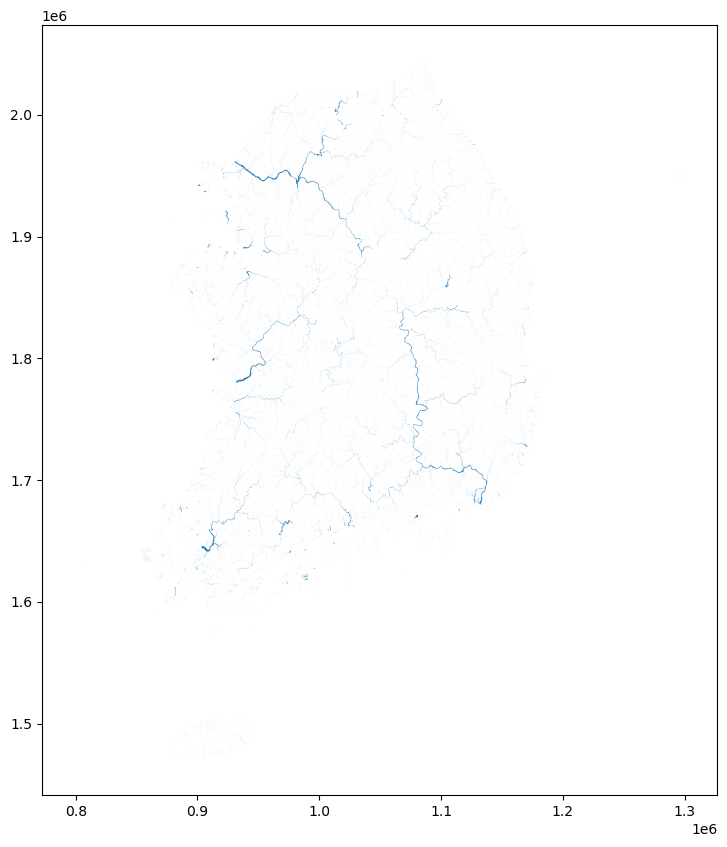

In [1]:
import geopandas as gpd
import os

shp_path = "N3A_E0032111.shp"

print("파일 존재 여부:", os.path.exists(shp_path))

river = gpd.read_file(shp_path)

print(river.head())

print("\n컬럼명:")
print(river.columns)

print("\n좌표계:")
print(river.crs)

print("\n행 개수:")
print(len(river))

print("\nGeometry 타입:")
print(river.geometry.geom_type.value_counts())

river.plot(figsize=(10, 10))

서울과 겹치는 실폭하천 개수: 238


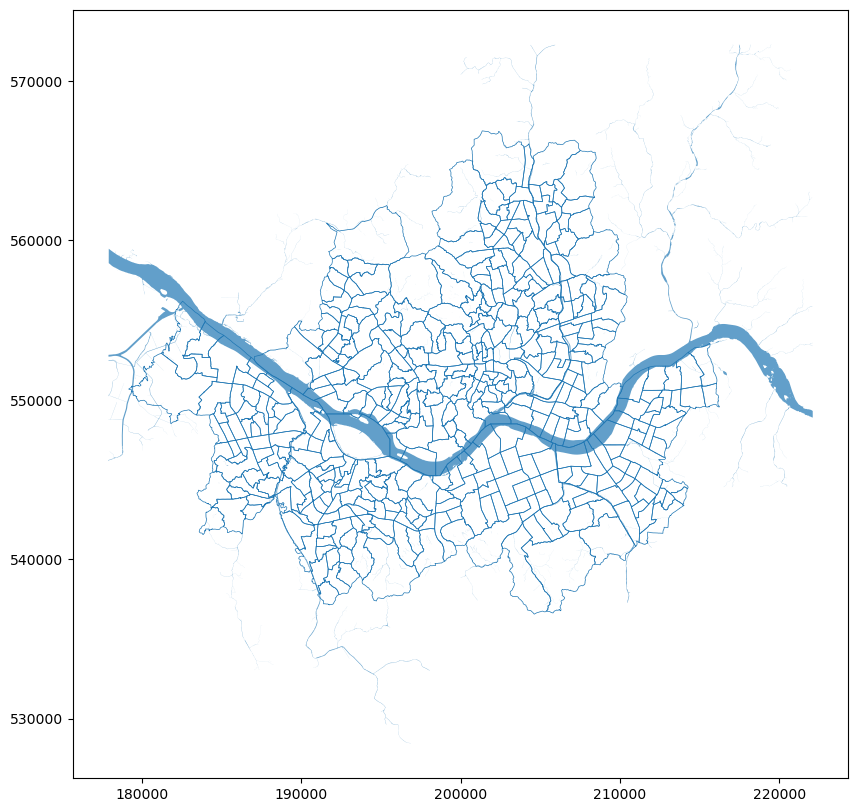

In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt

# 1. 파일 읽기
dong = gpd.read_file("BND_ADM_DONG_PG.shp")
river = gpd.read_file("N3A_E0032111.shp")

# 2. 좌표계 통일
# 행정동은 EPSG:5186, 하천은 EPSG:5179였으므로 5186으로 통일
river = river.to_crs(epsg=5186)

# 3. 서울 행정동만 추출
dong_seoul = dong[dong["ADM_CD"].astype(str).str.startswith("11")].copy()

# 4. 서울 전체 경계 하나로 합치기
seoul_boundary = dong_seoul.geometry.union_all()

# 5. 서울 경계와 겹치는 하천 polygon만 추출
river_seoul = river[river.intersects(seoul_boundary)].copy()

print("서울과 겹치는 실폭하천 개수:", len(river_seoul))

# 6. 시각화
fig, ax = plt.subplots(figsize=(10, 10))
dong_seoul.boundary.plot(ax=ax, linewidth=0.5)
river_seoul.plot(ax=ax, alpha=0.7)
plt.show()

In [3]:
river_seoul["area"] = river_seoul.geometry.area

river_seoul_sorted = river_seoul.sort_values("area", ascending=False)

print(river_seoul_sorted[["UFID", "SCLS", "FMTA", "area"]].head(20))

                                    UFID      SCLS       FMTA          area
22371  100037608075E00310100000000022372  E0032111  R23122372  2.746993e+07
22295  100037705076E00310100000000022296  E0032111  R23122296  2.626205e+07
19805  100037612026E00310100000000019806  E0032111  R23129806  1.251842e+06
22297  100037705012E00310100000000022298  E0032111  R23122298  5.940148e+05
22003  100037709015E00310100000000022004  E0032111  R23122004  5.028644e+05
16532  100037709012E00310100000000016533  E0032111  R23126533  2.307691e+05
16531  100037612007E00310100000000016532  E0032111  R23126532  1.240710e+05
22223  100037705042E00310100000000022224  E0032111  R23122224  9.626833e+04
22141  100037705078E00310100000000022142  E0032111  R23122142  6.204292e+04
16293  100037612018E00310100000000016294  E0032111  R23126294  5.800770e+04
16409  100037608047E00310100000000016410  E0032111  R23126410  2.502240e+04
22330  100037608076E00310100000000022331  E0032111  R23122331  2.455428e+04
22355  10003

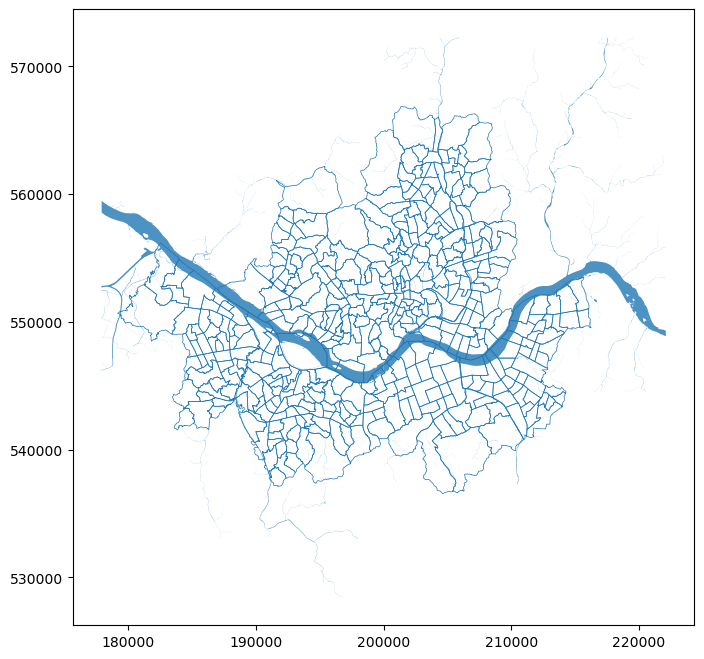

In [4]:
top_rivers = river_seoul_sorted.head(30)

fig, ax = plt.subplots(figsize=(12, 8))
dong_seoul.boundary.plot(ax=ax, linewidth=0.5)
top_rivers.plot(ax=ax, alpha=0.8)
plt.show()

In [5]:
hangang_candidate = river_seoul_sorted.head(30).copy()

hangang_candidate.to_file("hangang_candidate.shp", encoding="utf-8")
hangang_candidate.to_csv("hangang_candidate.csv", index=False, encoding="utf-8-sig")

In [6]:
river_seoul_sorted.head(20)

,UFID,SCLS,FMTA,geometry,area
22371,100037608075E00310100000000022372,E0032111,R23122372,"POLYGON ((200000.001 546872.638, 200000.006 54...",2.746993e+07
22295,100037705076E00310100000000022296,E0032111,R23122296,"POLYGON ((217091.349 572269.234, 217092.346 57...",2.626205e+07
19805,100037612026E00310100000000019806,E0032111,R23129806,"POLYGON ((188555.92 544512.034, 188550.018 544...",1.251842e+06
22297,100037705012E00310100000000022298,E0032111,R23122298,"POLYGON ((204385.08 572252.64, 204395.492 5722...",5.940148e+05
22003,100037709015E00310100000000022004,E0032111,R23122004,"POLYGON ((207418.293 544507.499, 207425.969 54...",5.028644e+05
16532,100037709012E00310100000000016533,E0032111,R23126533,"POLYGON ((206479.232 544506.668, 206478.934 54...",2.307691e+05
16531,100037612007E00310100000000016532,E0032111,R23126532,"POLYGON ((190567.729 544509.525, 190571.478 54...",1.240710e+05
22223,100037705042E00310100000000022224,E0032111,R23122224,"POLYGON ((201273.99 561656.96, 201274.9 561633...",9.626833e+04
22141,100037705078E00310100000000022142,E0032111,R23122142,"POLYGON ((215676.687 552392.111, 215686.095 55...",6.204292e+04
16293,100037612018E00310100000000016294,E0032111,R23126294,"POLYGON ((195471.183 540172.857, 195461.792 54...",5.800770e+04


In [7]:
river_seoul_sorted.head(20)

,UFID,SCLS,FMTA,geometry,area
22371,100037608075E00310100000000022372,E0032111,R23122372,"POLYGON ((200000.001 546872.638, 200000.006 54...",2.746993e+07
22295,100037705076E00310100000000022296,E0032111,R23122296,"POLYGON ((217091.349 572269.234, 217092.346 57...",2.626205e+07
19805,100037612026E00310100000000019806,E0032111,R23129806,"POLYGON ((188555.92 544512.034, 188550.018 544...",1.251842e+06
22297,100037705012E00310100000000022298,E0032111,R23122298,"POLYGON ((204385.08 572252.64, 204395.492 5722...",5.940148e+05
22003,100037709015E00310100000000022004,E0032111,R23122004,"POLYGON ((207418.293 544507.499, 207425.969 54...",5.028644e+05
16532,100037709012E00310100000000016533,E0032111,R23126533,"POLYGON ((206479.232 544506.668, 206478.934 54...",2.307691e+05
16531,100037612007E00310100000000016532,E0032111,R23126532,"POLYGON ((190567.729 544509.525, 190571.478 54...",1.240710e+05
22223,100037705042E00310100000000022224,E0032111,R23122224,"POLYGON ((201273.99 561656.96, 201274.9 561633...",9.626833e+04
22141,100037705078E00310100000000022142,E0032111,R23122142,"POLYGON ((215676.687 552392.111, 215686.095 55...",6.204292e+04
16293,100037612018E00310100000000016294,E0032111,R23126294,"POLYGON ((195471.183 540172.857, 195461.792 54...",5.800770e+04


<Axes: >

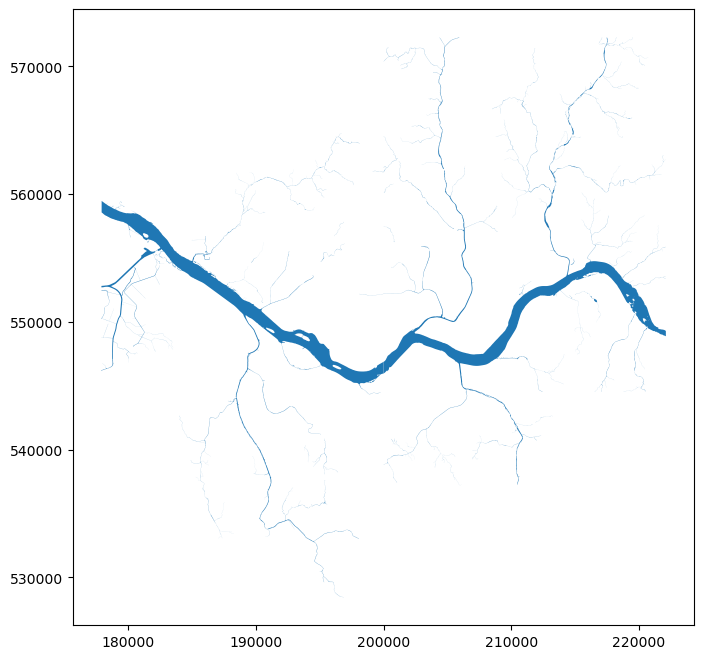

In [8]:
top_rivers = river_seoul_sorted.head(30)

top_rivers.plot(figsize=(12,8))

In [9]:
hangang = river_seoul_sorted.iloc[:12].copy()

<Axes: >

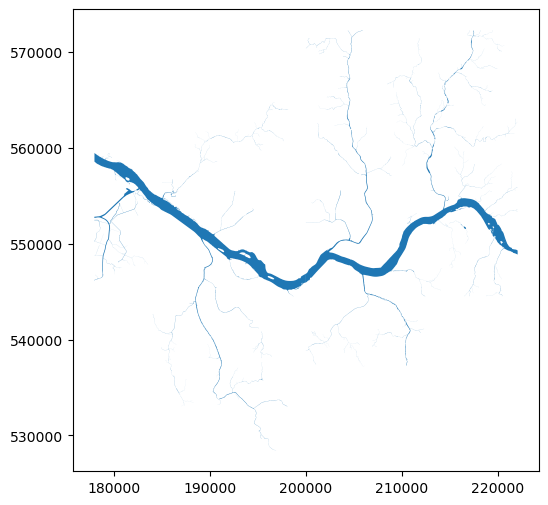

In [10]:
hangang = river_seoul_sorted.iloc[:10].copy()

hangang.plot(figsize=(14,6))

In [11]:
print(len(hangang))

10


In [12]:
hangang_union = hangang.geometry.union_all()

hangang_buffer = hangang_union.buffer(1000)

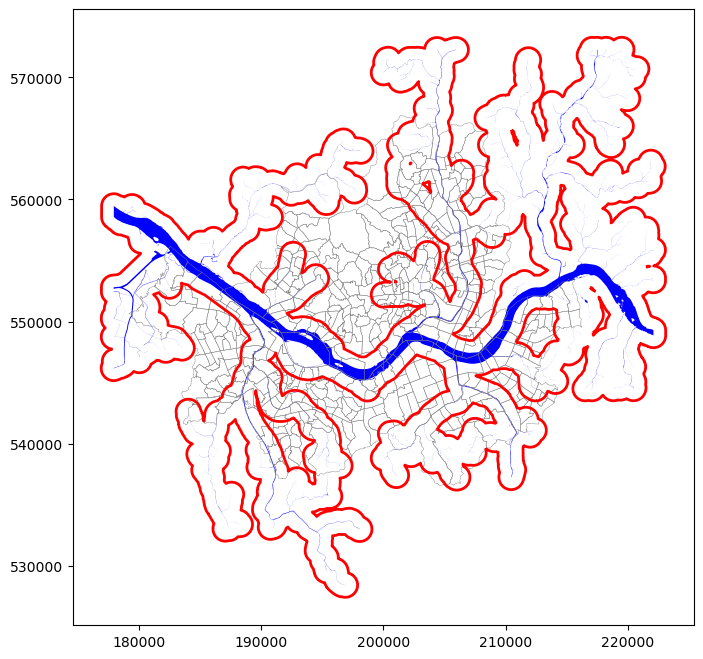

In [13]:
import geopandas as gpd
import matplotlib.pyplot as plt

# 1. 한강 polygon 하나로 합치기
hangang_union = hangang.geometry.union_all()

# 2. 한강 주변 1km buffer 생성
hangang_buffer = hangang_union.buffer(1000)

# 3. buffer를 GeoDataFrame으로 변환
hangang_buffer_gdf = gpd.GeoDataFrame(
    geometry=[hangang_buffer],
    crs=hangang.crs
)

# 4. 시각화
fig, ax = plt.subplots(figsize=(14, 8))

dong_seoul.boundary.plot(ax=ax, linewidth=0.3, color="gray")
hangang.plot(ax=ax, color="blue")
hangang_buffer_gdf.boundary.plot(ax=ax, color="red", linewidth=2)

plt.show()

In [14]:
# 면적 컬럼 생성
river_seoul_sorted["area"] = river_seoul_sorted.geometry.area

# 면적 큰 순서 확인
print(river_seoul_sorted[["UFID", "area"]].head(30))

                                    UFID          area
22371  100037608075E00310100000000022372  2.746993e+07
22295  100037705076E00310100000000022296  2.626205e+07
19805  100037612026E00310100000000019806  1.251842e+06
22297  100037705012E00310100000000022298  5.940148e+05
22003  100037709015E00310100000000022004  5.028644e+05
16532  100037709012E00310100000000016533  2.307691e+05
16531  100037612007E00310100000000016532  1.240710e+05
22223  100037705042E00310100000000022224  9.626833e+04
22141  100037705078E00310100000000022142  6.204292e+04
16293  100037612018E00310100000000016294  5.800770e+04
16409  100037608047E00310100000000016410  2.502240e+04
22330  100037608076E00310100000000022331  2.455428e+04
22355  100037608068E00310100000000022356  2.358936e+04
22225  100037705031E00310100000000022226  1.906604e+04
22163  100037705052E00310100000000022164  1.872432e+04
22237  100037705031E00310100000000022238  1.694632e+04
16530  100037612010E00310100000000016531  1.286790e+04
22367  100

                                    UFID          area
22371  100037608075E00310100000000022372  2.746993e+07


<Axes: >

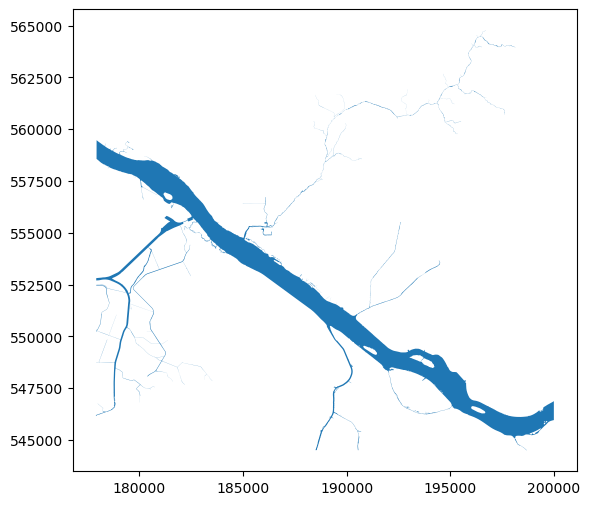

In [15]:
hangang = river_seoul_sorted.iloc[:1].copy()

print(hangang[["UFID", "area"]])

hangang.plot(figsize=(14, 6))

In [16]:
print(hangang.total_bounds)

[177898.00120674 544504.29785    200000.00589145 564773.13196442]


[177898.00120674 544504.29785    222094.86470176 572274.56215461]


<Axes: >

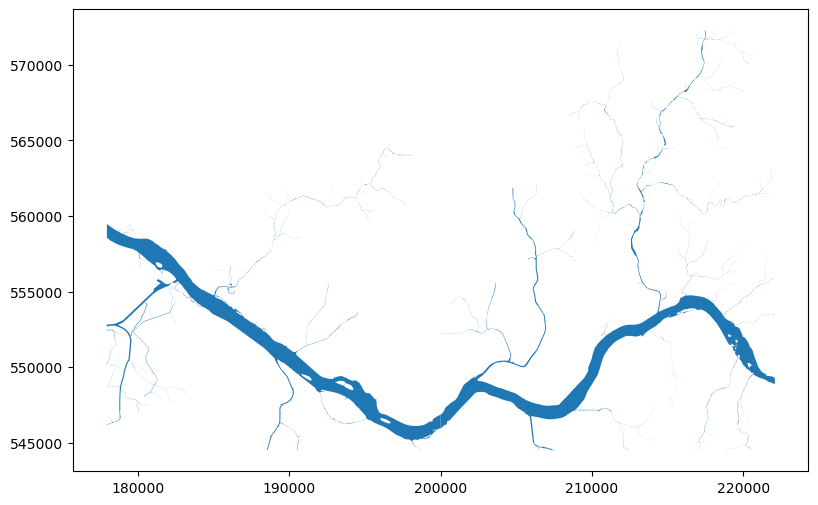

In [17]:
# 깨진 geometry 제거/수정
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

river_seoul["area"] = river_seoul.geometry.area
river_seoul_sorted = river_seoul.sort_values("area", ascending=False).copy()

hangang = river_seoul_sorted.iloc[:2].copy()

print(hangang.total_bounds)
hangang.plot(figsize=(14, 6))

hangang_main 개수: 2
bounds: [177898.00120674 544504.29785    222094.86470176 560000.        ]


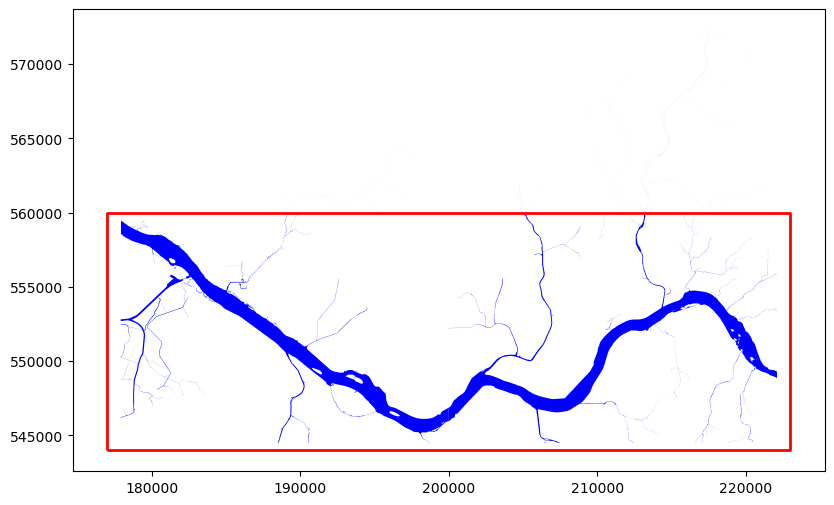

In [18]:
from shapely.geometry import box
import geopandas as gpd
import matplotlib.pyplot as plt

# 한강 본류 corridor
main_corridor = box(
    177000,   # minx
    544000,   # miny
    223000,   # maxx
    560000    # maxy
)

corridor_gdf = gpd.GeoDataFrame(
    geometry=[main_corridor],
    crs=hangang.crs
)

# corridor로 한강 후보 자르기
hangang_main = gpd.overlay(
    hangang,
    corridor_gdf,
    how="intersection"
)

print("hangang_main 개수:", len(hangang_main))
print("bounds:", hangang_main.total_bounds)

# 확인
fig, ax = plt.subplots(figsize=(14, 6))
hangang.plot(ax=ax, color="lightblue", alpha=0.3)
hangang_main.plot(ax=ax, color="blue")
corridor_gdf.boundary.plot(ax=ax, color="red", linewidth=2)
plt.show()

d:\Program\Anaconda\envs\ml\Lib\site-packages\geopandas\plotting.py:962: UserWarning: The GeoSeries you are attempting to plot is composed of empty geometries. Nothing has been displayed.
  return plot_dataframe(data, *args, **kwargs)


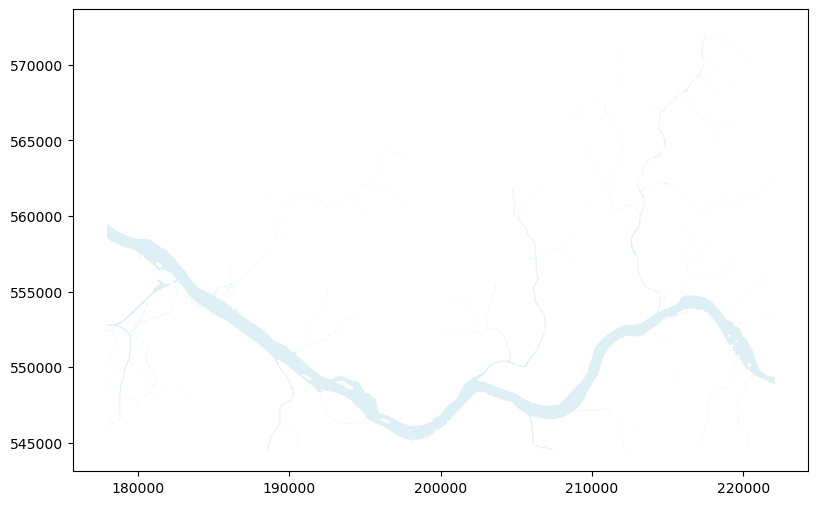

In [19]:
import geopandas as gpd
import matplotlib.pyplot as plt

# 1. 한강 후보 polygon 합치기
hangang_union = hangang.geometry.union_all()

# 2. 지천 제거용 shrink-expand
# 값은 조정 가능: 300, 500, 700, 1000 순서로 테스트
clean_dist = 5000

hangang_main_geom = hangang_union.buffer(-clean_dist).buffer(clean_dist)

# 3. GeoDataFrame으로 변환
hangang_main = gpd.GeoDataFrame(
    geometry=[hangang_main_geom],
    crs=hangang.crs
)

# 4. 비교 시각화
fig, ax = plt.subplots(figsize=(14, 6))

gpd.GeoDataFrame(geometry=[hangang_union], crs=hangang.crs).plot(
    ax=ax, color="lightblue", alpha=0.4
)

hangang_main.plot(
    ax=ax, color="blue"
)

plt.show()

d:\Program\Anaconda\envs\ml\Lib\site-packages\geopandas\plotting.py:962: UserWarning: The GeoSeries you are attempting to plot is composed of empty geometries. Nothing has been displayed.
  return plot_dataframe(data, *args, **kwargs)


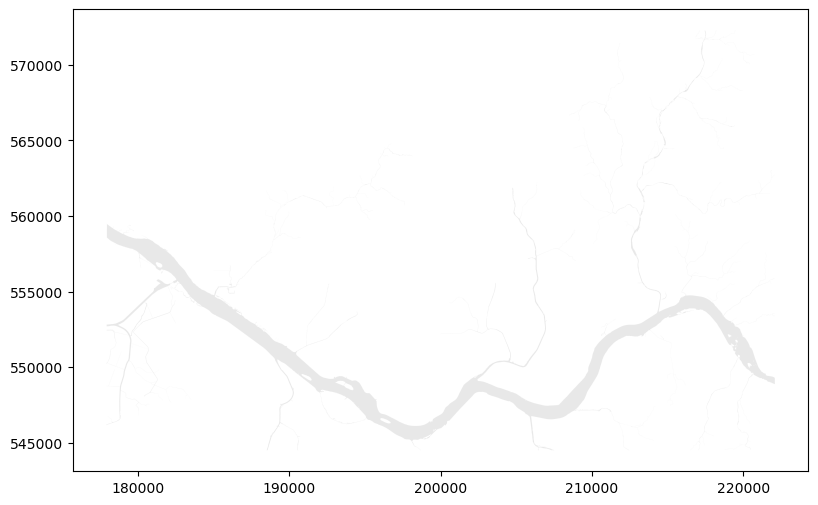

In [20]:
from shapely.geometry import MultiPolygon, Polygon
import geopandas as gpd
import matplotlib.pyplot as plt

# 1. 한강 후보 polygon 합치기
geom = hangang.geometry.union_all()

# 2. 좁은 지천 가지를 끊기 위해 안쪽으로 깎기
# 값 조정 가능: 300, 500, 700, 1000
cut_dist = 1000000000000
eroded = geom.buffer(-cut_dist)

# 3. 여러 덩어리로 분리된 것 중 가장 큰 polygon만 선택
if eroded.geom_type == "Polygon":
    largest = eroded
elif eroded.geom_type == "MultiPolygon":
    largest = max(eroded.geoms, key=lambda p: p.area)
else:
    largest = max(list(eroded.geoms), key=lambda p: p.area)

# 4. 다시 원래 크기만큼 복원
hangang_main_geom = largest.buffer(cut_dist)

# 5. GeoDataFrame 생성
hangang_main = gpd.GeoDataFrame(
    geometry=[hangang_main_geom],
    crs=hangang.crs
)

# 6. 비교 시각화
fig, ax = plt.subplots(figsize=(14, 6))

gpd.GeoDataFrame(geometry=[geom], crs=hangang.crs).plot(
    ax=ax,
    color="lightgray",
    alpha=0.5
)

hangang_main.plot(
    ax=ax,
    color="blue"
)

plt.show()

d:\Program\Anaconda\envs\ml\Lib\site-packages\geopandas\plotting.py:962: UserWarning: The GeoSeries you are attempting to plot is composed of empty geometries. Nothing has been displayed.
  return plot_dataframe(data, *args, **kwargs)
D:\TEMP\ipykernel_19364\695465885.py:12: UserWarning: The GeoSeries you are attempting to plot is composed of empty geometries. Nothing has been displayed.
  hangang_buffer_gdf.boundary.plot(ax=ax, color="red", linewidth=2)


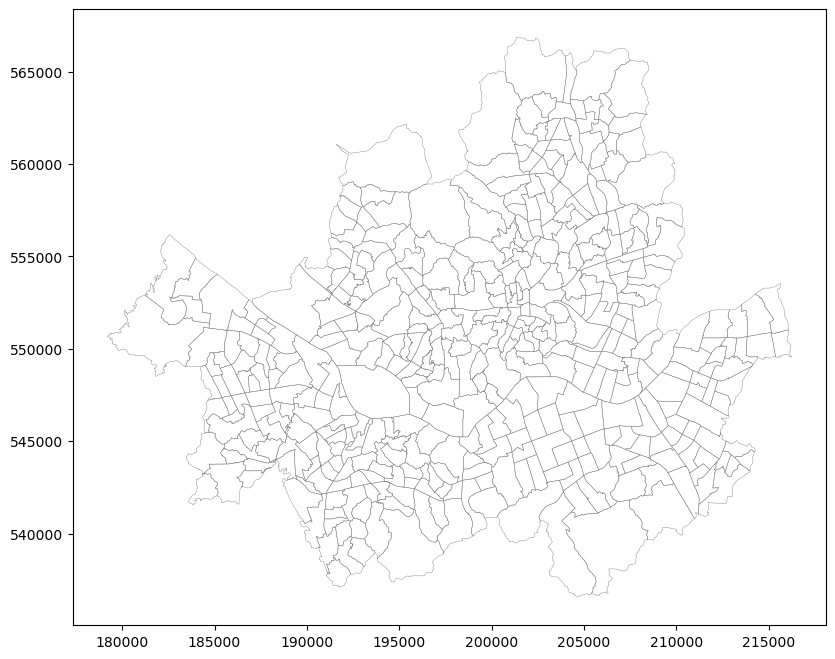

In [21]:
hangang_buffer = hangang_main.geometry.iloc[0].buffer(1000)

hangang_buffer_gdf = gpd.GeoDataFrame(
    geometry=[hangang_buffer],
    crs=hangang.crs
)

fig, ax = plt.subplots(figsize=(14, 8))

dong_seoul.boundary.plot(ax=ax, linewidth=0.3, color="gray")
hangang_main.plot(ax=ax, color="blue")
hangang_buffer_gdf.boundary.plot(ax=ax, color="red", linewidth=2)

plt.show()

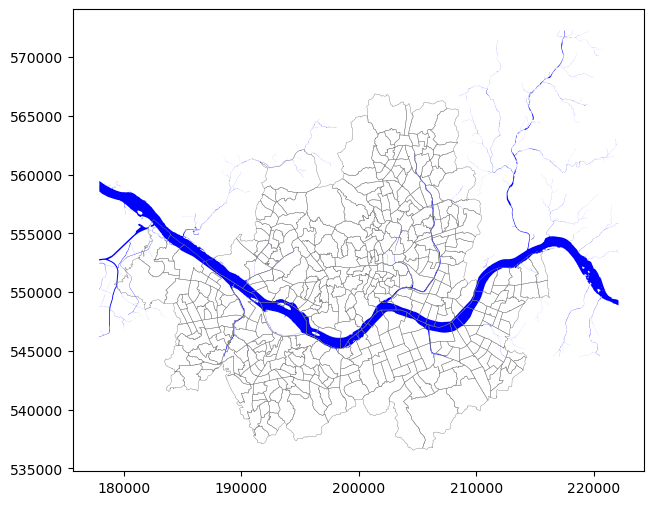

In [22]:
# 상위 2개만 선택
hangang = river_seoul_sorted.iloc[:2].copy()

# 시각화
fig, ax = plt.subplots(figsize=(14,6))

dong_seoul.boundary.plot(
    ax=ax,
    linewidth=0.3,
    color="gray"
)

hangang.plot(
    ax=ax,
    color="blue"
)

plt.show()

선택된 polygon 개수: 0


D:\TEMP\ipykernel_19364\3939408739.py:34: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  hangang_main.plot(ax=ax, color="blue")


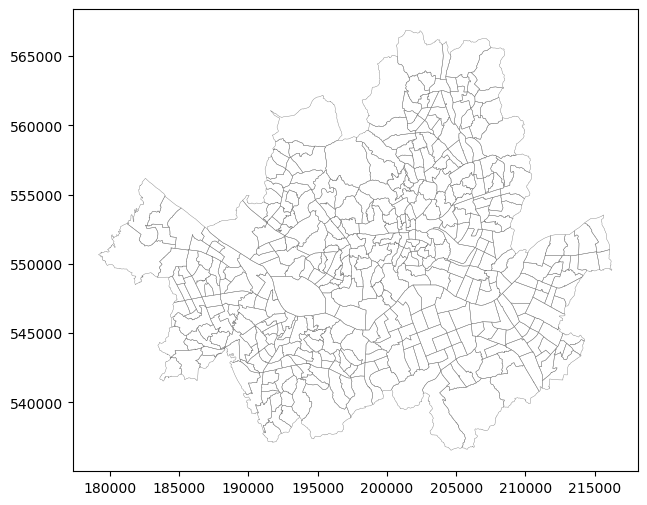

In [23]:
from shapely.geometry import MultiPolygon
import geopandas as gpd
import matplotlib.pyplot as plt

# 1. 서울 하천 전체를 개별 polygon 조각으로 분리
all_polys = []
for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(geom.geoms)

river_parts = gpd.GeoDataFrame(geometry=all_polys, crs=river_seoul.crs)

# 2. 각 조각의 면적 + 가로 길이 계산
river_parts["area"] = river_parts.geometry.area
bounds = river_parts.geometry.bounds
river_parts["width"] = bounds["maxx"] - bounds["minx"]
river_parts["height"] = bounds["maxy"] - bounds["miny"]
river_parts["ew_ratio"] = river_parts["width"] / river_parts["height"]

# 3. 한강 본류 조건 필터링
# 면적 크고, 가로로 길고, 세로로 너무 길지 않은 것
hangang_main = river_parts[
    (river_parts["area"] > 200000) &       # 충분히 큰 것
    (river_parts["ew_ratio"] > 1.5) &      # 가로로 긴 것
    (river_parts["width"] > 3000)          # 최소 3km 이상 가로
].copy()

print("선택된 polygon 개수:", len(hangang_main))

fig, ax = plt.subplots(figsize=(14, 6))
dong_seoul.boundary.plot(ax=ax, linewidth=0.3, color="gray")
hangang_main.plot(ax=ax, color="blue")
plt.show()

In [24]:
# 1. river_seoul 상태 확인
print("river_seoul 개수:", len(river_seoul))
print("river_seoul crs:", river_seoul.crs)

# 2. 개별 분리된 조각 수 확인
print("river_parts 개수:", len(river_parts))

# 3. 면적 분포 확인
print(river_parts["area"].describe())
print("\n상위 20개 면적:")
print(river_parts.sort_values("area", ascending=False)[["area", "width", "height", "ew_ratio"]].head(20))

river_seoul 개수: 238
river_seoul crs: EPSG:5186
river_parts 개수: 238
count    2.380000e+02
mean     2.400894e+05
std      2.458805e+06
min      1.279835e+01
25%      2.625430e+02
50%      8.181163e+02
75%      2.368643e+03
max      2.746993e+07
Name: area, dtype: float64

상위 20개 면적:
             area         width        height   ew_ratio
237  2.746993e+07  22102.004685  20268.834114   1.090443
209  2.626205e+07  22094.864112  27767.914712   0.795698
152  1.251842e+06  14025.491793  16070.036730   0.872773
210  5.940148e+05   5950.397175  10295.609856   0.577955
154  5.028644e+05   5405.258659   7255.572765   0.744980
144  2.307691e+05   6539.397242   7293.450517   0.896612
143  1.240710e+05   4550.054196   3339.447977   1.362517
201  9.626833e+04   4332.147842   5296.179038   0.817976
177  6.204292e+04   2015.803836   2412.275750   0.835644
35   5.800770e+04   1996.195896   2792.721073   0.714785
139  2.502240e+04   2138.570896   1779.810176   1.201572
229  2.455428e+04   2685.674097   

선택된 polygon 개수: 2


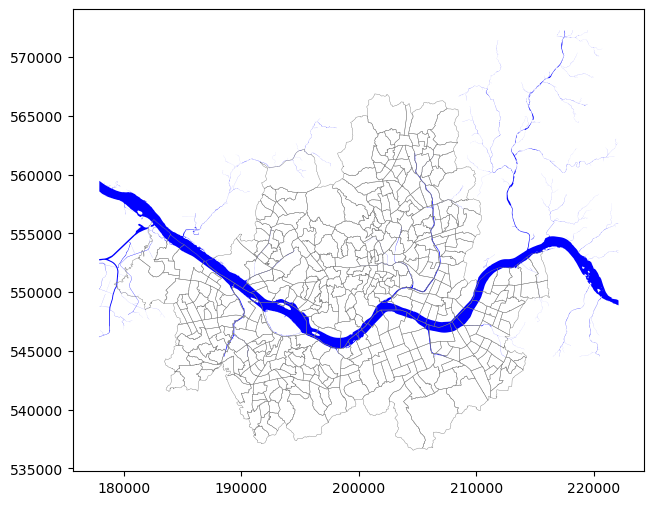

In [25]:
# 면적 기준만으로 한강 본류 선택 (상위 2개)
hangang_main = river_parts[river_parts["area"] > 5000000].copy()

print("선택된 polygon 개수:", len(hangang_main))

# 한강만 시각화
fig, ax = plt.subplots(figsize=(14, 6))
dong_seoul.boundary.plot(ax=ax, linewidth=0.3, color="gray")
hangang_main.plot(ax=ax, color="blue")
plt.show()

분리된 덩어리 수: 1
  0: area=53731979, width=44197


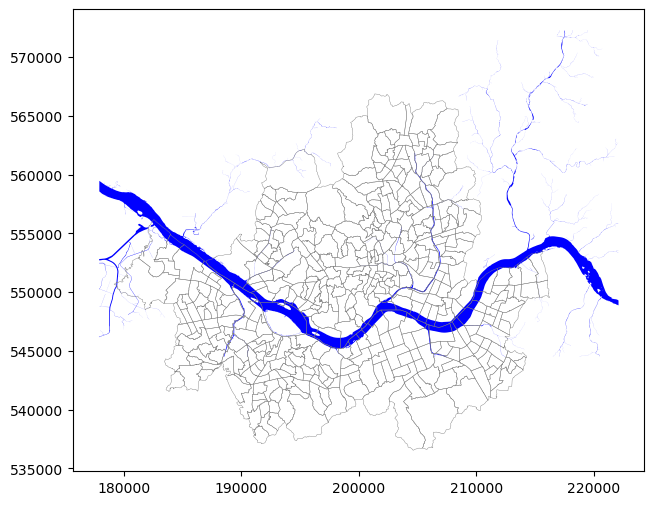

In [26]:
from shapely.geometry import MultiPolygon, Polygon

# 1. 상위 2개 polygon 합치기
merged = hangang_main.geometry.union_all()

# 2. 합친 결과를 개별 덩어리로 분리
if merged.geom_type == "Polygon":
    parts = [merged]
elif merged.geom_type == "MultiPolygon":
    parts = list(merged.geoms)

print(f"분리된 덩어리 수: {len(parts)}")
for i, p in enumerate(parts):
    print(f"  {i}: area={p.area:.0f}, width={p.bounds[2]-p.bounds[0]:.0f}")

# 3. 가장 큰 덩어리 1개만 선택
hangang_body = max(parts, key=lambda p: p.area)

hangang_gdf = gpd.GeoDataFrame(geometry=[hangang_body], crs=hangang_main.crs)

# 확인
fig, ax = plt.subplots(figsize=(14, 6))
dong_seoul.boundary.plot(ax=ax, linewidth=0.3, color="gray")
hangang_gdf.plot(ax=ax, color="blue")
plt.show()

d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 54620 (\N{HANGUL SYLLABLE HAN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 48376 (\N{HANGUL SYLLABLE BON}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 47448 (\N{HANGUL SYLLABLE RYU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 47564 (\N{HANGUL SYLLABLE MAN}) missing from font(s) DejaVu Sans.
  fig.canvas.pri

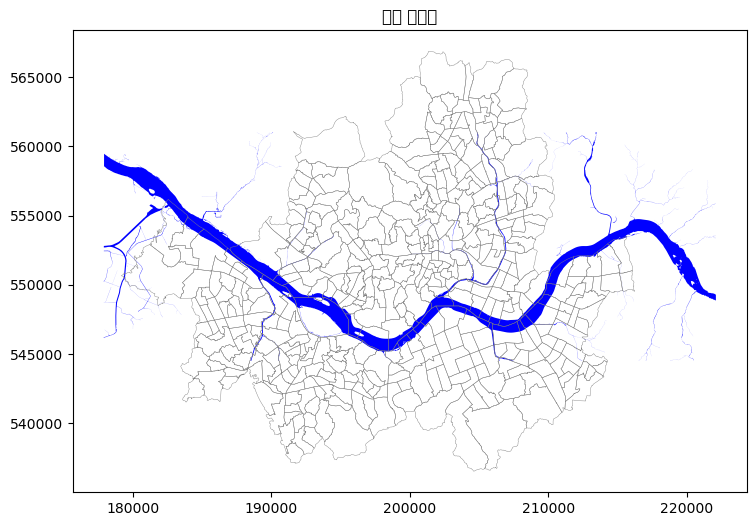

In [27]:
from shapely.geometry import Polygon
import numpy as np

# 한강 본류 polygon의 좌표를 직접 필터링
# 각 꼭짓점 중 y > 560000 으로 튀어나간 부분을 clip으로 제거

from shapely.geometry import box

# 한강 본류가 지나는 범위만 남기는 clip box
# x: 전체, y: 544000~561000 (본류 범위)
clip_box = box(176000, 543000, 224000, 561000)

clip_gdf = gpd.GeoDataFrame(geometry=[clip_box], crs=hangang_gdf.crs)

hangang_clipped = gpd.overlay(hangang_gdf, clip_gdf, how="intersection")

# clip 후에도 MultiPolygon이면 가장 큰 것만
geom = hangang_clipped.geometry.union_all()

if geom.geom_type == "MultiPolygon":
    geom = max(geom.geoms, key=lambda p: p.area)

hangang_final = gpd.GeoDataFrame(geometry=[geom], crs=hangang_gdf.crs)

# 확인
fig, ax = plt.subplots(figsize=(14, 6))
dong_seoul.boundary.plot(ax=ax, linewidth=0.3, color="gray")
hangang_final.plot(ax=ax, color="blue")
plt.title("한강 본류만")
plt.show()

전체 좌표 수: 108625
y 최대: 572275
y 최소: 544504

y > 561000 인 좌표 개수: 39210
해당 index 범위: [16283 16284 16285 16286 16287] ... [82938 82939 82940 82941 82942]


d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 54620 (\N{HANGUL SYLLABLE HAN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 51340 (\N{HANGUL SYLLABLE JWA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 54364 (\N{HANGUL SYLLABLE PYO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 49692 (\N{HANGUL SYLLABLE SUN}) missing from font(s) DejaVu Sans.
  fig.canvas.pri

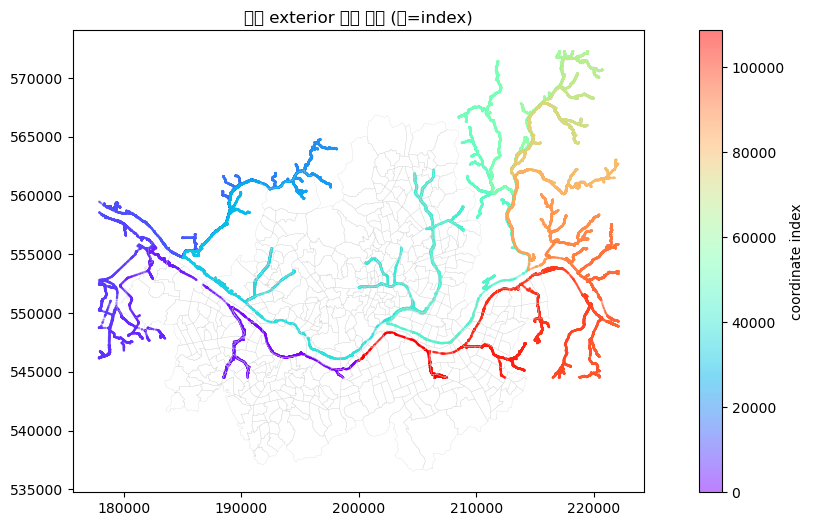

In [28]:
import matplotlib.pyplot as plt
import numpy as np

# 본류 polygon exterior 좌표 추출
coords = np.array(hangang_body.exterior.coords)

print(f"전체 좌표 수: {len(coords)}")
print(f"y 최대: {coords[:,1].max():.0f}")
print(f"y 최소: {coords[:,1].min():.0f}")

# y 좌표가 튀는 지점 찾기 (y > 561000 인 좌표 index)
outlier_idx = np.where(coords[:,1] > 561000)[0]
print(f"\ny > 561000 인 좌표 개수: {len(outlier_idx)}")
print("해당 index 범위:", outlier_idx[:5], "...", outlier_idx[-5:] if len(outlier_idx) > 5 else "")

# exterior 좌표 경로 시각화 (index 색상으로)
fig, ax = plt.subplots(figsize=(14, 6))
sc = ax.scatter(coords[:,0], coords[:,1], c=range(len(coords)), 
                cmap="rainbow", s=0.5, alpha=0.5)
plt.colorbar(sc, label="coordinate index")
dong_seoul.boundary.plot(ax=ax, linewidth=0.2, color="lightgray")
plt.title("한강 exterior 좌표 순서 (색=index)")
plt.show()

dist=50: 최대 덩어리 면적=39426686
dist=100: 최대 덩어리 면적=32551499
dist=150: 최대 덩어리 면적=13843389
dist=200: 최대 덩어리 면적=10272075
dist=250: 최대 덩어리 면적=7928340
dist=300: 최대 덩어리 면적=4563736


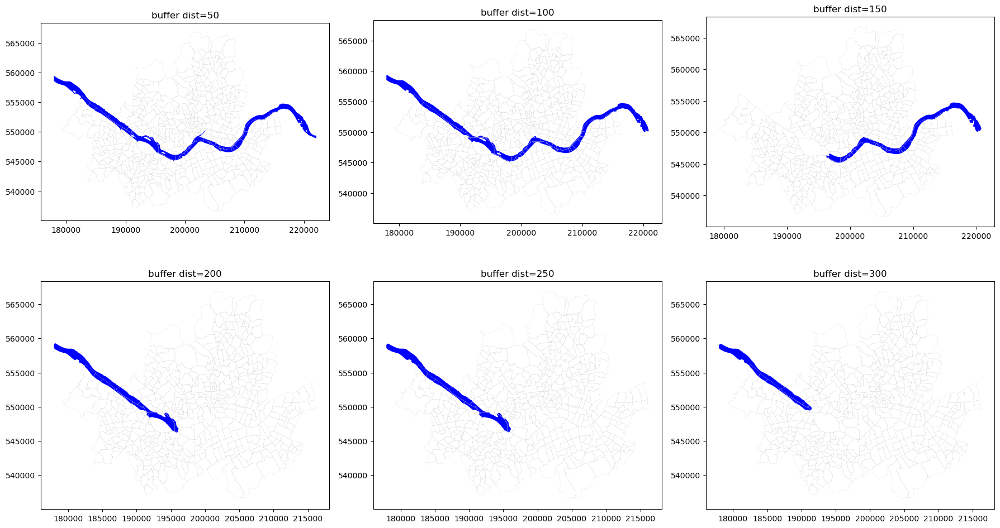

In [29]:
from shapely.geometry import MultiPolygon
import geopandas as gpd
import matplotlib.pyplot as plt

results = {}

for dist in [50, 100, 150, 200, 250, 300]:
    eroded = hangang_body.buffer(-dist)
    
    if eroded.is_empty:
        print(f"dist={dist}: 완전히 사라짐")
        continue
    
    if eroded.geom_type == "Polygon":
        largest = eroded
    else:
        largest = max(eroded.geoms, key=lambda p: p.area)
    
    restored = largest.buffer(dist)
    results[dist] = restored
    print(f"dist={dist}: 최대 덩어리 면적={largest.area:.0f}")

# 각 dist 결과 시각화 (2x3 grid)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for ax, (dist, geom) in zip(axes.flatten(), results.items()):
    gdf = gpd.GeoDataFrame(geometry=[geom], crs=hangang_gdf.crs)
    dong_seoul.boundary.plot(ax=ax, linewidth=0.2, color="lightgray")
    gdf.plot(ax=ax, color="blue")
    ax.set_title(f"buffer dist={dist}")

plt.tight_layout()
plt.show()

행정동 개수: 95
['약수동', '용산2가동', '원효로2동', '용문동', '이촌1동', '이촌2동', '이태원1동', '서빙고동', '보광동', '원효로1동', '한강로동', '한남동', '응봉동', '금호1가동', '금호4가동', '성수1가1동', '성수1가2동', '성수2가1동', '성수2가3동', '금호2·3가동', '옥수동', '구의1동', '구의2동', '구의3동', '광장동', '자양1동', '자양2동', '자양3동', '자양4동', '용강동', '대흥동', '염리동', '신수동', '서교동', '합정동', '망원1동', '망원2동', '성산2동', '상암동', '도화동', '서강동', '아현동', '목2동', '목3동', '목5동', '염창동', '등촌1동', '등촌2동', '등촌3동', '가양2동', '가양3동', '방화2동', '가양1동', '방화3동', '여의동', '당산2동', '양평2동', '영등포동', '노량진2동', '상도1동', '상도2동', '흑석동', '노량진1동', '사당2동', '잠원동', '반포본동', '반포1동', '반포2동', '반포3동', '반포4동', '방배본동', '신사동', '논현1동', '논현2동', '삼성1동', '삼성2동', '압구정동', '청담동', '풍납1동', '풍납2동', '잠실본동', '잠실4동', '잠실6동', '잠실7동', '잠실2동', '잠실3동', '고덕1동', '고덕2동', '암사2동', '암사3동', '성내1동', '성내2동', '암사1동', '천호2동', '강일동']


D:\TEMP\ipykernel_19364\4018690340.py:25: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 54620 (\N{HANGUL SYLLABLE HAN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 45236 (\N{HANGUL SYLLABLE NAE}) missing fro

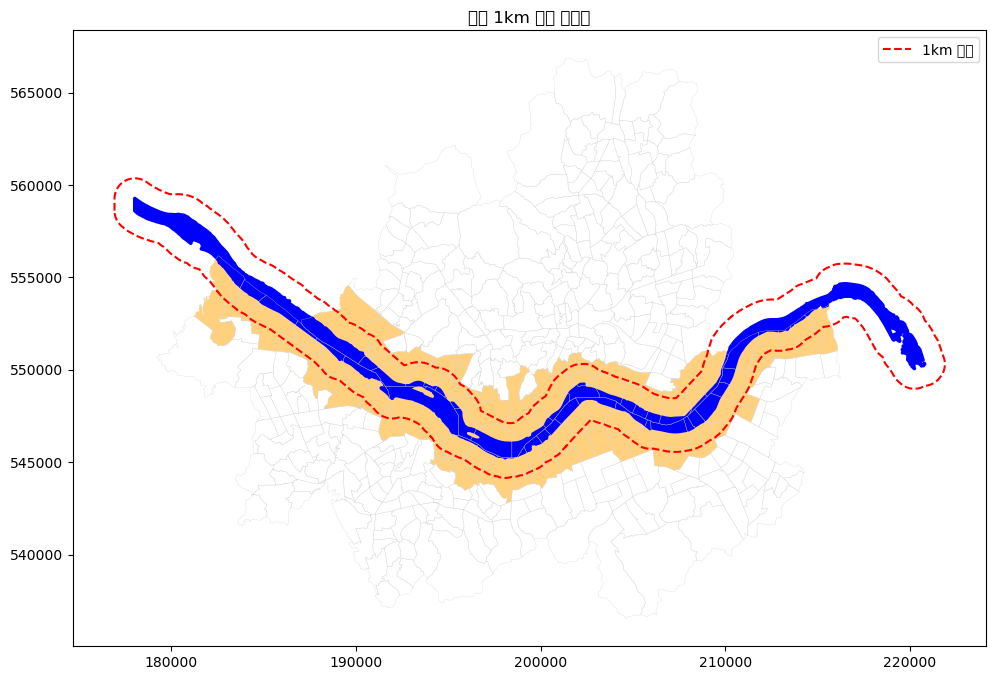

저장 완료


In [30]:
# dist=100으로 확정
dist = 100
eroded = hangang_body.buffer(-dist)
largest = max(eroded.geoms, key=lambda p: p.area) if eroded.geom_type == "MultiPolygon" else eroded
hangang_final_geom = largest.buffer(dist)

hangang_final = gpd.GeoDataFrame(geometry=[hangang_final_geom], crs=hangang_gdf.crs)

# 한강 1km 버퍼
hangang_buffer = hangang_final_geom.buffer(1000)
hangang_buffer_gdf = gpd.GeoDataFrame(geometry=[hangang_buffer], crs=hangang_final.crs)

# 한강 1km 이내 행정동 추출
hangang_1km_dong = dong_seoul[dong_seoul.intersects(hangang_buffer)].copy()

print("행정동 개수:", len(hangang_1km_dong))
print(hangang_1km_dong["ADM_NM"].tolist())

# 최종 시각화
fig, ax = plt.subplots(figsize=(14, 8))
dong_seoul.boundary.plot(ax=ax, linewidth=0.2, color="lightgray")
hangang_1km_dong.plot(ax=ax, color="orange", alpha=0.5, label="한강 1km 행정동")
hangang_final.plot(ax=ax, color="blue", label="한강 본류")
hangang_buffer_gdf.boundary.plot(ax=ax, color="red", linewidth=1.5, linestyle="--", label="1km 버퍼")
plt.legend()
plt.title("한강 1km 이내 행정동")
plt.show()

# 저장
hangang_1km_dong.to_csv("hangang_1km_dong.csv", index=False, encoding="utf-8-sig")
print("저장 완료")

D:\TEMP\ipykernel_19364\2367527451.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 49436 (\N{HANGUL SYLLABLE SEO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 50872 (\N{HANGUL SYLLABLE UL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program\Anaconda\envs\ml\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 49900 (\N{HANGUL SYLLABLE SIM}) missing from 

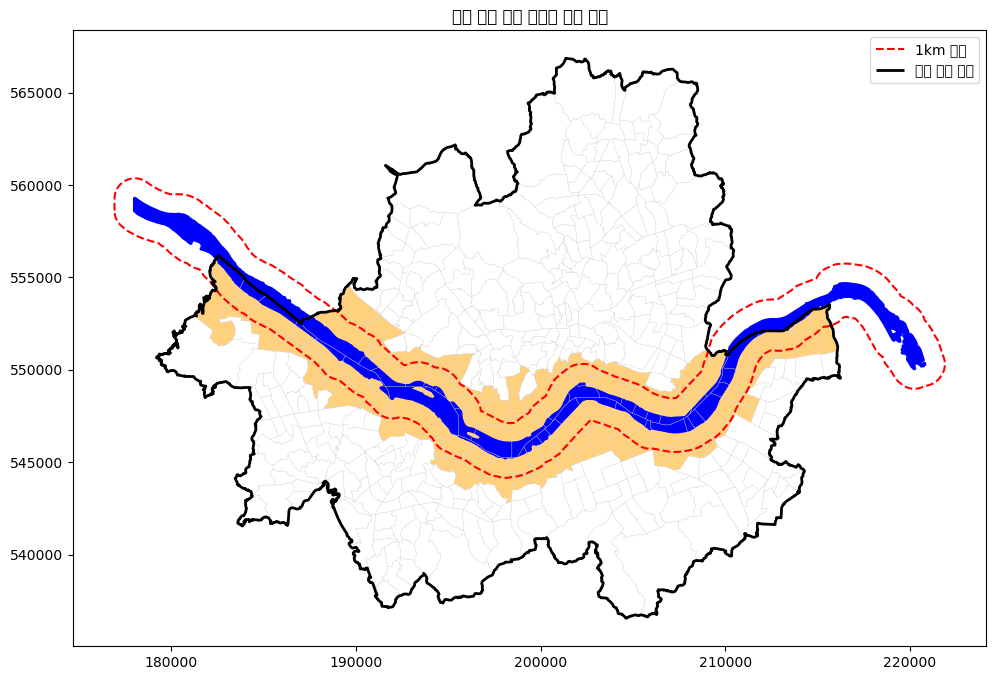

In [31]:
# 서울 도심 외곽 경계선을 라인으로 추가 그리기
seoul_boundary_line = gpd.GeoDataFrame(geometry=[seoul_boundary.boundary], crs=hangang_gdf.crs)

fig, ax = plt.subplots(figsize=(14, 8))
dong_seoul.boundary.plot(ax=ax, linewidth=0.2, color="lightgray")
hangang_1km_dong.plot(ax=ax, color="orange", alpha=0.5, label="한강 1km 행정동")
hangang_final.plot(ax=ax, color="blue", label="한강 본류")
hangang_buffer_gdf.boundary.plot(ax=ax, color="red", linewidth=1.5, linestyle="--", label="1km 버퍼")
seoul_boundary_line.plot(ax=ax, color="black", linewidth=2, label="서울 도심 외곽")

ax.legend()
plt.title("서울 도심 외곽 라인과 한강 버퍼")
plt.show()

In [32]:
import pandas as pd

# 엑셀 파일 읽기 (파일 경로를 적절히 수정하세요)
df_subway = pd.read_excel('서울시 역사마스터 정보.xlsx')

print("지하철 데이터 컬럼:", df_subway.columns)
print(df_subway.head())

# GeoDataFrame 생성 (좌표 컬럼명을 확인하고 수정)
gdf_subway = gpd.GeoDataFrame(df_subway, geometry=gpd.points_from_xy(df_subway['경도'], df_subway['위도']), crs='EPSG:4326')

# CRS 맞추기
gdf_subway = gdf_subway.to_crs(hangang_buffer_gdf.crs)

# 한강 1km 버퍼 내 지하철 역 추출
subway_within_1km = gdf_subway[gdf_subway.within(hangang_buffer_gdf.union_all())]

print("한강 버퍼 CRS:", hangang_buffer_gdf.crs)
print("지하철 CRS:", gdf_subway.crs)
print("추출된 역 개수:", len(subway_within_1km))

# 결과 출력
print(subway_within_1km)

지하철 데이터 컬럼: Index(['역사_ID', '역사명', '호선', '위도', '경도'], dtype='object')
   역사_ID 역사명          호선        위도         경도
0   9010  동탄  수도권 광역급행철도  37.20034  127.09569
1   9009  구성  수도권 광역급행철도  37.29913  127.10389
2   9008  성남  수도권 광역급행철도  37.39467  127.12058
3   9007  수서  수도권 광역급행철도  37.48637  127.10161
4   9006  삼성  수도권 광역급행철도  37.50887  127.06324
한강 버퍼 CRS: EPSG:5186
지하철 CRS: EPSG:5186
추출된 역 개수: 57
     역사_ID          역사명         호선         위도          경도  \
101   4304           신사  신분당선(연장2)  37.516334  127.020114   
124   4130        종합운동장    9호선(연장)  37.511426  127.076275   
125   4129          봉은사    9호선(연장)  37.514219  127.060245   
131   4123        고속터미널        9호선  37.505980  127.004403   
132   4122          신반포        9호선  37.503415  126.995925   
133   4121          구반포        9호선  37.501364  126.987332   
134   4120      동작(현충원)        9호선  37.502878  126.978153   
135   4119    흑석(중앙대입구)        9호선  37.508770  126.963708   
136   4118           노들        9호선  37.512887  126.9

서울시내 한강 1km 내 지하철 역 개수: 54


D:\TEMP\ipykernel_19364\1045980019.py:34: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


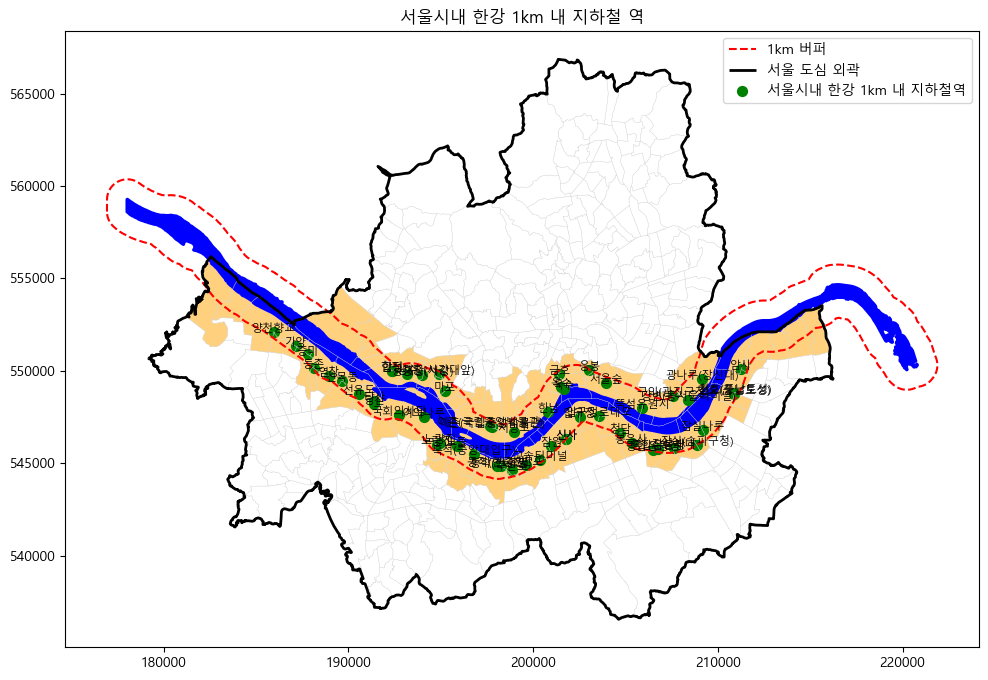

서울시내 한강 주변 1km 이내 지하철 역 목록:
             역사명         호선                       geometry
101           신사  신분당선(연장2)  POINT (201778.202 546317.178)
124        종합운동장    9호선(연장)  POINT (206743.623 545774.996)
125          봉은사    9호선(연장)  POINT (205326.181 546083.955)
131        고속터미널        9호선  POINT (200389.306 545167.835)
132          신반포        9호선  POINT (199639.683 544883.152)
133          구반포        9호선  POINT (198879.847 544655.585)
134      동작(현충원)        9호선  POINT (198068.243 544823.768)
135    흑석(중앙대입구)        9호선  POINT (196791.239 545478.099)
136           노들        9호선  POINT (195864.345 545935.443)
137          노량진        9호선  POINT (194784.282 546007.859)
140        국회의사당        9호선  POINT (192740.694 547626.591)
141           당산        9호선  POINT (191409.672 548216.206)
142          선유도        9호선  POINT (190589.675 548729.192)
143          신목동        9호선  POINT (189667.403 549424.739)
144           염창        9호선  POINT (188946.316 549720.785)
145           등촌        9호선 

In [33]:
# 한글 폰트 설정
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows용 한글 폰트
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 깨짐 방지

# 서울시내 지하철 역만 필터링
subway_seoul = subway_within_1km[subway_within_1km.intersects(seoul_boundary)].copy()

print("서울시내 한강 1km 내 지하철 역 개수:", len(subway_seoul))

# 한강 1km 내 지하철 역 지도에 표시
if len(subway_seoul) == 0:
    print("서울시내 한강 1km 내에 지하철 역이 없습니다.")
else:
    fig, ax = plt.subplots(figsize=(14, 8))
    dong_seoul.boundary.plot(ax=ax, linewidth=0.2, color="lightgray")
    hangang_1km_dong.plot(ax=ax, color="orange", alpha=0.5, label="한강 1km 행정동")
    hangang_final.plot(ax=ax, color="blue", label="한강 본류")
    hangang_buffer_gdf.boundary.plot(ax=ax, color="red", linewidth=1.5, linestyle="--", label="1km 버퍼")
    seoul_boundary_line.plot(ax=ax, color="black", linewidth=2, label="서울 도심 외곽")

    # 지하철 역 점 찍기
    try:
        subway_seoul.plot(ax=ax, color="green", markersize=50, marker="o", label="서울시내 한강 1km 내 지하철역")
    except ValueError:
        # aspect 에러 시 equal로 설정
        ax.set_aspect('equal')
        subway_seoul.plot(ax=ax, color="green", markersize=50, marker="o", label="서울시내 한강 1km 내 지하철역")

    # 역 이름 표시
    for idx, row in subway_seoul.iterrows():
        ax.annotate(row['역사명'], (row.geometry.x, row.geometry.y), fontsize=8, ha='center')

    ax.legend()
    plt.title("서울시내 한강 1km 내 지하철 역")
    plt.show()

# 해당 지하철 역 목록 출력
print("서울시내 한강 주변 1km 이내 지하철 역 목록:")
if len(subway_seoul) > 0:
    print(subway_seoul[['역사명', '호선', 'geometry']])
else:
    print("없음")

In [34]:
# 역사명별로 그룹화하여 호선 목록 생성
subway_grouped = subway_seoul.groupby('역사명')['호선'].apply(list).reset_index()

# 호선 수 추가
subway_grouped['호선수'] = subway_grouped['호선'].apply(len)

# 환승역 (호선수 > 1) 정리
transfer_stations = subway_grouped[subway_grouped['호선수'] > 1].copy()

print("총 역사 수 (중복 제거):", len(subway_grouped))
print("환승역 수:", len(transfer_stations))

# 엑셀로 저장
subway_grouped.to_excel('한강_1km_지하철역_그룹화.xlsx', index=False, engine='openpyxl')
transfer_stations.to_excel('한강_1km_환승역.xlsx', index=False, engine='openpyxl')

print("파일 저장 완료: 한강_1km_지하철역_그룹화.xlsx, 한강_1km_환승역.xlsx")

# 결과 출력
print("\n역사명별 호선 목록:")
print(subway_grouped)

print("\n환승역 목록:")
print(transfer_stations)

총 역사 수 (중복 제거): 45
환승역 수: 9
파일 저장 완료: 한강_1km_지하철역_그룹화.xlsx, 한강_1km_환승역.xlsx

역사명별 호선 목록:
            역사명                호선  호선수
0            가양             [9호선]    1
1    강변(동서울터미널)             [2호선]    1
2         고속터미널             [9호선]    1
3      광나루(장신대)             [5호선]    1
4       광흥창(서강)             [6호선]    1
5           구반포             [9호선]    1
6      구의(광진구청)             [2호선]    1
7         국회의사당             [9호선]    1
8            금호             [3호선]    1
9            노들             [9호선]    1
10          노량진        [9호선, 경부선]    2
11           당산        [9호선, 2호선]    2
12     대흥(서강대앞)             [6호선]    1
13      동작(현충원)        [9호선, 4호선]    2
14           등촌             [9호선]    1
15        뚝섬유원지             [7호선]    1
16           마포             [5호선]    1
17          봉은사         [9호선(연장)]    1
18           상수             [6호선]    1
19          서빙고             [경원선]    1
20          서울숲             [분당선]    1
21          선유도             [9호선]    1
22          신목

환승역: 18개
일반역: 36개
36 [0.9422206  0.85730716]
49 [ 0.35767901 -0.18418768]


Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.
D:\TEMP\ipykernel_19364\1741469328.py:71: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc='upper left', fontsize=11, framealpha=0.95)


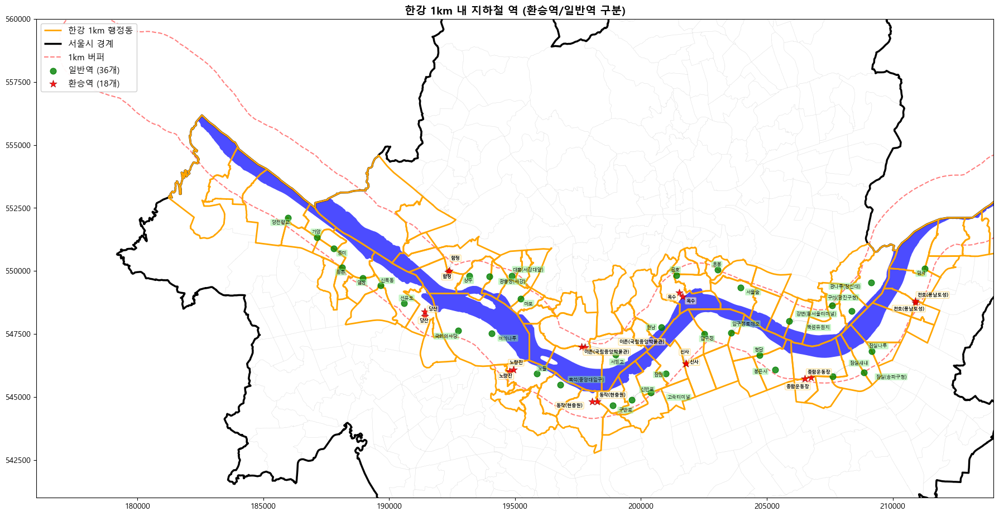

지도 표시 완료!


In [35]:
# 환승역과 일반역 분류
transfer_station_names = set(transfer_stations['역사명'])

# subway_seoul을 환승역과 일반역으로 분류
subway_transfer = subway_seoul[subway_seoul['역사명'].isin(transfer_station_names)].copy()
subway_normal = subway_seoul[~subway_seoul['역사명'].isin(transfer_station_names)].copy()

print(f"환승역: {len(subway_transfer)}개")
print(f"일반역: {len(subway_normal)}개")

# 서울 밖 한강 자르기 (서울 경계로 클립)
hangang_final_seoul = gpd.overlay(
    hangang_final,
    gpd.GeoDataFrame(geometry=[seoul_boundary], crs=hangang_final.crs),
    how='intersection'
)

# 색상별 지도 그리기
fig, ax = plt.subplots(figsize=(18, 12))

# 기본 배경 - 서울 전체 행정동 경계 (라이트 그레이)
dong_seoul.boundary.plot(ax=ax, linewidth=0.3, color="lightgray", alpha=0.5)

# 한강 주변 1km 행정동 - 강조 표시 (오렌지 색상 유지, 아웃라인 강조)
hangang_1km_dong.boundary.plot(ax=ax, linewidth=2, color="orange", label="한강 1km 행정동", linestyle='-', zorder=3)

# 서울 경계선 (검은색 아웃라인)
seoul_boundary_line.plot(ax=ax, color="black", linewidth=2.5, label="서울시 경계", zorder=2)

# 한강 본류 (서울 내만) - 파란색
hangang_final_seoul.plot(ax=ax, color="blue", alpha=0.7, label="한강 본류", zorder=1)

# 한강 1km 버퍼 (흐릿한 표시)
hangang_buffer_gdf.boundary.plot(ax=ax, color="red", linewidth=1.5, linestyle="--", label="1km 버퍼", alpha=0.5, zorder=1)

# 일반역 표시 (녹색)
if len(subway_normal) > 0:
    subway_normal.plot(ax=ax, color="green", markersize=60, marker="o", label=f"일반역 ({len(subway_normal)}개)", alpha=0.8, zorder=4)

# 환승역 표시 (빨간색, 크기 더 큼)
if len(subway_transfer) > 0:
    subway_transfer.plot(ax=ax, color="red", markersize=100, marker="*", label=f"환승역 ({len(subway_transfer)}개)", alpha=0.9, edgecolor="darkred", linewidth=0.5, zorder=5)

# 텍스트 배치를 위한 어노테이션 정보 수집
texts = []

# 일반역 이름 표시
for idx, row in subway_normal.iterrows():
    text = ax.text(row.geometry.x, row.geometry.y, row['역사명'], 
                   fontsize=6, ha='center', va='center',
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='lightgreen', alpha=0.5, edgecolor='none'),
                   zorder=6)
    texts.append(text)

# 환승역 이름 표시
for idx, row in subway_transfer.iterrows():
    text = ax.text(row.geometry.x, row.geometry.y, row['역사명'], 
                   fontsize=6, ha='center', va='center', fontweight='bold',
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='lightyellow', alpha=0.6, edgecolor='orange', linewidth=0.5),
                   zorder=6)
    texts.append(text)

# adjustText를 사용하여 겹치는 텍스트 정렬 (설치 확인)
try:
    from adjustText import adjust_text
    adjust_text(texts, arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.2', color='gray', lw=0.5, alpha=0.5),
                ax=ax, expand_points=(1.2, 1.2))
except ImportError:
    print("adjustText 라이브러리가 없어 기본 배치로 표시합니다.")

ax.legend(loc='upper left', fontsize=11, framealpha=0.95)
ax.set_xlim([176000, 214000])
ax.set_ylim([541000, 560000])
plt.title("한강 1km 내 지하철 역 (환승역/일반역 구분)", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("지도 표시 완료!")

In [36]:
# adjustText 라이브러리 설치 및 재실행
import subprocess
import sys

# adjustText 설치
subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "adjustText"])

print("adjustText 설치 완료")

adjustText 설치 완료


환승역: 18개
일반역: 36개
36 [-0.87353146 -0.49614195]
49 [0.96236614 0.6952902 ]


D:\TEMP\ipykernel_19364\1741469328.py:71: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc='upper left', fontsize=11, framealpha=0.95)


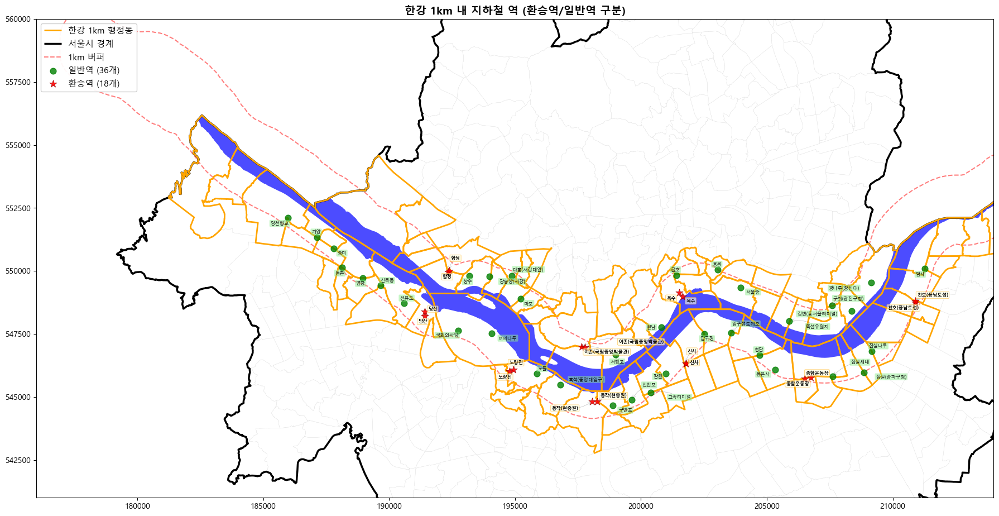

지도 표시 완료!


In [37]:
# 환승역과 일반역 분류
transfer_station_names = set(transfer_stations['역사명'])

# subway_seoul을 환승역과 일반역으로 분류
subway_transfer = subway_seoul[subway_seoul['역사명'].isin(transfer_station_names)].copy()
subway_normal = subway_seoul[~subway_seoul['역사명'].isin(transfer_station_names)].copy()

print(f"환승역: {len(subway_transfer)}개")
print(f"일반역: {len(subway_normal)}개")

# 서울 밖 한강 자르기 (서울 경계로 클립)
hangang_final_seoul = gpd.overlay(
    hangang_final,
    gpd.GeoDataFrame(geometry=[seoul_boundary], crs=hangang_final.crs),
    how='intersection'
)

# 색상별 지도 그리기
fig, ax = plt.subplots(figsize=(18, 12))

# 기본 배경 - 서울 전체 행정동 경계 (라이트 그레이)
dong_seoul.boundary.plot(ax=ax, linewidth=0.3, color="lightgray", alpha=0.5)

# 한강 주변 1km 행정동 - 강조 표시 (오렌지 색상 유지, 아웃라인 강조)
hangang_1km_dong.boundary.plot(ax=ax, linewidth=2, color="orange", label="한강 1km 행정동", linestyle='-', zorder=3)

# 서울 경계선 (검은색 아웃라인)
seoul_boundary_line.plot(ax=ax, color="black", linewidth=2.5, label="서울시 경계", zorder=2)

# 한강 본류 (서울 내만) - 파란색
hangang_final_seoul.plot(ax=ax, color="blue", alpha=0.7, label="한강 본류", zorder=1)

# 한강 1km 버퍼 (흐릿한 표시)
hangang_buffer_gdf.boundary.plot(ax=ax, color="red", linewidth=1.5, linestyle="--", label="1km 버퍼", alpha=0.5, zorder=1)

# 일반역 표시 (녹색)
if len(subway_normal) > 0:
    subway_normal.plot(ax=ax, color="green", markersize=60, marker="o", label=f"일반역 ({len(subway_normal)}개)", alpha=0.8, zorder=4)

# 환승역 표시 (빨간색, 크기 더 큼)
if len(subway_transfer) > 0:
    subway_transfer.plot(ax=ax, color="red", markersize=100, marker="*", label=f"환승역 ({len(subway_transfer)}개)", alpha=0.9, edgecolor="darkred", linewidth=0.5, zorder=5)

# 텍스트 배치를 위한 어노테이션 정보 수집
texts = []

# 일반역 이름 표시
for idx, row in subway_normal.iterrows():
    text = ax.text(row.geometry.x, row.geometry.y, row['역사명'], 
                   fontsize=6, ha='center', va='center',
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='lightgreen', alpha=0.5, edgecolor='none'),
                   zorder=6)
    texts.append(text)

# 환승역 이름 표시
for idx, row in subway_transfer.iterrows():
    text = ax.text(row.geometry.x, row.geometry.y, row['역사명'], 
                   fontsize=6, ha='center', va='center', fontweight='bold',
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='lightyellow', alpha=0.6, edgecolor='orange', linewidth=0.5),
                   zorder=6)
    texts.append(text)

# adjustText를 사용하여 겹치는 텍스트 정렬 (설치 확인)
try:
    from adjustText import adjust_text
    adjust_text(texts, arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.2', color='gray', lw=0.5, alpha=0.5),
                ax=ax, expand_points=(1.2, 1.2))
except ImportError:
    print("adjustText 라이브러리가 없어 기본 배치로 표시합니다.")

ax.legend(loc='upper left', fontsize=11, framealpha=0.95)
ax.set_xlim([176000, 214000])
ax.set_ylim([541000, 560000])
plt.title("한강 1km 내 지하철 역 (환승역/일반역 구분)", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("지도 표시 완료!")

In [38]:
import pandas as pd
import geopandas as gpd

# 1. 한강 1km 이내로 추출된 행정동 목록
target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()

# 2. 원본 행정동 경계 불러오기
# 중요: hangang_candidate.shp가 잘린 geometry일 수 있으므로 원본 행정동 shp에서 다시 필터링
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)

hangang_dong_full = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# 3. 지하철역 좌표 불러오기
stations = pd.read_excel("서울시 역사마스터 정보.xlsx")

# 경도/위도 결측 제거
stations = stations.dropna(subset=["경도", "위도"]).copy()

# 4. 지하철역을 Point GeoDataFrame으로 변환
stations_gdf = gpd.GeoDataFrame(
    stations,
    geometry=gpd.points_from_xy(stations["경도"], stations["위도"]),
    crs="EPSG:4326"   # 위도/경도 좌표계
)

# 5. 행정동 경계 좌표계에 맞추기
stations_gdf = stations_gdf.to_crs(hangang_dong_full.crs)

# 6. 행정동 안에 포함되는 지하철역 추출
stations_in_dong = gpd.sjoin(
    stations_gdf,
    hangang_dong_full[["ADM_CD", "ADM_NM", "geometry"]],
    how="inner",
    predicate="intersects"
)

# 7. 저장용 정리
stations_in_dong_result = stations_in_dong.drop(columns=["geometry", "index_right"])

stations_in_dong_result.to_excel(
    "한강_1km_행정동내_지하철역.xlsx",
    index=False
)

stations_in_dong_result.head()


,역사_ID,역사명,호선,위도,경도,ADM_CD,ADM_NM
10,4929,김포공항,김포골드라인,37.562360,126.801868,11160710,방화2동
85,4401,샛강,신림선,37.517097,126.929399,11190540,여의동
100,4305,논현,신분당선(연장2),37.511093,127.021415,11230520,논현1동
101,4304,신사,신분당선(연장2),37.516334,127.020114,11230520,논현1동
110,4207,김포공항,공항철도1호선,37.561842,126.801904,11160710,방화2동


In [39]:
grouped = (
    stations_in_dong_result
    .groupby(["역사명", "ADM_CD", "ADM_NM"], as_index=False)
    .agg({
        "역사_ID": lambda x: ", ".join(map(str, sorted(set(x)))),
        "호선": lambda x: ", ".join(sorted(set(map(str, x)))),
        "위도": "first",
        "경도": "first"
    })
)

grouped.to_excel("한강_1km_행정동내_지하철역_그룹화.xlsx", index=False)
grouped.head()


,역사명,ADM_CD,ADM_NM,역사_ID,호선,위도,경도
0,가양,11160540,등촌3동,4107,9호선,37.561391,126.854456
1,강남구청,11230530,논현2동,"1849, 2732","7호선, 분당선",37.517179,127.041255
2,강동,11250660,성내2동,2549,5호선,37.535804,127.132481
3,강동구청,11250650,성내1동,2813,8호선,37.530341,127.120508
4,강변(동서울터미널),11050620,구의3동,214,2호선,37.535095,127.094681


In [40]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# 1. 한강 1km 이내 행정동 목록
target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()

# 2. 원본 행정동 경계 불러오기
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)

hangang_dong_full = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# folium은 EPSG:4326 좌표계를 사용
hangang_dong_map = hangang_dong_full.to_crs(epsg=4326)

# 3. 행정동 안 지하철역 결과 불러오기
stations = pd.read_excel("한강_1km_행정동내_지하철역_그룹화.xlsx")

# 4. 지도 중심 설정
center_lat = stations["위도"].mean()
center_lon = stations["경도"].mean()

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles="cartodbpositron"
)

# 5. 행정동 경계 추가
folium.GeoJson(
    hangang_dong_map,
    name="한강 1km 이내 행정동",
    style_function=lambda feature: {
        "fillColor": "#4C78A8",
        "color": "#1F4E79",
        "weight": 1,
        "fillOpacity": 0.25,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["ADM_NM", "ADM_CD"],
        aliases=["행정동", "행정동코드"],
        localize=True
    )
).add_to(m)

# 6. 지하철역 마커 추가
marker_cluster = MarkerCluster(name="행정동 내 지하철역").add_to(m)

for _, row in stations.iterrows():
    popup_text = f"""
    <b>{row['역사명']}</b><br>
    호선: {row['호선']}<br>
    행정동: {row['ADM_NM']}<br>
    역사 ID: {row['역사_ID']}
    """

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=5,
        color="#E45756",
        fill=True,
        fill_color="#E45756",
        fill_opacity=0.9,
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"{row['역사명']}역"
    ).add_to(marker_cluster)

# 7. 레이어 컨트롤 추가
folium.LayerControl().add_to(m)

# 8. HTML로 저장
m.save("한강_1km_행정동내_지하철역_지도.html")

m


In [41]:
import pandas as pd
import geopandas as gpd

# 1. 행정동 안 지하철역 불러오기
stations = pd.read_excel("한강_1km_행정동내_지하철역.xlsx")

# 2. Point GeoDataFrame 생성
stations_gdf = gpd.GeoDataFrame(
    stations,
    geometry=gpd.points_from_xy(stations["경도"], stations["위도"]),
    crs="EPSG:4326"
)

# 3. 한강 좌표계로 변환
stations_gdf = stations_gdf.to_crs(hangang_final.crs)

# 4. 한강 geometry 하나로 합치기
hangang_geom = hangang_final.geometry.union_all()

# 5. 역별 한강 최단거리 계산
stations_gdf["한강거리_m"] = stations_gdf.geometry.distance(hangang_geom)
stations_gdf["한강거리_km"] = stations_gdf["한강거리_m"] / 1000

# 6. 저장용으로 geometry 제거
stations_distance = stations_gdf.drop(columns="geometry").copy()

# 7. 환승역 하나로 그룹화
stations_grouped = (
    stations_distance
    .groupby(["역사명"], as_index=False)
    .agg({
        "역사_ID": lambda x: ", ".join(map(str, sorted(set(x)))),
        "호선": lambda x: ", ".join(sorted(set(map(str, x)))),
        "ADM_CD": "first",
        "ADM_NM": "first",
        "위도": "first",
        "경도": "first",
        "한강거리_m": "min",
        "한강거리_km": "min"
    })
)

# 8. 거리 보기 좋게 반올림
stations_grouped["한강거리_m"] = stations_grouped["한강거리_m"].round(1)
stations_grouped["한강거리_km"] = stations_grouped["한강거리_km"].round(2)

# 9. 한강에서 멀리 떨어진 순으로 정렬
stations_grouped = stations_grouped.sort_values(
    "한강거리_m",
    ascending=False
).reset_index(drop=True)

# 10. 저장
stations_grouped.to_excel(
    "한강_1km_행정동내_지하철역_한강거리순_환승역통합.xlsx",
    index=False
)

# 11. 확인
stations_grouped[
    ["역사명", "호선", "ADM_NM", "한강거리_m", "한강거리_km"]
].head(50)


,역사명,호선,ADM_NM,한강거리_m,한강거리_km
0,김포공항,"5호선, 9호선, 공항철도1호선, 김포골드라인, 서해선",방화2동,3050.8,3.05
1,아현,2호선,아현동,2426.9,2.43
2,강일,5호선,강일동,2245.1,2.25
3,총신대입구(이수),4호선,사당2동,2188.4,2.19
4,애오개,5호선,아현동,2173.0,2.17
5,디지털미디어시티,"6호선, 공항철도1호선",상암동,2099.0,2.10
6,선정릉,"9호선(연장), 분당선",삼성2동,2024.3,2.02
7,개화산,5호선,방화2동,1977.7,1.98
8,신길,5호선,영등포동,1935.9,1.94
9,개화,9호선,방화2동,1906.5,1.91


In [83]:
import pandas as pd
import geopandas as gpd

# 1. 행정동 안 지하철역 불러오기
stations = pd.read_excel("한강_1km_행정동내_지하철역.xlsx")

# 2. Point GeoDataFrame 생성
stations_gdf = gpd.GeoDataFrame(
    stations,
    geometry=gpd.points_from_xy(stations["경도"], stations["위도"]),
    crs="EPSG:4326"
)

# 3. 한강 좌표계로 변환
stations_gdf = stations_gdf.to_crs(hangang_final.crs)

# 4. 한강 geometry 하나로 합치기
hangang_geom = hangang_final.geometry.union_all()

# 5. 한강까지 최단거리 계산
stations_gdf["한강거리_m"] = stations_gdf.geometry.distance(hangang_geom)
stations_gdf["한강거리_km"] = stations_gdf["한강거리_m"] / 1000

# 6. 한강으로부터 1500m 이내 역만 필터링
stations_1500m = stations_gdf[
    stations_gdf["한강거리_m"] <= 2000
].copy()

# 7. 저장용으로 geometry 제거
stations_1500m = stations_1500m.drop(columns="geometry").copy()

# 8. 환승역 하나로 통합
stations_1500m_grouped = (
    stations_1500m
    .groupby(["역사명"], as_index=False)
    .agg({
        "역사_ID": lambda x: ", ".join(map(str, sorted(set(x)))),
        "호선": lambda x: ", ".join(sorted(set(map(str, x)))),
        "ADM_CD": "first",
        "ADM_NM": "first",
        "위도": "first",
        "경도": "first",
        "한강거리_m": "min",
        "한강거리_km": "min"
    })
)

# 9. 거리 반올림
stations_1500m_grouped["한강거리_m"] = stations_1500m_grouped["한강거리_m"].round(1)
stations_1500m_grouped["한강거리_km"] = stations_1500m_grouped["한강거리_km"].round(2)

# 10. 가까운 순으로 정렬
stations_1500m_grouped = stations_1500m_grouped.sort_values(
    "한강거리_m",
    ascending=True
).reset_index(drop=True)

# 11. 저장
stations_1500m_grouped.to_excel(
    "한강_1500m이내_지하철역_환승역통합.xlsx",
    index=False
)

# 12. 확인
print("1500m 이내 지하철역 수:", len(stations_1500m_grouped))

stations_1500m_grouped[
    ["역사명", "호선", "ADM_NM", "한강거리_m", "한강거리_km"]
]


1500m 이내 지하철역 수: 87


,역사명,호선,ADM_NM,한강거리_m,한강거리_km
0,한남,경원선,한남동,36.7,0.04
1,옥수,"3호선, 경원선",옥수동,42.8,0.04
2,흑석(중앙대입구),9호선,흑석동,197.1,0.20
3,강변(동서울터미널),2호선,구의3동,209.1,0.21
4,여의나루,5호선,여의동,223.9,0.22
...,...,...,...,...,...
82,이대,2호선,대흥동,1877.9,1.88
83,학동,7호선,논현2동,1897.4,1.90
84,개화,9호선,방화2동,1906.5,1.91
85,신길,5호선,영등포동,1935.9,1.94


In [43]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# 1. 최종 지하철역 파일 불러오기
final_stations = pd.read_excel("한강_1500m이내_지하철역_환승역통합.xlsx")

# 2. 최종 파일명으로 저장
final_stations.to_excel("최종_지하철역.xlsx", index=False)

print("최종 지하철역 수:", len(final_stations))
display(final_stations[["역사명", "호선", "ADM_NM", "한강거리_m", "한강거리_km"]])

# 3. 지도용 지하철역 GeoDataFrame
stations_gdf = gpd.GeoDataFrame(
    final_stations,
    geometry=gpd.points_from_xy(final_stations["경도"], final_stations["위도"]),
    crs="EPSG:4326"
)

# 4. 한강, 행정동 지도 좌표계 변환
hangang_map = hangang_final.to_crs(epsg=4326)

hangang_1km_dong_map = hangang_1km_dong.to_crs(epsg=4326)

# 5. 한강 1500m 버퍼 생성
hangang_1500m_buffer = hangang_final.geometry.union_all().buffer(1500)

hangang_1500m_buffer_gdf = gpd.GeoDataFrame(
    geometry=[hangang_1500m_buffer],
    crs=hangang_final.crs
).to_crs(epsg=4326)

# 6. 지도 중심 설정
center_lat = final_stations["위도"].mean()
center_lon = final_stations["경도"].mean()

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles="cartodbpositron"
)

# 7. 한강 1km 이내 행정동 표시
folium.GeoJson(
    hangang_1km_dong_map,
    name="한강 1km 이내 행정동",
    style_function=lambda feature: {
        "fillColor": "#F2A541",
        "color": "#C77700",
        "weight": 1,
        "fillOpacity": 0.25,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["ADM_NM", "ADM_CD"],
        aliases=["행정동", "행정동코드"]
    )
).add_to(m)

# 8. 한강 본류 표시
folium.GeoJson(
    hangang_map,
    name="한강 본류",
    style_function=lambda feature: {
        "fillColor": "#2F80ED",
        "color": "#1B4F9C",
        "weight": 1,
        "fillOpacity": 0.65,
    }
).add_to(m)

# 9. 한강 1500m 버퍼 표시
folium.GeoJson(
    hangang_1500m_buffer_gdf,
    name="한강 1500m 기준",
    style_function=lambda feature: {
        "fillColor": "#56CCF2",
        "color": "#0096C7",
        "weight": 2,
        "fillOpacity": 0.12,
        "dashArray": "5, 5",
    }
).add_to(m)

# 10. 최종 지하철역 마커 표시
marker_cluster = MarkerCluster(name="최종 지하철역").add_to(m)

for _, row in final_stations.iterrows():
    popup_text = f"""
    <b>{row['역사명']}역</b><br>
    호선: {row['호선']}<br>
    행정동: {row['ADM_NM']}<br>
    한강거리: {row['한강거리_m']}m ({row['한강거리_km']}km)
    """

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=6,
        color="#D62828",
        fill=True,
        fill_color="#D62828",
        fill_opacity=0.9,
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"{row['역사명']}역 | {row['한강거리_m']}m"
    ).add_to(marker_cluster)

# 11. 레이어 컨트롤
folium.LayerControl().add_to(m)

# 12. 지도 저장
m.save("최종_지하철역_지도.html")

m


최종 지하철역 수: 72


,역사명,호선,ADM_NM,한강거리_m,한강거리_km
0,한남,경원선,한남동,36.7,0.04
1,옥수,"3호선, 경원선",옥수동,42.8,0.04
2,흑석(중앙대입구),9호선,흑석동,197.1,0.20
3,강변(동서울터미널),2호선,구의3동,209.1,0.21
4,여의나루,5호선,여의동,223.9,0.22
...,...,...,...,...,...
67,홍대입구,"2호선, 공항철도1호선",서교동,1404.5,1.40
68,월드컵경기장(성산),6호선,성산2동,1434.7,1.43
69,논현,"7호선, 신분당선(연장2)",논현1동,1466.2,1.47
70,상도,7호선,상도1동,1467.2,1.47


In [44]:
import geopandas as gpd

# 1. 서울 행정동만 추출
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_seoul = dong_all[dong_all["ADM_CD"].astype(str).str.startswith("11")].copy()

# 2. 한강과 좌표계 통일
dong_seoul = dong_seoul.to_crs(hangang_final.crs)

# 3. 서울 전체 경계 하나로 합치기
seoul_boundary = dong_seoul.geometry.union_all()

seoul_boundary_gdf = gpd.GeoDataFrame(
    geometry=[seoul_boundary],
    crs=dong_seoul.crs
)

# 4. 한강 본류를 서울 영역으로 자르기
hangang_final_seoul = gpd.overlay(
    hangang_final,
    seoul_boundary_gdf,
    how="intersection"
)

# 5. 지도용 좌표계로 변환
hangang_map = hangang_final_seoul.to_crs(epsg=4326)


In [45]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# =========================
# 1. 데이터 불러오기
# =========================

# 최종 지하철역
final_stations = pd.read_excel("최종_지하철역.xlsx")

# 전체 행정동
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)

# 서울 행정동
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

# 한강 1km 이내 행정동 목록
target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()

hangang_1km_dong = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# =========================
# 2. 한강 본류 만들기
# =========================

river = gpd.read_file("N3A_E0032111.shp")
river = river.to_crs(dong_seoul.crs)

# 서울 전체 경계
seoul_boundary = dong_seoul.geometry.union_all()

# 서울과 겹치는 하천만 추출
river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

# 하천 polygon을 조각 단위로 분리
all_polys = []

for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(
    geometry=all_polys,
    crs=river_seoul.crs
)

# 면적 계산 후 한강 본류 후보 선택
river_parts["area"] = river_parts.geometry.area

hangang_main = river_parts[
    river_parts["area"] > 5000000
].copy()

# 후보 합치기
merged = hangang_main.geometry.union_all()

if merged.geom_type == "Polygon":
    parts = [merged]
elif merged.geom_type == "MultiPolygon":
    parts = list(merged.geoms)
else:
    parts = list(merged.geoms)

# 가장 큰 덩어리를 한강 본류로 선택
hangang_body = max(parts, key=lambda p: p.area)

# 지천 가지 정리
dist = 100
eroded = hangang_body.buffer(-dist)

if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)

hangang_final = gpd.GeoDataFrame(
    geometry=[hangang_final_geom],
    crs=river_parts.crs
)

# =========================
# 3. 한강을 서울 영역 안으로 자르기
# =========================

seoul_boundary_gdf = gpd.GeoDataFrame(
    geometry=[seoul_boundary],
    crs=dong_seoul.crs
)

hangang_final_seoul = gpd.overlay(
    hangang_final,
    seoul_boundary_gdf,
    how="intersection"
)

# =========================
# 4. 1500m 버퍼도 서울 영역 안으로 자르기
# =========================

hangang_1500m_buffer = hangang_final_seoul.geometry.union_all().buffer(1500)

hangang_1500m_buffer_gdf = gpd.GeoDataFrame(
    geometry=[hangang_1500m_buffer],
    crs=hangang_final_seoul.crs
)

hangang_1500m_buffer_seoul = gpd.overlay(
    hangang_1500m_buffer_gdf,
    seoul_boundary_gdf,
    how="intersection"
)

# =========================
# 5. folium 지도용 좌표계 변환
# =========================

hangang_map = hangang_final_seoul.to_crs(epsg=4326)
hangang_1500m_buffer_map = hangang_1500m_buffer_seoul.to_crs(epsg=4326)
hangang_1km_dong_map = hangang_1km_dong.to_crs(epsg=4326)

# =========================
# 6. 지도 생성
# =========================

center_lat = final_stations["위도"].mean()
center_lon = final_stations["경도"].mean()

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles="cartodbpositron"
)

# 한강 1km 이내 행정동
folium.GeoJson(
    hangang_1km_dong_map,
    name="한강 1km 이내 행정동",
    style_function=lambda feature: {
        "fillColor": "#F2A541",
        "color": "#C77700",
        "weight": 1,
        "fillOpacity": 0.25,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["ADM_NM", "ADM_CD"],
        aliases=["행정동", "행정동코드"]
    )
).add_to(m)

# 한강 본류 - 서울 영역 내만
folium.GeoJson(
    hangang_map,
    name="한강 본류 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#2F80ED",
        "color": "#1B4F9C",
        "weight": 1,
        "fillOpacity": 0.65,
    }
).add_to(m)

# 한강 1500m 기준 - 서울 영역 내만
folium.GeoJson(
    hangang_1500m_buffer_map,
    name="한강 1500m 기준 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#56CCF2",
        "color": "#0096C7",
        "weight": 2,
        "fillOpacity": 0.12,
        "dashArray": "5, 5",
    }
).add_to(m)

# 최종 지하철역
marker_cluster = MarkerCluster(name="최종 지하철역").add_to(m)

for _, row in final_stations.iterrows():
    popup_text = f"""
    <b>{row['역사명']}역</b><br>
    호선: {row['호선']}<br>
    행정동: {row['ADM_NM']}<br>
    한강거리: {row['한강거리_m']}m ({row['한강거리_km']}km)
    """

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=6,
        color="#D62828",
        fill=True,
        fill_color="#D62828",
        fill_opacity=0.9,
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"{row['역사명']}역 | {row['한강거리_m']}m"
    ).add_to(marker_cluster)

# 레이어 컨트롤
folium.LayerControl().add_to(m)

# =========================
# 7. 저장
# =========================

m.save("최종_지하철역_지도_서울영역.html")

m


전체 야경명소 수: 51
한강 1km 이내 행정동에 포함되는 야경명소 수: 28
포함되지 않는 야경명소 수: 23

한강 1km 이내 행정동에 포함되는 야경명소:


,장소명,분류,주소,ADM_NM,위도,경도
38,서울식물원,공원/광장,서울특별시 강서구 마곡동로 161,가양1동,37.572244,126.832843
2,용양봉저정 공원,공원/광장,서울 동작구 본동 산 3-9,노량진1동,37.511800,126.958588
14,사육신공원,공원/광장,서울특별시 동작구 노량진로 191,노량진1동,37.513458,126.949411
46,선유도공원,공원/광장,서울특별시 영등포구 선유로 343,당산2동,37.542383,126.901819
50,성산대교,공공시설,서울 마포구 망원동 306-53,망원1동,37.551477,126.891605
30,서울함 공원,공원/광장,서울특별시 마포구 마포나루길 407,망원1동,37.555788,126.893954
29,세빛섬,문화/체육,서울특별시 서초구 올림픽대로 2085-14,반포2동,37.512436,126.995962
26,반포대교 달빛무지개 분수,공공시설,서울 서초구 반포동 647,반포2동,37.514552,126.997949
15,월드컵대교,공공시설,서울 마포구 상암동 1541,상암동,37.557351,126.884432
21,하늘공원(월드컵공원내),공원/광장,서울특별시 마포구 하늘공원로 95,상암동,37.569079,126.886318


D:\TEMP\ipykernel_19364\1438729193.py:128: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


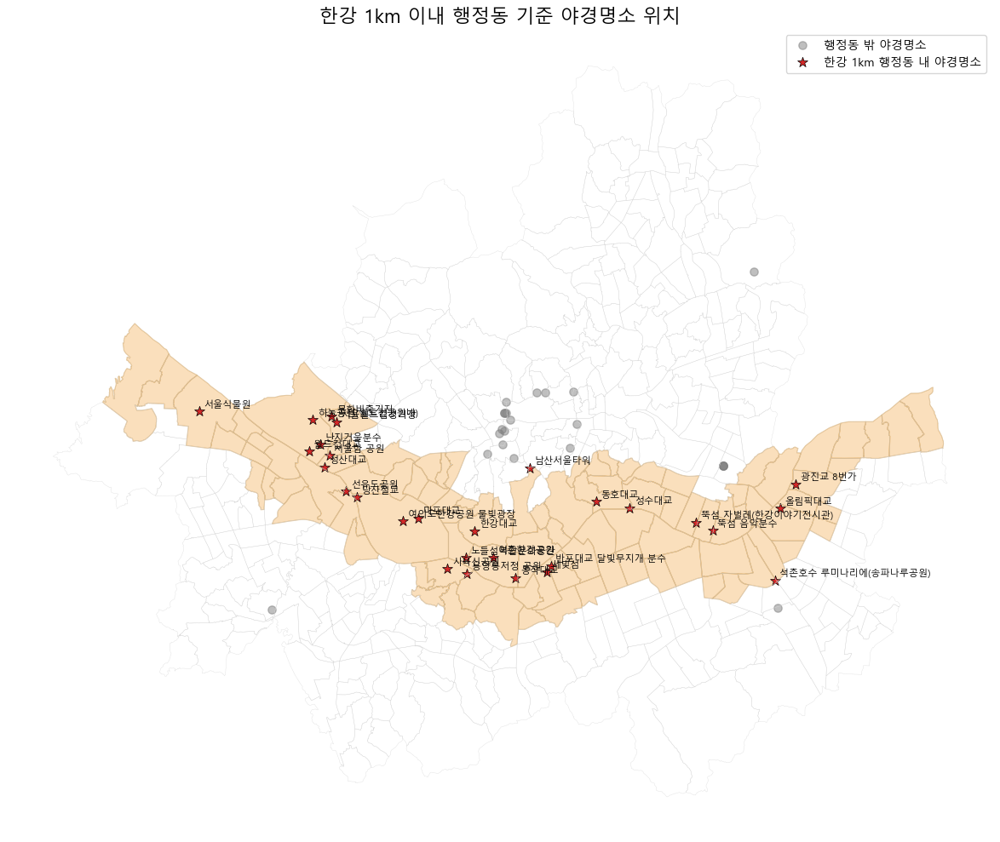

In [46]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# =========================
# 1. 데이터 불러오기
# =========================

night = pd.read_excel("../서울시 야경명소 정보.xlsx")

dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)

target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()

hangang_1km_dong = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# =========================
# 2. 야경명소 Point 생성
# =========================

night = night.dropna(subset=["위도", "경도"]).copy()

night_gdf = gpd.GeoDataFrame(
    night,
    geometry=gpd.points_from_xy(night["경도"], night["위도"]),
    crs="EPSG:4326"
)

night_gdf = night_gdf.to_crs(hangang_1km_dong.crs)

# =========================
# 3. 한강 1km 이내 행정동 포함 여부 확인
# =========================

night_joined = gpd.sjoin(
    night_gdf,
    hangang_1km_dong[["ADM_CD", "ADM_NM", "geometry"]],
    how="left",
    predicate="within"
)

night_joined["한강1km행정동_포함여부"] = night_joined["ADM_CD"].notna()

night_inside = night_joined[night_joined["한강1km행정동_포함여부"] == True].copy()
night_outside = night_joined[night_joined["한강1km행정동_포함여부"] == False].copy()

# =========================
# 4. 포함되는 야경명소 출력
# =========================

print("전체 야경명소 수:", len(night_joined))
print("한강 1km 이내 행정동에 포함되는 야경명소 수:", len(night_inside))
print("포함되지 않는 야경명소 수:", len(night_outside))

print("\n한강 1km 이내 행정동에 포함되는 야경명소:")
display(
    night_inside[
        ["장소명", "분류", "주소", "ADM_NM", "위도", "경도"]
    ].sort_values("ADM_NM")
)

# =========================
# 5. 그림으로 보여주기
# =========================

plt.rcParams["font.family"] = "Malgun Gothic"
plt.rcParams["axes.unicode_minus"] = False

fig, ax = plt.subplots(figsize=(14, 10))

# 서울 전체 행정동 경계
dong_all[
    dong_all["ADM_CD"].str.startswith("11")
].boundary.plot(
    ax=ax,
    linewidth=0.3,
    color="lightgray",
    alpha=0.7
)

# 한강 1km 이내 행정동
hangang_1km_dong.plot(
    ax=ax,
    color="#F2A541",
    edgecolor="#C77700",
    linewidth=0.8,
    alpha=0.35,
    label="한강 1km 이내 행정동"
)

# 포함되지 않은 야경명소
if len(night_outside) > 0:
    night_outside.plot(
        ax=ax,
        color="gray",
        markersize=45,
        marker="o",
        alpha=0.5,
        label="행정동 밖 야경명소"
    )

# 포함된 야경명소
if len(night_inside) > 0:
    night_inside.plot(
        ax=ax,
        color="#D62828",
        markersize=80,
        marker="*",
        edgecolor="black",
        linewidth=0.5,
        label="한강 1km 행정동 내 야경명소"
    )

# 포함된 장소명 라벨
for _, row in night_inside.iterrows():
    ax.annotate(
        row["장소명"],
        xy=(row.geometry.x, row.geometry.y),
        xytext=(4, 4),
        textcoords="offset points",
        fontsize=8,
        color="black"
    )

ax.set_title("한강 1km 이내 행정동 기준 야경명소 위치", fontsize=16)
ax.legend()
ax.set_axis_off()

plt.tight_layout()
plt.show()


In [47]:
# 포함되는 야경명소만 엑셀 저장
night_inside_result = night_inside.drop(columns=["geometry", "index_right"])

night_inside_result.to_excel(
    "한강_1km_행정동내_야경명소.xlsx",
    index=False
)

print("저장 완료:", "한강_1km_행정동내_야경명소.xlsx")
print("저장된 야경명소 수:", len(night_inside_result))


저장 완료: 한강_1km_행정동내_야경명소.xlsx
저장된 야경명소 수: 28


전체 선착장 수: 7
지도에 표시 가능한 선착장 수: 7


,선착장명,주소,위도,경도
0,마곡,서울특별시 강서구 가양동 441,37.566350,126.852552
1,망원,서울특별시 마포구 망원동 205-8,37.555860,126.900870
2,여의도,서울특별시 영등포구 여의도동 85-1,37.526709,126.923800
3,옥수,서울특별시 성동구 옥수동 86,37.541760,127.016480
4,압구정,서울특별시 강남구 압구정동 380-1,37.530043,127.031335
5,뚝섬,서울특별시 광진구 자양동 126-1,37.532973,127.072741
6,잠실,서울특별시 송파구 잠실동 1-2,37.512281,127.085599


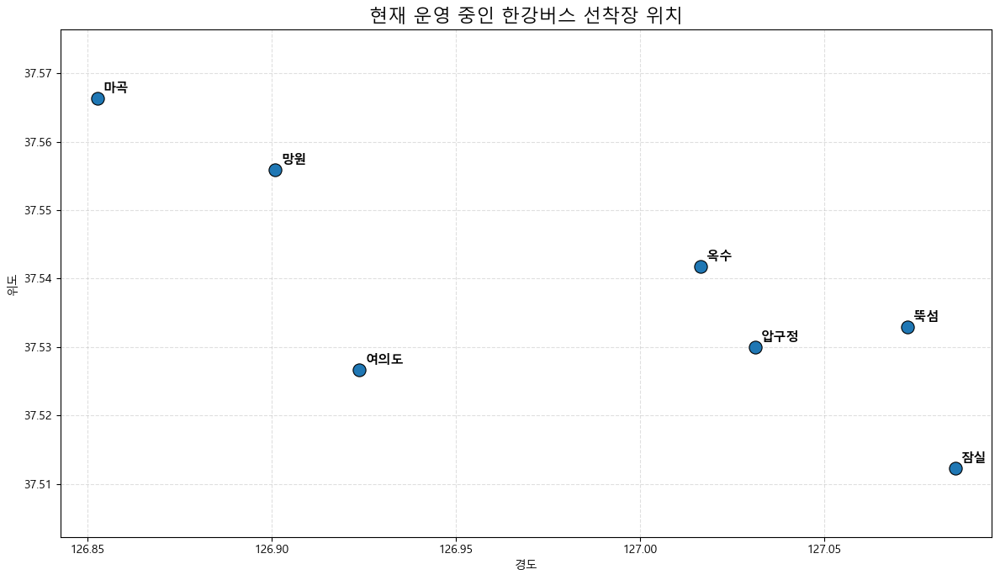

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
from geopy.geocoders import Nominatim
from time import sleep

# 1. 선착장 정보 불러오기
dock = pd.read_excel("서울특별시 한강버스 선착장 정보.xlsx")

# 2. 주소를 위도/경도로 변환
geolocator = Nominatim(user_agent="hangang_bus_map")

lat_list = []
lon_list = []

for addr in dock["주소"]:
    location = geolocator.geocode(addr)
    
    if location is not None:
        lat_list.append(location.latitude)
        lon_list.append(location.longitude)
    else:
        lat_list.append(None)
        lon_list.append(None)
    
    sleep(1)  # 과도한 요청 방지

dock["위도"] = lat_list
dock["경도"] = lon_list

# 좌표 변환 실패한 행 제거
dock_map = dock.dropna(subset=["위도", "경도"]).copy()

print("전체 선착장 수:", len(dock))
print("지도에 표시 가능한 선착장 수:", len(dock_map))

display(dock_map[["선착장명", "주소", "위도", "경도"]])

# 3. PNG 이미지로 지도처럼 표시
plt.rcParams["font.family"] = "Malgun Gothic"
plt.rcParams["axes.unicode_minus"] = False

fig, ax = plt.subplots(figsize=(12, 7))

ax.scatter(
    dock_map["경도"],
    dock_map["위도"],
    s=120,
    color="#1f77b4",
    edgecolor="black",
    linewidth=0.8,
    zorder=3
)

# 선착장 이름 표시
for _, row in dock_map.iterrows():
    ax.annotate(
        row["선착장명"],
        xy=(row["경도"], row["위도"]),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=11,
        fontweight="bold"
    )

ax.set_title("현재 운영 중인 한강버스 선착장 위치", fontsize=16)
ax.set_xlabel("경도")
ax.set_ylabel("위도")

ax.grid(True, linestyle="--", alpha=0.4)

# 보기 좋게 여백 추가
x_margin = 0.01
y_margin = 0.01

ax.set_xlim(dock_map["경도"].min() - x_margin, dock_map["경도"].max() + x_margin)
ax.set_ylim(dock_map["위도"].min() - y_margin, dock_map["위도"].max() + y_margin)

plt.tight_layout()

# PNG로 저장하고 화면에도 표시
plt.savefig("한강버스_선착장_위치.png", dpi=300, bbox_inches="tight")
plt.show()


선착장 수: 7


,선착장명,위도,경도
0,마곡 선착장,37.575677,126.839846
1,망원 선착장,37.551690,126.894224
2,여의도 선착장,37.528392,126.935152
3,압구정 선착장,37.534978,127.026365
4,옥수 선착장,37.539265,127.017772
5,뚝섬 선착장,37.528571,127.067339
6,잠실 선착장,37.518625,127.075482


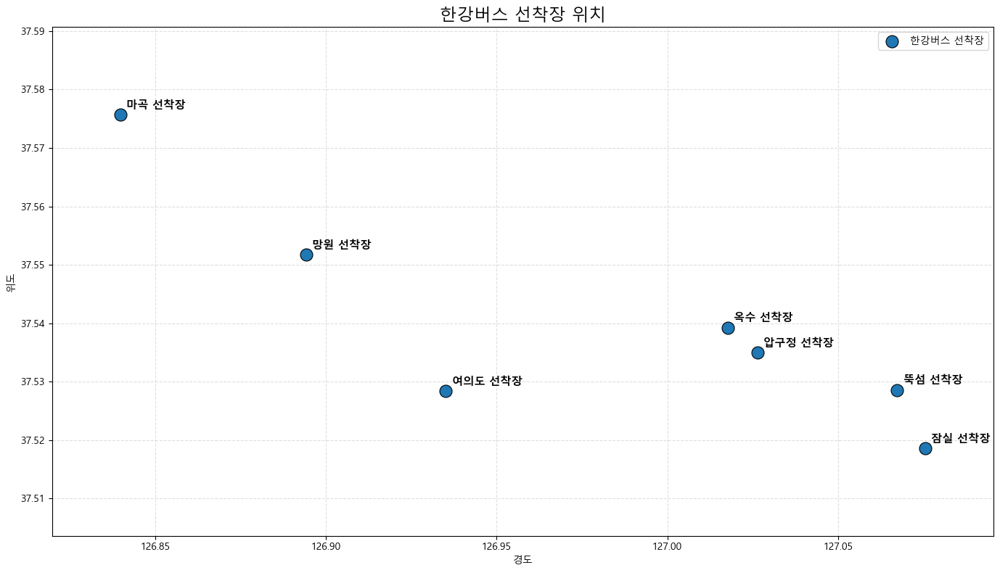

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO

csv_text = """
선착장명,위도,경도
마곡 선착장,37.575677,126.839846
망원 선착장,37.551690,126.894224
여의도 선착장,37.528392,126.935152
압구정 선착장,37.534978,127.026365
옥수 선착장,37.539265,127.017772
뚝섬 선착장,37.528571,127.067339
잠실 선착장,37.518625,127.075482
"""

dock = pd.read_csv(StringIO(csv_text))

print("선착장 수:", len(dock))
display(dock)

plt.rcParams["font.family"] = "Malgun Gothic"
plt.rcParams["axes.unicode_minus"] = False

fig, ax = plt.subplots(figsize=(14, 8))

# 선착장 점
ax.scatter(
    dock["경도"],
    dock["위도"],
    s=150,
    color="#1f77b4",
    edgecolor="black",
    linewidth=0.8,
    zorder=3,
    label="한강버스 선착장"
)

# 선착장 이름
for _, row in dock.iterrows():
    ax.annotate(
        row["선착장명"],
        xy=(row["경도"], row["위도"]),
        xytext=(6, 6),
        textcoords="offset points",
        fontsize=11,
        fontweight="bold"
    )

ax.set_title("한강버스 선착장 위치", fontsize=17)
ax.set_xlabel("경도")
ax.set_ylabel("위도")
ax.grid(True, linestyle="--", alpha=0.4)
ax.legend()

ax.set_xlim(dock["경도"].min() - 0.02, dock["경도"].max() + 0.02)
ax.set_ylim(dock["위도"].min() - 0.015, dock["위도"].max() + 0.015)

plt.tight_layout()
plt.savefig("한강버스_선착장_위치.png", dpi=300, bbox_inches="tight")
plt.show()


D:\TEMP\ipykernel_19364\3132131191.py:165: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


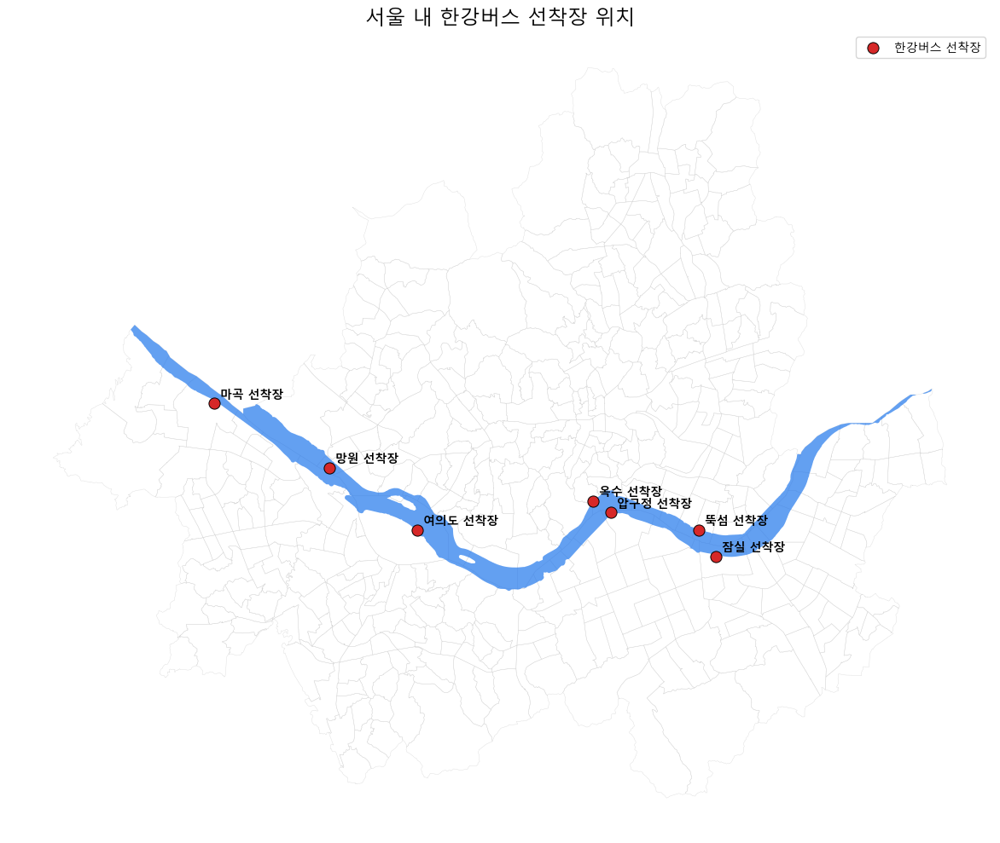

In [53]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from io import StringIO

# =========================
# 1. 선착장 좌표
# =========================

csv_text = """
선착장명,위도,경도
마곡 선착장,37.575677,126.839846
망원 선착장,37.551690,126.894224
여의도 선착장,37.528392,126.935152
압구정 선착장,37.534978,127.026365
옥수 선착장,37.539265,127.017772
뚝섬 선착장,37.528571,127.067339
잠실 선착장,37.518625,127.075482
"""

dock = pd.read_csv(StringIO(csv_text))

dock_gdf = gpd.GeoDataFrame(
    dock,
    geometry=gpd.points_from_xy(dock["경도"], dock["위도"]),
    crs="EPSG:4326"
)

# =========================
# 2. 서울 행정동 경계
# =========================

dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)

dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

# 선착장 좌표계를 행정동 좌표계로 변환
dock_gdf = dock_gdf.to_crs(dong_seoul.crs)

# =========================
# 3. 한강 본류 만들기
# =========================

river = gpd.read_file("N3A_E0032111.shp")
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

# polygon 조각 분리
all_polys = []

for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(
    geometry=all_polys,
    crs=river_seoul.crs
)

river_parts["area"] = river_parts.geometry.area

# 한강 본류 후보
hangang_main = river_parts[
    river_parts["area"] > 5000000
].copy()

merged = hangang_main.geometry.union_all()

if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)

# 지천 가지 약간 정리
dist = 100
eroded = hangang_body.buffer(-dist)

if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)

hangang_final = gpd.GeoDataFrame(
    geometry=[hangang_final_geom],
    crs=river_parts.crs
)

# 서울 영역 안으로 자르기
seoul_boundary_gdf = gpd.GeoDataFrame(
    geometry=[seoul_boundary],
    crs=dong_seoul.crs
)

hangang_final_seoul = gpd.overlay(
    hangang_final,
    seoul_boundary_gdf,
    how="intersection"
)

# =========================
# 4. 지도 그리기
# =========================

plt.rcParams["font.family"] = "Malgun Gothic"
plt.rcParams["axes.unicode_minus"] = False

fig, ax = plt.subplots(figsize=(15, 10))

# 서울 행정동 경계
dong_seoul.boundary.plot(
    ax=ax,
    linewidth=0.3,
    color="lightgray",
    alpha=0.8,
    zorder=1
)

# 한강 본류
hangang_final_seoul.plot(
    ax=ax,
    color="#2F80ED",
    alpha=0.75,
    zorder=2,
    label="한강 본류"
)

# 선착장
dock_gdf.plot(
    ax=ax,
    color="#D62828",
    markersize=90,
    marker="o",
    edgecolor="black",
    linewidth=0.7,
    zorder=3,
    label="한강버스 선착장"
)

# 선착장 이름 표시
for _, row in dock_gdf.iterrows():
    ax.annotate(
        row["선착장명"],
        xy=(row.geometry.x, row.geometry.y),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=10,
        fontweight="bold",
        color="black"
    )

ax.set_title("서울 내 한강버스 선착장 위치", fontsize=17)
ax.legend()
ax.set_axis_off()

plt.tight_layout()
plt.show()


In [54]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# =========================
# 1. 데이터 불러오기
# =========================

# 최종 지하철역
final_stations = pd.read_excel("한강_1500m이내_지하철역_환승역통합.xlsx")

# 한강버스 선착장 - 위도/경도 추가된 기존 파일
dock = pd.read_excel("../서울특별시 한강버스 선착장 정보.xlsx")
dock = dock.dropna(subset=["위도", "경도"]).copy()

# 전체 행정동
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)

# 서울 행정동
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

# 한강 1km 이내 행정동 목록
target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()

hangang_1km_dong = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# =========================
# 2. 한강 본류 만들기
# =========================

river = gpd.read_file("N3A_E0032111.shp")
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

all_polys = []

for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(
    geometry=all_polys,
    crs=river_seoul.crs
)

river_parts["area"] = river_parts.geometry.area

hangang_main = river_parts[river_parts["area"] > 5000000].copy()

merged = hangang_main.geometry.union_all()

if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)

dist = 100
eroded = hangang_body.buffer(-dist)

if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)

hangang_final = gpd.GeoDataFrame(
    geometry=[hangang_final_geom],
    crs=river_parts.crs
)

# 서울 영역 안으로 한강 자르기
seoul_boundary_gdf = gpd.GeoDataFrame(
    geometry=[seoul_boundary],
    crs=dong_seoul.crs
)

hangang_final_seoul = gpd.overlay(
    hangang_final,
    seoul_boundary_gdf,
    how="intersection"
)

# =========================
# 3. 1500m 버퍼 만들기
# =========================

hangang_1500m_buffer = hangang_final_seoul.geometry.union_all().buffer(1500)

hangang_1500m_buffer_gdf = gpd.GeoDataFrame(
    geometry=[hangang_1500m_buffer],
    crs=hangang_final_seoul.crs
)

hangang_1500m_buffer_seoul = gpd.overlay(
    hangang_1500m_buffer_gdf,
    seoul_boundary_gdf,
    how="intersection"
)

# =========================
# 4. folium 지도용 좌표계 변환
# =========================

hangang_map = hangang_final_seoul.to_crs(epsg=4326)
hangang_1500m_buffer_map = hangang_1500m_buffer_seoul.to_crs(epsg=4326)
hangang_1km_dong_map = hangang_1km_dong.to_crs(epsg=4326)

# =========================
# 5. 지도 생성
# =========================

center_lat = final_stations["위도"].mean()
center_lon = final_stations["경도"].mean()

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles="cartodbpositron"
)

# 한강 1km 이내 행정동
folium.GeoJson(
    hangang_1km_dong_map,
    name="한강 1km 이내 행정동",
    style_function=lambda feature: {
        "fillColor": "#F2A541",
        "color": "#C77700",
        "weight": 1,
        "fillOpacity": 0.25,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["ADM_NM", "ADM_CD"],
        aliases=["행정동", "행정동코드"]
    )
).add_to(m)

# 한강 본류
folium.GeoJson(
    hangang_map,
    name="한강 본류 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#2F80ED",
        "color": "#1B4F9C",
        "weight": 1,
        "fillOpacity": 0.65,
    }
).add_to(m)

# 한강 1500m 기준
folium.GeoJson(
    hangang_1500m_buffer_map,
    name="한강 1500m 기준 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#56CCF2",
        "color": "#0096C7",
        "weight": 2,
        "fillOpacity": 0.12,
        "dashArray": "5, 5",
    }
).add_to(m)

# =========================
# 6. 최종 지하철역 마커
# =========================

station_cluster = MarkerCluster(name="최종 지하철역").add_to(m)

for _, row in final_stations.iterrows():
    popup_text = f"""
    <b>{row['역사명']}역</b><br>
    호선: {row['호선']}<br>
    행정동: {row['ADM_NM']}<br>
    한강거리: {row['한강거리_m']}m ({row['한강거리_km']}km)
    """

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=5,
        color="#D62828",
        fill=True,
        fill_color="#D62828",
        fill_opacity=0.9,
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"{row['역사명']}역 | {row['한강거리_m']}m"
    ).add_to(station_cluster)

# =========================
# 7. 한강버스 선착장 마커 추가
# =========================

dock_group = folium.FeatureGroup(name="한강버스 선착장").add_to(m)

for _, row in dock.iterrows():
    popup_text = f"""
    <b>{row['선착장명']} 선착장</b><br>
    주소: {row['주소']}<br>
    지하철: {row['(접근수단)지하철']}<br>
    버스: {row['(접근수단)버스']}
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(popup_text, max_width=350),
        tooltip=f"{row['선착장명']} 선착장",
        icon=folium.Icon(
            color="blue",
            icon="ship",
            prefix="fa"
        )
    ).add_to(dock_group)

# 레이어 컨트롤
folium.LayerControl().add_to(m)

# =========================
# 8. 기존 HTML 파일명으로 저장
# =========================

m.save("최종_지하철역_지도_서울영역.html")

print("저장 완료: 최종_지하철역_지도_서울영역.html")
print("표시된 지하철역 수:", len(final_stations))
print("표시된 선착장 수:", len(dock))

m


저장 완료: 최종_지하철역_지도_서울영역.html
표시된 지하철역 수: 72
표시된 선착장 수: 7


In [61]:
import pandas as pd

dong_stats = pd.read_excel("빅데이터자료/행정동별_인구수_직장수.xlsx", dtype=str)

dong_stats["ADM_NM"] = dong_stats["행정동명"].astype(str).str.strip()
dong_stats["인구수"] = pd.to_numeric(
    dong_stats["인구수"].astype(str).str.replace(",", ""),
    errors="coerce"
).fillna(0).astype(int)
dong_stats["총근로자수"] = pd.to_numeric(
    dong_stats["총근로자수"].astype(str).str.replace(",", ""),
    errors="coerce"
).fillna(0).astype(int)

hangang_1km_dong = hangang_1km_dong.merge(
    dong_stats[["ADM_NM", "인구수", "총근로자수"]],
    on="ADM_NM",
    how="left"
)

final_stations = final_stations.merge(
    dong_stats[["ADM_NM", "인구수", "총근로자수"]],
    on="ADM_NM",
    how="left"
)

In [91]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# ==========================================
# 1) 데이터 로드 및 정제 (지하철역 하루평균 이용량, 행정동 통계)
# ==========================================
# 기존 "한강_1500m이내_지하철역_환승역통합.xlsx" 대신 새로 제공해주신 하루평균 데이터 엑셀을 로드합니다.
final_stations = pd.read_excel("최종_한강_1500m이내_지하철역_하루평균_이용량.xlsx", sheet_name="역별_하루평균")
dong_stats = pd.read_excel("최종_한강주변_행정동_직장수_인구수.xlsx", dtype=str)

# 행정동 통계 데이터 정제
dong_stats["ADM_NM"] = dong_stats["행정동"].astype(str).str.strip()

dong_stats["인구수"] = pd.to_numeric(
    dong_stats["인구수"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

dong_stats["총종사자수"] = pd.to_numeric(
    dong_stats["총 종사자수\n(직장 수)"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

# 중복 행정동 통계 요약
dong_stats_cleaned = dong_stats.groupby("ADM_NM")[["인구수", "총종사자수"]].sum().reset_index()

# 지하철역 데이터 정제 및 행정동 통계 병합
final_stations["ADM_NM"] = final_stations["ADM_NM"].fillna("").astype(str).str.strip()
final_stations = final_stations.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
final_stations["인구수"] = final_stations["인구수"].fillna(0).astype(int)
final_stations["총종사자수"] = final_stations["총종사자수"].fillna(0).astype(int)


# ==========================================
# 2) 공간 데이터 처리 (SHP, CSV)
# ==========================================
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

if "ADM_NM" in dong_all.columns:
    dong_all["ADM_NM"] = dong_all["ADM_NM"].astype(str).str.strip()

target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()
hangang_1km_dong = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# 1km 행정동에 통계 데이터 결합
hangang_1km_dong = hangang_1km_dong.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
hangang_1km_dong["인구수"] = hangang_1km_dong["인구수"].fillna(0).astype(int)
hangang_1km_dong["총종사자수"] = hangang_1km_dong["총종사자수"].fillna(0).astype(int)


# ==========================================
# 3) 한강 본류 및 1500m 버퍼 연산
# ==========================================
river = gpd.read_file("N3A_E0032111.shp")
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

all_polys = []
for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(geometry=all_polys, crs=river_seoul.crs)
river_parts["area"] = river_parts.geometry.area
hangang_main = river_parts[river_parts["area"] > 5000000].copy()

merged = hangang_main.geometry.union_all()
if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)
dist = 100
eroded = hangang_body.buffer(-dist)
if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)
hangang_final = gpd.GeoDataFrame(geometry=[hangang_final_geom], crs=river_parts.crs)

seoul_boundary_gdf = gpd.GeoDataFrame(geometry=[seoul_boundary], crs=dong_seoul.crs)
hangang_final_seoul = gpd.overlay(hangang_final, seoul_boundary_gdf, how="intersection")

hangang_1500m_buffer = hangang_final_seoul.geometry.union_all().buffer(1500)
hangang_1500m_buffer_gdf = gpd.GeoDataFrame(geometry=[hangang_1500m_buffer], crs=hangang_final_seoul.crs)
hangang_1500m_buffer_seoul = gpd.overlay(hangang_1500m_buffer_gdf, seoul_boundary_gdf, how="intersection")


# ==========================================
# 4) Folium 시각화를 위한 좌표계 변환 (WGS84)
# ==========================================
hangang_map = hangang_final_seoul.to_crs(epsg=4326)
hangang_1500m_buffer_map = hangang_1500m_buffer_seoul.to_crs(epsg=4326)
hangang_1km_dong_map = hangang_1km_dong.to_crs(epsg=4326)


# ==========================================
# 5) 지도 생성 및 레이어 추가
# ==========================================
center_lat = final_stations["위도"].mean()
center_lon = final_stations["경도"].mean()

m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles="cartodbpositron")

# [레이어 1] 한강 1500m 버퍼 (가장 아래 배치 + 클릭 이벤트 하단 전달)
folium.GeoJson(
    hangang_1500m_buffer_map,
    name="한강 1500m 기준 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#56CCF2",
        "color": "#0096C7",
        "weight": 2,
        "fillOpacity": 0.12,
        "dashArray": "5, 5",
        "pointerEvents": "none"
    }
).add_to(m)

# [레이어 2] 한강 본류
folium.GeoJson(
    hangang_map,
    name="한강 본류 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#2F80ED",
        "color": "#1B4F9C",
        "weight": 1,
        "fillOpacity": 0.65,
    }
).add_to(m)

# [레이어 3] 한강 1km 이내 행정동 (마우스 오버 및 클릭 상시 가능, 행정동 코드 제외)
folium.GeoJson(
    hangang_1km_dong_map,
    name="한강 1km 이내 행정동",
    style_function=lambda feature: {
        "fillColor": "#F2A541",
        "color": "#C77700",
        "weight": 1,
        "fillOpacity": 0.25,
    },
    highlight_function=lambda feature: {
        "fillColor": "#C77700",
        "color": "#995500",
        "weight": 2.5,
        "fillOpacity": 0.4,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["ADM_NM", "인구수", "총종사자수"],
        aliases=["행정동명:", "인구수(명):", "총 종사자수(명):"],
        localize=True,
        sticky=True,
        style="""
            background-color: #FFFFFF;
            border: 2px solid #C77700;
            border-radius: 5px;
            box-shadow: 3px 3px rgba(0,0,0,0.15);
            color: #333333;
            font-family: 'Malgun Gothic', sans-serif;
            font-size: 12px;
            padding: 8px 12px;
        """
    )
).add_to(m)


# [레이어 4] 한강버스 선착장 마커 (★주소까지만 노출되도록 팝업 수정)
try:
    dock = pd.read_excel("서울특별시 한강버스 선착장 정보.xlsx")
    
    lat_col = [c for c in dock.columns if '위도' in str(c) or 'lat' in str(c).lower()][0]
    lon_col = [c for c in dock.columns if '경도' in str(c) or 'lon' in str(c).lower() or 'lng' in str(c).lower()][0]
    
    dock = dock.dropna(subset=[lat_col, lon_col]).copy()
    dock_group = folium.FeatureGroup(name="한강버스 선착장").add_to(m)

    for _, row in dock.iterrows():
        name_col = [c for c in dock.columns if '선착장' in str(c)][0]
        addr_col = [c for c in dock.columns if '주소' in str(c)][0]
        
        # 접근 수단(지하철, 버스) 정보를 제거하고 이름과 주소만 깔끔하게 노출합니다.
        popup_text = f"""
        <b>{row[name_col]} 선착장</b><br>
        주소: {row[addr_col]}
        """
        folium.Marker(
            location=[float(row[lat_col]), float(row[lon_col])],
            popup=folium.Popup(popup_text, max_width=300),
            tooltip=f"{row[name_col]} 선착장",
            icon=folium.Icon(color="blue", icon="ship", prefix="fa")
        ).add_to(dock_group)
    print("한강버스 선착장 레이어가 추가되었습니다.")
except Exception as e:
    print(f"선착장 파일 처리 중 오류: {e}")


# [레이어 5] 지하철역 마커 클러스터 (★하루평균 승하차 및 총이용량 추가)
station_cluster = MarkerCluster(name="최종 지하철역").add_to(m)

for _, row in final_stations.iterrows():
    subway_name = row.get('역사명', '알 수 없음')
    line_num = row.get('호선', '-')
    dong_name = row.get('ADM_NM', '-')
    dist_m = row.get('한강거리_m', '-')
    dist_km = row.get('한강거리_km', '-')
    pop_cnt = f"{int(row['인구수']):,}" if row['인구수'] > 0 else "-"
    worker_cnt = f"{int(row['총종사자수']):,}" if row['총종사자수'] > 0 else "-"

    # 새로 추가된 하루평균 이용량 데이터 추출 및 반올림 포맷팅
    try:
        avg_on = f"{int(round(float(row['하루평균_승차인원']))):,}명" if pd.notna(row.get('하루평균_승차인원')) else "-"
        avg_off = f"{int(round(float(row['하루평균_하차인원']))):,}명" if pd.notna(row.get('하루평균_하차인원')) else "-"
        avg_total = f"{int(round(float(row['하루평균_총이용량']))):,}명" if pd.notna(row.get('하루평균_총이용량')) else "-"
    except:
        avg_on, avg_off, avg_total = "-", "-", "-"

    popup_text = f"""
    <b>{subway_name}역</b><br>
    호선: {line_num}<br>
    행정동: {dong_name}<br>
    한강거리: {dist_m}m ({dist_km}km)<br>
    <hr style='margin: 5px 0; border: 0; border-top: 1px dashed #ccc;'>
    <b>[하루평균 이용량]</b><br>
    - 승차 인원: {avg_on}<br>
    - 하차 인원: {avg_off}<br>
    - 총 이용량: {avg_total}<br>
    """

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=5,
        color="#D62828",
        fill=True,
        fill_color="#D62828",
        fill_opacity=0.9,
        popup=folium.Popup(popup_text, max_width=320),
        tooltip=f"{subway_name}역 | {dist_m}m"
    ).add_to(station_cluster)


# 레이어 컨트롤 추가 및 저장
folium.LayerControl().add_to(m)
m.save("최종_지하철역_지도_서울영역.html")
print("저장 완료: 최종_지하철역_지도_서울영역.html")

한강버스 선착장 레이어가 추가되었습니다.
저장 완료: 최종_지하철역_지도_서울영역.html


In [79]:
import pandas as pd
import geopandas as gpd
from pathlib import Path

# =========================
# 1. 파일 경로
# =========================
spot_file = Path("서울_명소_위경도_좌표_리스트.xlsx")
hangang_file = Path("hangang_candidate.shp")
output_file = Path("한강_1_5km이내_서울명소.xlsx")

# =========================
# 2. 명소 좌표 파일 불러오기
# =========================
spots = pd.read_excel(spot_file)

print("명소 파일 컬럼:", spots.columns.tolist())

# =========================
# 3. 위도/경도 컬럼 자동 찾기
# =========================
lat_candidates = ["위도", "lat", "latitude", "LAT", "Latitude"]
lon_candidates = ["경도", "lon", "lng", "longitude", "LON", "Longitude"]

lat_col = next((col for col in lat_candidates if col in spots.columns), None)
lon_col = next((col for col in lon_candidates if col in spots.columns), None)

if lat_col is None or lon_col is None:
    raise ValueError("위도/경도 컬럼을 찾지 못했습니다. 출력된 컬럼명을 확인해주세요.")

# 숫자형 변환
spots[lat_col] = pd.to_numeric(spots[lat_col], errors="coerce")
spots[lon_col] = pd.to_numeric(spots[lon_col], errors="coerce")

# 좌표 없는 행 제거
spots = spots.dropna(subset=[lat_col, lon_col]).copy()

# =========================
# 4. 명소를 공간 데이터로 변환
# =========================
spots_gdf = gpd.GeoDataFrame(
    spots,
    geometry=gpd.points_from_xy(spots[lon_col], spots[lat_col]),
    crs="EPSG:4326"
)

# =========================
# 5. 한강 공간 데이터 불러오기
# =========================
hangang = gpd.read_file(hangang_file)

# 거리 계산을 위해 미터 단위 좌표계로 변환
spots_gdf = spots_gdf.to_crs(epsg=5186)
hangang = hangang.to_crs(epsg=5186)

# =========================
# 6. 한강까지 거리 계산 후 1.5km 이내만 필터링
# =========================
hangang_union = hangang.geometry.union_all()

spots_gdf["한강거리_m"] = spots_gdf.geometry.distance(hangang_union).round(1)
spots_gdf["한강거리_km"] = (spots_gdf["한강거리_m"] / 1000).round(2)

result = spots_gdf[spots_gdf["한강거리_m"] <= 1500].copy()
result = result.sort_values("한강거리_m").reset_index(drop=True)

# =========================
# 7. 엑셀 저장
# =========================
result_excel = pd.DataFrame(result.drop(columns="geometry"))
result_excel.to_excel(output_file, index=False)

print("저장 완료:", output_file)
print("전체 명소 수:", len(spots_gdf))
print("한강 1.5km 이내 명소 수:", len(result_excel))

result_excel.head()

명소 파일 컬럼: ['번호', '장소명', '위도', '경도']
저장 완료: 한강_1_5km이내_서울명소.xlsx
전체 명소 수: 115
한강 1.5km 이내 명소 수: 103


,번호,장소명,위도,경도,한강거리_m,한강거리_km
0,24,반포한강공원,37.5115,126.9951,5.8,0.01
1,102,뚝섬한강공원,37.5288,127.0682,27.6,0.03
2,111,평화시장,37.5694,127.0076,28.3,0.03
3,8,선유도공원,37.5422,126.9015,40.7,0.04
4,64,광장시장,37.5700,127.0016,42.4,0.04


In [80]:
import pandas as pd
import numpy as np

# =========================
# 1. 파일 경로
# =========================
spot_file = "서울_명소_위경도_좌표_리스트.xlsx"
output_file = "한강_1_5km이내_서울명소_중심선기준.xlsx"

# =========================
# 2. 서울 한강 중심선 좌표
# 경도, 위도 순서
# =========================
hangang_line = [
    (126.7900, 37.5900),
    (126.8200, 37.5750),
    (126.8500, 37.5650),
    (126.8800, 37.5550),
    (126.9100, 37.5450),
    (126.9300, 37.5350),
    (126.9500, 37.5250),
    (126.9700, 37.5150),
    (126.9900, 37.5150),
    (127.0200, 37.5250),
    (127.0500, 37.5300),
    (127.0800, 37.5350),
    (127.1100, 37.5400),
    (127.1400, 37.5450),
    (127.1700, 37.5550),
]

# =========================
# 3. 거리 계산 함수
# 위경도를 미터 단위 평면좌표처럼 근사 변환
# =========================
def lonlat_to_meter(lon, lat):
    x = lon * 111320 * np.cos(np.radians(lat))
    y = lat * 110540
    return x, y

def point_to_segment_distance(px, py, ax, ay, bx, by):
    dx = bx - ax
    dy = by - ay

    if dx == 0 and dy == 0:
        return np.sqrt((px - ax) ** 2 + (py - ay) ** 2)

    t = ((px - ax) * dx + (py - ay) * dy) / (dx ** 2 + dy ** 2)
    t = max(0, min(1, t))

    nearest_x = ax + t * dx
    nearest_y = ay + t * dy

    return np.sqrt((px - nearest_x) ** 2 + (py - nearest_y) ** 2)

def distance_to_hangang(lon, lat, line):
    px, py = lonlat_to_meter(lon, lat)

    distances = []

    for i in range(len(line) - 1):
        lon1, lat1 = line[i]
        lon2, lat2 = line[i + 1]

        ax, ay = lonlat_to_meter(lon1, lat1)
        bx, by = lonlat_to_meter(lon2, lat2)

        dist = point_to_segment_distance(px, py, ax, ay, bx, by)
        distances.append(dist)

    return min(distances)

# =========================
# 4. 명소 데이터 불러오기
# =========================
spots = pd.read_excel(spot_file)

spots["위도"] = pd.to_numeric(spots["위도"], errors="coerce")
spots["경도"] = pd.to_numeric(spots["경도"], errors="coerce")

spots = spots.dropna(subset=["위도", "경도"]).copy()

# =========================
# 5. 한강까지 거리 계산
# =========================
spots["한강거리_m"] = spots.apply(
    lambda row: distance_to_hangang(row["경도"], row["위도"], hangang_line),
    axis=1
)

spots["한강거리_m"] = spots["한강거리_m"].round(1)
spots["한강거리_km"] = (spots["한강거리_m"] / 1000).round(2)

# =========================
# 6. 한강 1.5km 이내만 추출
# =========================
result = spots[spots["한강거리_m"] <= 1500].copy()

result = result.sort_values("한강거리_m").reset_index(drop=True)

# =========================
# 7. 엑셀 저장
# =========================
result.to_excel(output_file, index=False)

print("저장 완료:", output_file)
print("전체 명소 수:", len(spots))
print("한강 1.5km 이내 명소 수:", len(result))

result

저장 완료: 한강_1_5km이내_서울명소_중심선기준.xlsx
전체 명소 수: 115
한강 1.5km 이내 명소 수: 26


,번호,장소명,위도,경도,한강거리_m,한강거리_km
0,1,서울식물원,37.5693,126.8354,38.6,0.04
1,21,압구정카페골목,37.5264,127.0361,190.2,0.19
2,42,노들섬,37.5175,126.9582,192.4,0.19
3,2,양천향교,37.5721,126.8385,222.6,0.22
4,3,겸재정선미술관,37.5721,126.8385,222.6,0.22
5,93,합정카페거리,37.5473,126.9154,282.8,0.28
6,11,여의도한강공원,37.5284,126.9332,282.9,0.28
7,8,선유도공원,37.5422,126.9015,383.9,0.38
8,22,청담동명품거리,37.5260,127.0435,432.2,0.43
9,92,상수동카페거리,37.5477,126.9224,503.4,0.50


In [81]:
import pandas as pd
import numpy as np

# =========================
# 1. 파일 경로
# =========================
night_file = "../서울시 야경명소 정보.xlsx"
output_file = "한강_1_5km이내_야경명소_중심선기준.xlsx"

# 노트북이 빅데이터자료 폴더에서 실행 중이면:
# night_file = "../../서울시 야경명소 정보.xlsx"

# =========================
# 2. 서울 한강 중심선 좌표
# 경도, 위도 순서
# =========================
hangang_line = [
    (126.7900, 37.5900),
    (126.8200, 37.5750),
    (126.8500, 37.5650),
    (126.8800, 37.5550),
    (126.9100, 37.5450),
    (126.9300, 37.5350),
    (126.9500, 37.5250),
    (126.9700, 37.5150),
    (126.9900, 37.5150),
    (127.0200, 37.5250),
    (127.0500, 37.5300),
    (127.0800, 37.5350),
    (127.1100, 37.5400),
    (127.1400, 37.5450),
    (127.1700, 37.5550),
]

# =========================
# 3. 거리 계산 함수
# =========================
def lonlat_to_meter(lon, lat):
    x = lon * 111320 * np.cos(np.radians(lat))
    y = lat * 110540
    return x, y

def point_to_segment_distance(px, py, ax, ay, bx, by):
    dx = bx - ax
    dy = by - ay

    if dx == 0 and dy == 0:
        return np.sqrt((px - ax) ** 2 + (py - ay) ** 2)

    t = ((px - ax) * dx + (py - ay) * dy) / (dx ** 2 + dy ** 2)
    t = max(0, min(1, t))

    nearest_x = ax + t * dx
    nearest_y = ay + t * dy

    return np.sqrt((px - nearest_x) ** 2 + (py - nearest_y) ** 2)

def distance_to_hangang(lon, lat, line):
    px, py = lonlat_to_meter(lon, lat)

    distances = []

    for i in range(len(line) - 1):
        lon1, lat1 = line[i]
        lon2, lat2 = line[i + 1]

        ax, ay = lonlat_to_meter(lon1, lat1)
        bx, by = lonlat_to_meter(lon2, lat2)

        dist = point_to_segment_distance(px, py, ax, ay, bx, by)
        distances.append(dist)

    return min(distances)

# =========================
# 4. 야경명소 데이터 불러오기
# =========================
night = pd.read_excel(night_file)

night["위도"] = pd.to_numeric(night["위도"], errors="coerce")
night["경도"] = pd.to_numeric(night["경도"], errors="coerce")

night = night.dropna(subset=["위도", "경도"]).copy()

# =========================
# 5. 한강까지 거리 계산
# =========================
night["한강거리_m"] = night.apply(
    lambda row: distance_to_hangang(row["경도"], row["위도"], hangang_line),
    axis=1
)

night["한강거리_m"] = night["한강거리_m"].round(1)
night["한강거리_km"] = (night["한강거리_m"] / 1000).round(2)

# =========================
# 6. 한강 1.5km 이내만 추출
# =========================
result = night[night["한강거리_m"] <= 1500].copy()

result = result.sort_values("한강거리_m").reset_index(drop=True)

# =========================
# 7. 엑셀 저장
# =========================
result.to_excel(output_file, index=False)

print("저장 완료:", output_file)
print("전체 야경명소 수:", len(night))
print("한강 1.5km 이내 야경명소 수:", len(result))

result[["장소명", "주소", "위도", "경도", "한강거리_m", "한강거리_km"]]

저장 완료: 한강_1_5km이내_야경명소_중심선기준.xlsx
전체 야경명소 수: 51
한강 1.5km 이내 야경명소 수: 25


,장소명,주소,위도,경도,한강거리_m,한강거리_km
0,마포대교,서울 영등포구 여의도동 85-2,37.532429,126.935734,16.7,0.02
1,성산대교,서울 마포구 망원동 306-53,37.551477,126.891605,23.5,0.02
2,서울식물원,서울특별시 강서구 마곡동로 161,37.572244,126.832843,103.9,0.10
3,이촌한강공원,서울특별시 용산구 이촌로72길 62,37.517821,126.970851,183.7,0.18
4,노들섬복합문화공간,서울특별시 용산구 양녕로 445,37.517664,126.958037,187.7,0.19
5,여의도한강공원 물빛광장,서울 영등포구 여의도동 84-9,37.531247,126.928686,249.5,0.25
6,월드컵대교,서울 마포구 상암동 1541,37.557351,126.884432,260.8,0.26
7,뚝섬 자벌레(한강이야기전시관),서울특별시 광진구 강변북로 2202,37.530877,127.065983,264.8,0.26
8,당산철교,서울 영등포구 여의도동 80-3,37.540219,126.907104,352.4,0.35
9,선유도공원,서울특별시 영등포구 선유로 343,37.542383,126.901819,364.2,0.36


In [89]:
import pandas as pd
import numpy as np

# =========================
# 1. 파일 경로
# =========================
commercial_file = "빅데이터자료/서울 상권 지역.xlsx"
output_file = "한강_1_5km이내_서울상권지역_중심선기준.xlsx"

# 노트북이 하천수치 폴더에서 실행 중이면:
# commercial_file = "빅데이터자료/서울 상권 지역.xlsx"

# =========================
# 2. 서울 한강 중심선 좌표
# 경도, 위도 순서
# =========================
hangang_line = [
    (126.7900, 37.5900),
    (126.8200, 37.5750),
    (126.8500, 37.5650),
    (126.8800, 37.5550),
    (126.9100, 37.5450),
    (126.9300, 37.5350),
    (126.9500, 37.5250),
    (126.9700, 37.5150),
    (126.9900, 37.5150),
    (127.0200, 37.5250),
    (127.0500, 37.5300),
    (127.0800, 37.5350),
    (127.1100, 37.5400),
    (127.1400, 37.5450),
    (127.1700, 37.5550),
]

# =========================
# 3. 거리 계산 함수
# =========================
def lonlat_to_meter(lon, lat):
    x = lon * 111320 * np.cos(np.radians(lat))
    y = lat * 110540
    return x, y

def point_to_segment_distance(px, py, ax, ay, bx, by):
    dx = bx - ax
    dy = by - ay

    if dx == 0 and dy == 0:
        return np.sqrt((px - ax) ** 2 + (py - ay) ** 2)

    t = ((px - ax) * dx + (py - ay) * dy) / (dx ** 2 + dy ** 2)
    t = max(0, min(1, t))

    nearest_x = ax + t * dx
    nearest_y = ay + t * dy

    return np.sqrt((px - nearest_x) ** 2 + (py - nearest_y) ** 2)

def distance_to_hangang(lon, lat, line):
    px, py = lonlat_to_meter(lon, lat)

    distances = []

    for i in range(len(line) - 1):
        lon1, lat1 = line[i]
        lon2, lat2 = line[i + 1]

        ax, ay = lonlat_to_meter(lon1, lat1)
        bx, by = lonlat_to_meter(lon2, lat2)

        dist = point_to_segment_distance(px, py, ax, ay, bx, by)
        distances.append(dist)

    return min(distances)

# =========================
# 4. 상권 데이터 불러오기
# =========================
commercial = pd.read_excel(commercial_file)

commercial["위도"] = pd.to_numeric(commercial["위도"], errors="coerce")
commercial["경도"] = pd.to_numeric(commercial["경도"], errors="coerce")

commercial = commercial.dropna(subset=["위도", "경도"]).copy()

# =========================
# 5. 한강까지 거리 계산
# =========================
commercial["한강거리_m"] = commercial.apply(
    lambda row: distance_to_hangang(row["경도"], row["위도"], hangang_line),
    axis=1
)

commercial["한강거리_m"] = commercial["한강거리_m"].round(1)
commercial["한강거리_km"] = (commercial["한강거리_m"] / 1000).round(2)

# =========================
# 6. 한강 1.5km 이내만 추출
# =========================
result = commercial[commercial["한강거리_m"] <= 1500].copy()

result = result.sort_values("한강거리_m").reset_index(drop=True)

# =========================
# 7. 엑셀 저장
# =========================
result.to_excel(output_file, index=False)

print("저장 완료:", output_file)
print("전체 상권 수:", len(commercial))
print("한강 1.5km 이내 상권 수:", len(result))

result

저장 완료: 한강_1_5km이내_서울상권지역_중심선기준.xlsx
전체 상권 수: 95
한강 1.5km 이내 상권 수: 25


,이름,위도,경도,한강거리_m,한강거리_km
0,압구정역,37.5264,127.0285,2.5,0.00
1,압구정 로데오거리,37.5274,127.0407,155.6,0.16
2,건대입구역 / 구의역,37.5380,127.0800,444.7,0.44
3,도산공원사거리,37.5244,127.0359,481.6,0.48
4,천호역,37.5386,127.1234,538.7,0.54
5,여의도 시범아파트,37.5192,126.9395,625.2,0.63
6,마포역,37.5393,126.9451,670.3,0.67
7,발산역,37.5585,126.8377,722.3,0.72
8,국회의사당역,37.5284,126.9172,735.5,0.74
9,신용산역 / 전자상가,37.5310,126.9655,777.9,0.78


In [93]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# ==========================================
# 1) 데이터 로드 및 정제 (지하철역 하루평균 이용량, 행정동 통계)
# ==========================================
# 기존 "한강_1500m이내_지하철역_환승역통합.xlsx" 대신 새로 제공해주신 하루평균 데이터 엑셀을 로드합니다.
final_stations = pd.read_excel("최종_한강_1500m이내_지하철역_하루평균_이용량.xlsx", sheet_name="역별_하루평균")
dong_stats = pd.read_excel("최종_한강주변_행정동_직장수_인구수.xlsx", dtype=str)

# 행정동 통계 데이터 정제
dong_stats["ADM_NM"] = dong_stats["행정동"].astype(str).str.strip()

dong_stats["인구수"] = pd.to_numeric(
    dong_stats["인구수"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

dong_stats["총종사자수"] = pd.to_numeric(
    dong_stats["총 종사자수\n(직장 수)"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

# 중복 행정동 통계 요약
dong_stats_cleaned = dong_stats.groupby("ADM_NM")[["인구수", "총종사자수"]].sum().reset_index()

# 지하철역 데이터 정제 및 행정동 통계 병합
final_stations["ADM_NM"] = final_stations["ADM_NM"].fillna("").astype(str).str.strip()
final_stations = final_stations.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
final_stations["인구수"] = final_stations["인구수"].fillna(0).astype(int)
final_stations["총종사자수"] = final_stations["총종사자수"].fillna(0).astype(int)


# ==========================================
# 2) 공간 데이터 처리 (SHP, CSV)
# ==========================================
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

if "ADM_NM" in dong_all.columns:
    dong_all["ADM_NM"] = dong_all["ADM_NM"].astype(str).str.strip()

target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()
hangang_1km_dong = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# 1km 행정동에 통계 데이터 결합
hangang_1km_dong = hangang_1km_dong.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
hangang_1km_dong["인구수"] = hangang_1km_dong["인구수"].fillna(0).astype(int)
hangang_1km_dong["총종사자수"] = hangang_1km_dong["총종사자수"].fillna(0).astype(int)


# ==========================================
# 3) 한강 본류 및 1500m 버퍼 연산
# ==========================================
river = gpd.read_file("N3A_E0032111.shp")
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

all_polys = []
for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(geometry=all_polys, crs=river_seoul.crs)
river_parts["area"] = river_parts.geometry.area
hangang_main = river_parts[river_parts["area"] > 5000000].copy()

merged = hangang_main.geometry.union_all()
if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)
dist = 100
eroded = hangang_body.buffer(-dist)
if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)
hangang_final = gpd.GeoDataFrame(geometry=[hangang_final_geom], crs=river_parts.crs)

seoul_boundary_gdf = gpd.GeoDataFrame(geometry=[seoul_boundary], crs=dong_seoul.crs)
hangang_final_seoul = gpd.overlay(hangang_final, seoul_boundary_gdf, how="intersection")

hangang_1500m_buffer = hangang_final_seoul.geometry.union_all().buffer(1500)
hangang_1500m_buffer_gdf = gpd.GeoDataFrame(geometry=[hangang_1500m_buffer], crs=hangang_final_seoul.crs)
hangang_1500m_buffer_seoul = gpd.overlay(hangang_1500m_buffer_gdf, seoul_boundary_gdf, how="intersection")


# ==========================================
# 4) Folium 시각화를 위한 좌표계 변환 (WGS84)
# ==========================================
hangang_map = hangang_final_seoul.to_crs(epsg=4326)
hangang_1500m_buffer_map = hangang_1500m_buffer_seoul.to_crs(epsg=4326)
hangang_1km_dong_map = hangang_1km_dong.to_crs(epsg=4326)


# ==========================================
# 5) 지도 생성 및 레이어 추가
# ==========================================
center_lat = final_stations["위도"].mean()
center_lon = final_stations["경도"].mean()

m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles="cartodbpositron")

# [레이어 1] 한강 1500m 버퍼 (가장 아래 배치 + 클릭 이벤트 하단 전달)
folium.GeoJson(
    hangang_1500m_buffer_map,
    name="한강 1500m 기준 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#56CCF2",
        "color": "#0096C7",
        "weight": 2,
        "fillOpacity": 0.12,
        "dashArray": "5, 5",
        "pointerEvents": "none"
    }
).add_to(m)

# [레이어 2] 한강 본류
folium.GeoJson(
    hangang_map,
    name="한강 본류 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#2F80ED",
        "color": "#1B4F9C",
        "weight": 1,
        "fillOpacity": 0.65,
    }
).add_to(m)

# [레이어 3] 한강 1km 이내 행정동 (마우스 오버 및 클릭 상시 가능, 행정동 코드 제외)
folium.GeoJson(
    hangang_1km_dong_map,
    name="한강 1km 이내 행정동",
    style_function=lambda feature: {
        "fillColor": "#F2A541",
        "color": "#C77700",
        "weight": 1,
        "fillOpacity": 0.25,
    },
    highlight_function=lambda feature: {
        "fillColor": "#C77700",
        "color": "#995500",
        "weight": 2.5,
        "fillOpacity": 0.4,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["ADM_NM", "인구수", "총종사자수"],
        aliases=["행정동명:", "인구수(명):", "총 종사자수(명):"],
        localize=True,
        sticky=True,
        style="""
            background-color: #FFFFFF;
            border: 2px solid #C77700;
            border-radius: 5px;
            box-shadow: 3px 3px rgba(0,0,0,0.15);
            color: #333333;
            font-family: 'Malgun Gothic', sans-serif;
            font-size: 12px;
            padding: 8px 12px;
        """
    )
).add_to(m)


# [레이어 4] 한강버스 선착장 마커 (★주소까지만 노출되도록 팝업 수정)
try:
    dock = pd.read_excel("서울특별시 한강버스 선착장 정보.xlsx")
    
    lat_col = [c for c in dock.columns if '위도' in str(c) or 'lat' in str(c).lower()][0]
    lon_col = [c for c in dock.columns if '경도' in str(c) or 'lon' in str(c).lower() or 'lng' in str(c).lower()][0]
    
    dock = dock.dropna(subset=[lat_col, lon_col]).copy()
    dock_group = folium.FeatureGroup(name="한강버스 선착장").add_to(m)

    for _, row in dock.iterrows():
        name_col = [c for c in dock.columns if '선착장' in str(c)][0]
        addr_col = [c for c in dock.columns if '주소' in str(c)][0]
        
        # 접근 수단(지하철, 버스) 정보를 제거하고 이름과 주소만 깔끔하게 노출합니다.
        popup_text = f"""
        <b>{row[name_col]} 선착장</b><br>
        주소: {row[addr_col]}
        """
        folium.Marker(
            location=[float(row[lat_col]), float(row[lon_col])],
            popup=folium.Popup(popup_text, max_width=300),
            tooltip=f"{row[name_col]} 선착장",
            icon=folium.Icon(color="blue", icon="ship", prefix="fa")
        ).add_to(dock_group)
    print("한강버스 선착장 레이어가 추가되었습니다.")
except Exception as e:
    print(f"선착장 파일 처리 중 오류: {e}")


# [레이어 5] 지하철역 마커 클러스터 (★하루평균 승하차 및 총이용량 추가)
station_cluster = MarkerCluster(name="최종 지하철역").add_to(m)

for _, row in final_stations.iterrows():
    subway_name = row.get('역사명', '알 수 없음')
    line_num = row.get('호선', '-')
    dong_name = row.get('ADM_NM', '-')
    dist_m = row.get('한강거리_m', '-')
    dist_km = row.get('한강거리_km', '-')
    pop_cnt = f"{int(row['인구수']):,}" if row['인구수'] > 0 else "-"
    worker_cnt = f"{int(row['총종사자수']):,}" if row['총종사자수'] > 0 else "-"

    # 새로 추가된 하루평균 이용량 데이터 추출 및 반올림 포맷팅
    try:
        avg_on = f"{int(round(float(row['하루평균_승차인원']))):,}명" if pd.notna(row.get('하루평균_승차인원')) else "-"
        avg_off = f"{int(round(float(row['하루평균_하차인원']))):,}명" if pd.notna(row.get('하루평균_하차인원')) else "-"
        avg_total = f"{int(round(float(row['하루평균_총이용량']))):,}명" if pd.notna(row.get('하루평균_총이용량')) else "-"
    except:
        avg_on, avg_off, avg_total = "-", "-", "-"

    popup_text = f"""
    <b>{subway_name}역</b><br>
    호선: {line_num}<br>
    행정동: {dong_name}<br>
    한강거리: {dist_m}m ({dist_km}km)<br>
    <hr style='margin: 5px 0; border: 0; border-top: 1px dashed #ccc;'>
    <b>[하루평균 이용량]</b><br>
    - 승차 인원: {avg_on}<br>
    - 하차 인원: {avg_off}<br>
    - 총 이용량: {avg_total}<br>
    """

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=5,
        color="#D62828",
        fill=True,
        fill_color="#D62828",
        fill_opacity=0.9,
        popup=folium.Popup(popup_text, max_width=320),
        tooltip=f"{subway_name}역 | {dist_m}m"
    ).add_to(station_cluster)

# ==========================================
# 6) 전처리된 야경명소 / 관광명소 레이어 추가
#    상권 레이어는 제외
#    이 코드는 folium.LayerControl().add_to(m) 바로 위에 붙여넣기
# ==========================================

from pathlib import Path

def find_existing_file(file_candidates):
    for file in file_candidates:
        if Path(file).exists():
            return file
    return None

def get_lat_lon_cols(df):
    lat_candidates = ["위도", "lat", "LAT", "latitude", "Latitude"]
    lon_candidates = ["경도", "lon", "lng", "LON", "LNG", "longitude", "Longitude"]

    lat_col = next((c for c in lat_candidates if c in df.columns), None)
    lon_col = next((c for c in lon_candidates if c in df.columns), None)

    if lat_col is None or lon_col is None:
        raise ValueError(f"위도/경도 컬럼을 찾지 못했습니다. 컬럼: {df.columns.tolist()}")

    return lat_col, lon_col

def get_name_col(df):
    name_candidates = ["장소명", "이름", "명소명", "상권명", "관광지명", "name", "Name"]

    for col in name_candidates:
        if col in df.columns:
            return col

    return df.columns[0]

def add_emoji_marker_layer(
    map_obj,
    file_candidates,
    layer_name,
    emoji,
    color,
    name_label,
    cluster=True
):
    file_path = find_existing_file(file_candidates)

    if file_path is None:
        print(f"{layer_name} 파일을 찾지 못했습니다.")
        return

    df = pd.read_excel(file_path)

    lat_col, lon_col = get_lat_lon_cols(df)
    name_col = get_name_col(df)

    df[lat_col] = pd.to_numeric(df[lat_col], errors="coerce")
    df[lon_col] = pd.to_numeric(df[lon_col], errors="coerce")
    df = df.dropna(subset=[lat_col, lon_col]).copy()

    if cluster:
        group = MarkerCluster(name=layer_name).add_to(map_obj)
    else:
        group = folium.FeatureGroup(name=layer_name).add_to(map_obj)

    for _, row in df.iterrows():
        name = row.get(name_col, "이름 없음")

        dist_text = ""
        if "한강거리_m" in df.columns and pd.notna(row.get("한강거리_m")):
            dist_text = f"<br>한강거리: {row['한강거리_m']}m"
        elif "한강거리_km" in df.columns and pd.notna(row.get("한강거리_km")):
            dist_text = f"<br>한강거리: {row['한강거리_km']}km"

        addr_text = ""
        if "주소" in df.columns and pd.notna(row.get("주소")):
            addr_text = f"<br>주소: {row['주소']}"

        category_text = ""
        if "분류" in df.columns and pd.notna(row.get("분류")):
            category_text = f"<br>분류: {row['분류']}"

        popup_text = f"""
        <b>{emoji} {name}</b><br>
        구분: {name_label}
        {category_text}
        {addr_text}
        {dist_text}
        """

        icon_html = f"""
        <div style="
            font-size: 22px;
            width: 32px;
            height: 32px;
            line-height: 30px;
            text-align: center;
            background: white;
            border: 2px solid {color};
            border-radius: 50%;
            box-shadow: 0 2px 6px rgba(0,0,0,0.25);
        ">
            {emoji}
        </div>
        """

        folium.Marker(
            location=[float(row[lat_col]), float(row[lon_col])],
            popup=folium.Popup(popup_text, max_width=320),
            tooltip=f"{emoji} {name}",
            icon=folium.DivIcon(
                html=icon_html,
                icon_size=(32, 32),
                icon_anchor=(16, 16)
            )
        ).add_to(group)

    print(f"{layer_name} 레이어 추가 완료: {len(df)}개")


# [추가 레이어 1] 한강 1.5km 이내 야경명소
add_emoji_marker_layer(
    map_obj=m,
    file_candidates=[
        "한강_1_5km이내_야경명소_중심선기준.xlsx",
        "빅데이터자료/한강_1_5km이내_야경명소_중심선기준.xlsx",
        "../한강_1_5km이내_야경명소_중심선기준.xlsx",
    ],
    layer_name="한강 1.5km 이내 야경명소",
    emoji="🌙",
    color="#F77F00",
    name_label="야경명소",
    cluster=True
)

# [추가 레이어 2] 한강 1.5km 이내 관광명소
add_emoji_marker_layer(
    map_obj=m,
    file_candidates=[
        "한강_1_5km이내_서울명소_중심선기준.xlsx",
        "빅데이터자료/한강_1_5km이내_서울명소_중심선기준.xlsx",
        "../한강_1_5km이내_서울명소_중심선기준.xlsx",
    ],
    layer_name="한강 1.5km 이내 관광명소",
    emoji="📍",
    color="#2A9D8F",
    name_label="관광명소",
    cluster=True
)

# 레이어 컨트롤 추가 및 저장
folium.LayerControl().add_to(m)
m.save("최종_지하철역_지도_서울영역.html")
print("저장 완료: 최종_지하철역_지도_서울영역.html")

한강버스 선착장 레이어가 추가되었습니다.
한강 1.5km 이내 야경명소 레이어 추가 완료: 18개
한강 1.5km 이내 관광명소 레이어 추가 완료: 26개
저장 완료: 최종_지하철역_지도_서울영역.html


In [94]:
import pandas as pd
import geopandas as gpd
from pathlib import Path

# ==========================================
# 1) 파일 경로
# ==========================================
tour_file = Path("서울_명소_위경도_좌표_리스트.xlsx")
night_file = Path("../서울시 야경명소 정보.xlsx")

dong_boundary_file = Path("BND_ADM_DONG_PG.shp")
river_file = Path("N3A_E0032111.shp")

output_file = Path("최종_한강_1_5km이내_관광명소_야경명소.xlsx")

# 노트북이 빅데이터자료 폴더에서 실행 중이면 아래처럼 바꾸세요
# tour_file = Path("../서울_명소_위경도_좌표_리스트.xlsx")
# night_file = Path("../../서울시 야경명소 정보.xlsx")
# dong_boundary_file = Path("../BND_ADM_DONG_PG.shp")
# river_file = Path("../N3A_E0032111.shp")
# output_file = Path("최종_한강_1_5km이내_관광명소_야경명소.xlsx")


# ==========================================
# 2) HTML 지도와 같은 방식으로 한강 1.5km 버퍼 생성
# ==========================================
dong_all = gpd.read_file(dong_boundary_file)
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

river = gpd.read_file(river_file)
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

all_polys = []

for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(geometry=all_polys, crs=river_seoul.crs)
river_parts["area"] = river_parts.geometry.area

# HTML 코드와 동일하게 큰 수면 폴리곤만 사용
hangang_main = river_parts[river_parts["area"] > 5000000].copy()

merged = hangang_main.geometry.union_all()

if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)

dist = 100
eroded = hangang_body.buffer(-dist)

if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)
hangang_final = gpd.GeoDataFrame(geometry=[hangang_final_geom], crs=river_parts.crs)

seoul_boundary_gdf = gpd.GeoDataFrame(geometry=[seoul_boundary], crs=dong_seoul.crs)

hangang_final_seoul = gpd.overlay(
    hangang_final,
    seoul_boundary_gdf,
    how="intersection"
)

hangang_1500m_buffer = hangang_final_seoul.geometry.union_all().buffer(1500)

hangang_1500m_buffer_gdf = gpd.GeoDataFrame(
    geometry=[hangang_1500m_buffer],
    crs=hangang_final_seoul.crs
)

hangang_1500m_buffer_seoul = gpd.overlay(
    hangang_1500m_buffer_gdf,
    seoul_boundary_gdf,
    how="intersection"
)

buffer_union = hangang_1500m_buffer_seoul.geometry.union_all()
hangang_union = hangang_final_seoul.geometry.union_all()

print("한강 1.5km 버퍼 생성 완료")


# ==========================================
# 3) 명소 추출 함수
# ==========================================
def extract_places_inside_buffer(input_file, place_type):
    df = pd.read_excel(input_file)

    lat_candidates = ["위도", "lat", "LAT", "latitude", "Latitude"]
    lon_candidates = ["경도", "lon", "lng", "LON", "LNG", "longitude", "Longitude"]

    lat_col = next((c for c in lat_candidates if c in df.columns), None)
    lon_col = next((c for c in lon_candidates if c in df.columns), None)

    if lat_col is None or lon_col is None:
        raise ValueError(f"{place_type}: 위도/경도 컬럼을 찾지 못했습니다. 컬럼: {df.columns.tolist()}")

    df[lat_col] = pd.to_numeric(df[lat_col], errors="coerce")
    df[lon_col] = pd.to_numeric(df[lon_col], errors="coerce")
    df = df.dropna(subset=[lat_col, lon_col]).copy()

    points = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df[lon_col], df[lat_col]),
        crs="EPSG:4326"
    )

    points = points.to_crs(hangang_1500m_buffer_seoul.crs)

    points["유형"] = place_type
    points["한강거리_m"] = points.geometry.distance(hangang_union).round(1)
    points["한강거리_km"] = (points["한강거리_m"] / 1000).round(2)

    result = points[points.geometry.within(buffer_union)].copy()
    result = result.sort_values("한강거리_m").reset_index(drop=True)

    return pd.DataFrame(result.drop(columns="geometry"))


# ==========================================
# 4) 관광명소 + 야경명소 추출
# ==========================================
tour_result = extract_places_inside_buffer(
    input_file=tour_file,
    place_type="관광명소"
)

night_result = extract_places_inside_buffer(
    input_file=night_file,
    place_type="야경명소"
)

print("관광명소 추출 수:", len(tour_result))
print("야경명소 추출 수:", len(night_result))


# ==========================================
# 5) 한 엑셀 파일로 저장
# ==========================================
combined = pd.concat([tour_result, night_result], ignore_index=True)

# 장소명 컬럼 통일용
if "장소명" not in combined.columns and "이름" in combined.columns:
    combined["장소명"] = combined["이름"]

combined = combined.sort_values(["유형", "한강거리_m"]).reset_index(drop=True)

with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
    combined.to_excel(writer, sheet_name="전체", index=False)
    tour_result.to_excel(writer, sheet_name="관광명소", index=False)
    night_result.to_excel(writer, sheet_name="야경명소", index=False)

print("저장 완료:", output_file)
print("전체 추출 수:", len(combined))

combined.head()

한강 1.5km 버퍼 생성 완료
관광명소 추출 수: 44
야경명소 추출 수: 26
저장 완료: 최종_한강_1_5km이내_관광명소_야경명소.xlsx
전체 추출 수: 70


,번호,장소명,위도,경도,유형,한강거리_m,한강거리_km,분류,주소,전화번호,홈페이지 URL,운영시간,유무료구분,이용요금,내용,지하철,버스,주차안내,등록일시,수정일시
0,102,뚝섬한강공원,37.5288,127.0682,관광명소,27.6,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,24,반포한강공원,37.5115,126.9951,관광명소,52.5,0.05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,36,잠실한강공원,37.5178,127.0827,관광명소,69.9,0.07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,42,노들섬,37.5175,126.9582,관광명소,77.0,0.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,11,여의도한강공원,37.5284,126.9332,관광명소,92.8,0.09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [95]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# ==========================================
# 1) 데이터 로드 및 정제 (지하철역 하루평균 이용량, 행정동 통계)
# ==========================================
# 기존 "한강_1500m이내_지하철역_환승역통합.xlsx" 대신 새로 제공해주신 하루평균 데이터 엑셀을 로드합니다.
final_stations = pd.read_excel("최종_한강_1500m이내_지하철역_하루평균_이용량.xlsx", sheet_name="역별_하루평균")
dong_stats = pd.read_excel("최종_한강주변_행정동_직장수_인구수.xlsx", dtype=str)

# 행정동 통계 데이터 정제
dong_stats["ADM_NM"] = dong_stats["행정동"].astype(str).str.strip()

dong_stats["인구수"] = pd.to_numeric(
    dong_stats["인구수"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

dong_stats["총종사자수"] = pd.to_numeric(
    dong_stats["총 종사자수\n(직장 수)"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

# 중복 행정동 통계 요약
dong_stats_cleaned = dong_stats.groupby("ADM_NM")[["인구수", "총종사자수"]].sum().reset_index()

# 지하철역 데이터 정제 및 행정동 통계 병합
final_stations["ADM_NM"] = final_stations["ADM_NM"].fillna("").astype(str).str.strip()
final_stations = final_stations.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
final_stations["인구수"] = final_stations["인구수"].fillna(0).astype(int)
final_stations["총종사자수"] = final_stations["총종사자수"].fillna(0).astype(int)


# ==========================================
# 2) 공간 데이터 처리 (SHP, CSV)
# ==========================================
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

if "ADM_NM" in dong_all.columns:
    dong_all["ADM_NM"] = dong_all["ADM_NM"].astype(str).str.strip()

target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()
hangang_1km_dong = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# 1km 행정동에 통계 데이터 결합
hangang_1km_dong = hangang_1km_dong.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
hangang_1km_dong["인구수"] = hangang_1km_dong["인구수"].fillna(0).astype(int)
hangang_1km_dong["총종사자수"] = hangang_1km_dong["총종사자수"].fillna(0).astype(int)


# ==========================================
# 3) 한강 본류 및 1500m 버퍼 연산
# ==========================================
river = gpd.read_file("N3A_E0032111.shp")
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

all_polys = []
for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(geometry=all_polys, crs=river_seoul.crs)
river_parts["area"] = river_parts.geometry.area
hangang_main = river_parts[river_parts["area"] > 5000000].copy()

merged = hangang_main.geometry.union_all()
if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)
dist = 100
eroded = hangang_body.buffer(-dist)
if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)
hangang_final = gpd.GeoDataFrame(geometry=[hangang_final_geom], crs=river_parts.crs)

seoul_boundary_gdf = gpd.GeoDataFrame(geometry=[seoul_boundary], crs=dong_seoul.crs)
hangang_final_seoul = gpd.overlay(hangang_final, seoul_boundary_gdf, how="intersection")

hangang_1500m_buffer = hangang_final_seoul.geometry.union_all().buffer(1500)
hangang_1500m_buffer_gdf = gpd.GeoDataFrame(geometry=[hangang_1500m_buffer], crs=hangang_final_seoul.crs)
hangang_1500m_buffer_seoul = gpd.overlay(hangang_1500m_buffer_gdf, seoul_boundary_gdf, how="intersection")


# ==========================================
# 4) Folium 시각화를 위한 좌표계 변환 (WGS84)
# ==========================================
hangang_map = hangang_final_seoul.to_crs(epsg=4326)
hangang_1500m_buffer_map = hangang_1500m_buffer_seoul.to_crs(epsg=4326)
hangang_1km_dong_map = hangang_1km_dong.to_crs(epsg=4326)


# ==========================================
# 5) 지도 생성 및 레이어 추가
# ==========================================
center_lat = final_stations["위도"].mean()
center_lon = final_stations["경도"].mean()

m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles="cartodbpositron")

# [레이어 1] 한강 1500m 버퍼 (가장 아래 배치 + 클릭 이벤트 하단 전달)
folium.GeoJson(
    hangang_1500m_buffer_map,
    name="한강 1500m 기준 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#56CCF2",
        "color": "#0096C7",
        "weight": 2,
        "fillOpacity": 0.12,
        "dashArray": "5, 5",
        "pointerEvents": "none"
    }
).add_to(m)

# [레이어 2] 한강 본류
folium.GeoJson(
    hangang_map,
    name="한강 본류 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#2F80ED",
        "color": "#1B4F9C",
        "weight": 1,
        "fillOpacity": 0.65,
    }
).add_to(m)

# [레이어 3] 한강 1km 이내 행정동 (마우스 오버 및 클릭 상시 가능, 행정동 코드 제외)
folium.GeoJson(
    hangang_1km_dong_map,
    name="한강 1km 이내 행정동",
    style_function=lambda feature: {
        "fillColor": "#F2A541",
        "color": "#C77700",
        "weight": 1,
        "fillOpacity": 0.25,
    },
    highlight_function=lambda feature: {
        "fillColor": "#C77700",
        "color": "#995500",
        "weight": 2.5,
        "fillOpacity": 0.4,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["ADM_NM", "인구수", "총종사자수"],
        aliases=["행정동명:", "인구수(명):", "총 종사자수(명):"],
        localize=True,
        sticky=True,
        style="""
            background-color: #FFFFFF;
            border: 2px solid #C77700;
            border-radius: 5px;
            box-shadow: 3px 3px rgba(0,0,0,0.15);
            color: #333333;
            font-family: 'Malgun Gothic', sans-serif;
            font-size: 12px;
            padding: 8px 12px;
        """
    )
).add_to(m)


# [레이어 4] 한강버스 선착장 마커 (★주소까지만 노출되도록 팝업 수정)
try:
    dock = pd.read_excel("서울특별시 한강버스 선착장 정보.xlsx")
    
    lat_col = [c for c in dock.columns if '위도' in str(c) or 'lat' in str(c).lower()][0]
    lon_col = [c for c in dock.columns if '경도' in str(c) or 'lon' in str(c).lower() or 'lng' in str(c).lower()][0]
    
    dock = dock.dropna(subset=[lat_col, lon_col]).copy()
    dock_group = folium.FeatureGroup(name="한강버스 선착장").add_to(m)

    for _, row in dock.iterrows():
        name_col = [c for c in dock.columns if '선착장' in str(c)][0]
        addr_col = [c for c in dock.columns if '주소' in str(c)][0]
        
        # 접근 수단(지하철, 버스) 정보를 제거하고 이름과 주소만 깔끔하게 노출합니다.
        popup_text = f"""
        <b>{row[name_col]} 선착장</b><br>
        주소: {row[addr_col]}
        """
        folium.Marker(
            location=[float(row[lat_col]), float(row[lon_col])],
            popup=folium.Popup(popup_text, max_width=300),
            tooltip=f"{row[name_col]} 선착장",
            icon=folium.Icon(color="blue", icon="ship", prefix="fa")
        ).add_to(dock_group)
    print("한강버스 선착장 레이어가 추가되었습니다.")
except Exception as e:
    print(f"선착장 파일 처리 중 오류: {e}")


# [레이어 5] 지하철역 마커 클러스터 (★하루평균 승하차 및 총이용량 추가)
station_cluster = MarkerCluster(name="최종 지하철역").add_to(m)

for _, row in final_stations.iterrows():
    subway_name = row.get('역사명', '알 수 없음')
    line_num = row.get('호선', '-')
    dong_name = row.get('ADM_NM', '-')
    dist_m = row.get('한강거리_m', '-')
    dist_km = row.get('한강거리_km', '-')
    pop_cnt = f"{int(row['인구수']):,}" if row['인구수'] > 0 else "-"
    worker_cnt = f"{int(row['총종사자수']):,}" if row['총종사자수'] > 0 else "-"

    # 새로 추가된 하루평균 이용량 데이터 추출 및 반올림 포맷팅
    try:
        avg_on = f"{int(round(float(row['하루평균_승차인원']))):,}명" if pd.notna(row.get('하루평균_승차인원')) else "-"
        avg_off = f"{int(round(float(row['하루평균_하차인원']))):,}명" if pd.notna(row.get('하루평균_하차인원')) else "-"
        avg_total = f"{int(round(float(row['하루평균_총이용량']))):,}명" if pd.notna(row.get('하루평균_총이용량')) else "-"
    except:
        avg_on, avg_off, avg_total = "-", "-", "-"

    popup_text = f"""
    <b>{subway_name}역</b><br>
    호선: {line_num}<br>
    행정동: {dong_name}<br>
    한강거리: {dist_m}m ({dist_km}km)<br>
    <hr style='margin: 5px 0; border: 0; border-top: 1px dashed #ccc;'>
    <b>[하루평균 이용량]</b><br>
    - 승차 인원: {avg_on}<br>
    - 하차 인원: {avg_off}<br>
    - 총 이용량: {avg_total}<br>
    """

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=5,
        color="#D62828",
        fill=True,
        fill_color="#D62828",
        fill_opacity=0.9,
        popup=folium.Popup(popup_text, max_width=320),
        tooltip=f"{subway_name}역 | {dist_m}m"
    ).add_to(station_cluster)

# ==========================================
# ==========================================
# 6) 최종 관광명소 / 야경명소 레이어 추가
#    파일: 최종_한강_1_5km이내_관광명소_야경명소.xlsx
# ==========================================

from pathlib import Path

place_file = Path("최종_한강_1_5km이내_관광명소_야경명소.xlsx")

if not place_file.exists():
    raise FileNotFoundError(f"파일을 찾지 못했습니다: {place_file}")

places_all = pd.read_excel(place_file, sheet_name="전체")

places_all["위도"] = pd.to_numeric(places_all["위도"], errors="coerce")
places_all["경도"] = pd.to_numeric(places_all["경도"], errors="coerce")
places_all = places_all.dropna(subset=["위도", "경도"]).copy()

# 장소명 컬럼 정리
if "장소명" not in places_all.columns:
    if "이름" in places_all.columns:
        places_all["장소명"] = places_all["이름"]
    else:
        places_all["장소명"] = "이름 없음"

# ------------------------------
# 관광명소 레이어
# ------------------------------
tour_group = MarkerCluster(name="한강 1.5km 이내 관광명소").add_to(m)

tour_places = places_all[places_all["유형"] == "관광명소"].copy()

for _, row in tour_places.iterrows():
    name = row.get("장소명", "이름 없음")
    dist_m = row.get("한강거리_m", "-")
    dist_km = row.get("한강거리_km", "-")

    popup_text = f"""
    <b>⭐ {name}</b><br>
    유형: 관광명소<br>
    한강거리: {dist_m}m ({dist_km}km)
    """

    icon_html = """
    <div style="
        font-size: 22px;
        width: 34px;
        height: 34px;
        line-height: 32px;
        text-align: center;
        background: white;
        border: 2px solid #2A9D8F;
        border-radius: 50%;
        box-shadow: 0 2px 6px rgba(0,0,0,0.25);
    ">
        ⭐
    </div>
    """

    folium.Marker(
        location=[float(row["위도"]), float(row["경도"])],
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"⭐ {name}",
        icon=folium.DivIcon(
            html=icon_html,
            icon_size=(34, 34),
            icon_anchor=(17, 17)
        )
    ).add_to(tour_group)

print("관광명소 레이어 추가 완료:", len(tour_places), "개")


# ------------------------------
# 야경명소 레이어
# ------------------------------
night_group = MarkerCluster(name="한강 1.5km 이내 야경명소").add_to(m)

night_places = places_all[places_all["유형"] == "야경명소"].copy()

for _, row in night_places.iterrows():
    name = row.get("장소명", "이름 없음")
    dist_m = row.get("한강거리_m", "-")
    dist_km = row.get("한강거리_km", "-")

    addr_text = ""
    if "주소" in places_all.columns and pd.notna(row.get("주소")):
        addr_text = f"<br>주소: {row['주소']}"

    category_text = ""
    if "분류" in places_all.columns and pd.notna(row.get("분류")):
        category_text = f"<br>분류: {row['분류']}"

    popup_text = f"""
    <b>🌙 {name}</b><br>
    유형: 야경명소
    {category_text}
    {addr_text}<br>
    한강거리: {dist_m}m ({dist_km}km)
    """

    icon_html = """
    <div style="
        font-size: 22px;
        width: 34px;
        height: 34px;
        line-height: 32px;
        text-align: center;
        background: white;
        border: 2px solid #F77F00;
        border-radius: 50%;
        box-shadow: 0 2px 6px rgba(0,0,0,0.25);
    ">
        🌙
    </div>
    """

    folium.Marker(
        location=[float(row["위도"]), float(row["경도"])],
        popup=folium.Popup(popup_text, max_width=330),
        tooltip=f"🌙 {name}",
        icon=folium.DivIcon(
            html=icon_html,
            icon_size=(34, 34),
            icon_anchor=(17, 17)
        )
    ).add_to(night_group)

print("야경명소 레이어 추가 완료:", len(night_places), "개")

# 레이어 컨트롤 추가 및 저장
folium.LayerControl().add_to(m)
m.save("최종_지하철역_지도_서울영역.html")
print("저장 완료: 최종_지하철역_지도_서울영역.html")

한강버스 선착장 레이어가 추가되었습니다.
관광명소 레이어 추가 완료: 44 개
야경명소 레이어 추가 완료: 26 개
저장 완료: 최종_지하철역_지도_서울영역.html


In [96]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
from pathlib import Path

# ==========================================
# 1) 데이터 로드 및 정제 (지하철역 하루평균 이용량, 행정동 통계)
# ==========================================
final_stations = pd.read_excel("최종_한강_1500m이내_지하철역_하루평균_이용량.xlsx", sheet_name="역별_하루평균")
dong_stats = pd.read_excel("최종_한강주변_행정동_직장수_인구수.xlsx", dtype=str)

# 행정동 통계 데이터 정제
dong_stats["ADM_NM"] = dong_stats["행정동"].astype(str).str.strip()

dong_stats["인구수"] = pd.to_numeric(
    dong_stats["인구수"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

dong_stats["총종사자수"] = pd.to_numeric(
    dong_stats["총 종사자수\n(직장 수)"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

# 중복 행정동 통계 요약
dong_stats_cleaned = dong_stats.groupby("ADM_NM")[["인구수", "총종사자수"]].sum().reset_index()

# 지하철역 데이터 정제 및 행정동 통계 병합
final_stations["ADM_NM"] = final_stations["ADM_NM"].fillna("").astype(str).str.strip()
final_stations = final_stations.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
final_stations["인구수"] = final_stations["인구수"].fillna(0).astype(int)
final_stations["총종사자수"] = final_stations["총종사자수"].fillna(0).astype(int)


# ==========================================
# 2) 공간 데이터 처리 (SHP, CSV)
# ==========================================
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

if "ADM_NM" in dong_all.columns:
    dong_all["ADM_NM"] = dong_all["ADM_NM"].astype(str).str.strip()

target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()
hangang_1km_dong = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# 1km 행정동에 통계 데이터 결합
hangang_1km_dong = hangang_1km_dong.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
hangang_1km_dong["인구수"] = hangang_1km_dong["인구수"].fillna(0).astype(int)
hangang_1km_dong["총종사자수"] = hangang_1km_dong["총종사자수"].fillna(0).astype(int)


# ==========================================
# 3) 한강 본류 및 1500m 버퍼 연산
# ==========================================
river = gpd.read_file("N3A_E0032111.shp")
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

all_polys = []
for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(geometry=all_polys, crs=river_seoul.crs)
river_parts["area"] = river_parts.geometry.area
hangang_main = river_parts[river_parts["area"] > 5000000].copy()

merged = hangang_main.geometry.union_all()
if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)
dist = 100
eroded = hangang_body.buffer(-dist)
if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)
hangang_final = gpd.GeoDataFrame(geometry=[hangang_final_geom], crs=river_parts.crs)

seoul_boundary_gdf = gpd.GeoDataFrame(geometry=[seoul_boundary], crs=dong_seoul.crs)
hangang_final_seoul = gpd.overlay(hangang_final, seoul_boundary_gdf, how="intersection")

hangang_1500m_buffer = hangang_final_seoul.geometry.union_all().buffer(1500)
hangang_1500m_buffer_gdf = gpd.GeoDataFrame(geometry=[hangang_1500m_buffer], crs=hangang_final_seoul.crs)
hangang_1500m_buffer_seoul = gpd.overlay(hangang_1500m_buffer_gdf, seoul_boundary_gdf, how="intersection")


# ==========================================
# 4) Folium 시각화를 위한 좌표계 변환 (WGS84)
# ==========================================
hangang_map = hangang_final_seoul.to_crs(epsg=4326)
hangang_1500m_buffer_map = hangang_1500m_buffer_seoul.to_crs(epsg=4326)
hangang_1km_dong_map = hangang_1km_dong.to_crs(epsg=4326)


# ==========================================
# 5) 지도 생성 및 레이어 추가
# ==========================================
center_lat = final_stations["위도"].mean()
center_lon = final_stations["경도"].mean()

m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles="cartodbpositron")

# [레이어 1] 한강 1500m 버퍼
folium.GeoJson(
    hangang_1500m_buffer_map,
    name="한강 1500m 기준 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#56CCF2",
        "color": "#0096C7",
        "weight": 2,
        "fillOpacity": 0.12,
        "dashArray": "5, 5",
        "pointerEvents": "none"
    }
).add_to(m)

# [레이어 2] 한강 본류
folium.GeoJson(
    hangang_map,
    name="한강 본류 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#2F80ED",
        "color": "#1B4F9C",
        "weight": 1,
        "fillOpacity": 0.65,
    }
).add_to(m)

# [레이어 3] 한강 1km 이내 행정동
folium.GeoJson(
    hangang_1km_dong_map,
    name="한강 1km 이내 행정동",
    style_function=lambda feature: {
        "fillColor": "#F2A541",
        "color": "#C77700",
        "weight": 1,
        "fillOpacity": 0.25,
    },
    highlight_function=lambda feature: {
        "fillColor": "#C77700",
        "color": "#995500",
        "weight": 2.5,
        "fillOpacity": 0.4,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["ADM_NM", "인구수", "총종사자수"],
        aliases=["행정동명:", "인구수(명):", "총 종사자수(명):"],
        localize=True,
        sticky=True,
        style="""
            background-color: #FFFFFF;
            border: 2px solid #C77700;
            border-radius: 5px;
            box-shadow: 3px 3px rgba(0,0,0,0.15);
            color: #333333;
            font-family: 'Malgun Gothic', sans-serif;
            font-size: 12px;
            padding: 8px 12px;
        """
    )
).add_to(m)


# [레이어 4] 한강버스 선착장 마커
try:
    dock = pd.read_excel("서울특별시 한강버스 선착장 정보.xlsx")
    
    lat_col = [c for c in dock.columns if '위도' in str(c) or 'lat' in str(c).lower()][0]
    lon_col = [c for c in dock.columns if '경도' in str(c) or 'lon' in str(c).lower() or 'lng' in str(c).lower()][0]
    
    dock = dock.dropna(subset=[lat_col, lon_col]).copy()
    dock_group = folium.FeatureGroup(name="한강버스 선착장").add_to(m)

    for _, row in dock.iterrows():
        name_col = [c for c in dock.columns if '선착장' in str(c)][0]
        addr_col = [c for c in dock.columns if '주소' in str(c)][0]
        
        popup_text = f"""
        <b>{row[name_col]} 선착장</b><br>
        주소: {row[addr_col]}
        """
        folium.Marker(
            location=[float(row[lat_col]), float(row[lon_col])],
            popup=folium.Popup(popup_text, max_width=300),
            tooltip=f"{row[name_col]} 선착장",
            icon=folium.Icon(color="blue", icon="ship", prefix="fa")
        ).add_to(dock_group)
    print("한강버스 선착장 레이어가 추가되었습니다.")
except Exception as e:
    print(f"선착장 파일 처리 중 오류: {e}")


# [레이어 5] 지하철역 마커 클러스터 (★빨간 점 -> 크기가 줄어든 🚇 이모지 마커로 변경)
station_cluster = MarkerCluster(name="최종 지하철역").add_to(m)

for _, row in final_stations.iterrows():
    subway_name = row.get('역사명', '알 수 없음')
    line_num = row.get('호선', '-')
    dong_name = row.get('ADM_NM', '-')
    dist_m = row.get('한강거리_m', '-')
    dist_km = row.get('한강거리_km', '-')

    try:
        avg_on = f"{int(round(float(row['하루평균_승차인원']))):,}명" if pd.notna(row.get('하루평균_승차인원')) else "-"
        avg_off = f"{int(round(float(row['하루평균_하차인원']))):,}명" if pd.notna(row.get('하루평균_하차인원')) else "-"
        avg_total = f"{int(round(float(row['하루평균_총이용량']))):,}명" if pd.notna(row.get('하루평균_총이용량')) else "-"
    except:
        avg_on, avg_off, avg_total = "-", "-", "-"

    popup_text = f"""
    <b>🚇 {subway_name}역</b><br>
    호선: {line_num}<br>
    행정동: {dong_name}<br>
    한강거리: {dist_m}m ({dist_km}km)<br>
    <hr style='margin: 5px 0; border: 0; border-top: 1px dashed #ccc;'>
    <b>[하루평균 이용량]</b><br>
    - 승차 인원: {avg_on}<br>
    - 하차 인원: {avg_off}<br>
    - 총 이용량: {avg_total}<br>
    """

    # 지하철역 축소형 이모지 아이콘 HTML (24x24px)
    subway_icon_html = """
    <div style="
        font-size: 14px;
        width: 24px;
        height: 24px;
        line-height: 22px;
        text-align: center;
        background: white;
        border: 2px solid #D62828;
        border-radius: 50%;
        box-shadow: 0 2px 5px rgba(0,0,0,0.2);
    ">
        🚇
    </div>
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(popup_text, max_width=320),
        tooltip=f"{subway_name}역 | {dist_m}m",
        icon=folium.DivIcon(
            html=subway_icon_html,
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(station_cluster)


# ==========================================
# 6) 최종 관광명소 / 야경명소 레이어 추가 (★아이콘 크기 축소: 34px -> 24px)
# ==========================================
place_file = Path("최종_한강_1_5km이내_관광명소_야경명소.xlsx")

if not place_file.exists():
    raise FileNotFoundError(f"파일을 찾지 못했습니다: {place_file}")

places_all = pd.read_excel(place_file, sheet_name="전체")

places_all["위도"] = pd.to_numeric(places_all["위도"], errors="coerce")
places_all["경도"] = pd.to_numeric(places_all["경도"], errors="coerce")
places_all = places_all.dropna(subset=["위도", "경도"]).copy()

if "장소명" not in places_all.columns:
    if "이름" in places_all.columns:
        places_all["장소명"] = places_all["이름"]
    else:
        places_all["장소명"] = "이름 없음"

# ------------------------------
# 관광명소 레이어 (크기 축소)
# ------------------------------
tour_group = MarkerCluster(name="한강 1.5km 이내 관광명소").add_to(m)
tour_places = places_all[places_all["유형"] == "관광명소"].copy()

for _, row in tour_places.iterrows():
    name = row.get("장소명", "이름 없음")
    dist_m = row.get("한강거리_m", "-")
    dist_km = row.get("한강거리_km", "-")

    popup_text = f"""
    <b>⭐ {name}</b><br>
    유형: 관광명소<br>
    한강거리: {dist_m}m ({dist_km}km)
    """

    # 크기를 34px에서 24px로 줄이고, 폰트 크기 및 정렬을 조정했습니다.
    tour_icon_html = """
    <div style="
        font-size: 14px;
        width: 24px;
        height: 24px;
        line-height: 22px;
        text-align: center;
        background: white;
        border: 2px solid #2A9D8F;
        border-radius: 50%;
        box-shadow: 0 2px 5px rgba(0,0,0,0.2);
    ">
        ⭐
    </div>
    """

    folium.Marker(
        location=[float(row["위도"]), float(row["경도"])],
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"⭐ {name}",
        icon=folium.DivIcon(
            html=tour_icon_html,
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(tour_group)

print("관광명소 레이어 추가 완료:", len(tour_places), "개")


# ------------------------------
# 야경명소 레이어 (크기 축소)
# ------------------------------
night_group = MarkerCluster(name="한강 1.5km 이내 야경명소").add_to(m)
night_places = places_all[places_all["유형"] == "야경명소"].copy()

for _, row in night_places.iterrows():
    name = row.get("장소명", "이름 없음")
    dist_m = row.get("한강거리_m", "-")
    dist_km = row.get("한강거리_km", "-")

    addr_text = ""
    if "주소" in places_all.columns and pd.notna(row.get("주소")):
        addr_text = f"<br>주소: {row['주소']}"

    category_text = ""
    if "분류" in places_all.columns and pd.notna(row.get("분류")):
        category_text = f"<br>분류: {row['분류']}"

    popup_text = f"""
    <b>🌙 {name}</b><br>
    유형: 야경명소
    {category_text}
    {addr_text}<br>
    한강거리: {dist_m}m ({dist_km}km)
    """

    # 크기를 34px에서 24px로 줄이고, 폰트 크기 및 정렬을 조정했습니다.
    night_icon_html = """
    <div style="
        font-size: 14px;
        width: 24px;
        height: 24px;
        line-height: 22px;
        text-align: center;
        background: white;
        border: 2px solid #F77F00;
        border-radius: 50%;
        box-shadow: 0 2px 5px rgba(0,0,0,0.2);
    ">
        🌙
    </div>
    """

    folium.Marker(
        location=[float(row["위도"]), float(row["경도"])],
        popup=folium.Popup(popup_text, max_width=330),
        tooltip=f"🌙 {name}",
        icon=folium.DivIcon(
            html=night_icon_html,
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(night_group)

print("야경명소 레이어 추가 완료:", len(night_places), "개")

# 레이어 컨트롤 추가 및 저장
folium.LayerControl().add_to(m)
m.save("최종_지하철역_지도_서울영역.html")
print("저장 완료: 최종_지하철역_지도_서울영역.html")

한강버스 선착장 레이어가 추가되었습니다.
관광명소 레이어 추가 완료: 44 개
야경명소 레이어 추가 완료: 17 개
저장 완료: 최종_지하철역_지도_서울영역.html


In [100]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
from pathlib import Path

# ==========================================
# 1) 데이터 로드 및 정제 (지하철역 하루평균 이용량, 행정동 통계)
# ==========================================
final_stations = pd.read_excel("최종_한강_1500m이내_지하철역_하루평균_이용량.xlsx", sheet_name="역별_하루평균")
dong_stats = pd.read_excel("최종_한강주변_행정동_직장수_인구수.xlsx", dtype=str)

# 행정동 통계 데이터 정제
dong_stats["ADM_NM"] = dong_stats["행정동"].astype(str).str.strip()

dong_stats["인구수"] = pd.to_numeric(
    dong_stats["인구수"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

dong_stats["총종사자수"] = pd.to_numeric(
    dong_stats["총 종사자수\n(직장 수)"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

# 중복 행정동 통계 요약
dong_stats_cleaned = dong_stats.groupby("ADM_NM")[["인구수", "총종사자수"]].sum().reset_index()

# 지하철역 데이터 정제 및 행정동 통계 병합
final_stations["ADM_NM"] = final_stations["ADM_NM"].fillna("").astype(str).str.strip()
final_stations = final_stations.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
final_stations["인구수"] = final_stations["인구수"].fillna(0).astype(int)
final_stations["총종사자수"] = final_stations["총종사자수"].fillna(0).astype(int)


# ==========================================
# 2) 공간 데이터 처리 (SHP, CSV)
# ==========================================
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

if "ADM_NM" in dong_all.columns:
    dong_all["ADM_NM"] = dong_all["ADM_NM"].astype(str).str.strip()

target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()
hangang_1km_dong = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# 1km 행정동에 통계 데이터 결합
hangang_1km_dong = hangang_1km_dong.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
hangang_1km_dong["인구수"] = hangang_1km_dong["인구수"].fillna(0).astype(int)
hangang_1km_dong["총종사자수"] = hangang_1km_dong["총종사자수"].fillna(0).astype(int)


# ==========================================
# 3) 한강 본류 및 1500m 버퍼 연산
# ==========================================
river = gpd.read_file("N3A_E0032111.shp")
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

all_polys = []
for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(geometry=all_polys, crs=river_seoul.crs)
river_parts["area"] = river_parts.geometry.area
hangang_main = river_parts[river_parts["area"] > 5000000].copy()

merged = hangang_main.geometry.union_all()
if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)
dist = 100
eroded = hangang_body.buffer(-dist)
if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)
hangang_final = gpd.GeoDataFrame(geometry=[hangang_final_geom], crs=river_parts.crs)

seoul_boundary_gdf = gpd.GeoDataFrame(geometry=[seoul_boundary], crs=dong_seoul.crs)
hangang_final_seoul = gpd.overlay(hangang_final, seoul_boundary_gdf, how="intersection")

hangang_1500m_buffer = hangang_final_seoul.geometry.union_all().buffer(1500)
hangang_1500m_buffer_gdf = gpd.GeoDataFrame(geometry=[hangang_1500m_buffer], crs=hangang_final_seoul.crs)
hangang_1500m_buffer_seoul = gpd.overlay(hangang_1500m_buffer_gdf, seoul_boundary_gdf, how="intersection")


# ==========================================
# 4) Folium 시각화를 위한 좌표계 변환 (WGS84)
# ==========================================
hangang_map = hangang_final_seoul.to_crs(epsg=4326)
hangang_1500m_buffer_map = hangang_1500m_buffer_seoul.to_crs(epsg=4326)
hangang_1km_dong_map = hangang_1km_dong.to_crs(epsg=4326)


# ==========================================
# 5) 지도 생성 및 레이어 추가
# ==========================================
center_lat = final_stations["위도"].mean()
center_lon = final_stations["경도"].mean()

m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles="cartodbpositron")

# [레이어 1] 한강 1500m 버퍼
folium.GeoJson(
    hangang_1500m_buffer_map,
    name="한강 1500m 기준 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#56CCF2",
        "color": "#0096C7",
        "weight": 2,
        "fillOpacity": 0.12,
        "dashArray": "5, 5",
        "pointerEvents": "none"
    }
).add_to(m)

# [레이어 2] 한강 본류
folium.GeoJson(
    hangang_map,
    name="한강 본류 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#2F80ED",
        "color": "#1B4F9C",
        "weight": 1,
        "fillOpacity": 0.65,
    }
).add_to(m)

# [레이어 3] 한강 1km 이내 행정동
folium.GeoJson(
    hangang_1km_dong_map,
    name="한강 1km 이내 행정동",
    style_function=lambda feature: {
        "fillColor": "#F2A541",
        "color": "#C77700",
        "weight": 1,
        "fillOpacity": 0.25,
    },
    highlight_function=lambda feature: {
        "fillColor": "#C77700",
        "color": "#995500",
        "weight": 2.5,
        "fillOpacity": 0.4,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["ADM_NM", "인구수", "총종사자수"],
        aliases=["행정동명:", "인구수(명):", "총 종사자수(명):"],
        localize=True,
        sticky=True,
        style="""
            background-color: #FFFFFF;
            border: 2px solid #C77700;
            border-radius: 5px;
            box-shadow: 3px 3px rgba(0,0,0,0.15);
            color: #333333;
            font-family: 'Malgun Gothic', sans-serif;
            font-size: 12px;
            padding: 8px 12px;
        """
    )
).add_to(m)


# [레이어 4] 한강버스 선착장 마커
try:
    dock = pd.read_excel("서울특별시 한강버스 선착장 정보.xlsx")
    
    lat_col = [c for c in dock.columns if '위도' in str(c) or 'lat' in str(c).lower()][0]
    lon_col = [c for c in dock.columns if '경도' in str(c) or 'lon' in str(c).lower() or 'lng' in str(c).lower()][0]
    
    dock = dock.dropna(subset=[lat_col, lon_col]).copy()
    dock_group = folium.FeatureGroup(name="한강버스 선착장").add_to(m)

    for _, row in dock.iterrows():
        name_col = [c for c in dock.columns if '선착장' in str(c)][0]
        addr_col = [c for c in dock.columns if '주소' in str(c)][0]
        
        popup_text = f"""
        <b>{row[name_col]} 선착장</b><br>
        주소: {row[addr_col]}
        """
        folium.Marker(
            location=[float(row[lat_col]), float(row[lon_col])],
            popup=folium.Popup(popup_text, max_width=300),
            tooltip=f"{row[name_col]} 선착장",
            icon=folium.Icon(color="blue", icon="ship", prefix="fa")
        ).add_to(dock_group)
    print("한강버스 선착장 레이어가 추가되었습니다.")
except Exception as e:
    print(f"선착장 파일 처리 중 오류: {e}")


# [레이어 5] 지하철역 마커 (★MarkerCluster 대신 FeatureGroup을 사용하여 상시 노출)
station_group = folium.FeatureGroup(name="최종 지하철역").add_to(m)

for _, row in final_stations.iterrows():
    subway_name = row.get('역사명', '알 수 없음')
    line_num = row.get('호선', '-')
    dong_name = row.get('ADM_NM', '-')
    dist_m = row.get('한강거리_m', '-')
    dist_km = row.get('한강거리_km', '-')

    try:
        avg_on = f"{int(round(float(row['하루평균_승차인원']))):,}명" if pd.notna(row.get('하루평균_승차인원')) else "-"
        avg_off = f"{int(round(float(row['하루평균_하차인원']))):,}명" if pd.notna(row.get('하루평균_하차인원')) else "-"
        avg_total = f"{int(round(float(row['하루평균_총이용량']))):,}명" if pd.notna(row.get('하루평균_총이용량')) else "-"
    except:
        avg_on, avg_off, avg_total = "-", "-", "-"

    popup_text = f"""
    <b>🚇 {subway_name}역</b><br>
    호선: {line_num}<br>
    행정동: {dong_name}<br>
    한강거리: {dist_m}m ({dist_km}km)<br>
    <hr style='margin: 5px 0; border: 0; border-top: 1px dashed #ccc;'>
    <b>[하루평균 이용량]</b><br>
    - 승차 인원: {avg_on}<br>
    - 하차 인원: {avg_off}<br>
    - 총 이용량: {avg_total}<br>
    """

    subway_icon_html = """
    <div style="
        font-size: 14px;
        width: 24px;
        height: 24px;
        line-height: 22px;
        text-align: center;
        background: white;
        border: 2px solid #D62828;
        border-radius: 50%;
        box-shadow: 0 2px 5px rgba(0,0,0,0.2);
    ">
        🚇
    </div>
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(popup_text, max_width=320),
        tooltip=f"{subway_name}역 | {dist_m}m",
        icon=folium.DivIcon(
            html=subway_icon_html,
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(station_group)


# ==========================================
# 6) 최종 관광명소 / 야경명소 레이어 추가
# ==========================================
place_file = Path("최종_한강_1_5km이내_관광명소_야경명소.xlsx")

if not place_file.exists():
    raise FileNotFoundError(f"파일을 찾지 못했습니다: {place_file}")

places_all = pd.read_excel(place_file, sheet_name="전체")

places_all["위도"] = pd.to_numeric(places_all["위도"], errors="coerce")
places_all["경도"] = pd.to_numeric(places_all["경도"], errors="coerce")
places_all = places_all.dropna(subset=["위도", "경도"]).copy()

if "장소명" not in places_all.columns:
    if "이름" in places_all.columns:
        places_all["장소명"] = places_all["이름"]
    else:
        places_all["장소명"] = "이름 없음"

# ------------------------------
# 관광명소 레이어 (★MarkerCluster 대신 FeatureGroup을 사용하여 상시 노출)
# ------------------------------
tour_group = folium.FeatureGroup(name="한강 1.5km 이내 관광명소").add_to(m)
tour_places = places_all[places_all["유형"] == "관광명소"].copy()

for _, row in tour_places.iterrows():
    name = row.get("장소명", "이름 없음")
    dist_m = row.get("한강거리_m", "-")
    dist_km = row.get("한강거리_km", "-")

    popup_text = f"""
    <b>⭐ {name}</b><br>
    유형: 관광명소<br>
    한강거리: {dist_m}m ({dist_km}km)
    """

    tour_icon_html = """
    <div style="
        font-size: 14px;
        width: 24px;
        height: 24px;
        line-height: 22px;
        text-align: center;
        background: white;
        border: 2px solid #2A9D8F;
        border-radius: 50%;
        box-shadow: 0 2px 5px rgba(0,0,0,0.2);
    ">
        ⭐
    </div>
    """

    folium.Marker(
        location=[float(row["위도"]), float(row["경도"])],
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"⭐ {name}",
        icon=folium.DivIcon(
            html=tour_icon_html,
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(tour_group)

print("관광명소 레이어 추가 완료:", len(tour_places), "개")


# ------------------------------
# 야경명소 레이어 (★MarkerCluster 대신 FeatureGroup을 사용하여 상시 노출)
# ------------------------------
night_group = folium.FeatureGroup(name="한강 1.5km 이내 야경명소").add_to(m)
night_places = places_all[places_all["유형"] == "야경명소"].copy()

for _, row in night_places.iterrows():
    name = row.get("장소명", "이름 없음")
    dist_m = row.get("한강거리_m", "-")
    dist_km = row.get("한강거리_km", "-")

    addr_text = ""
    if "주소" in places_all.columns and pd.notna(row.get("주소")):
        addr_text = f"<br>주소: {row['주소']}"

    category_text = ""
    if "분류" in places_all.columns and pd.notna(row.get("분류")):
        category_text = f"<br>분류: {row['분류']}"

    popup_text = f"""
    <b>🌙 {name}</b><br>
    유형: 야경명소
    {category_text}
    {addr_text}<br>
    한강거리: {dist_m}m ({dist_km}km)
    """

    night_icon_html = """
    <div style="
        font-size: 14px;
        width: 24px;
        height: 24px;
        line-height: 22px;
        text-align: center;
        background: white;
        border: 2px solid #F77F00;
        border-radius: 50%;
        box-shadow: 0 2px 5px rgba(0,0,0,0.2);
    ">
        🌙
    </div>
    """

    folium.Marker(
        location=[float(row["위도"]), float(row["경도"])],
        popup=folium.Popup(popup_text, max_width=330),
        tooltip=f"🌙 {name}",
        icon=folium.DivIcon(
            html=night_icon_html,
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(night_group)

print("야경명소 레이어 추가 완료:", len(night_places), "개")

# 레이어 컨트롤 추가 및 저장
folium.LayerControl().add_to(m)
m.save("최종_지하철역_지도_서울영역.html")
print("저장 완료: 최종_지하철역_지도_서울영역.html")

한강버스 선착장 레이어가 추가되었습니다.
관광명소 레이어 추가 완료: 45 개
야경명소 레이어 추가 완료: 15 개
저장 완료: 최종_지하철역_지도_서울영역.html


In [98]:
import pandas as pd
import geopandas as gpd
from pathlib import Path

# ==========================================
# 1) 파일 경로
# ==========================================
place_file = Path("최종_한강_1_5km이내_관광명소_야경명소.xlsx")
dong_boundary_file = Path("BND_ADM_DONG_PG.shp")
river_file = Path("N3A_E0032111.shp")

# 추가할 장소
new_name = "잠실종합운동장"
new_lat = 37.515437
new_lon = 127.072797


# ==========================================
# 2) HTML 코드와 같은 방식으로 한강 본류 생성
# ==========================================
dong_all = gpd.read_file(dong_boundary_file)
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

river = gpd.read_file(river_file)
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

all_polys = []

for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(geometry=all_polys, crs=river_seoul.crs)
river_parts["area"] = river_parts.geometry.area

hangang_main = river_parts[river_parts["area"] > 5000000].copy()

merged = hangang_main.geometry.union_all()

if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)

dist = 100
eroded = hangang_body.buffer(-dist)

if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)
hangang_final = gpd.GeoDataFrame(geometry=[hangang_final_geom], crs=river_parts.crs)

seoul_boundary_gdf = gpd.GeoDataFrame(geometry=[seoul_boundary], crs=dong_seoul.crs)

hangang_final_seoul = gpd.overlay(
    hangang_final,
    seoul_boundary_gdf,
    how="intersection"
)

hangang_union = hangang_final_seoul.geometry.union_all()


# ==========================================
# 3) 잠실종합운동장 한강거리 계산
# ==========================================
new_point = gpd.GeoDataFrame(
    [{"장소명": new_name, "위도": new_lat, "경도": new_lon}],
    geometry=gpd.points_from_xy([new_lon], [new_lat]),
    crs="EPSG:4326"
)

new_point = new_point.to_crs(hangang_final_seoul.crs)

hangang_distance_m = round(float(new_point.geometry.iloc[0].distance(hangang_union)), 1)
hangang_distance_km = round(hangang_distance_m / 1000, 2)

print("잠실종합운동장 한강거리:", hangang_distance_m, "m")


# ==========================================
# 4) 기존 엑셀 불러오기
# ==========================================
combined = pd.read_excel(place_file, sheet_name="전체")
tour = pd.read_excel(place_file, sheet_name="관광명소")
night = pd.read_excel(place_file, sheet_name="야경명소")


# ==========================================
# 5) 새 행 만들기
# ==========================================
new_place = {
    "유형": "관광명소",
    "장소명": new_name,
    "이름": new_name,
    "위도": new_lat,
    "경도": new_lon,
    "한강거리_m": hangang_distance_m,
    "한강거리_km": hangang_distance_km,
}

new_combined_row = pd.DataFrame([new_place]).reindex(columns=combined.columns)
new_tour_row = pd.DataFrame([new_place]).reindex(columns=tour.columns)


# ==========================================
# 6) 기존 잠실종합운동장 있으면 제거 후 다시 추가
# ==========================================
def remove_existing_jamsil(df):
    mask = pd.Series(False, index=df.index)

    if "장소명" in df.columns:
        mask = mask | (df["장소명"].astype(str).str.strip() == new_name)

    if "이름" in df.columns:
        mask = mask | (df["이름"].astype(str).str.strip() == new_name)

    return df[~mask].copy()

combined = remove_existing_jamsil(combined)
tour = remove_existing_jamsil(tour)

combined = pd.concat([combined, new_combined_row], ignore_index=True)
tour = pd.concat([tour, new_tour_row], ignore_index=True)


# ==========================================
# 7) 정렬 후 저장
# ==========================================
if "한강거리_m" in combined.columns:
    combined = combined.sort_values(["유형", "한강거리_m"], na_position="last").reset_index(drop=True)

if "한강거리_m" in tour.columns:
    tour = tour.sort_values("한강거리_m", na_position="last").reset_index(drop=True)

with pd.ExcelWriter(place_file, engine="openpyxl") as writer:
    combined.to_excel(writer, sheet_name="전체", index=False)
    tour.to_excel(writer, sheet_name="관광명소", index=False)
    night.to_excel(writer, sheet_name="야경명소", index=False)

print("추가 완료:", new_name)
print("한강거리_m:", hangang_distance_m)
print("한강거리_km:", hangang_distance_km)
print("저장 파일:", place_file)

잠실종합운동장 한강거리: 457.3 m
추가 완료: 잠실종합운동장
한강거리_m: 457.3
한강거리_km: 0.46
저장 파일: 최종_한강_1_5km이내_관광명소_야경명소.xlsx


In [101]:
import pandas as pd
import re

# =========================
# 1. 파일 경로
# =========================
place_file = "최종_한강_1_5km이내_관광명소_야경명소.xlsx"
sns_file = "장소별 SNS 평균 언급 횟수.xlsx"
output_file = "SNS_언급횟수_매칭안된_장소.xlsx"

# =========================
# 2. 매칭용 장소명 정리 함수
# =========================
def clean_place_name(name):
    name = str(name).strip()
    name = re.sub(r"\s+", "", name)
    name = name.replace("_", "")
    name = name.replace("/", "")
    name = name.replace("·", "")
    name = name.replace("-", "")
    name = name.replace("(", "")
    name = name.replace(")", "")
    return name

# =========================
# 3. 파일 불러오기
# =========================
places = pd.read_excel(place_file, sheet_name="전체")
sns = pd.read_excel(sns_file)

# 장소명 컬럼 통일
if "장소명" not in places.columns:
    if "이름" in places.columns:
        places["장소명"] = places["이름"]
    else:
        raise ValueError("장소 파일에서 장소명 또는 이름 컬럼을 찾지 못했습니다.")

sns = sns[["장소명", "평균 SNS 언급 횟수"]].copy()

# =========================
# 4. 매칭 키 생성
# =========================
places["장소명_key"] = places["장소명"].apply(clean_place_name)
sns["장소명_key"] = sns["장소명"].apply(clean_place_name)

# =========================
# 5. SNS 언급 횟수 병합
# =========================
matched = places.merge(
    sns[["장소명_key", "평균 SNS 언급 횟수"]],
    on="장소명_key",
    how="left"
)

# =========================
# 6. 매칭 안 된 장소만 추출
# =========================
unmatched = matched[matched["평균 SNS 언급 횟수"].isna()].copy()

# 보기 좋은 컬럼만 우선 표시
show_cols = []

for col in ["유형", "장소명", "이름", "주소", "위도", "경도", "한강거리_m", "한강거리_km"]:
    if col in unmatched.columns:
        show_cols.append(col)

unmatched_view = unmatched[show_cols].copy()

# =========================
# 7. 저장 및 출력
# =========================
unmatched_view.to_excel(output_file, index=False)

print("전체 장소 수:", len(places))
print("SNS 매칭 성공 수:", matched["평균 SNS 언급 횟수"].notna().sum())
print("SNS 매칭 안 된 수:", len(unmatched_view))
print("저장 완료:", output_file)

unmatched_view

전체 장소 수: 60
SNS 매칭 성공 수: 31
SNS 매칭 안 된 수: 29
저장 완료: SNS_언급횟수_매칭안된_장소.xlsx


,유형,장소명,주소,위도,경도,한강거리_m,한강거리_km
9,관광명소,잠실종합운동장,NaN,37.515437,127.072797,457.3,0.46
11,관광명소,양천향교,NaN,37.572100,126.838500,519.5,0.52
12,관광명소,겸재정선미술관,NaN,37.572100,126.838500,519.5,0.52
18,관광명소,망리단길,NaN,37.556100,126.905600,739.2,0.74
19,관광명소,망원시장,NaN,37.556100,126.905600,739.2,0.74
25,관광명소,현대카드뮤직라이브러리,NaN,37.535000,127.001300,936.4,0.94
26,관광명소,바이닐앤플라스틱,NaN,37.535000,127.001300,936.4,0.94
27,관광명소,센트럴시티,NaN,37.505000,127.004900,1002.4,1.00
28,관광명소,고투몰,NaN,37.505000,127.004900,1002.4,1.00
31,관광명소,솔빛섬,NaN,37.532800,126.995600,1077.1,1.08


In [102]:
matched_success = matched[matched["평균 SNS 언급 횟수"].notna()].copy()

show_cols_success = []

for col in ["유형", "장소명", "이름", "주소", "위도", "경도", "한강거리_m", "한강거리_km", "평균 SNS 언급 횟수"]:
    if col in matched_success.columns:
        show_cols_success.append(col)

matched_success_view = matched_success[show_cols_success].copy()

matched_success_view.to_excel("SNS_언급횟수_매칭성공_장소.xlsx", index=False)

print("매칭 성공 파일 저장 완료")
matched_success_view

매칭 성공 파일 저장 완료


,유형,장소명,주소,위도,경도,한강거리_m,한강거리_km,평균 SNS 언급 횟수
0,관광명소,뚝섬한강공원,NaN,37.528800,127.068200,27.6,0.03,3224.22
1,관광명소,반포한강공원,NaN,37.511500,126.995100,52.5,0.05,2723.22
2,관광명소,잠실한강공원,NaN,37.517800,127.082700,69.9,0.07,1402.00
3,관광명소,노들섬,NaN,37.517500,126.958200,77.0,0.08,3616.44
4,관광명소,여의도한강공원,NaN,37.528400,126.933200,92.8,0.09,8216.56
5,관광명소,선유도공원,NaN,37.542200,126.901500,98.0,0.10,1743.00
6,관광명소,63스퀘어,NaN,37.519400,126.940300,320.6,0.32,2913.33
7,관광명소,국회의사당,NaN,37.531900,126.914200,399.2,0.40,3763.56
8,관광명소,상수동카페거리,NaN,37.547700,126.922400,423.0,0.42,1301.11
10,관광명소,합정카페거리,NaN,37.547300,126.915400,493.9,0.49,3703.11


In [103]:
import pandas as pd
import geopandas as gpd
from pathlib import Path

# ==========================================
# 1) 파일 경로
# ==========================================
place_file = Path("최종_한강_1_5km이내_관광명소_야경명소.xlsx")
dong_boundary_file = Path("BND_ADM_DONG_PG.shp")
river_file = Path("N3A_E0032111.shp")
sns_file = Path("장소별 SNS 평균 언급 횟수.xlsx")

# 추가할 장소
new_name = "잠실종합운동장"
new_lat = 37.515437
new_lon = 127.072797


# ==========================================
# 2) HTML 코드와 같은 방식으로 한강 본류 생성
# ==========================================
dong_all = gpd.read_file(dong_boundary_file)
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

river = gpd.read_file(river_file)
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

all_polys = []

for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(geometry=all_polys, crs=river_seoul.crs)
river_parts["area"] = river_parts.geometry.area

hangang_main = river_parts[river_parts["area"] > 5000000].copy()

merged = hangang_main.geometry.union_all()

if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)

dist = 100
eroded = hangang_body.buffer(-dist)

if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)
hangang_final = gpd.GeoDataFrame(geometry=[hangang_final_geom], crs=river_parts.crs)

seoul_boundary_gdf = gpd.GeoDataFrame(geometry=[seoul_boundary], crs=dong_seoul.crs)

hangang_final_seoul = gpd.overlay(
    hangang_final,
    seoul_boundary_gdf,
    how="intersection"
)

hangang_union = hangang_final_seoul.geometry.union_all()


# ==========================================
# 3) 잠실종합운동장 한강거리 계산
# ==========================================
new_point = gpd.GeoDataFrame(
    [{"장소명": new_name, "위도": new_lat, "경도": new_lon}],
    geometry=gpd.points_from_xy([new_lon], [new_lat]),
    crs="EPSG:4326"
)

new_point = new_point.to_crs(hangang_final_seoul.crs)

hangang_distance_m = round(float(new_point.geometry.iloc[0].distance(hangang_union)), 1)
hangang_distance_km = round(hangang_distance_m / 1000, 2)

print("잠실종합운동장 한강거리:", hangang_distance_m, "m")


# ==========================================
# 4) 기존 엑셀 불러오기
# ==========================================
combined = pd.read_excel(place_file, sheet_name="전체")
tour = pd.read_excel(place_file, sheet_name="관광명소")
night = pd.read_excel(place_file, sheet_name="야경명소")

# ==========================================
# 4-1) 잠실종합운동장 SNS 평균 언급 횟수 가져오기
# ==========================================
sns_value = None

if sns_file.exists():
    sns = pd.read_excel(sns_file)

    if {"장소명", "평균 SNS 언급 횟수"}.issubset(sns.columns):
        matched_sns = sns[sns["장소명"].astype(str).str.strip() == new_name]

        if len(matched_sns) > 0:
            sns_value = matched_sns["평균 SNS 언급 횟수"].iloc[0]

print("잠실종합운동장 SNS 평균 언급 횟수:", sns_value)

# ==========================================
# 5) 새 행 만들기
# ==========================================
new_place = {
    "유형": "관광명소",
    "장소명": new_name,
    "이름": new_name,
    "위도": new_lat,
    "경도": new_lon,
    "한강거리_m": hangang_distance_m,
    "한강거리_km": hangang_distance_km,
    "평균 SNS 언급 횟수": sns_value,
}

new_combined_row = pd.DataFrame([new_place]).reindex(columns=combined.columns)
new_tour_row = pd.DataFrame([new_place]).reindex(columns=tour.columns)


# ==========================================
# 6) 기존 잠실종합운동장 있으면 제거 후 다시 추가
# ==========================================
def remove_existing_jamsil(df):
    mask = pd.Series(False, index=df.index)

    if "장소명" in df.columns:
        mask = mask | (df["장소명"].astype(str).str.strip() == new_name)

    if "이름" in df.columns:
        mask = mask | (df["이름"].astype(str).str.strip() == new_name)

    return df[~mask].copy()

combined = remove_existing_jamsil(combined)
tour = remove_existing_jamsil(tour)

combined = pd.concat([combined, new_combined_row], ignore_index=True)
tour = pd.concat([tour, new_tour_row], ignore_index=True)


# ==========================================
# 7) 정렬 후 저장
# ==========================================
if "한강거리_m" in combined.columns:
    combined = combined.sort_values(["유형", "한강거리_m"], na_position="last").reset_index(drop=True)

if "한강거리_m" in tour.columns:
    tour = tour.sort_values("한강거리_m", na_position="last").reset_index(drop=True)

with pd.ExcelWriter(place_file, engine="openpyxl") as writer:
    combined.to_excel(writer, sheet_name="전체", index=False)
    tour.to_excel(writer, sheet_name="관광명소", index=False)
    night.to_excel(writer, sheet_name="야경명소", index=False)

print("추가 완료:", new_name)
print("한강거리_m:", hangang_distance_m)
print("한강거리_km:", hangang_distance_km)
print("저장 파일:", place_file)

잠실종합운동장 한강거리: 457.3 m
잠실종합운동장 SNS 평균 언급 횟수: None
추가 완료: 잠실종합운동장
한강거리_m: 457.3
한강거리_km: 0.46
저장 파일: 최종_한강_1_5km이내_관광명소_야경명소.xlsx


In [223]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
from pathlib import Path

# ==========================================
# 1) 데이터 로드 및 정제 (지하철역 하루평균 이용량, 행정동 통계)
# ==========================================
final_stations = pd.read_excel("최종_한강_1500m이내_지하철역_하루평균_이용량.xlsx", sheet_name="역별_하루평균")
dong_stats = pd.read_excel("최종_한강주변_행정동_직장수_인구수.xlsx", dtype=str)

# 행정동 통계 데이터 정제
dong_stats["ADM_NM"] = dong_stats["행정동"].astype(str).str.strip()

dong_stats["인구수"] = pd.to_numeric(
    dong_stats["인구수"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

dong_stats["총종사자수"] = pd.to_numeric(
    dong_stats["총 종사자수\n(직장 수)"].astype(str).str.replace(",", ""), errors="coerce"
).fillna(0).astype(int)

# 중복 행정동 통계 요약
dong_stats_cleaned = dong_stats.groupby("ADM_NM")[["인구수", "총종사자수"]].sum().reset_index()

# 지하철역 데이터 정제 및 행정동 통계 병합
final_stations["ADM_NM"] = final_stations["ADM_NM"].fillna("").astype(str).str.strip()
final_stations = final_stations.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
final_stations["인구수"] = final_stations["인구수"].fillna(0).astype(int)
final_stations["총종사자수"] = final_stations["총종사자수"].fillna(0).astype(int)


# ==========================================
# 2) 공간 데이터 처리 (SHP, CSV)
# ==========================================
dong_all = gpd.read_file("BND_ADM_DONG_PG.shp")
dong_all["ADM_CD"] = dong_all["ADM_CD"].astype(str)
dong_seoul = dong_all[dong_all["ADM_CD"].str.startswith("11")].copy()

if "ADM_NM" in dong_all.columns:
    dong_all["ADM_NM"] = dong_all["ADM_NM"].astype(str).str.strip()

target_dong = pd.read_csv("hangang_1km_dong.csv", dtype={"ADM_CD": str})
target_codes = target_dong["ADM_CD"].drop_duplicates()
hangang_1km_dong = dong_all[dong_all["ADM_CD"].isin(target_codes)].copy()

# 1km 행정동에 통계 데이터 결합
hangang_1km_dong = hangang_1km_dong.merge(
    dong_stats_cleaned,
    on="ADM_NM",
    how="left"
)
hangang_1km_dong["인구수"] = hangang_1km_dong["인구수"].fillna(0).astype(int)
hangang_1km_dong["총종사자수"] = hangang_1km_dong["총종사자수"].fillna(0).astype(int)


# ==========================================
# 3) 한강 본류 및 1500m 버퍼 연산
# ==========================================
river = gpd.read_file("N3A_E0032111.shp")
river = river.to_crs(dong_seoul.crs)

seoul_boundary = dong_seoul.geometry.union_all()

river_seoul = river[river.intersects(seoul_boundary)].copy()
river_seoul = river_seoul[river_seoul.geometry.notna()].copy()
river_seoul = river_seoul[~river_seoul.geometry.is_empty].copy()
river_seoul["geometry"] = river_seoul.geometry.make_valid()

all_polys = []
for geom in river_seoul.geometry:
    if geom.geom_type == "Polygon":
        all_polys.append(geom)
    elif geom.geom_type == "MultiPolygon":
        all_polys.extend(list(geom.geoms))

river_parts = gpd.GeoDataFrame(geometry=all_polys, crs=river_seoul.crs)
river_parts["area"] = river_parts.geometry.area
hangang_main = river_parts[river_parts["area"] > 5000000].copy()

merged = hangang_main.geometry.union_all()
if merged.geom_type == "Polygon":
    parts = [merged]
else:
    parts = list(merged.geoms)

hangang_body = max(parts, key=lambda p: p.area)
dist = 100
eroded = hangang_body.buffer(-dist)
if eroded.geom_type == "Polygon":
    largest = eroded
else:
    largest = max(eroded.geoms, key=lambda p: p.area)

hangang_final_geom = largest.buffer(dist)
hangang_final = gpd.GeoDataFrame(geometry=[hangang_final_geom], crs=river_parts.crs)

seoul_boundary_gdf = gpd.GeoDataFrame(geometry=[seoul_boundary], crs=dong_seoul.crs)
hangang_final_seoul = gpd.overlay(hangang_final, seoul_boundary_gdf, how="intersection")

hangang_1500m_buffer = hangang_final_seoul.geometry.union_all().buffer(1500)
hangang_1500m_buffer_gdf = gpd.GeoDataFrame(geometry=[hangang_1500m_buffer], crs=hangang_final_seoul.crs)
hangang_1500m_buffer_seoul = gpd.overlay(hangang_1500m_buffer_gdf, seoul_boundary_gdf, how="intersection")


# ==========================================
# 4) Folium 시각화를 위한 좌표계 변환 (WGS84)
# ==========================================
hangang_map = hangang_final_seoul.to_crs(epsg=4326)
hangang_1500m_buffer_map = hangang_1500m_buffer_seoul.to_crs(epsg=4326)
hangang_1km_dong_map = hangang_1km_dong.to_crs(epsg=4326)


# ==========================================
# 5) 지도 생성 및 레이어 추가
# ==========================================
center_lat = final_stations["위도"].mean()
center_lon = final_stations["경도"].mean()

m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles="cartodbpositron")

# [레이어 1] 한강 1500m 버퍼
folium.GeoJson(
    hangang_1500m_buffer_map,
    name="한강 1500m 기준 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#56CCF2",
        "color": "#0096C7",
        "weight": 2,
        "fillOpacity": 0.12,
        "dashArray": "5, 5",
        "pointerEvents": "none"
    }
).add_to(m)

# [레이어 2] 한강 본류
folium.GeoJson(
    hangang_map,
    name="한강 본류 서울 영역",
    style_function=lambda feature: {
        "fillColor": "#2F80ED",
        "color": "#1B4F9C",
        "weight": 1,
        "fillOpacity": 0.65,
    }
).add_to(m)

# [레이어 3] 한강 1km 이내 행정동
folium.GeoJson(
    hangang_1km_dong_map,
    name="한강 1km 이내 행정동",
    style_function=lambda feature: {
        "fillColor": "#F2A541",
        "color": "#C77700",
        "weight": 1,
        "fillOpacity": 0.25,
    },
    highlight_function=lambda feature: {
        "fillColor": "#C77700",
        "color": "#995500",
        "weight": 2.5,
        "fillOpacity": 0.4,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["ADM_NM", "인구수", "총종사자수"],
        aliases=["행정동명:", "인구수(명):", "총 종사자수(명):"],
        localize=True,
        sticky=True,
        style="""
            background-color: #FFFFFF;
            border: 2px solid #C77700;
            border-radius: 5px;
            box-shadow: 3px 3px rgba(0,0,0,0.15);
            color: #333333;
            font-family: 'Malgun Gothic', sans-serif;
            font-size: 12px;
            padding: 8px 12px;
        """
    )
).add_to(m)


# [레이어 4] 한강버스 선착장 마커
try:
    dock = pd.read_excel("서울특별시 한강버스 선착장 정보.xlsx")
    
    lat_col = [c for c in dock.columns if '위도' in str(c) or 'lat' in str(c).lower()][0]
    lon_col = [c for c in dock.columns if '경도' in str(c) or 'lon' in str(c).lower() or 'lng' in str(c).lower()][0]
    
    dock = dock.dropna(subset=[lat_col, lon_col]).copy()
    dock_group = folium.FeatureGroup(name="한강버스 선착장").add_to(m)

    for _, row in dock.iterrows():
        name_col = [c for c in dock.columns if '선착장' in str(c)][0]
        addr_col = [c for c in dock.columns if '주소' in str(c)][0]
        
        popup_text = f"""
        <b>{row[name_col]} 선착장</b><br>
        주소: {row[addr_col]}
        """
        folium.Marker(
            location=[float(row[lat_col]), float(row[lon_col])],
            popup=folium.Popup(popup_text, max_width=300),
            tooltip=f"{row[name_col]} 선착장",
            icon=folium.Icon(color="blue", icon="ship", prefix="fa")
        ).add_to(dock_group)
    print("한강버스 선착장 레이어가 추가되었습니다.")
except Exception as e:
    print(f"선착장 파일 처리 중 오류: {e}")


# [레이어 5] 지하철역 마커
station_group = folium.FeatureGroup(name="최종 지하철역").add_to(m)

for _, row in final_stations.iterrows():
    subway_name = row.get('역사명', '알 수 없음')
    line_num = row.get('호선', '-')
    dong_name = row.get('ADM_NM', '-')
    dist_m = row.get('한강거리_m', '-')
    dist_km = row.get('한강거리_km', '-')

    try:
        avg_on = f"{int(round(float(row['하루평균_승차인원']))):,}명" if pd.notna(row.get('하루평균_승차인원')) else "-"
        avg_off = f"{int(round(float(row['하루평균_하차인원']))):,}명" if pd.notna(row.get('하루평균_하차인원')) else "-"
        avg_total = f"{int(round(float(row['하루평균_총이용량']))):,}명" if pd.notna(row.get('하루평균_총이용량')) else "-"
    except:
        avg_on, avg_off, avg_total = "-", "-", "-"

    popup_text = f"""
    <b>🚇 {subway_name}역</b><br>
    호선: {line_num}<br>
    행정동: {dong_name}<br>
    한강거리: {dist_m}m ({dist_km}km)<br>
    <hr style='margin: 5px 0; border: 0; border-top: 1px dashed #ccc;'>
    <b>[하루평균 이용량]</b><br>
    - 승차 인원: {avg_on}<br>
    - 하차 인원: {avg_off}<br>
    - 총 이용량: {avg_total}<br>
    """

    subway_icon_html = """
    <div style="
        font-size: 14px;
        width: 24px;
        height: 24px;
        line-height: 22px;
        text-align: center;
        background: white;
        border: 2px solid #D62828;
        border-radius: 50%;
        box-shadow: 0 2px 5px rgba(0,0,0,0.2);
    ">
        🚇
    </div>
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(popup_text, max_width=320),
        tooltip=f"{subway_name}역 | {dist_m}m",
        icon=folium.DivIcon(
            html=subway_icon_html,
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(station_group)


# ==========================================
# 6) 최종 관광명소 / 야경명소 레이어 추가
# ==========================================
place_file = Path("최종_한강_1_5km이내_관광명소_야경명소.xlsx")
sns_file = Path("장소별 SNS 평균 언급 횟수.xlsx")

if not place_file.exists():
    raise FileNotFoundError(f"파일을 찾지 못했습니다: {place_file}")

tour_places = pd.read_excel(place_file, sheet_name="관광명소")
night_places = pd.read_excel(place_file, sheet_name="야경명소")

# 장소명 정리 함수
def prepare_place_df(df):
    df = df.copy()
    df["위도"] = pd.to_numeric(df["위도"], errors="coerce")
    df["경도"] = pd.to_numeric(df["경도"], errors="coerce")
    df = df.dropna(subset=["위도", "경도"]).copy()

    if "장소명" not in df.columns:
        df["장소명"] = pd.NA

    if "이름" in df.columns:
        df["장소명"] = df["장소명"].fillna(df["이름"])

    df["장소명"] = df["장소명"].fillna("이름 없음").astype(str).str.strip()
    return df

tour_places = prepare_place_df(tour_places)
night_places = prepare_place_df(night_places)


# 대교, 철교, 8번가 무조건 완벽 완전 차단 필터
remove_keywords = ["대교", "철교", "8번가", "채빛섬", "가빛섬","솔빛섬"]

# 1. 관광명소(tour_places) 필터링
tour_mask = [
    not any(kwd in str(name).replace(" ", "") for kwd in remove_keywords) 
    for name in tour_places["장소명"]
]
tour_places = tour_places[tour_mask].copy()

# 2. 야경명소(night_places) 필터링
night_mask = [
    not any(kwd in str(name).replace(" ", "") for kwd in remove_keywords) 
    for name in night_places["장소명"]
]
night_places = night_places[night_mask].copy()


# SNS 언급량 병합
if sns_file.exists():
    sns = pd.read_excel(sns_file)

    if {"장소명", "평균 SNS 언급 횟수"}.issubset(sns.columns):
        sns = sns[["장소명", "평균 SNS 언급 횟수"]].copy()
        sns["장소명"] = sns["장소명"].astype(str).str.strip()
        sns["평균 SNS 언급 횟수"] = pd.to_numeric(sns["평균 SNS 언급 횟수"], errors="coerce")

        tour_places = tour_places.merge(sns, on="장소명", how="left")
        night_places = night_places.merge(sns, on="장소명", how="left")
else:
    tour_places["평균 SNS 언급 횟수"] = pd.NA
    night_places["평균 SNS 언급 횟수"] = pd.NA


# ------------------------------
# 관광명소 레이어 시각화
# ------------------------------
tour_group = folium.FeatureGroup(name="한강 1.5km 이내 관광명소").add_to(m)

for _, row in tour_places.iterrows():
    name = row.get("장소명", "이름 없음")
    dist_m = row.get("한강거리_m", "-")
    dist_km = row.get("한강거리_km", "-")

    sns_text = ""
    # ★ 텍스트 최종 변경: 월 평균 SNS 언급 횟수
    if "평균 SNS 언급 횟수" in tour_places.columns and pd.notna(row.get("평균 SNS 언급 횟수")):
        sns_text = f"<br>월 평균 SNS 언급 횟수: {float(row['평균 SNS 언급 횟수']):,.1f}회"

    popup_text = f"""
    <b>⭐ {name}</b><br>
    유형: 관광명소<br>
    한강거리: {dist_m}m ({dist_km}km)
    {sns_text}
    """

    tour_icon_html = """
    <div style="
        font-size: 14px;
        width: 24px;
        height: 24px;
        line-height: 22px;
        text-align: center;
        background: white;
        border: 2px solid #2A9D8F;
        border-radius: 50%;
        box-shadow: 0 2px 5px rgba(0,0,0,0.2);
    ">
        ⭐
    </div>
    """

    folium.Marker(
        location=[float(row["grid_lat"] if "grid_lat" in row else row["위도"]), 
                  float(row["grid_lon"] if "grid_lon" in row else row["경도"])],
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"⭐ {name}",
        icon=folium.DivIcon(
            html=tour_icon_html,
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(tour_group)

print("관광명소 레이어 추가 완료:", len(tour_places), "개")


# ------------------------------
# 야경명소 레이어 시각화
# ------------------------------
night_group = folium.FeatureGroup(name="한강 1.5km 이내 야경명소").add_to(m)

for _, row in night_places.iterrows():
    name = row.get("장소명", "이름 없음")
    dist_m = row.get("한강거리_m", "-")
    dist_km = row.get("한강거리_km", "-")

    addr_text = ""
    if "주소" in night_places.columns and pd.notna(row.get("주소")):
        addr_text = f"<br>주소: {row['주소']}"

    category_text = ""
    if "분류" in night_places.columns and pd.notna(row.get("분류")):
        category_text = f"<br>분류: {row['분류']}"

    sns_text = ""
    # ★ 텍스트 최종 변경: 월 평균 SNS 언급 횟수
    if "평균 SNS 언급 횟수" in night_places.columns and pd.notna(row.get("평균 SNS 언급 횟수")):
        sns_text = f"<br>월 평균 SNS 언급 횟수: {float(row['평균 SNS 언급 횟수']):,.1f}회"

    popup_text = f"""
    <b>🌙 {name}</b><br>
    유형: 야경명소
    {category_text}
    {addr_text}<br>
    한강거리: {dist_m}m ({dist_km}km)
    {sns_text}
    """

    night_icon_html = """
    <div style="
        font-size: 14px;
        width: 24px;
        height: 24px;
        line-height: 22px;
        text-align: center;
        background: white;
        border: 2px solid #F77F00;
        border-radius: 50%;
        box-shadow: 0 2px 5px rgba(0,0,0,0.2);
    ">
        🌙
    </div>
    """

    folium.Marker(
        location=[float(row["위도"]), float(row["경도"])],
        popup=folium.Popup(popup_text, max_width=330),
        tooltip=f"🌙 {name}",
        icon=folium.DivIcon(
            html=night_icon_html,
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(night_group)

print("야경명소 레이어 추가 완료:", len(night_places), "개")


# ==========================================
# 7) 레이어 컨트롤 추가 및 지도 저장
# ==========================================
folium.LayerControl().add_to(m)
m.save("최종_지하철역_지도_서울영역.html")
print("저장 완료: 최종_지하철역_지도_서울영역.html")

한강버스 선착장 레이어가 추가되었습니다.
관광명소 레이어 추가 완료: 42 개
야경명소 레이어 추가 완료: 15 개
저장 완료: 최종_지하철역_지도_서울영역.html


In [265]:
# ==========================================
# 8) 최종 데이터 엑셀 통합 저장
# ==========================================
with pd.ExcelWriter("최종_한강_모든_장소_통합_정보.xlsx", engine="openpyxl") as writer:
    
    # 시트 1: 지하철역 정보
    subway_export = final_stations[[
        "역사명", "호선", "ADM_NM", "위도", "경도", "한강거리_m", "한강거리_km",
        "하루평균_승차인원", "하루평균_하차인원", "하루평균_총이용량", "인구수", "총종사자수"
    ]].copy()
    subway_export.columns = ["역명", "호선", "행정동", "위도", "경도", "한강거리(m)", "한강거리(km)",
                              "하루평균_승차인원", "하루평균_하차인원", "하루평균_총이용량", "행정동_인구수", "행정동_총종사자수"]
    subway_export.to_excel(writer, sheet_name="지하철역", index=False)
    
    # 시트 2: 한강버스 선착장
    try:
        dock_export = dock[[lat_col, lon_col, name_col, addr_col]].copy()
        dock_export.columns = ["위도", "경도", "선착장명", "주소"]
        dock_export.to_excel(writer, sheet_name="한강버스선착장", index=False)
    except:
        pd.DataFrame().to_excel(writer, sheet_name="한강버스선착장", index=False)
    
    # 시트 3: 관광명소
    tour_export = tour_places[[
        "장소명", "위도", "경도", "한강거리_m", "한강거리_km", "평균 SNS 언급 횟수"
    ]].copy()
    tour_export.columns = ["장소명", "위도", "경도", "한강거리(m)", "한강거리(km)", "월평균_SNS언급횟수"]
    tour_export.to_excel(writer, sheet_name="관광명소", index=False)
    
    # 시트 4: 야경명소
    night_export = night_places[[
        "장소명", "위도", "경도", "한강거리_m", "한강거리_km", "평균 SNS 언급 횟수"
    ]].copy()
    night_export.columns = ["장소명", "위도", "경도", "한강거리(m)", "한강거리(km)", "월평균_SNS언급횟수"]
    night_export.to_excel(writer, sheet_name="야경명소", index=False)
    
    # 시트 5: 한강 1km 이내 행정동 통계
    dong_export = hangang_1km_dong[["ADM_NM", "인구수", "총종사자수"]].copy()
    dong_export.columns = ["행정동", "인구수", "총종사자수"]
    dong_export = dong_export.drop_duplicates(subset=["행정동"])
    dong_export.to_excel(writer, sheet_name="한강1km행정동", index=False)

print("✅ 통합 데이터 저장 완료: 최종_한강_모든_장소_통합_정보.xlsx")

KeyError: "['한강거리_m', '한강거리_km', '평균 SNS 언급 횟수'] not in index"

전체 외곽 좌표 수: 12204
x 범위: 177931 ~ 220885
y 범위: 545145 ~ 559366

강북 쪽 좌표 수: 5954
강남 쪽 좌표 수: 6252


D:\TEMP\ipykernel_19364\2596809961.py:54: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(fontsize=12)


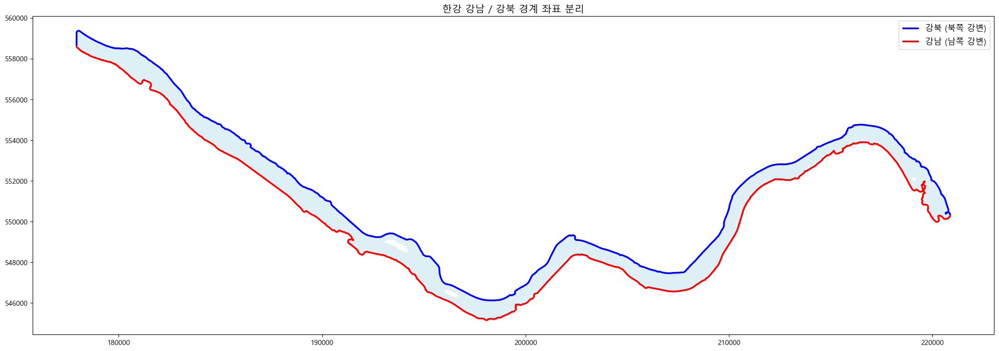


강북 좌표 예시 (경도, 위도) — 처음 5개:
[[126.75        37.6268671 ]
 [126.75000001  37.63274267]
 [126.75000562  37.63283226]
 [126.75002241  37.63292096]
 [126.75005021  37.6330079 ]]

강남 좌표 예시 (경도, 위도) — 처음 5개:
[[127.23635244  37.55199509]
 [127.23634397  37.55190679]
 [127.23632466  37.55181958]
 [127.23629469  37.55173429]
 [127.23625435  37.55165177]]


In [266]:
import numpy as np
from shapely.geometry import LineString
import geopandas as gpd
import matplotlib.pyplot as plt

# ─── 1. 한강 본류 polygon에서 외곽 좌표 추출 ───────────────────────────────
hangang_poly = hangang_final.geometry.iloc[0]

# Polygon이 아닌 경우 (MultiPolygon 등) 가장 큰 부분 선택
from shapely.geometry import MultiPolygon, Polygon
if isinstance(hangang_poly, MultiPolygon):
    hangang_poly = max(hangang_poly.geoms, key=lambda p: p.area)

coords = np.array(hangang_poly.exterior.coords)
x, y = coords[:, 0], coords[:, 1]

print(f"전체 외곽 좌표 수: {len(coords)}")
print(f"x 범위: {x.min():.0f} ~ {x.max():.0f}")
print(f"y 범위: {y.min():.0f} ~ {y.max():.0f}")

# ─── 2. 서쪽(좌) 끝 / 동쪽(우) 끝 인덱스로 외곽선을 두 경로로 분리 ────────
west_idx = int(np.argmin(x))  # x 최소 = 서쪽 끝 (행주 방면)
east_idx = int(np.argmax(x))  # x 최대 = 동쪽 끝 (광진 방면)

i1, i2 = sorted([west_idx, east_idx])

path_a = coords[i1 : i2 + 1]                          # i1 → i2 직접 경로
path_b = np.vstack([coords[i2:], coords[: i1 + 1]])   # i2 → 끝 → 처음 → i1

# ─── 3. 평균 y 값 기준으로 강북(북)/강남(남) 판별 ──────────────────────────
if path_a[:, 1].mean() > path_b[:, 1].mean():
    gangbuk_coords = path_a  # 북쪽 (y 높음)
    gangnam_coords = path_b  # 남쪽 (y 낮음)
else:
    gangbuk_coords = path_b
    gangnam_coords = path_a

print(f"\n강북 쪽 좌표 수: {len(gangbuk_coords)}")
print(f"강남 쪽 좌표 수: {len(gangnam_coords)}")

# ─── 4. GeoDataFrame 생성 ──────────────────────────────────────────────────
gangbuk_gdf = gpd.GeoDataFrame(
    geometry=[LineString(gangbuk_coords)], crs=hangang_final.crs
)
gangnam_gdf = gpd.GeoDataFrame(
    geometry=[LineString(gangnam_coords)], crs=hangang_final.crs
)

# ─── 5. 시각화 ────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(20, 8))
hangang_final.plot(ax=ax, color="lightblue", alpha=0.4, label="한강 본류")
gangbuk_gdf.plot(ax=ax, color="blue", linewidth=2.5, label="강북 (북쪽 강변)")
gangnam_gdf.plot(ax=ax, color="red",  linewidth=2.5, label="강남 (남쪽 강변)")
plt.legend(fontsize=12)
plt.title("한강 강남 / 강북 경계 좌표 분리", fontsize=14)
plt.tight_layout()
plt.show()

# ─── 6. 위경도(EPSG:4326)로 변환 ──────────────────────────────────────────
gangbuk_4326 = gangbuk_gdf.to_crs(epsg=4326)
gangnam_4326 = gangnam_gdf.to_crs(epsg=4326)

# [[경도, 위도], ...] 배열
gangbuk_latlon = np.array(gangbuk_4326.geometry.iloc[0].coords)
gangnam_latlon = np.array(gangnam_4326.geometry.iloc[0].coords)

print(f"\n강북 좌표 예시 (경도, 위도) — 처음 5개:")
print(gangbuk_latlon[:5])
print(f"\n강남 좌표 예시 (경도, 위도) — 처음 5개:")
print(gangnam_latlon[:5])


전체 외곽 좌표 수: 12204
x 범위: 177931 ~ 220885
y 범위: 545145 ~ 559366

강북 쪽 좌표 수: 5954
강남 쪽 좌표 수: 6252


D:\TEMP\ipykernel_19364\2596809961.py:54: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(fontsize=12)


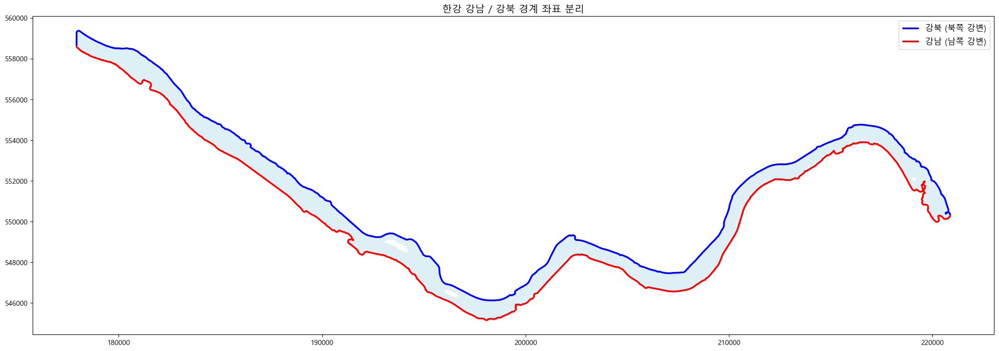


강북 좌표 예시 (경도, 위도) — 처음 5개:
[[126.75        37.6268671 ]
 [126.75000001  37.63274267]
 [126.75000562  37.63283226]
 [126.75002241  37.63292096]
 [126.75005021  37.6330079 ]]

강남 좌표 예시 (경도, 위도) — 처음 5개:
[[127.23635244  37.55199509]
 [127.23634397  37.55190679]
 [127.23632466  37.55181958]
 [127.23629469  37.55173429]
 [127.23625435  37.55165177]]


In [267]:
import numpy as np
from shapely.geometry import LineString
import geopandas as gpd
import matplotlib.pyplot as plt

# ─── 1. 한강 본류 polygon에서 외곽 좌표 추출 ───────────────────────────────
hangang_poly = hangang_final.geometry.iloc[0]

# Polygon이 아닌 경우 (MultiPolygon 등) 가장 큰 부분 선택
from shapely.geometry import MultiPolygon, Polygon
if isinstance(hangang_poly, MultiPolygon):
    hangang_poly = max(hangang_poly.geoms, key=lambda p: p.area)

coords = np.array(hangang_poly.exterior.coords)
x, y = coords[:, 0], coords[:, 1]

print(f"전체 외곽 좌표 수: {len(coords)}")
print(f"x 범위: {x.min():.0f} ~ {x.max():.0f}")
print(f"y 범위: {y.min():.0f} ~ {y.max():.0f}")

# ─── 2. 서쪽(좌) 끝 / 동쪽(우) 끝 인덱스로 외곽선을 두 경로로 분리 ────────
west_idx = int(np.argmin(x))  # x 최소 = 서쪽 끝 (행주 방면)
east_idx = int(np.argmax(x))  # x 최대 = 동쪽 끝 (광진 방면)

i1, i2 = sorted([west_idx, east_idx])

path_a = coords[i1 : i2 + 1]                          # i1 → i2 직접 경로
path_b = np.vstack([coords[i2:], coords[: i1 + 1]])   # i2 → 끝 → 처음 → i1

# ─── 3. 평균 y 값 기준으로 강북(북)/강남(남) 판별 ──────────────────────────
if path_a[:, 1].mean() > path_b[:, 1].mean():
    gangbuk_coords = path_a  # 북쪽 (y 높음)
    gangnam_coords = path_b  # 남쪽 (y 낮음)
else:
    gangbuk_coords = path_b
    gangnam_coords = path_a

print(f"\n강북 쪽 좌표 수: {len(gangbuk_coords)}")
print(f"강남 쪽 좌표 수: {len(gangnam_coords)}")

# ─── 4. GeoDataFrame 생성 ──────────────────────────────────────────────────
gangbuk_gdf = gpd.GeoDataFrame(
    geometry=[LineString(gangbuk_coords)], crs=hangang_final.crs
)
gangnam_gdf = gpd.GeoDataFrame(
    geometry=[LineString(gangnam_coords)], crs=hangang_final.crs
)

# ─── 5. 시각화 ────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(20, 8))
hangang_final.plot(ax=ax, color="lightblue", alpha=0.4, label="한강 본류")
gangbuk_gdf.plot(ax=ax, color="blue", linewidth=2.5, label="강북 (북쪽 강변)")
gangnam_gdf.plot(ax=ax, color="red",  linewidth=2.5, label="강남 (남쪽 강변)")
plt.legend(fontsize=12)
plt.title("한강 강남 / 강북 경계 좌표 분리", fontsize=14)
plt.tight_layout()
plt.show()

# ─── 6. 위경도(EPSG:4326)로 변환 ──────────────────────────────────────────
gangbuk_4326 = gangbuk_gdf.to_crs(epsg=4326)
gangnam_4326 = gangnam_gdf.to_crs(epsg=4326)

# [[경도, 위도], ...] 배열
gangbuk_latlon = np.array(gangbuk_4326.geometry.iloc[0].coords)
gangnam_latlon = np.array(gangnam_4326.geometry.iloc[0].coords)

print(f"\n강북 좌표 예시 (경도, 위도) — 처음 5개:")
print(gangbuk_latlon[:5])
print(f"\n강남 좌표 예시 (경도, 위도) — 처음 5개:")
print(gangnam_latlon[:5])


한강 geometry type: Polygon
전체 외곽 좌표 수: 12204
x 범위: 177931 ~ 220885
y 범위: 545145 ~ 559366
한강 외곽선 길이: 116.50 km


D:\TEMP\ipykernel_19364\106869351.py:57: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(fontsize=12)


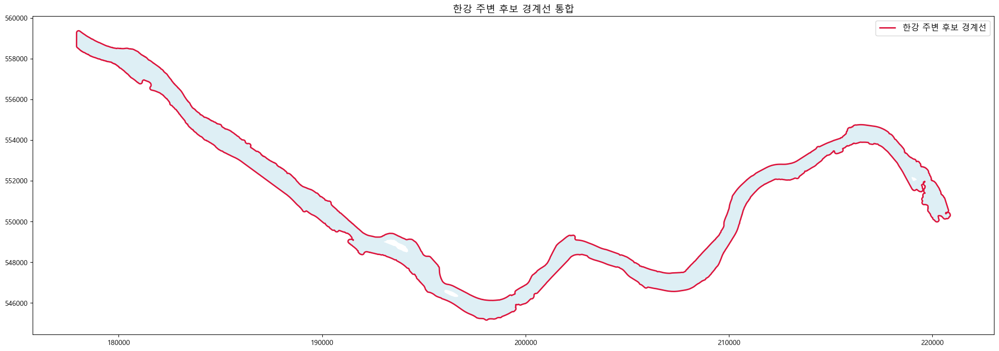


한강 주변 외곽 좌표 예시 (경도, 위도) - 처음 5개:
[[126.75234768  37.6248806 ]
 [126.75232305  37.62489421]
 [126.75225792  37.62493302]
 [126.75221044  37.6249635 ]
 [126.75220035  37.6249697 ]]


In [268]:
# 하나의 통합된 한강 경계 부분

import numpy as np
from shapely.geometry import LineString, MultiPolygon
import geopandas as gpd
import matplotlib.pyplot as plt

# ─── 1. 한강 본류 polygon 가져오기 ────────────────────────────────
hangang_poly = hangang_final.geometry.iloc[0]

# MultiPolygon이면 가장 큰 polygon만 선택
if isinstance(hangang_poly, MultiPolygon):
    hangang_poly = max(hangang_poly.geoms, key=lambda p: p.area)

print("한강 geometry type:", hangang_poly.geom_type)


# ─── 2. 한강 본류 외곽 좌표 추출 ──────────────────────────────────
coords = np.array(hangang_poly.exterior.coords)

x = coords[:, 0]
y = coords[:, 1]

print(f"전체 외곽 좌표 수: {len(coords)}")
print(f"x 범위: {x.min():.0f} ~ {x.max():.0f}")
print(f"y 범위: {y.min():.0f} ~ {y.max():.0f}")


# ─── 3. 외곽선을 하나의 LineString으로 정리 ───────────────────────
hangang_boundary_line = LineString(coords)

hangang_boundary_gdf = gpd.GeoDataFrame(
    geometry=[hangang_boundary_line],
    crs=hangang_final.crs
)

print(f"한강 외곽선 길이: {hangang_boundary_line.length / 1000:.2f} km")


# ─── 4. 시각화 ────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(20, 8))

hangang_final.plot(
    ax=ax,
    color="lightblue",
    alpha=0.4,
    label="한강 본류"
)

hangang_boundary_gdf.plot(
    ax=ax,
    color="crimson",
    linewidth=2,
    label="한강 주변 후보 경계선"
)

plt.legend(fontsize=12)
plt.title("한강 주변 후보 경계선 통합", fontsize=14)
plt.tight_layout()
plt.show()


# ─── 5. 위경도(EPSG:4326)로 변환 ─────────────────────────────────
hangang_boundary_4326 = hangang_boundary_gdf.to_crs(epsg=4326)

# [[경도, 위도], ...] 배열
hangang_boundary_latlon = np.array(
    hangang_boundary_4326.geometry.iloc[0].coords
)

print("\n한강 주변 외곽 좌표 예시 (경도, 위도) - 처음 5개:")
print(hangang_boundary_latlon[:5])

In [271]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# ─── 1. 후보점 간격 설정 ──────────────────────────────────────────
SAMPLE_INTERVAL_M = 200


# ─── 2. LineString 위에 일정 간격으로 점 생성하는 함수 ─────────────
def sample_points_along_line(line, interval_m):
    """
    LineString을 따라 interval_m 간격으로 후보점을 생성합니다.
    line은 meter 단위 좌표계여야 합니다.
    """
    line_length = line.length

    # 0m, 200m, 400m, ... 식으로 거리 생성
    distances = np.arange(
        0,
        line_length + interval_m,
        interval_m
    )

    # 마지막 값이 선 길이를 넘으면 선 끝점으로 맞춤
    distances = np.clip(distances, 0, line_length)

    # 중복 거리 제거
    distances = np.unique(distances)

    sampled_points = [
        line.interpolate(distance)
        for distance in distances
    ]

    return sampled_points


# ─── 3. 한강 외곽선에서 200m 간격 후보점 생성 ─────────────────────
hangang_boundary_line = hangang_boundary_gdf.geometry.iloc[0]

candidate_geometries = sample_points_along_line(
    hangang_boundary_line,
    SAMPLE_INTERVAL_M
)

print(f"한강 외곽선 길이: {hangang_boundary_line.length / 1000:.2f} km")
print(f"200m 간격 후보점 수: {len(candidate_geometries)}")


# ─── 4. 후보점 GeoDataFrame 생성 ──────────────────────────────────
candidate_points_gdf = gpd.GeoDataFrame(
    geometry=candidate_geometries,
    crs=hangang_boundary_gdf.crs
)

candidate_points_gdf["후보ID"] = [
    f"C{i:04d}" for i in range(1, len(candidate_points_gdf) + 1)
]


# ─── 5. 위경도 좌표로 변환 ────────────────────────────────────────
candidate_points_4326 = candidate_points_gdf.to_crs(epsg=4326).copy()

candidate_points_4326["경도"] = candidate_points_4326.geometry.x
candidate_points_4326["위도"] = candidate_points_4326.geometry.y


# ─── 6. 이후 점수화에 쓸 후보지 데이터 정리 ───────────────────────
candidate_points = candidate_points_4326[
    ["후보ID", "위도", "경도", "geometry"]
].copy()

print(f"\n최종 후보지 수: {len(candidate_points)}")
candidate_points.head()

한강 외곽선 길이: 116.50 km
200m 간격 후보점 수: 584

최종 후보지 수: 584


,후보ID,위도,경도,geometry
0,C0001,37.624881,126.752348,POINT (126.75235 37.62488)
1,C0002,37.626041,126.750617,POINT (126.75062 37.62604)
2,C0003,37.627667,126.750000,POINT (126.75 37.62767)
3,C0004,37.629469,126.750000,POINT (126.75 37.62947)
4,C0005,37.631271,126.750000,POINT (126.75 37.63127)


In [272]:
import pandas as pd
from pathlib import Path

# ─── 1. 통합 데이터 엑셀 경로 ─────────────────────────────────────
DATA_PATH = Path("최종_한강_모든_장소_통합_정보.xlsx")

print("파일 존재 여부:", DATA_PATH.exists())


# ─── 2. 시트별 데이터 불러오기 ────────────────────────────────────
excel_data = pd.read_excel(DATA_PATH, sheet_name=None)

print("시트 목록:")
print(list(excel_data.keys()))


# ─── 3. 분석에 사용할 데이터 분리 ────────────────────────────────
subway_df = excel_data["지하철역"].copy()
dock_df = excel_data["한강버스선착장"].copy()
tour_df = excel_data["관광명소"].copy()
night_df = excel_data["야경명소"].copy()
dong_df = excel_data["한강1km행정동"].copy()


# ─── 4. 데이터 개수 확인 ─────────────────────────────────────────
print("\n데이터 개수")
print("지하철역:", len(subway_df))
print("기존 한강버스 선착장:", len(dock_df))
print("관광명소:", len(tour_df))
print("야경명소:", len(night_df))
print("한강 1km 행정동:", len(dong_df))

파일 존재 여부: True
시트 목록:
['지하철역', '한강버스선착장', '관광명소', '야경명소', '한강1km행정동']

데이터 개수
지하철역: 72
기존 한강버스 선착장: 7
관광명소: 42
야경명소: 15
한강 1km 행정동: 95


In [273]:
print("지하철역 컬럼")
print(subway_df.columns.tolist())

print("\n기존 선착장 컬럼")
print(dock_df.columns.tolist())

print("\n관광명소 컬럼")
print(tour_df.columns.tolist())

print("\n야경명소 컬럼")
print(night_df.columns.tolist())

print("\n행정동 컬럼")
print(dong_df.columns.tolist())

지하철역 컬럼
['역명', '호선', '행정동', '위도', '경도', '한강거리(m)', '한강거리(km)', '하루평균_승차인원', '하루평균_하차인원', '하루평균_총이용량', '행정동_인구수', '행정동_총종사자수']

기존 선착장 컬럼
['위도', '경도', '선착장명', '주소']

관광명소 컬럼
['장소명', '위도', '경도', '한강거리(m)', '한강거리(km)', '월평균_SNS언급횟수']

야경명소 컬럼
['장소명', '위도', '경도', '한강거리(m)', '한강거리(km)', '월평균_SNS언급횟수']

행정동 컬럼
['행정동', '인구수', '총종사자수']


In [274]:
import numpy as np

# ─── 1. 위경도 거리 계산 함수: Haversine ──────────────────────────
def haversine_distance(lat1, lon1, lat2, lon2):
    """
    위도/경도 좌표 두 점 사이의 거리(m)를 계산
    """
    R = 6371000  # 지구 반지름(m)

    lat1_rad = np.radians(lat1)
    lon1_rad = np.radians(lon1)
    lat2_rad = np.radians(lat2)
    lon2_rad = np.radians(lon2)

    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad

    a = (
        np.sin(dlat / 2) ** 2
        + np.cos(lat1_rad) * np.cos(lat2_rad) * np.sin(dlon / 2) ** 2
    )

    c = 2 * np.arcsin(np.sqrt(a))

    return R * c

In [275]:
# ─── 2. 후보지별 가장 가까운 기존 선착장 찾기 ─────────────────────

nearest_dock_names = []
nearest_dock_distances = []

for _, candidate in candidate_points.iterrows():

    dock_distances = dock_df.apply(
        lambda dock: haversine_distance(
            candidate["위도"],
            candidate["경도"],
            dock["위도"],
            dock["경도"]
        ),
        axis=1
    )

    nearest_idx = dock_distances.idxmin()

    nearest_dock_names.append(
        dock_df.loc[nearest_idx, "선착장명"]
    )

    nearest_dock_distances.append(
        dock_distances.loc[nearest_idx]
    )


candidate_points["가장가까운_기존선착장"] = nearest_dock_names
candidate_points["기존선착장_최소거리(m)"] = nearest_dock_distances

candidate_points["기존선착장_최소거리(m)"] = (
    candidate_points["기존선착장_최소거리(m)"].round(1)
)

candidate_points[
    [
        "후보ID",
        "위도",
        "경도",
        "가장가까운_기존선착장",
        "기존선착장_최소거리(m)"
    ]
].head()

,후보ID,위도,경도,가장가까운_기존선착장,기존선착장_최소거리(m)
0,C0001,37.624881,126.752348,마곡,9452.7
1,C0002,37.626041,126.750617,마곡,9651.8
2,C0003,37.627667,126.750000,마곡,9801.5
3,C0004,37.629469,126.750000,마곡,9920.9
4,C0005,37.631271,126.750000,마곡,10042.9


In [276]:
candidate_points["기존선착장_최소거리(m)"].describe()

count      584.000000
mean      5079.416096
std       4537.521686
min         35.000000
25%       1423.675000
50%       3181.900000
75%       8328.300000
max      14646.800000
Name: 기존선착장_최소거리(m), dtype: float64

In [277]:
DOCK_EXCLUSION_M = 1000

for threshold in [500, 800, 1000, 1200, 1500]:
    count = (candidate_points["기존선착장_최소거리(m)"] < threshold).sum()
    print(f"{threshold}m 이내 후보 수: {count}개")

500m 이내 후보 수: 35개
800m 이내 후보 수: 61개
1000m 이내 후보 수: 90개
1200m 이내 후보 수: 119개
1500m 이내 후보 수: 160개


전체 후보 수: 584
기존 선착장 800m 이내 제외 후 후보 수: 523
제외된 후보 수: 61


D:\TEMP\ipykernel_19364\4167222839.py:44: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(fontsize=11)


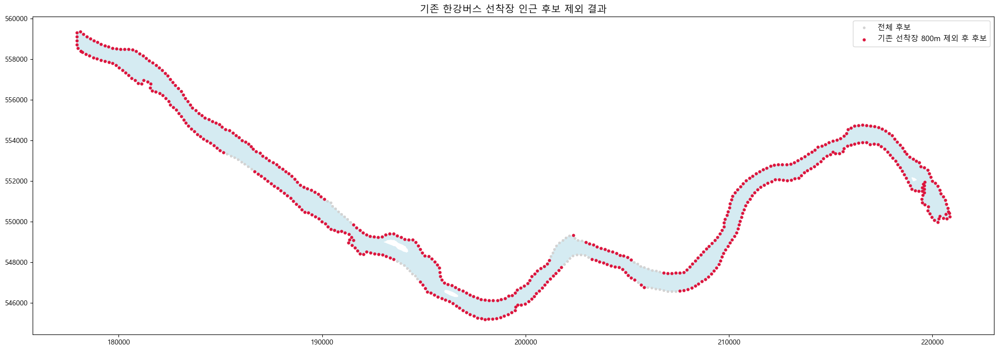

In [278]:
# ─── 기존 선착장과 너무 가까운 후보 제외 ──────────────────────────
DOCK_EXCLUSION_M = 800

candidate_points_filtered = candidate_points[
    candidate_points["기존선착장_최소거리(m)"] >= DOCK_EXCLUSION_M
].copy()

candidate_points_filtered = candidate_points_filtered.reset_index(drop=True)

print("전체 후보 수:", len(candidate_points))
print(f"기존 선착장 {DOCK_EXCLUSION_M}m 이내 제외 후 후보 수:", len(candidate_points_filtered))
print("제외된 후보 수:", len(candidate_points) - len(candidate_points_filtered))

# 제외 후 후보점 GeoDataFrame
candidate_points_filtered_gdf = gpd.GeoDataFrame(
    candidate_points_filtered,
    geometry="geometry",
    crs="EPSG:4326"
).to_crs(hangang_final.crs)

fig, ax = plt.subplots(figsize=(20, 8))

hangang_final.plot(
    ax=ax,
    color="lightblue",
    alpha=0.5,
    label="한강 본류"
)

candidate_points_gdf.plot(
    ax=ax,
    color="lightgray",
    markersize=8,
    label="전체 후보"
)

candidate_points_filtered_gdf.plot(
    ax=ax,
    color="crimson",
    markersize=12,
    label="기존 선착장 800m 제외 후 후보"
)

plt.legend(fontsize=11)
plt.title("기존 한강버스 선착장 인근 후보 제외 결과", fontsize=14)
plt.tight_layout()
plt.show()

In [279]:
# ─── 주변 모든 지하철역을 반영한 접근성 피처 ─────────────────────
SUBWAY_RADIUS_M = 1300

nearby_subway_counts = []
nearby_subway_names = []
subway_access_scores = []

for _, candidate in candidate_points_filtered.iterrows():

    # 후보지와 모든 지하철역 사이 거리 계산
    subway_temp = subway_df.copy()

    subway_temp["후보지거리(m)"] = subway_temp.apply(
        lambda station: haversine_distance(
            candidate["위도"],
            candidate["경도"],
            station["위도"],
            station["경도"]
        ),
        axis=1
    )

    # 반경 1500m 이내 지하철역만 사용
    nearby_subways = subway_temp[
        subway_temp["후보지거리(m)"] <= SUBWAY_RADIUS_M
    ].copy()

    # 거리 감쇠: 가까울수록 1에 가깝고, 1500m면 0
    nearby_subways["거리감쇠"] = (
        1 - nearby_subways["후보지거리(m)"] / SUBWAY_RADIUS_M
    )

    # 각 역의 기여 점수
    nearby_subways["지하철역_기여점수"] = (
        nearby_subways["하루평균_총이용량"]
        * nearby_subways["거리감쇠"]
    )

    # 후보지 단위 요약
    nearby_subway_counts.append(len(nearby_subways))

    nearby_subway_names.append(
        ", ".join(nearby_subways["역명"].astype(str).tolist())
    )

    subway_access_scores.append(
        nearby_subways["지하철역_기여점수"].sum()
    )


# 후보지 데이터에 붙이기
candidate_points_filtered["주변_지하철역_개수"] = nearby_subway_counts
candidate_points_filtered["주변_지하철역_목록"] = nearby_subway_names
candidate_points_filtered["지하철_접근성_피처"] = subway_access_scores

candidate_points_filtered[
    [
        "후보ID",
        "주변_지하철역_개수",
        "주변_지하철역_목록",
        "지하철_접근성_피처"
    ]
].sort_values(
    "지하철_접근성_피처",
    ascending=False
).head(10)

,후보ID,주변_지하철역_개수,주변_지하철역_목록,지하철_접근성_피처
396,C0442,5,"고속터미널, 잠원, 반포, 신반포, 서빙고",59538.210488
169,C0198,2,"구의(광진구청), 강변(동서울터미널)",57005.925959
395,C0441,4,"고속터미널, 잠원, 반포, 신반포",54220.646626
360,C0389,3,"잠실(송파구청), 잠실나루, 몽촌토성(평화의문)",54191.384297
168,C0197,2,"구의(광진구청), 강변(동서울터미널)",53721.927248
170,C0199,3,"구의(광진구청), 강변(동서울터미널), 광나루(장신대)",52731.028837
85,C0095,2,"합정, 망원",52380.623458
361,C0390,2,"잠실(송파구청), 잠실나루",52241.491331
437,C0491,2,"당산, 국회의사당",51986.778453
87,C0097,2,"합정, 상수",51383.157770


In [280]:
candidate_points_filtered["주변_지하철역_개수"].describe()

count    523.000000
mean       1.114723
std        1.325492
min        0.000000
25%        0.000000
50%        0.000000
75%        2.000000
max        5.000000
Name: 주변_지하철역_개수, dtype: float64

In [281]:
no_subway_count = (
    candidate_points_filtered["주변_지하철역_개수"] == 0
).sum()

print("반경 1300m 내 지하철역이 없는 후보 수:", no_subway_count)

반경 1300m 내 지하철역이 없는 후보 수: 270


In [282]:
# ─── 주변 인구 / 직장인 피처 설정 ─────────────────────────────────
POP_WORK_RADIUS_M = 1300

nearby_dong_counts = []
nearby_dong_names = []
population_scores = []
worker_scores = []

for _, candidate in candidate_points_filtered.iterrows():

    subway_temp = subway_df.copy()

    # 후보지와 각 지하철역 사이 거리 계산
    subway_temp["후보지거리(m)"] = subway_temp.apply(
        lambda station: haversine_distance(
            candidate["위도"],
            candidate["경도"],
            station["위도"],
            station["경도"]
        ),
        axis=1
    )

    # 반경 안 지하철역만 사용
    nearby_subways = subway_temp[
        subway_temp["후보지거리(m)"] <= POP_WORK_RADIUS_M
    ].copy()

    # 주변 지하철역이 하나도 없는 후보 처리
    if len(nearby_subways) == 0:
        nearby_dong_counts.append(0)
        nearby_dong_names.append("")
        population_scores.append(0)
        worker_scores.append(0)
        continue

    # 같은 행정동이 여러 역으로 중복될 수 있으므로 행정동별 대표값 생성
    nearby_dongs = (
        nearby_subways
        .groupby("행정동", as_index=False)
        .agg({
            "후보지거리(m)": "min",          # 해당 행정동 역 중 가장 가까운 거리
            "행정동_인구수": "max",           # 같은 행정동 값 중복 방지
            "행정동_총종사자수": "max"
        })
    )

    # 거리 감쇠
    nearby_dongs["거리감쇠"] = (
        1 - nearby_dongs["후보지거리(m)"] / POP_WORK_RADIUS_M
    )

    nearby_dongs["거리감쇠"] = nearby_dongs["거리감쇠"].clip(lower=0)

    # 인구 / 직장인 피처 계산
    population_score = (
        nearby_dongs["행정동_인구수"]
        * nearby_dongs["거리감쇠"]
    ).sum()

    worker_score = (
        nearby_dongs["행정동_총종사자수"]
        * nearby_dongs["거리감쇠"]
    ).sum()

    nearby_dong_counts.append(len(nearby_dongs))

    nearby_dong_names.append(
        ", ".join(nearby_dongs["행정동"].astype(str).tolist())
    )

    population_scores.append(population_score)
    worker_scores.append(worker_score)


# 후보지 데이터에 붙이기
candidate_points_filtered["주변_행정동_개수"] = nearby_dong_counts
candidate_points_filtered["주변_행정동_목록"] = nearby_dong_names
candidate_points_filtered["인구_피처"] = population_scores
candidate_points_filtered["직장인_피처"] = worker_scores


# 직장인 수가 큰 피처대로 나열

candidate_points_filtered[
    [
        "후보ID",
        "주변_행정동_개수",
        "주변_행정동_목록",
        "인구_피처",
        "직장인_피처"
    ]
].sort_values(
    "직장인_피처",
    ascending=False
).head(10)

,후보ID,주변_행정동_개수,주변_행정동_목록,인구_피처,직장인_피처
432,C0486,1,여의동,14287.291407,80781.786077
431,C0485,1,여의동,13983.652415,79064.980601
430,C0484,1,여의동,13688.577319,77396.596258
433,C0487,2,"당산2동, 여의동",16008.915113,74588.200377
428,C0482,1,여의동,12343.085114,69789.047677
429,C0483,1,여의동,12041.826306,68085.700001
434,C0488,2,"당산2동, 여의동",18377.267039,63010.828902
427,C0473,2,"노량진1동, 여의동",17811.878352,61714.173128
436,C0490,2,"당산2동, 여의동",24902.649462,51489.187441
435,C0489,2,"당산2동, 여의동",19950.164835,47761.783600


In [283]:
# 인구 피처가 큰 후보 순서로 나열

candidate_points_filtered[
    [
        "후보ID",
        "주변_행정동_개수",
        "주변_행정동_목록",
        "인구_피처",
        "직장인_피처"
    ]
].sort_values(
    "인구_피처",
    ascending=False
).head(10)

,후보ID,주변_행정동_개수,주변_행정동_목록,인구_피처,직장인_피처
417,C0463,2,"노량진1동, 흑석동",34885.268350,9783.248079
416,C0462,2,"노량진1동, 흑석동",34650.149707,10243.086195
418,C0464,2,"노량진1동, 흑석동",34649.244978,9205.568103
415,C0461,2,"노량진1동, 흑석동",33706.703934,10484.181048
419,C0465,2,"노량진1동, 흑석동",33408.759989,8401.495003
414,C0460,2,"노량진1동, 흑석동",30418.250556,9932.753382
420,C0466,2,"노량진1동, 흑석동",29413.600496,6975.232716
169,C0198,2,"구의1동, 구의3동",28466.682529,12972.869023
440,C0494,2,"당산2동, 양평2동",26685.213614,20894.831934
170,C0199,3,"광장동, 구의1동, 구의3동",26620.541723,12345.865435


In [284]:
# ─── 관광명소 / 야경명소 장소 접근성 피처 ────────────────────────
PLACE_RADIUS_M = 1300

# ─── 1. 관광명소 / 야경명소 데이터에 유형 표시 ────────────────────

tour_place_df = tour_df.copy()
tour_place_df["장소유형"] = "관광명소"

night_place_df = night_df.copy()
night_place_df["장소유형"] = "야경명소"

place_df = pd.concat(
    [tour_place_df, night_place_df],
    ignore_index=True
)

print("전체 장소 수:", len(place_df))
print(place_df["장소유형"].value_counts())

# ─── 2. 후보지별 주변 장소 계산 ───────────────────────────────────

nearby_place_counts = []
nearby_place_names = []

tour_place_counts = []
night_place_counts = []

tour_place_scores = []
night_place_scores = []
place_access_scores = []

for _, candidate in candidate_points_filtered.iterrows():

    place_temp = place_df.copy()

    # 후보지와 각 장소 사이 거리 계산
    place_temp["후보지거리(m)"] = place_temp.apply(
        lambda place: haversine_distance(
            candidate["위도"],
            candidate["경도"],
            place["위도"],
            place["경도"]
        ),
        axis=1
    )

    # 반경 이내 장소만 선택
    nearby_places = place_temp[
        place_temp["후보지거리(m)"] <= PLACE_RADIUS_M
    ].copy()

    # 반경 안 장소가 없는 후보 처리
    if len(nearby_places) == 0:
        nearby_place_counts.append(0)
        nearby_place_names.append("")

        tour_place_counts.append(0)
        night_place_counts.append(0)

        tour_place_scores.append(0)
        night_place_scores.append(0)
        place_access_scores.append(0)

        continue

    # 가까울수록 점수가 커지도록 거리 감쇠
    nearby_places["거리감쇠"] = (
        1 - nearby_places["후보지거리(m)"] / PLACE_RADIUS_M
    )

    nearby_places["거리감쇠"] = nearby_places["거리감쇠"].clip(lower=0)

    # 관광명소 / 야경명소 분리
    nearby_tour_places = nearby_places[
        nearby_places["장소유형"] == "관광명소"
    ].copy()

    nearby_night_places = nearby_places[
        nearby_places["장소유형"] == "야경명소"
    ].copy()

    # 개수
    nearby_place_counts.append(len(nearby_places))
    tour_place_counts.append(len(nearby_tour_places))
    night_place_counts.append(len(nearby_night_places))

    # 장소 목록
    nearby_place_names.append(
        ", ".join(nearby_places["장소명"].astype(str).tolist())
    )

    # 장소 접근성 피처
    tour_score = nearby_tour_places["거리감쇠"].sum()
    night_score = nearby_night_places["거리감쇠"].sum()

    tour_place_scores.append(tour_score)
    night_place_scores.append(night_score)

    # 관광명소와 야경명소를 같은 비중으로 합산
    place_access_scores.append(tour_score + night_score)


# ─── 3. 후보지 DataFrame에 붙이기 ─────────────────────────────────

candidate_points_filtered["주변_장소_개수"] = nearby_place_counts
candidate_points_filtered["주변_장소_목록"] = nearby_place_names

candidate_points_filtered["관광명소_개수"] = tour_place_counts
candidate_points_filtered["야경명소_개수"] = night_place_counts

candidate_points_filtered["관광명소_피처"] = tour_place_scores
candidate_points_filtered["야경명소_피처"] = night_place_scores

candidate_points_filtered["장소_접근성_피처"] = place_access_scores

candidate_points_filtered[
    [
        "후보ID",
        "주변_장소_개수",
        "관광명소_개수",
        "야경명소_개수",
        "주변_장소_목록",
        "관광명소_피처",
        "야경명소_피처",
        "장소_접근성_피처"
    ]
].sort_values(
    "장소_접근성_피처",
    ascending=False
).head(10)

전체 장소 수: 57
장소유형
관광명소    42
야경명소    15
Name: count, dtype: int64


,후보ID,주변_장소_개수,관광명소_개수,야경명소_개수,주변_장소_목록,관광명소_피처,야경명소_피처,장소_접근성_피처
399,C0445,5,4,1,"반포한강공원, 센트럴시티, 고투몰, 세빛섬, 세빛섬",2.179207,0.878786,3.057993
398,C0444,5,4,1,"반포한강공원, 센트럴시티, 고투몰, 세빛섬, 세빛섬",2.047312,0.968410,3.015722
397,C0443,5,4,1,"반포한강공원, 센트럴시티, 고투몰, 세빛섬, 세빛섬",2.036455,0.884468,2.920923
400,C0446,6,5,1,"반포한강공원, 센트럴시티, 고투몰, 세빛섬, 서래마을카페거리, 세빛섬",2.054088,0.756916,2.811004
418,C0464,5,1,4,"노들섬, 노들섬복합문화공간, 이촌한강공원, 용양봉저정 공원, 사육신공원",0.696749,1.970931,2.667680
419,C0465,4,1,3,"노들섬, 노들섬복합문화공간, 용양봉저정 공원, 사육신공원",0.699510,1.942644,2.642153
396,C0442,5,4,1,"반포한강공원, 센트럴시티, 고투몰, 세빛섬, 세빛섬",1.814351,0.733501,2.547852
417,C0463,5,1,4,"노들섬, 노들섬복합문화공간, 이촌한강공원, 용양봉저정 공원, 사육신공원",0.614815,1.911973,2.526788
420,C0466,5,2,3,"노들섬, 63스퀘어, 노들섬복합문화공간, 용양봉저정 공원, 사육신공원",0.671586,1.849028,2.520614
421,C0467,6,3,3,"노들섬, 63스퀘어, 노량진수산물도매시장, 노들섬복합문화공간, 용양봉저정 공원, 사...",0.823263,1.657628,2.480890


In [285]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# ─── 1. 후보점 샘플링 간격 설정 ───────────────────────────────────
SAMPLE_INTERVAL_M = 200


# ─── 2. LineString을 따라 일정 간격으로 후보점 생성하는 함수 ───────
def sample_points_along_line(line, interval_m):
    """
    LineString을 따라 interval_m 간격으로 Point 후보를 생성합니다.
    line은 meter 단위 좌표계여야 합니다.
    """
    line_length = line.length

    # 0m, 200m, 400m, ... 거리 만들기
    distances = np.arange(
        0,
        line_length + interval_m,
        interval_m
    )

    # 마지막 값이 선 길이를 넘으면 선 끝점으로 고정
    distances = np.clip(distances, 0, line_length)

    # 중복 거리 제거
    distances = np.unique(distances)

    sampled_points = [
        line.interpolate(distance)
        for distance in distances
    ]

    return sampled_points


# ─── 3. 북쪽 / 남쪽 강변 LineString 가져오기 ──────────────────────
north_river_line = gangbuk_gdf.geometry.iloc[0]
south_river_line = gangnam_gdf.geometry.iloc[0]

print(f"북쪽 강변 길이: {north_river_line.length / 1000:.2f} km")
print(f"남쪽 강변 길이: {south_river_line.length / 1000:.2f} km")


# ─── 4. 북쪽 / 남쪽 강변에서 각각 200m 후보점 생성 ────────────────
north_candidate_geometries = sample_points_along_line(
    north_river_line,
    SAMPLE_INTERVAL_M
)

south_candidate_geometries = sample_points_along_line(
    south_river_line,
    SAMPLE_INTERVAL_M
)

print(f"북쪽 강변 후보점 수: {len(north_candidate_geometries)}")
print(f"남쪽 강변 후보점 수: {len(south_candidate_geometries)}")


# ─── 5. 북쪽 후보 GeoDataFrame ────────────────────────────────────
north_candidates_gdf = gpd.GeoDataFrame(
    {
        "강변구분": ["북쪽"] * len(north_candidate_geometries)
    },
    geometry=north_candidate_geometries,
    crs=gangbuk_gdf.crs
)


# ─── 6. 남쪽 후보 GeoDataFrame ────────────────────────────────────
south_candidates_gdf = gpd.GeoDataFrame(
    {
        "강변구분": ["남쪽"] * len(south_candidate_geometries)
    },
    geometry=south_candidate_geometries,
    crs=gangnam_gdf.crs
)


# ─── 7. 후보점 하나의 GeoDataFrame으로 통합 ───────────────────────
candidate_points_gdf = pd.concat(
    [north_candidates_gdf, south_candidates_gdf],
    ignore_index=True
)

candidate_points_gdf = gpd.GeoDataFrame(
    candidate_points_gdf,
    geometry="geometry",
    crs=gangbuk_gdf.crs
)

candidate_points_gdf["후보ID"] = [
    f"C{i:04d}" for i in range(1, len(candidate_points_gdf) + 1)
]


# ─── 8. 위경도(EPSG:4326)로 변환 ──────────────────────────────────
candidate_points_4326 = candidate_points_gdf.to_crs(epsg=4326).copy()

candidate_points_4326["경도"] = candidate_points_4326.geometry.x
candidate_points_4326["위도"] = candidate_points_4326.geometry.y


# ─── 9. 이후 피처 계산에 사용할 후보 DataFrame ────────────────────
candidate_points = candidate_points_4326[
    [
        "후보ID",
        "강변구분",
        "위도",
        "경도",
        "geometry"
    ]
].copy()

print(f"\n전체 후보점 수: {len(candidate_points)}")
print(candidate_points["강변구분"].value_counts())

candidate_points.head()

북쪽 강변 길이: 57.41 km
남쪽 강변 길이: 59.09 km
북쪽 강변 후보점 수: 289
남쪽 강변 후보점 수: 297

전체 후보점 수: 586
강변구분
남쪽    297
북쪽    289
Name: count, dtype: int64


,후보ID,강변구분,위도,경도,geometry
0,C0001,북쪽,37.626867,126.750000,POINT (126.75 37.62687)
1,C0002,북쪽,37.628669,126.750000,POINT (126.75 37.62867)
2,C0003,북쪽,37.630471,126.750000,POINT (126.75 37.63047)
3,C0004,북쪽,37.632273,126.750000,POINT (126.75 37.63227)
4,C0005,북쪽,37.633639,126.751029,POINT (126.75103 37.63364)


D:\TEMP\ipykernel_19364\1589857626.py:42: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(fontsize=11)


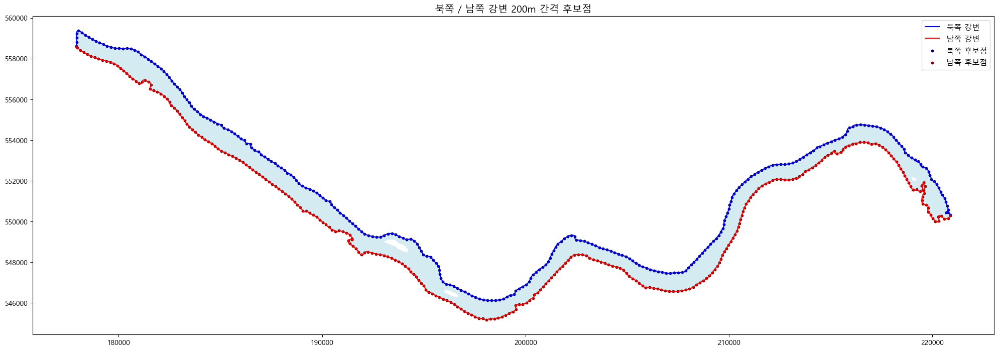

In [286]:
fig, ax = plt.subplots(figsize=(20, 8))

hangang_final.plot(
    ax=ax,
    color="lightblue",
    alpha=0.5,
    label="한강 본류"
)

gangbuk_gdf.plot(
    ax=ax,
    color="blue",
    linewidth=1.5,
    label="북쪽 강변"
)

gangnam_gdf.plot(
    ax=ax,
    color="red",
    linewidth=1.5,
    label="남쪽 강변"
)

candidate_points_gdf[
    candidate_points_gdf["강변구분"] == "북쪽"
].plot(
    ax=ax,
    color="navy",
    markersize=10,
    label="북쪽 후보점"
)

candidate_points_gdf[
    candidate_points_gdf["강변구분"] == "남쪽"
].plot(
    ax=ax,
    color="darkred",
    markersize=10,
    label="남쪽 후보점"
)

plt.legend(fontsize=11)
plt.title("북쪽 / 남쪽 강변 200m 간격 후보점", fontsize=14)
plt.tight_layout()
plt.show()

In [287]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
from pathlib import Path

# ─── 1. 통합 엑셀 불러오기 ────────────────────────────────────────
DATA_PATH = Path("최종_한강_모든_장소_통합_정보.xlsx")

excel_data = pd.read_excel(DATA_PATH, sheet_name=None)

subway_df = excel_data["지하철역"].copy()
dock_df = excel_data["한강버스선착장"].copy()
tour_df = excel_data["관광명소"].copy()
night_df = excel_data["야경명소"].copy()
dong_df = excel_data["한강1km행정동"].copy()

print("지하철역 수:", len(subway_df))
print("기존 선착장 수:", len(dock_df))
print("관광명소 수:", len(tour_df))
print("야경명소 수:", len(night_df))

지하철역 수: 72
기존 선착장 수: 7
관광명소 수: 42
야경명소 수: 15


In [330]:
# ─── 기존 선착장 위치 정보 업데이트 ───────────────────────────────
# 통합 엑셀의 한강버스선착장 시트 대신
# 최신 선착장 위치 엑셀의 위도/경도를 사용

UPDATED_DOCK_PATH = "서울특별시 한강버스 선착장 정보.xlsx"

updated_dock_df = pd.read_excel(UPDATED_DOCK_PATH).copy()

# 이후 기존 코드와 맞추기 위해 필요한 컬럼만 dock_df로 정리
dock_df = updated_dock_df[
    [
        "선착장명",
        "주소",
        "위도",
        "경도"
    ]
].copy()

print("업데이트된 기존 선착장 수:", len(dock_df))
dock_df

업데이트된 기존 선착장 수: 7


,선착장명,주소,위도,경도
0,마곡,서울특별시 강서구 가양동 441,37.574851,126.844147
1,망원,서울특별시 마포구 망원동 205-8,37.553748,126.895687
2,여의도,서울특별시 영등포구 여의도동 85-1,37.528392,126.935152
3,옥수,서울특별시 성동구 옥수동 86,37.539265,127.017772
4,압구정,서울특별시 강남구 압구정동 380-1,37.526561,127.016701
5,뚝섬,서울특별시 광진구 자양동 126-1,37.528571,127.067339
6,잠실,서울특별시 송파구 잠실동 1-2,37.518639,127.084704


In [331]:
# ─── 2. 기존 선착장 GeoDataFrame 생성 ─────────────────────────────

dock_points_gdf = gpd.GeoDataFrame(
    dock_df.copy(),
    geometry=gpd.points_from_xy(
        dock_df["경도"],
        dock_df["위도"]
    ),
    crs="EPSG:4326"
)

# 한강 강변 선과 같은 좌표계로 변환
dock_points_projected = dock_points_gdf.to_crs(gangbuk_gdf.crs)

dock_points_projected.head()

,선착장명,주소,위도,경도,geometry
0,마곡,서울특별시 강서구 가양동 441,37.574851,126.844147,POINT (186232.393 552823.085)
1,망원,서울특별시 마포구 망원동 205-8,37.553748,126.895687,POINT (190782.691 550474.596)
2,여의도,서울특별시 영등포구 여의도동 85-1,37.528392,126.935152,POINT (194267.958 547657.251)
3,옥수,서울특별시 성동구 옥수동 86,37.539265,127.017772,POINT (201570.674 548862.192)
4,압구정,서울특별시 강남구 압구정동 380-1,37.526561,127.016701,POINT (201476.27 547452.188)


In [332]:
# ─── 3. 기존 선착장 강변구분 판별 ────────────────────────────────

north_line = gangbuk_gdf.geometry.iloc[0]
south_line = gangnam_gdf.geometry.iloc[0]

dock_points_projected["북쪽강변_거리(m)"] = (
    dock_points_projected.geometry.distance(north_line)
)

dock_points_projected["남쪽강변_거리(m)"] = (
    dock_points_projected.geometry.distance(south_line)
)

dock_points_projected["강변구분"] = dock_points_projected.apply(
    lambda row: "북쪽"
    if row["북쪽강변_거리(m)"] <= row["남쪽강변_거리(m)"]
    else "남쪽",
    axis=1
)

dock_points_projected["선착장ID"] = [
    f"D{i:03d}" for i in range(1, len(dock_points_projected) + 1)
]

dock_points_projected[
    [
        "선착장ID",
        "선착장명",
        "강변구분",
        "북쪽강변_거리(m)",
        "남쪽강변_거리(m)"
    ]
]

,선착장ID,선착장명,강변구분,북쪽강변_거리(m),남쪽강변_거리(m)
0,D001,마곡,남쪽,816.158079,21.952812
1,D002,망원,북쪽,32.609347,853.623926
2,D003,여의도,남쪽,1001.908640,3.645193
3,D004,옥수,북쪽,2.625103,903.505444
4,D005,압구정,남쪽,632.165219,3.896789
5,D006,뚝섬,북쪽,21.692793,779.496900
6,D007,잠실,남쪽,897.392855,11.018713


In [333]:
# ─── 4. 위경도 상태의 기존 선착장 데이터 정리 ─────────────────────

dock_points = dock_points_projected.to_crs(epsg=4326).copy()

dock_points["경도"] = dock_points.geometry.x
dock_points["위도"] = dock_points.geometry.y

dock_points = dock_points[
    [
        "선착장ID",
        "선착장명",
        "강변구분",
        "위도",
        "경도",
        "주소",
        "geometry"
    ]
].copy()

dock_points

,선착장ID,선착장명,강변구분,위도,경도,주소,geometry
0,D001,마곡,남쪽,37.574851,126.844147,서울특별시 강서구 가양동 441,POINT (126.84415 37.57485)
1,D002,망원,북쪽,37.553748,126.895687,서울특별시 마포구 망원동 205-8,POINT (126.89569 37.55375)
2,D003,여의도,남쪽,37.528392,126.935152,서울특별시 영등포구 여의도동 85-1,POINT (126.93515 37.52839)
3,D004,옥수,북쪽,37.539265,127.017772,서울특별시 성동구 옥수동 86,POINT (127.01777 37.53926)
4,D005,압구정,남쪽,37.526561,127.016701,서울특별시 강남구 압구정동 380-1,POINT (127.0167 37.52656)
5,D006,뚝섬,북쪽,37.528571,127.067339,서울특별시 광진구 자양동 126-1,POINT (127.06734 37.52857)
6,D007,잠실,남쪽,37.518639,127.084704,서울특별시 송파구 잠실동 1-2,POINT (127.0847 37.51864)


D:\TEMP\ipykernel_19364\2787455083.py:52: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(fontsize=11)


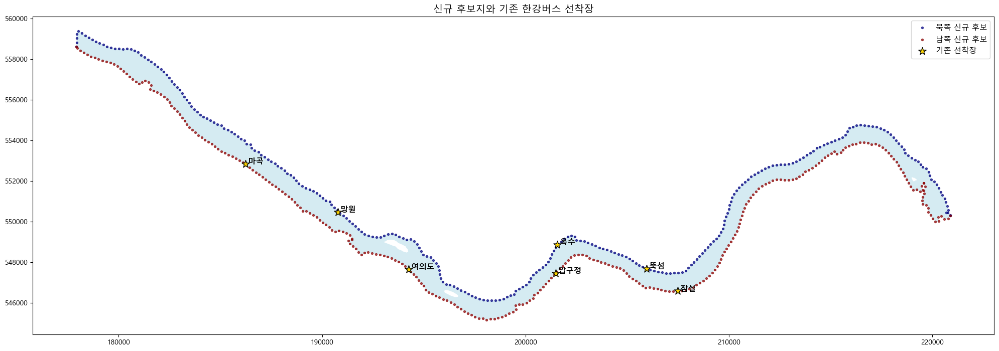

In [334]:
fig, ax = plt.subplots(figsize=(20, 8))

hangang_final.plot(
    ax=ax,
    color="lightblue",
    alpha=0.5,
    label="한강 본류"
)

# 신규 후보지
candidate_points_gdf[
    candidate_points_gdf["강변구분"] == "북쪽"
].plot(
    ax=ax,
    color="navy",
    markersize=8,
    alpha=0.7,
    label="북쪽 신규 후보"
)

candidate_points_gdf[
    candidate_points_gdf["강변구분"] == "남쪽"
].plot(
    ax=ax,
    color="darkred",
    markersize=8,
    alpha=0.7,
    label="남쪽 신규 후보"
)

# 기존 선착장
dock_points_projected.plot(
    ax=ax,
    color="gold",
    edgecolor="black",
    markersize=130,
    marker="*",
    label="기존 선착장"
)

# 선착장 이름 표시
for _, row in dock_points_projected.iterrows():
    ax.text(
        row.geometry.x,
        row.geometry.y,
        f" {row['선착장명']}",
        fontsize=11,
        fontweight="bold",
        color="black"
    )

plt.legend(fontsize=11)
plt.title("신규 후보지와 기존 한강버스 선착장", fontsize=14)
plt.tight_layout()
plt.show()

In [335]:
# ─── 1. 지하철역 GeoDataFrame 생성 ────────────────────────────────

subway_points_gdf = gpd.GeoDataFrame(
    subway_df.copy(),
    geometry=gpd.points_from_xy(
        subway_df["경도"],
        subway_df["위도"]
    ),
    crs="EPSG:4326"
)

# 한강 강변 LineString과 같은 좌표계로 변환
subway_points_projected = subway_points_gdf.to_crs(gangbuk_gdf.crs)

# ─── 2. 지하철역 북쪽 / 남쪽 강변 판별 ────────────────────────────

north_line = gangbuk_gdf.geometry.iloc[0]
south_line = gangnam_gdf.geometry.iloc[0]

subway_points_projected["북쪽강변_거리(m)"] = (
    subway_points_projected.geometry.distance(north_line)
)

subway_points_projected["남쪽강변_거리(m)"] = (
    subway_points_projected.geometry.distance(south_line)
)

subway_points_projected["강변구분"] = subway_points_projected.apply(
    lambda row: "북쪽"
    if row["북쪽강변_거리(m)"] <= row["남쪽강변_거리(m)"]
    else "남쪽",
    axis=1
)

subway_points_projected[
    [
        "역명",
        "행정동",
        "강변구분",
        "북쪽강변_거리(m)",
        "남쪽강변_거리(m)"
    ]
].head(20)

,역명,행정동,강변구분,북쪽강변_거리(m),남쪽강변_거리(m)
0,잠실(송파구청),잠실6동,남쪽,1954.801659,1063.003909
1,홍대입구,서교동,북쪽,1479.506538,2586.470212
2,고속터미널,반포4동,남쪽,1554.882106,885.314138
3,성수,성수2가3동,북쪽,1117.590631,1747.851668
4,여의도,여의동,남쪽,2224.529464,1182.086997
5,용산,한강로동,북쪽,1081.675033,1857.348501
6,합정,합정동,북쪽,620.534285,1161.870954
7,천호(풍납토성),성내2동,남쪽,1477.757921,822.907917
8,공덕,도화동,북쪽,1063.221352,2159.064695
9,당산,당산2동,남쪽,1357.912688,457.329822


In [336]:
# ─── 3. 지하철역 계산용 DataFrame 정리 ────────────────────────────

subway_points = subway_points_projected.to_crs(epsg=4326).copy()

subway_points["경도"] = subway_points.geometry.x
subway_points["위도"] = subway_points.geometry.y

subway_points = subway_points[
    [
        "역명",
        "호선",
        "행정동",
        "강변구분",
        "위도",
        "경도",
        "하루평균_총이용량",
        "행정동_인구수",
        "행정동_총종사자수",
        "geometry"
    ]
].copy()

# ─── 4. 지하철 피처 계산 함수 ─────────────────────────────────────

SUBWAY_RADIUS_M = 1500

def add_subway_features(points_df, subway_points, radius_m=1300):
    """
    각 지점별로 같은 강변의 주변 모든 지하철역을 사용해
    지하철 접근성 피처를 계산합니다.
    """

    result_df = points_df.copy()

    nearby_subway_counts = []
    nearby_subway_names = []
    subway_access_scores = []

    nearest_subway_names = []
    nearest_subway_distances = []

    for _, point in result_df.iterrows():

        # 같은 강변의 지하철역만 사용
        same_side_subways = subway_points[
            subway_points["강변구분"] == point["강변구분"]
        ].copy()

        # 지점과 같은 강변 지하철역들의 거리 계산
        same_side_subways["지점거리(m)"] = same_side_subways.apply(
            lambda station: haversine_distance(
                point["위도"],
                point["경도"],
                station["위도"],
                station["경도"]
            ),
            axis=1
        )

        # 가장 가까운 같은 강변 지하철역 기록
        nearest_idx = same_side_subways["지점거리(m)"].idxmin()

        nearest_subway_names.append(
            same_side_subways.loc[nearest_idx, "역명"]
        )

        nearest_subway_distances.append(
            same_side_subways.loc[nearest_idx, "지점거리(m)"]
        )

        # 반경 이내 같은 강변 지하철역만 사용
        nearby_subways = same_side_subways[
            same_side_subways["지점거리(m)"] <= radius_m
        ].copy()

        # 거리 감쇠
        nearby_subways["거리감쇠"] = (
            1 - nearby_subways["지점거리(m)"] / radius_m
        )

        nearby_subways["거리감쇠"] = nearby_subways["거리감쇠"].clip(lower=0)

        # 각 역 기여점수
        nearby_subways["지하철역_기여점수"] = (
            nearby_subways["하루평균_총이용량"]
            * nearby_subways["거리감쇠"]
        )

        nearby_subway_counts.append(len(nearby_subways))

        nearby_subway_names.append(
            ", ".join(nearby_subways["역명"].astype(str).tolist())
        )

        subway_access_scores.append(
            nearby_subways["지하철역_기여점수"].sum()
        )

    result_df["가장가까운_같은강변_지하철역"] = nearest_subway_names
    result_df["가장가까운_같은강변_지하철역_거리(m)"] = nearest_subway_distances

    result_df["주변_지하철역_개수"] = nearby_subway_counts
    result_df["주변_지하철역_목록"] = nearby_subway_names
    result_df["지하철_접근성_피처"] = subway_access_scores

    result_df["가장가까운_같은강변_지하철역_거리(m)"] = (
        result_df["가장가까운_같은강변_지하철역_거리(m)"].round(1)
    )

    return result_df

# ─── 5. 신규 후보지 지하철 피처 계산 ──────────────────────────────

candidate_points_scored = add_subway_features(
    candidate_points,
    subway_points,
    radius_m=SUBWAY_RADIUS_M
)

candidate_points_scored[
    [
        "후보ID",
        "강변구분",
        "가장가까운_같은강변_지하철역",
        "가장가까운_같은강변_지하철역_거리(m)",
        "주변_지하철역_개수",
        "주변_지하철역_목록",
        "지하철_접근성_피처"
    ]
].sort_values(
    "지하철_접근성_피처",
    ascending=False
).head(10)

,후보ID,강변구분,가장가까운_같은강변_지하철역,가장가까운_같은강변_지하철역_거리(m),주변_지하철역_개수,주변_지하철역_목록,지하철_접근성_피처
388,C0389,남쪽,잠실나루,515.8,3,"잠실(송파구청), 잠실나루, 몽촌토성(평화의문)",79588.129059
440,C0441,남쪽,고속터미널,892.3,4,"고속터미널, 잠원, 반포, 신반포",79313.055911
389,C0390,남쪽,잠실나루,627.0,3,"잠실(송파구청), 잠실나루, 몽촌토성(평화의문)",75865.809978
387,C0388,남쪽,잠실나루,485.2,3,"잠실(송파구청), 잠실나루, 몽촌토성(평화의문)",74189.903817
441,C0442,남쪽,고속터미널,922.8,4,"고속터미널, 잠원, 반포, 신반포",73617.594021
390,C0391,남쪽,잠실나루,773.2,3,"잠실(송파구청), 잠실새내, 잠실나루",72883.777220
439,C0440,남쪽,잠원,818.1,4,"고속터미널, 잠원, 반포, 신반포",69839.313037
391,C0392,남쪽,잠실나루,932.3,3,"잠실(송파구청), 잠실새내, 잠실나루",67885.195482
438,C0439,남쪽,잠원,690.4,4,"고속터미널, 신사, 잠원, 반포",65729.000091
93,C0094,북쪽,합정,621.0,3,"합정, 망원, 상수",65367.902042


In [337]:
# ─── 6. 실제 선착장 지하철 피처 계산 ──────────────────────────────

dock_points_scored = add_subway_features(
    dock_points,
    subway_points,
    radius_m=SUBWAY_RADIUS_M
)

dock_points_scored[
    [
        "선착장ID",
        "선착장명",
        "강변구분",
        "가장가까운_같은강변_지하철역",
        "가장가까운_같은강변_지하철역_거리(m)",
        "주변_지하철역_개수",
        "주변_지하철역_목록",
        "지하철_접근성_피처"
    ]
].sort_values(
    "지하철_접근성_피처",
    ascending=False
)

,선착장ID,선착장명,강변구분,가장가까운_같은강변_지하철역,가장가까운_같은강변_지하철역_거리(m),주변_지하철역_개수,주변_지하철역_목록,지하철_접근성_피처
2,D003,여의도,남쪽,여의나루,245.2,3,"여의도, 여의나루, 샛강",46579.930427
6,D007,잠실,남쪽,잠실새내,783.7,2,"잠실새내, 종합운동장",31996.568001
4,D005,압구정,남쪽,압구정,1038.6,2,"압구정, 신사",30832.835813
3,D004,옥수,북쪽,옥수,153.4,5,"한강진, 옥수, 금호, 한남, 버티고개",24955.186278
5,D006,뚝섬,북쪽,뚝섬유원지,334.9,1,뚝섬유원지,16758.700878
0,D001,마곡,남쪽,양천향교,761.0,1,양천향교,10856.187077
1,D002,망원,북쪽,마포구청,1278.6,2,"망원, 마포구청",9029.801312


In [338]:
# 지하철 없는 곳 확인

print("신규 후보 전체 수:", len(candidate_points_scored))

print(
    f"같은 강변 반경 {SUBWAY_RADIUS_M}m 내 지하철역 없는 신규 후보 수:",
    (candidate_points_scored["주변_지하철역_개수"] == 0).sum()
)

candidate_points_scored["주변_지하철역_개수"].describe()

신규 후보 전체 수: 584
같은 강변 반경 1500m 내 지하철역 없는 신규 후보 수: 261


count    584.000000
mean       1.428082
std        1.513223
min        0.000000
25%        0.000000
50%        1.000000
75%        3.000000
max        6.000000
Name: 주변_지하철역_개수, dtype: float64

In [339]:
candidate_points_scored

,후보ID,강변구분,위도,경도,geometry,가장가까운_같은강변_지하철역,가장가까운_같은강변_지하철역_거리(m),주변_지하철역_개수,주변_지하철역_목록,지하철_접근성_피처
0,C0001,북쪽,37.626867,126.750000,POINT (126.75 37.62687),월드컵경기장(성산),14616.9,0,,0.0
1,C0002,북쪽,37.628669,126.750000,POINT (126.75 37.62867),월드컵경기장(성산),14705.3,0,,0.0
2,C0003,북쪽,37.630471,126.750000,POINT (126.75 37.63047),월드컵경기장(성산),14795.8,0,,0.0
3,C0004,북쪽,37.632273,126.750000,POINT (126.75 37.63227),월드컵경기장(성산),14888.5,0,,0.0
4,C0005,북쪽,37.633639,126.751029,POINT (126.75103 37.63364),월드컵경기장(성산),14880.5,0,,0.0
...,...,...,...,...,...,...,...,...,...,...
579,C0580,남쪽,37.622427,126.758029,POINT (126.75803 37.62243),방화,6946.2,0,,0.0
580,C0581,남쪽,37.623249,126.756059,POINT (126.75606 37.62325),방화,7132.7,0,,0.0
581,C0582,남쪽,37.624044,126.754060,POINT (126.75406 37.62404),방화,7319.4,0,,0.0
582,C0583,남쪽,37.624999,126.752151,POINT (126.75215 37.625),방화,7513.5,0,,0.0


In [340]:
candidate_points_scored[
    [
        "후보ID",
        "강변구분",
        "가장가까운_같은강변_지하철역",
        "가장가까운_같은강변_지하철역_거리(m)",
        "주변_지하철역_개수",
        "주변_지하철역_목록",
        "지하철_접근성_피처"
    ]
].sort_values(
    "지하철_접근성_피처",
    ascending=False
).head(10)

,후보ID,강변구분,가장가까운_같은강변_지하철역,가장가까운_같은강변_지하철역_거리(m),주변_지하철역_개수,주변_지하철역_목록,지하철_접근성_피처
388,C0389,남쪽,잠실나루,515.8,3,"잠실(송파구청), 잠실나루, 몽촌토성(평화의문)",79588.129059
440,C0441,남쪽,고속터미널,892.3,4,"고속터미널, 잠원, 반포, 신반포",79313.055911
389,C0390,남쪽,잠실나루,627.0,3,"잠실(송파구청), 잠실나루, 몽촌토성(평화의문)",75865.809978
387,C0388,남쪽,잠실나루,485.2,3,"잠실(송파구청), 잠실나루, 몽촌토성(평화의문)",74189.903817
441,C0442,남쪽,고속터미널,922.8,4,"고속터미널, 잠원, 반포, 신반포",73617.594021
390,C0391,남쪽,잠실나루,773.2,3,"잠실(송파구청), 잠실새내, 잠실나루",72883.777220
439,C0440,남쪽,잠원,818.1,4,"고속터미널, 잠원, 반포, 신반포",69839.313037
391,C0392,남쪽,잠실나루,932.3,3,"잠실(송파구청), 잠실새내, 잠실나루",67885.195482
438,C0439,남쪽,잠원,690.4,4,"고속터미널, 신사, 잠원, 반포",65729.000091
93,C0094,북쪽,합정,621.0,3,"합정, 망원, 상수",65367.902042


In [341]:
dock_points_scored[
    [
        "선착장ID",
        "선착장명",
        "강변구분",
        "가장가까운_같은강변_지하철역",
        "가장가까운_같은강변_지하철역_거리(m)",
        "주변_지하철역_개수",
        "주변_지하철역_목록",
        "지하철_접근성_피처"
    ]
].sort_values(
    "지하철_접근성_피처",
    ascending=False
)

,선착장ID,선착장명,강변구분,가장가까운_같은강변_지하철역,가장가까운_같은강변_지하철역_거리(m),주변_지하철역_개수,주변_지하철역_목록,지하철_접근성_피처
2,D003,여의도,남쪽,여의나루,245.2,3,"여의도, 여의나루, 샛강",46579.930427
6,D007,잠실,남쪽,잠실새내,783.7,2,"잠실새내, 종합운동장",31996.568001
4,D005,압구정,남쪽,압구정,1038.6,2,"압구정, 신사",30832.835813
3,D004,옥수,북쪽,옥수,153.4,5,"한강진, 옥수, 금호, 한남, 버티고개",24955.186278
5,D006,뚝섬,북쪽,뚝섬유원지,334.9,1,뚝섬유원지,16758.700878
0,D001,마곡,남쪽,양천향교,761.0,1,양천향교,10856.187077
1,D002,망원,북쪽,마포구청,1278.6,2,"망원, 마포구청",9029.801312


In [342]:
# ─── 후보 좌표 중복 확인 ──────────────────────────────────────────

duplicate_count = candidate_points.duplicated(
    subset=["위도", "경도"]
).sum()

print("중복 후보 좌표 수:", duplicate_count)

중복 후보 좌표 수: 0


In [343]:
# ─── 동일 위경도 후보 중복 제거 ────────────────────────────────────

candidate_points = candidate_points.drop_duplicates(
    subset=["위도", "경도"],
    keep="first"
).copy()

candidate_points = candidate_points.reset_index(drop=True)

# 후보ID 다시 부여
candidate_points["후보ID"] = [
    f"C{i:04d}" for i in range(1, len(candidate_points) + 1)
]

print("중복 제거 후 후보 수:", len(candidate_points))
print(candidate_points["강변구분"].value_counts())

candidate_points.head()

중복 제거 후 후보 수: 584
강변구분
남쪽    295
북쪽    289
Name: count, dtype: int64


,후보ID,강변구분,위도,경도,geometry
0,C0001,북쪽,37.626867,126.750000,POINT (126.75 37.62687)
1,C0002,북쪽,37.628669,126.750000,POINT (126.75 37.62867)
2,C0003,북쪽,37.630471,126.750000,POINT (126.75 37.63047)
3,C0004,북쪽,37.632273,126.750000,POINT (126.75 37.63227)
4,C0005,북쪽,37.633639,126.751029,POINT (126.75103 37.63364)


In [344]:
candidate_points_scored = add_subway_features(
    candidate_points,
    subway_points,
    radius_m=SUBWAY_RADIUS_M
)

print("지하철 피처 재계산 완료")
print("후보 수:", len(candidate_points_scored))

지하철 피처 재계산 완료
후보 수: 584


In [345]:
import geopandas as gpd
import pandas as pd

# ─── 1. 엑셀의 한강 1km 행정동 통계 데이터 정리 ──────────────────

dong_stats = dong_df.copy()

dong_stats["행정동"] = (
    dong_stats["행정동"]
    .astype(str)
    .str.strip()
)

dong_stats["인구수"] = pd.to_numeric(
    dong_stats["인구수"].astype(str).str.replace(",", ""),
    errors="coerce"
).fillna(0)

dong_stats["총종사자수"] = pd.to_numeric(
    dong_stats["총종사자수"].astype(str).str.replace(",", ""),
    errors="coerce"
).fillna(0)

print("엑셀에서 사용할 행정동 수:", dong_stats["행정동"].nunique())
dong_stats.head()

엑셀에서 사용할 행정동 수: 95


,행정동,인구수,총종사자수
0,약수동,15683,4287
1,용산2가동,8467,2166
2,원효로2동,13370,5343
3,용문동,11018,2188
4,이촌1동,24877,4122


In [346]:
# ─── 2. 행정동 shp 불러오기 ───────────────────────────────────────

dong_shp_gdf = gpd.read_file("BND_ADM_DONG_PG.shp")

print("행정동 shp CRS:", dong_shp_gdf.crs)
print("행정동 shp 컬럼:")
print(dong_shp_gdf.columns.tolist())

# ─── 3. shp에서 서울 행정동만 정리 ────────────────────────────────

dong_shp_gdf["ADM_CD"] = dong_shp_gdf["ADM_CD"].astype(str)

seoul_dong_shp_gdf = dong_shp_gdf[
    dong_shp_gdf["ADM_CD"].str.startswith("11")
].copy()

seoul_dong_shp_gdf["ADM_NM"] = (
    seoul_dong_shp_gdf["ADM_NM"]
    .astype(str)
    .str.strip()
)

print("서울 행정동 shp 개수:", len(seoul_dong_shp_gdf))

seoul_dong_shp_gdf[
    [
        "ADM_CD",
        "ADM_NM",
        "geometry"
    ]
]

# ─── 4. 엑셀 행정동 통계 + shp geometry 결합 ──────────────────────

hangang_dong_gdf = dong_stats.merge(
    seoul_dong_shp_gdf[
        [
            "ADM_CD",
            "ADM_NM",
            "geometry"
        ]
    ],
    left_on="행정동",
    right_on="ADM_NM",
    how="left"
)

hangang_dong_gdf = gpd.GeoDataFrame(
    hangang_dong_gdf,
    geometry="geometry",
    crs=seoul_dong_shp_gdf.crs
)

print("결합 결과 행정동 수:", len(hangang_dong_gdf))
print("geometry 없는 행정동 수:", hangang_dong_gdf.geometry.isna().sum())

hangang_dong_gdf[
    [
        "행정동",
        "인구수",
        "총종사자수",
        "ADM_CD",
        "geometry"
    ]
].head()

행정동 shp CRS: EPSG:5186
행정동 shp 컬럼:
['BASE_DATE', 'ADM_CD', 'ADM_NM', 'geometry']
서울 행정동 shp 개수: 426
결합 결과 행정동 수: 96
geometry 없는 행정동 수: 0


,행정동,인구수,총종사자수,ADM_CD,geometry
0,약수동,15683,4287,11020710,"POLYGON ((201172.921 550464.967, 201196.217 55..."
1,용산2가동,8467,2166,11030520,"POLYGON ((199005.929 550222.735, 199042.018 55..."
2,원효로2동,13370,5343,11030570,"POLYGON ((195871.825 548668.313, 195875.868 54..."
3,용문동,11018,2188,11030590,"POLYGON ((196189.685 548999.869, 196193.039 54..."
4,이촌1동,24877,4122,11030630,"POLYGON ((196635.512 547029.889, 196644.638 54..."


In [347]:
# ─── 5. shp geometry를 못 찾은 행정동 확인 ────────────────────────

missing_geometry_dongs = hangang_dong_gdf[
    hangang_dong_gdf.geometry.isna()
]["행정동"].tolist()

print("geometry 결합 실패 행정동:")
print(missing_geometry_dongs)

geometry 결합 실패 행정동:
[]


D:\TEMP\ipykernel_19364\2440107308.py:101: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(fontsize=11)


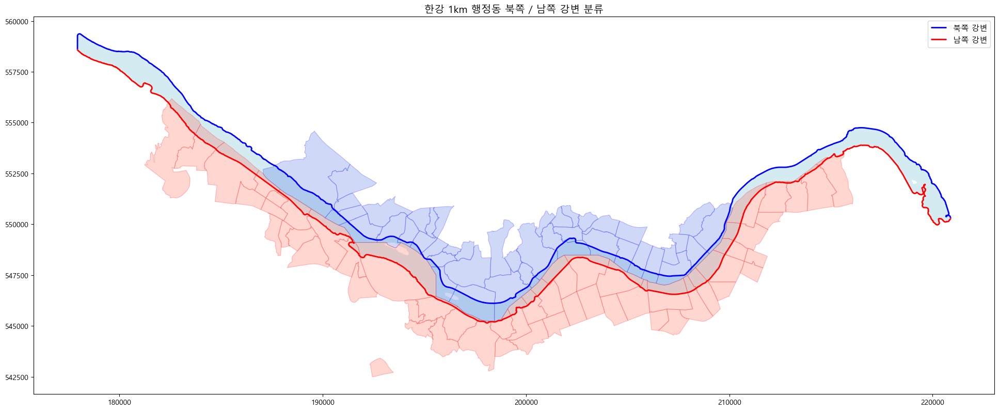

In [348]:
# ─── 1. 행정동을 북쪽 / 남쪽 강변으로 분류 ───────────────────────

# 강변 LineString과 같은 좌표계로 맞춤
hangang_dong_gdf = hangang_dong_gdf.to_crs(gangbuk_gdf.crs).copy()

north_line = gangbuk_gdf.geometry.iloc[0]
south_line = gangnam_gdf.geometry.iloc[0]

# 행정동 polygon이 북쪽/남쪽 강변선과 얼마나 가까운지 계산
hangang_dong_gdf["북쪽강변_거리(m)"] = (
    hangang_dong_gdf.geometry.distance(north_line)
)

hangang_dong_gdf["남쪽강변_거리(m)"] = (
    hangang_dong_gdf.geometry.distance(south_line)
)

# 더 가까운 강변 쪽으로 분류
hangang_dong_gdf["강변구분"] = hangang_dong_gdf.apply(
    lambda row: "북쪽"
    if row["북쪽강변_거리(m)"] <= row["남쪽강변_거리(m)"]
    else "남쪽",
    axis=1
)

hangang_dong_gdf[
    [
        "행정동",
        "강변구분",
        "북쪽강변_거리(m)",
        "남쪽강변_거리(m)",
        "인구수",
        "총종사자수"
    ]
]

# ─── 여의동 강변구분 수동 보정 ────────────────────────────────────

hangang_dong_gdf.loc[
    hangang_dong_gdf["행정동"] == "여의동",
    "강변구분"
] = "남쪽"

hangang_dong_gdf[
    hangang_dong_gdf["행정동"] == "여의동"
][
    [
        "행정동",
        "강변구분",
        "북쪽강변_거리(m)",
        "남쪽강변_거리(m)",
        "인구수",
        "총종사자수"
    ]
]
fig, ax = plt.subplots(figsize=(20, 8))

hangang_final.plot(
    ax=ax,
    color="lightblue",
    alpha=0.5,
    label="한강 본류"
)

hangang_dong_gdf[
    hangang_dong_gdf["강변구분"] == "북쪽"
].plot(
    ax=ax,
    color="royalblue",
    alpha=0.25,
    edgecolor="blue",
    linewidth=0.8,
    label="북쪽 행정동"
)

hangang_dong_gdf[
    hangang_dong_gdf["강변구분"] == "남쪽"
].plot(
    ax=ax,
    color="tomato",
    alpha=0.25,
    edgecolor="red",
    linewidth=0.8,
    label="남쪽 행정동"
)

gangbuk_gdf.plot(
    ax=ax,
    color="blue",
    linewidth=2,
    label="북쪽 강변"
)

gangnam_gdf.plot(
    ax=ax,
    color="red",
    linewidth=2,
    label="남쪽 강변"
)

plt.legend(fontsize=11)
plt.title("한강 1km 행정동 북쪽 / 남쪽 강변 분류", fontsize=14)
plt.tight_layout()
plt.show()

In [349]:
# ─── 3. 행정동 기반 인구 / 직장인 피처 함수 ───────────────────────

DONG_RADIUS_M = 1000

def add_population_worker_features_from_dongs(
    points_df,
    dong_gdf,
    radius_m=1000
):
    """
    각 지점별로 같은 강변의 행정동 polygon까지 거리를 계산해
    인구 피처와 직장인 피처를 생성합니다.
    """

    result_df = points_df.copy()

    # points_df의 geometry는 EPSG:4326이므로
    # 행정동 polygon과 같은 투영좌표계로 변환
    points_gdf = gpd.GeoDataFrame(
        result_df.copy(),
        geometry="geometry",
        crs="EPSG:4326"
    ).to_crs(dong_gdf.crs)

    nearby_dong_counts = []
    nearby_dong_names = []
    population_scores = []
    worker_scores = []

    for _, point in points_gdf.iterrows():

        # 같은 강변 행정동만 사용
        same_side_dongs = dong_gdf[
            dong_gdf["강변구분"] == point["강변구분"]
        ].copy()

        # 지점에서 행정동 polygon까지 최단거리
        same_side_dongs["지점거리(m)"] = (
            same_side_dongs.geometry.distance(point.geometry)
        )

        # 반경 안 행정동만 사용
        nearby_dongs = same_side_dongs[
            same_side_dongs["지점거리(m)"] <= radius_m
        ].copy()

        if len(nearby_dongs) == 0:
            nearby_dong_counts.append(0)
            nearby_dong_names.append("")
            population_scores.append(0)
            worker_scores.append(0)
            continue

        # 가까울수록 점수 크게
        nearby_dongs["거리감쇠"] = (
            1 - nearby_dongs["지점거리(m)"] / radius_m
        )

        nearby_dongs["거리감쇠"] = (
            nearby_dongs["거리감쇠"].clip(lower=0)
        )

        # 거리 가중 인구/직장인 수
        population_score = (
            nearby_dongs["인구수"]
            * nearby_dongs["거리감쇠"]
        ).sum()

        worker_score = (
            nearby_dongs["총종사자수"]
            * nearby_dongs["거리감쇠"]
        ).sum()

        nearby_dong_counts.append(len(nearby_dongs))

        nearby_dong_names.append(
            ", ".join(nearby_dongs["행정동"].astype(str).tolist())
        )

        population_scores.append(population_score)
        worker_scores.append(worker_score)

    result_df["주변_행정동_개수"] = nearby_dong_counts
    result_df["주변_행정동_목록"] = nearby_dong_names
    result_df["인구_피처"] = population_scores
    result_df["직장인_피처"] = worker_scores

    return result_df

# ─── 4. 신규 후보지 인구 / 직장인 피처 계산 ───────────────────────

candidate_points_scored = add_population_worker_features_from_dongs(
    candidate_points_scored,
    hangang_dong_gdf,
    radius_m=DONG_RADIUS_M
)

candidate_points_scored[
    [
        "후보ID",
        "강변구분",
        "주변_행정동_개수",
        "주변_행정동_목록",
        "인구_피처",
        "직장인_피처"
    ]
].sort_values(
    "인구_피처",
    ascending=False
).head(10)

,후보ID,강변구분,주변_행정동_개수,주변_행정동_목록,인구_피처,직장인_피처
490,C0491,남쪽,4,"여의동, 당산2동, 양평2동, 영등포동",97963.340200,246793.524561
489,C0490,남쪽,4,"여의동, 당산2동, 양평2동, 영등포동",95085.015155,254882.879091
491,C0492,남쪽,4,"여의동, 당산2동, 양평2동, 영등포동",93578.232045,229311.828375
492,C0493,남쪽,4,"여의동, 당산2동, 양평2동, 영등포동",87506.220527,201863.024069
390,C0391,남쪽,5,"풍납2동, 잠실4동, 잠실6동, 잠실2동, 잠실3동",85977.769702,83653.394206
84,C0085,북쪽,5,"합정동, 망원1동, 망원2동, 성산2동, 상암동",85622.891199,65316.290785
389,C0390,남쪽,5,"풍납2동, 잠실4동, 잠실6동, 잠실2동, 잠실3동",83634.695860,84636.953646
495,C0496,남쪽,3,"여의동, 당산2동, 양평2동",83474.360756,212052.536904
83,C0084,북쪽,5,"합정동, 망원1동, 망원2동, 성산2동, 상암동",83377.428747,64267.917856
496,C0497,남쪽,3,"여의동, 당산2동, 양평2동",83326.273457,209657.218506


In [350]:
# ─── 5. 기존 7개 선착장 인구 / 직장인 피처 계산 ───────────────────────

dock_points_scored = add_population_worker_features_from_dongs(
    dock_points_scored,
    hangang_dong_gdf,
    radius_m=DONG_RADIUS_M
)

dock_points_scored[
    [
        "선착장ID",
        "선착장명",
        "강변구분",
        "주변_행정동_개수",
        "주변_행정동_목록",
        "인구_피처",
        "직장인_피처"
    ]
].sort_values(
    "직장인_피처",
    ascending=False
)

,선착장ID,선착장명,강변구분,주변_행정동_개수,주변_행정동_목록,인구_피처,직장인_피처
2,D003,여의도,남쪽,1,여의동,33981.000000,192132.000000
0,D001,마곡,남쪽,3,"등촌3동, 가양2동, 가양1동",44784.175313,86507.657683
1,D002,망원,북쪽,5,"합정동, 망원1동, 망원2동, 성산2동, 상암동",72606.993163,53216.309570
3,D004,옥수,북쪽,4,"약수동, 한남동, 금호4가동, 옥수동",46210.527946,24449.283443
6,D007,잠실,남쪽,5,"잠실본동, 잠실6동, 잠실7동, 잠실2동, 잠실3동",61576.265840,24102.927097
4,D005,압구정,남쪽,3,"잠원동, 신사동, 압구정동",45078.581164,23027.575407
5,D006,뚝섬,북쪽,5,"성수2가1동, 자양1동, 자양2동, 자양3동, 자양4동",57916.075584,17997.099139


In [351]:
# 신규 선착장 후보 중에서

candidate_points_scored[
    [
        "후보ID",
        "강변구분",
        "주변_행정동_개수",
        "주변_행정동_목록",
        "인구_피처",
        "직장인_피처"
    ]
].sort_values(
    "직장인_피처",
    ascending=False
).head(10)

,후보ID,강변구분,주변_행정동_개수,주변_행정동_목록,인구_피처,직장인_피처
489,C0490,남쪽,4,"여의동, 당산2동, 양평2동, 영등포동",95085.015155,254882.879091
490,C0491,남쪽,4,"여의동, 당산2동, 양평2동, 영등포동",97963.340200,246793.524561
488,C0489,남쪽,4,"여의동, 당산2동, 양평2동, 영등포동",81449.145054,240291.891823
491,C0492,남쪽,4,"여의동, 당산2동, 양평2동, 영등포동",93578.232045,229311.828375
487,C0488,남쪽,3,"여의동, 당산2동, 영등포동",66983.987301,225207.472031
486,C0487,남쪽,3,"여의동, 당산2동, 영등포동",55566.967641,213409.690500
495,C0496,남쪽,3,"여의동, 당산2동, 양평2동",83474.360756,212052.536904
496,C0497,남쪽,3,"여의동, 당산2동, 양평2동",83326.273457,209657.218506
492,C0493,남쪽,4,"여의동, 당산2동, 양평2동, 영등포동",87506.220527,201863.024069
468,C0469,남쪽,3,"여의동, 노량진2동, 노량진1동",66450.960798,201352.777982


In [352]:
# ─── 1. 관광명소 / 야경명소 하나로 통합 ──────────────────────────

tour_places = tour_df.copy()
tour_places["장소유형"] = "관광명소"

night_places = night_df.copy()
night_places["장소유형"] = "야경명소"

place_df = pd.concat(
    [tour_places, night_places],
    ignore_index=True
)

print("전체 장소 수:", len(place_df))
print(place_df["장소유형"].value_counts())

# ─── 2. 장소 GeoDataFrame 생성 ────────────────────────────────────

place_points_gdf = gpd.GeoDataFrame(
    place_df.copy(),
    geometry=gpd.points_from_xy(
        place_df["경도"],
        place_df["위도"]
    ),
    crs="EPSG:4326"
)

# 강변선과 같은 좌표계로 변환
place_points_projected = place_points_gdf.to_crs(gangbuk_gdf.crs)

# ─── 3. 장소 북쪽 / 남쪽 강변 분류 ────────────────────────────────

north_line = gangbuk_gdf.geometry.iloc[0]
south_line = gangnam_gdf.geometry.iloc[0]

place_points_projected["북쪽강변_거리(m)"] = (
    place_points_projected.geometry.distance(north_line)
)

place_points_projected["남쪽강변_거리(m)"] = (
    place_points_projected.geometry.distance(south_line)
)

place_points_projected["강변구분"] = place_points_projected.apply(
    lambda row: "북쪽"
    if row["북쪽강변_거리(m)"] <= row["남쪽강변_거리(m)"]
    else "남쪽",
    axis=1
)

place_points_projected[
    [
        "장소명",
        "장소유형",
        "강변구분",
        "북쪽강변_거리(m)",
        "남쪽강변_거리(m)"
    ]
].sort_values(
    ["장소유형", "장소명"]
).head(30)

전체 장소 수: 57
장소유형
관광명소    42
야경명소    15
Name: count, dtype: int64


,장소명,장소유형,강변구분,북쪽강변_거리(m),남쪽강변_거리(m)
6,63스퀘어,관광명소,남쪽,1246.600778,320.646521
21,IFC몰,관광명소,남쪽,1893.963376,795.973999
39,건대로데오거리,관광명소,북쪽,1264.171013,1920.047861
12,겸재정선미술관,관광명소,남쪽,1347.354695,519.541434
28,고투몰,관광명소,남쪽,1669.081767,1002.401645
16,국립서울현충원,관광명소,남쪽,1590.147198,648.206811
30,국립중앙박물관,관광명소,북쪽,1042.765940,1777.198714
7,국회의사당,관광명소,남쪽,1197.639382,399.190041
3,노들섬,관광명소,남쪽,397.601166,376.005055
20,노량진수산물도매시장,관광명소,남쪽,1651.992202,743.244964


In [353]:
place_points_projected.groupby(
    ["장소유형", "강변구분"]
).size()

장소유형  강변구분
관광명소  남쪽      26
      북쪽      16
야경명소  남쪽       7
      북쪽       8
dtype: int64

D:\TEMP\ipykernel_19364\4093952443.py:56: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(fontsize=11)


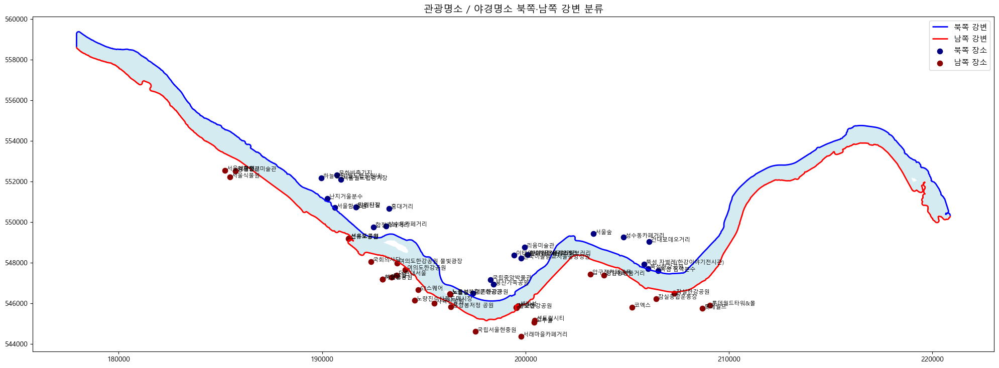

In [354]:
fig, ax = plt.subplots(figsize=(20, 8))

hangang_final.plot(
    ax=ax,
    color="lightblue",
    alpha=0.5,
    label="한강 본류"
)

gangbuk_gdf.plot(
    ax=ax,
    color="blue",
    linewidth=2,
    label="북쪽 강변"
)

gangnam_gdf.plot(
    ax=ax,
    color="red",
    linewidth=2,
    label="남쪽 강변"
)

# 북쪽 장소
place_points_projected[
    place_points_projected["강변구분"] == "북쪽"
].plot(
    ax=ax,
    color="navy",
    markersize=55,
    marker="o",
    label="북쪽 장소"
)

# 남쪽 장소
place_points_projected[
    place_points_projected["강변구분"] == "남쪽"
].plot(
    ax=ax,
    color="darkred",
    markersize=55,
    marker="o",
    label="남쪽 장소"
)

# 장소명 표시
for _, row in place_points_projected.iterrows():
    ax.text(
        row.geometry.x,
        row.geometry.y,
        f" {row['장소명']}",
        fontsize=8,
        color="black"
    )

plt.legend(fontsize=11)
plt.title("관광명소 / 야경명소 북쪽·남쪽 강변 분류", fontsize=14)
plt.tight_layout()
plt.show()

In [355]:
# ─── 5. 이후 피처 계산용 장소 데이터 정리 ────────────────────────

place_points = place_points_projected.to_crs(epsg=4326).copy()

place_points["경도"] = place_points.geometry.x
place_points["위도"] = place_points.geometry.y

place_points = place_points[
    [
        "장소명",
        "장소유형",
        "강변구분",
        "위도",
        "경도",
        "월평균_SNS언급횟수",
        "geometry"
    ]
].copy()

place_points.head()

,장소명,장소유형,강변구분,위도,경도,월평균_SNS언급횟수,geometry
0,뚝섬한강공원,관광명소,북쪽,37.5288,127.0682,3224.22,POINT (127.0682 37.5288)
1,반포한강공원,관광명소,남쪽,37.5115,126.9951,2723.22,POINT (126.9951 37.5115)
2,잠실한강공원,관광명소,남쪽,37.5178,127.0827,1402.00,POINT (127.0827 37.5178)
3,노들섬,관광명소,남쪽,37.5175,126.9582,3616.44,POINT (126.9582 37.5175)
4,여의도한강공원,관광명소,남쪽,37.5284,126.9332,8216.56,POINT (126.9332 37.5284)


In [356]:
# ─── 장소 접근성 피처 계산 함수 ────────────────────────────────────

PLACE_RADIUS_M = 2000

def add_place_features(
    points_df,
    place_points,
    radius_m=2000
):
    """
    각 지점별로 같은 강변의 관광명소/야경명소를 사용해
    장소 접근성 피처를 계산합니다.
    SNS 언급량은 사용하지 않습니다.
    """

    result_df = points_df.copy()

    nearby_place_counts = []
    nearby_place_names = []

    tour_place_counts = []
    night_place_counts = []

    tour_place_scores = []
    night_place_scores = []
    place_access_scores = []

    nearest_place_names = []
    nearest_place_distances = []

    for _, point in result_df.iterrows():

        # 같은 강변 장소만 사용
        same_side_places = place_points[
            place_points["강변구분"] == point["강변구분"]
        ].copy()

        # 지점과 장소 사이 거리 계산
        same_side_places["지점거리(m)"] = same_side_places.apply(
            lambda place: haversine_distance(
                point["위도"],
                point["경도"],
                place["위도"],
                place["경도"]
            ),
            axis=1
        )

        # 같은 강변에서 가장 가까운 장소 기록
        nearest_idx = same_side_places["지점거리(m)"].idxmin()

        nearest_place_names.append(
            same_side_places.loc[nearest_idx, "장소명"]
        )

        nearest_place_distances.append(
            same_side_places.loc[nearest_idx, "지점거리(m)"]
        )

        # 반경 안 장소만 사용
        nearby_places = same_side_places[
            same_side_places["지점거리(m)"] <= radius_m
        ].copy()

        if len(nearby_places) == 0:
            nearby_place_counts.append(0)
            nearby_place_names.append("")

            tour_place_counts.append(0)
            night_place_counts.append(0)

            tour_place_scores.append(0)
            night_place_scores.append(0)
            place_access_scores.append(0)

            continue

        # 거리 감쇠
        nearby_places["거리감쇠"] = (
            1 - nearby_places["지점거리(m)"] / radius_m
        )

        nearby_places["거리감쇠"] = (
            nearby_places["거리감쇠"].clip(lower=0)
        )

        # 관광명소 / 야경명소 분리
        nearby_tour_places = nearby_places[
            nearby_places["장소유형"] == "관광명소"
        ].copy()

        nearby_night_places = nearby_places[
            nearby_places["장소유형"] == "야경명소"
        ].copy()

        # 개수
        nearby_place_counts.append(len(nearby_places))

        tour_place_counts.append(len(nearby_tour_places))
        night_place_counts.append(len(nearby_night_places))

        # 목록
        nearby_place_names.append(
            ", ".join(nearby_places["장소명"].astype(str).tolist())
        )

        # 거리 기반 피처
        tour_score = nearby_tour_places["거리감쇠"].sum()
        night_score = nearby_night_places["거리감쇠"].sum()

        tour_place_scores.append(tour_score)
        night_place_scores.append(night_score)

        place_access_scores.append(
            tour_score + night_score
        )

    result_df["가장가까운_같은강변_장소"] = nearest_place_names
    result_df["가장가까운_같은강변_장소_거리(m)"] = nearest_place_distances

    result_df["주변_장소_개수"] = nearby_place_counts
    result_df["주변_장소_목록"] = nearby_place_names

    result_df["관광명소_개수"] = tour_place_counts
    result_df["야경명소_개수"] = night_place_counts

    result_df["관광명소_피처"] = tour_place_scores
    result_df["야경명소_피처"] = night_place_scores
    result_df["장소_접근성_피처"] = place_access_scores

    result_df["가장가까운_같은강변_장소_거리(m)"] = (
        result_df["가장가까운_같은강변_장소_거리(m)"].round(1)
    )

    return result_df

# ─── 신규 후보지 장소 피처 계산 ───────────────────────────────────

candidate_points_scored = add_place_features(
    candidate_points_scored,
    place_points,
    radius_m=PLACE_RADIUS_M
)

candidate_points_scored[
    [
        "후보ID",
        "강변구분",
        "가장가까운_같은강변_장소",
        "가장가까운_같은강변_장소_거리(m)",
        "주변_장소_개수",
        "관광명소_개수",
        "야경명소_개수",
        "주변_장소_목록",
        "관광명소_피처",
        "야경명소_피처",
        "장소_접근성_피처"
    ]
].sort_values(
    "장소_접근성_피처",
    ascending=False
).head(10)

,후보ID,강변구분,가장가까운_같은강변_장소,가장가까운_같은강변_장소_거리(m),주변_장소_개수,관광명소_개수,야경명소_개수,주변_장소_목록,관광명소_피처,야경명소_피처,장소_접근성_피처
478,C0479,남쪽,여의도한강공원 물빛광장,240.2,9,8,1,"여의도한강공원, 63스퀘어, 국회의사당, 더현대서울, 노량진수산물도매시장, IFC몰...",3.511186,0.879888,4.391074
477,C0478,남쪽,여의도한강공원,133.4,9,8,1,"여의도한강공원, 63스퀘어, 국회의사당, 더현대서울, 노량진수산물도매시장, IFC몰...",3.606065,0.784336,4.390401
479,C0480,남쪽,여의도한강공원 물빛광장,73.8,8,7,1,"여의도한강공원, 63스퀘어, 국회의사당, 더현대서울, IFC몰, 여의도공원, 서울달...",3.394053,0.963106,4.357159
480,C0481,남쪽,여의도한강공원 물빛광장,166.4,8,7,1,"여의도한강공원, 63스퀘어, 국회의사당, 더현대서울, IFC몰, 여의도공원, 서울달...",3.275006,0.916776,4.191782
476,C0477,남쪽,여의도한강공원,155.0,9,8,1,"여의도한강공원, 63스퀘어, 국회의사당, 더현대서울, 노량진수산물도매시장, IFC몰...",3.487237,0.688263,4.175500
475,C0476,남쪽,여의도한강공원,290.9,9,7,2,"여의도한강공원, 63스퀘어, 더현대서울, 노량진수산물도매시장, IFC몰, 여의도공원...",3.446134,0.640444,4.086577
444,C0445,남쪽,반포한강공원,113.1,6,5,1,"반포한강공원, 센트럴시티, 고투몰, 세빛섬, 서래마을카페거리, 세빛섬",3.141589,0.880155,4.021744
481,C0482,남쪽,여의도한강공원 물빛광장,355.6,7,6,1,"여의도한강공원, 국회의사당, 더현대서울, IFC몰, 여의도공원, 서울달, 여의도한강...",3.108152,0.822196,3.930347
442,C0443,남쪽,세빛섬,46.0,6,5,1,"반포한강공원, 센트럴시티, 고투몰, 세빛섬, 서래마을카페거리, 세빛섬",2.948899,0.977004,3.925904
443,C0444,남쪽,세빛섬,58.7,6,5,1,"반포한강공원, 센트럴시티, 고투몰, 세빛섬, 서래마을카페거리, 세빛섬",2.975799,0.939693,3.915492


In [357]:
# ─── 같은 장소명 중복 확인 ────────────────────────────────────────

duplicate_places = place_points[
    place_points.duplicated(
        subset=["장소명"],
        keep=False
    )
].sort_values("장소명")

duplicate_places[
    [
        "장소명",
        "장소유형",
        "강변구분",
        "위도",
        "경도"
    ]
]

,장소명,장소유형,강변구분,위도,경도
24,서울식물원,관광명소,남쪽,37.569300,126.835400
53,서울식물원,야경명소,남쪽,37.572244,126.832843
5,선유도공원,관광명소,남쪽,37.542200,126.901500
47,선유도공원,야경명소,남쪽,37.542383,126.901819
31,세빛섬,관광명소,남쪽,37.511766,126.994721
42,세빛섬,야경명소,남쪽,37.512436,126.995962


In [358]:
# ─── 장소명 기준 중복 제거 ────────────────────────────────────────

place_points_unique = place_points.drop_duplicates(
    subset=["장소명"],
    keep="first"
).copy()

print("중복 제거 전 장소 수:", len(place_points))
print("중복 제거 후 장소 수:", len(place_points_unique))

중복 제거 전 장소 수: 57
중복 제거 후 장소 수: 54


In [359]:
# ─── 기존 선착장 장소 피처 계산 ───────────────────────────────────

dock_points_scored = add_place_features(
    dock_points_scored,
    place_points,
    radius_m=PLACE_RADIUS_M
)

dock_points_scored[
    [
        "선착장ID",
        "선착장명",
        "강변구분",
        "가장가까운_같은강변_장소",
        "가장가까운_같은강변_장소_거리(m)",
        "주변_장소_개수",
        "관광명소_개수",
        "야경명소_개수",
        "주변_장소_목록",
        "관광명소_피처",
        "야경명소_피처",
        "장소_접근성_피처"
    ]
].sort_values(
    "장소_접근성_피처",
    ascending=False
)

,선착장ID,선착장명,강변구분,가장가까운_같은강변_장소,가장가까운_같은강변_장소_거리(m),주변_장소_개수,관광명소_개수,야경명소_개수,주변_장소_목록,관광명소_피처,야경명소_피처,장소_접근성_피처
2,D003,여의도,남쪽,여의도한강공원,172.1,9,8,1,"여의도한강공원, 63스퀘어, 국회의사당, 더현대서울, 노량진수산물도매시장, IFC몰...",3.481686,0.673726,4.155412
1,D002,망원,북쪽,서울함 공원,273.5,8,3,5,"합정카페거리, 망리단길, 망원시장, 서울함 공원, 난지거울분수, 하늘공원(월드컵공원...",1.147885,1.750960,2.898845
5,D006,뚝섬,북쪽,뚝섬한강공원,80.1,5,3,2,"뚝섬한강공원, 성수동카페거리, 건대로데오거리, 뚝섬 음악분수, 뚝섬 자벌레(한강이야...",1.305771,1.570623,2.876394
0,D001,마곡,남쪽,양천향교,584.2,4,3,1,"양천향교, 겸재정선미술관, 서울식물원, 서울식물원",1.922060,0.481228,2.403288
6,D007,잠실,남쪽,잠실한강공원,199.9,4,4,0,"잠실한강공원, 잠실종합운동장, 롯데월드, 롯데월드타워&몰",1.764090,0.000000,1.764090
3,D004,옥수,북쪽,현대카드뮤직라이브러리,1527.9,5,5,0,"서울숲, 현대카드뮤직라이브러리, 바이닐앤플라스틱, 한국이슬람교서울중앙성원, 리움미술관",0.795724,0.000000,0.795724
4,D005,압구정,남쪽,압구정카페골목,1710.8,1,1,0,압구정카페골목,0.144597,0.000000,0.144597


In [360]:
# ─── 장소명 기준으로 중복 통합 ────────────────────────────────────
# 장소 접근성은 장소 하나당 한 번만 반영
# SNS는 같은 장소가 중복되어도 중복 합산하지 않고 대표값(max) 사용

place_points_for_scoring = (
    place_points
    .groupby("장소명", as_index=False)
    .agg({
        "장소유형": lambda x: "+".join(sorted(set(x.astype(str)))),
        "강변구분": "first",
        "위도": "first",
        "경도": "first",
        "월평균_SNS언급횟수": "max",
        "geometry": "first"
    })
)

place_points_for_scoring = gpd.GeoDataFrame(
    place_points_for_scoring,
    geometry="geometry",
    crs="EPSG:4326"
)

print("통합 전 장소 수:", len(place_points))
print("장소명 통합 후 장소 수:", len(place_points_for_scoring))

place_points_for_scoring[
    [
        "장소명",
        "장소유형",
        "강변구분",
        "월평균_SNS언급횟수"
    ]
].head()

통합 전 장소 수: 57
장소명 통합 후 장소 수: 54


,장소명,장소유형,강변구분,월평균_SNS언급횟수
0,63스퀘어,관광명소,남쪽,2913.33
1,IFC몰,관광명소,남쪽,1234.33
2,건대로데오거리,관광명소,북쪽,654.44
3,겸재정선미술관,관광명소,남쪽,NaN
4,고투몰,관광명소,남쪽,NaN


In [361]:
place_points_for_scoring["월평균_SNS언급횟수"] = pd.to_numeric(
    place_points_for_scoring["월평균_SNS언급횟수"],
    errors="coerce"
).fillna(0)

In [362]:
# ─── 1. SNS 피처용 장소 데이터 정리 ──────────────────────────────

sns_place_points = place_points.copy()

# SNS 언급량 숫자형으로 정리
sns_place_points["월평균_SNS언급횟수"] = pd.to_numeric(
    sns_place_points["월평균_SNS언급횟수"],
    errors="coerce"
).fillna(0)

# 같은 장소가 관광명소/야경명소에 중복되어 있으면 한 번만 반영
# SNS 언급량은 중복 합산하지 않고 가장 큰 값 하나 사용
sns_place_points = (
    sns_place_points
    .groupby("장소명", as_index=False)
    .agg({
        "강변구분": "first",
        "위도": "first",
        "경도": "first",
        "월평균_SNS언급횟수": "max",
        "geometry": "first"
    })
)

sns_place_points = gpd.GeoDataFrame(
    sns_place_points,
    geometry="geometry",
    crs="EPSG:4326"
)

print("SNS 피처용 장소 수:", len(sns_place_points))
print("SNS 언급량이 0보다 큰 장소 수:", (sns_place_points["월평균_SNS언급횟수"] > 0).sum())

sns_place_points[
    [
        "장소명",
        "강변구분",
        "월평균_SNS언급횟수"
    ]
].sort_values(
    "월평균_SNS언급횟수",
    ascending=False
)

# ─── 2. SNS 피처 계산 함수 ────────────────────────────────────────

SNS_RADIUS_M = 2000

def add_sns_features(
    points_df,
    sns_place_points,
    radius_m=2000
):
    """
    각 지점별로 같은 강변의 SNS 장소만 사용해 SNS 피처를 계산합니다.

    SNS_피처 =
        주변 장소의 월평균 SNS 언급횟수 x 거리감쇠 합
    """

    result_df = points_df.copy()

    nearby_sns_place_counts = []
    nearby_sns_place_names = []
    sns_feature_scores = []

    nearest_sns_place_names = []
    nearest_sns_place_distances = []

    for _, point in result_df.iterrows():

        # 같은 강변 장소만 사용
        same_side_sns_places = sns_place_points[
            sns_place_points["강변구분"] == point["강변구분"]
        ].copy()

        # 후보지/선착장과 장소 거리 계산
        same_side_sns_places["지점거리(m)"] = same_side_sns_places.apply(
            lambda place: haversine_distance(
                point["위도"],
                point["경도"],
                place["위도"],
                place["경도"]
            ),
            axis=1
        )

        # 같은 강변에서 가장 가까운 SNS 장소 기록
        nearest_idx = same_side_sns_places["지점거리(m)"].idxmin()

        nearest_sns_place_names.append(
            same_side_sns_places.loc[nearest_idx, "장소명"]
        )

        nearest_sns_place_distances.append(
            same_side_sns_places.loc[nearest_idx, "지점거리(m)"]
        )

        # 반경 이내 장소만 사용
        nearby_sns_places = same_side_sns_places[
            same_side_sns_places["지점거리(m)"] <= radius_m
        ].copy()

        if len(nearby_sns_places) == 0:
            nearby_sns_place_counts.append(0)
            nearby_sns_place_names.append("")
            sns_feature_scores.append(0)
            continue

        # 거리 감쇠
        nearby_sns_places["거리감쇠"] = (
            1 - nearby_sns_places["지점거리(m)"] / radius_m
        )

        nearby_sns_places["거리감쇠"] = (
            nearby_sns_places["거리감쇠"].clip(lower=0)
        )

        # SNS 피처
        nearby_sns_places["SNS_기여점수"] = (
            nearby_sns_places["월평균_SNS언급횟수"]
            * nearby_sns_places["거리감쇠"]
        )

        nearby_sns_place_counts.append(len(nearby_sns_places))

        nearby_sns_place_names.append(
            ", ".join(nearby_sns_places["장소명"].astype(str).tolist())
        )

        sns_feature_scores.append(
            nearby_sns_places["SNS_기여점수"].sum()
        )

    result_df["가장가까운_같은강변_SNS장소"] = nearest_sns_place_names
    result_df["가장가까운_같은강변_SNS장소_거리(m)"] = nearest_sns_place_distances

    result_df["주변_SNS장소_개수"] = nearby_sns_place_counts
    result_df["주변_SNS장소_목록"] = nearby_sns_place_names
    result_df["SNS_피처"] = sns_feature_scores

    result_df["가장가까운_같은강변_SNS장소_거리(m)"] = (
        result_df["가장가까운_같은강변_SNS장소_거리(m)"].round(1)
    )

    return result_df

SNS 피처용 장소 수: 54
SNS 언급량이 0보다 큰 장소 수: 29


In [363]:
# ─── 3. 신규 후보지 SNS 피처 계산 ────────────────────────────────

candidate_points_scored = add_sns_features(
    candidate_points_scored,
    sns_place_points,
    radius_m=SNS_RADIUS_M
)

candidate_points_scored[
    [
        "후보ID",
        "강변구분",
        "주변_SNS장소_개수",
        "주변_SNS장소_목록",
        "SNS_피처"
    ]
].sort_values(
    "SNS_피처",
    ascending=False
).head(10)

,후보ID,강변구분,주변_SNS장소_개수,주변_SNS장소_목록,SNS_피처
477,C0478,남쪽,9,"63스퀘어, IFC몰, 국회의사당, 노량진수산물도매시장, 더현대서울, 서울달, 여의...",36986.368411
478,C0479,남쪽,9,"63스퀘어, IFC몰, 국회의사당, 노량진수산물도매시장, 더현대서울, 서울달, 여의...",36096.335426
476,C0477,남쪽,9,"63스퀘어, IFC몰, 국회의사당, 노량진수산물도매시장, 더현대서울, 서울달, 여의...",35610.167682
475,C0476,남쪽,9,"63스퀘어, IFC몰, 노량진수산물도매시장, 더현대서울, 사육신공원, 서울달, 여의...",34398.428214
479,C0480,남쪽,8,"63스퀘어, IFC몰, 국회의사당, 더현대서울, 서울달, 여의도공원, 여의도한강공원...",34379.391205
480,C0481,남쪽,8,"63스퀘어, IFC몰, 국회의사당, 더현대서울, 서울달, 여의도공원, 여의도한강공원...",32019.245850
474,C0475,남쪽,9,"63스퀘어, IFC몰, 노량진수산물도매시장, 더현대서울, 사육신공원, 서울달, 여의...",31302.117342
481,C0482,남쪽,7,"IFC몰, 국회의사당, 더현대서울, 서울달, 여의도공원, 여의도한강공원, 여의도한강...",29030.606129
473,C0474,남쪽,11,"63스퀘어, IFC몰, 노들섬, 노들섬복합문화공간, 노량진수산물도매시장, 더현대서울...",28407.632819
482,C0483,남쪽,7,"IFC몰, 국회의사당, 더현대서울, 서울달, 여의도공원, 여의도한강공원, 여의도한강...",25912.916839


In [364]:
# ─── 4. 기존 선착장 SNS 피처 계산 ────────────────────────────────

dock_points_scored = add_sns_features(
    dock_points_scored,
    sns_place_points,
    radius_m=SNS_RADIUS_M
)

dock_points_scored[
    [
        "선착장ID",
        "선착장명",
        "강변구분",
        "주변_SNS장소_개수",
        "주변_SNS장소_목록",
        "SNS_피처"
    ]
].sort_values(
    "SNS_피처",
    ascending=False
)

,선착장ID,선착장명,강변구분,주변_SNS장소_개수,주변_SNS장소_목록,SNS_피처
2,D003,여의도,남쪽,9,"63스퀘어, IFC몰, 국회의사당, 노량진수산물도매시장, 더현대서울, 서울달, 여의...",35450.309714
6,D007,잠실,남쪽,4,"롯데월드, 롯데월드타워&몰, 잠실종합운동장, 잠실한강공원",6193.766018
5,D006,뚝섬,북쪽,5,"건대로데오거리, 뚝섬 음악분수, 뚝섬 자벌레(한강이야기전시관), 뚝섬한강공원, 성수...",3577.004929
3,D004,옥수,북쪽,5,"리움미술관, 바이닐앤플라스틱, 서울숲, 한국이슬람교서울중앙성원, 현대카드뮤직라이브러리",1526.186411
0,D001,마곡,남쪽,3,"겸재정선미술관, 서울식물원, 양천향교",1224.557363
4,D005,압구정,남쪽,1,압구정카페골목,287.009556
1,D002,망원,북쪽,8,"난지거울분수, 망리단길, 망원시장, 문화비축기지, 서울월드컵경기장, 서울함 공원, ...",222.304204


In [365]:
print("신규 후보 수:", len(candidate_points_scored))

print(
    f"같은 강변 반경 {SNS_RADIUS_M}m 안에 SNS 장소가 없는 후보 수:",
    (candidate_points_scored["주변_SNS장소_개수"] == 0).sum()
)

candidate_points_scored["SNS_피처"].describe()

신규 후보 수: 584
같은 강변 반경 2000m 안에 SNS 장소가 없는 후보 수: 319


count      584.000000
mean      2005.044174
std       5154.685862
min          0.000000
25%          0.000000
50%          0.000000
75%       1801.462379
max      36986.368411
Name: SNS_피처, dtype: float64

In [366]:
# 이제 데이터의 정규화 진행

# ─── 정규화할 피처 목록 ───────────────────────────────────────────

feature_cols = [
    "지하철_접근성_피처",
    "인구_피처",
    "직장인_피처",
    "장소_접근성_피처",
    "SNS_피처"
]

# ─── 신규 후보 기준 정규화 파라미터 저장 ──────────────────────────

normalization_params = {}

for col in feature_cols:
    min_value = candidate_points_scored[col].min()
    max_value = candidate_points_scored[col].max()

    normalization_params[col] = {
        "min": min_value,
        "max": max_value
    }

normalization_params

# ─── 저장된 min/max 기준으로 정규화하는 함수 ─────────────────────

def apply_minmax_normalization(
    df,
    feature_cols,
    normalization_params
):
    result_df = df.copy()

    for col in feature_cols:
        min_value = normalization_params[col]["min"]
        max_value = normalization_params[col]["max"]

        norm_col = f"n_{col}"

        if max_value == min_value:
            result_df[norm_col] = 0
        else:
            result_df[norm_col] = (
                (result_df[col] - min_value)
                / (max_value - min_value)
            )

    return result_df

In [367]:
# ─── 신규 후보 정규화 ──────────────────────────────────────────────

candidate_points_scored = apply_minmax_normalization(
    candidate_points_scored,
    feature_cols,
    normalization_params
)

candidate_points_scored[
    [
        "후보ID",
        "강변구분",
        "n_지하철_접근성_피처",
        "n_인구_피처",
        "n_직장인_피처",
        "n_장소_접근성_피처",
        "n_SNS_피처"
    ]
].head()

,후보ID,강변구분,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
0,C0001,북쪽,0.0,0.0,0.0,0.0,0.0
1,C0002,북쪽,0.0,0.0,0.0,0.0,0.0
2,C0003,북쪽,0.0,0.0,0.0,0.0,0.0
3,C0004,북쪽,0.0,0.0,0.0,0.0,0.0
4,C0005,북쪽,0.0,0.0,0.0,0.0,0.0


In [368]:
# ─── 기존 선착장도 신규 후보 기준으로 정규화 ──────────────────────

dock_points_scored = apply_minmax_normalization(
    dock_points_scored,
    feature_cols,
    normalization_params
)

dock_points_scored[
    [
        "선착장ID",
        "선착장명",
        "강변구분",
        "n_지하철_접근성_피처",
        "n_인구_피처",
        "n_직장인_피처",
        "n_장소_접근성_피처",
        "n_SNS_피처"
    ]
]

,선착장ID,선착장명,강변구분,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
0,D001,마곡,남쪽,0.136405,0.457152,0.339402,0.547312,0.033108
1,D002,망원,북쪽,0.113457,0.741165,0.208787,0.660168,0.006010
2,D003,여의도,남쪽,0.585262,0.346875,0.753805,0.946332,0.958470
3,D004,옥수,북쪽,0.313554,0.471712,0.095924,0.181214,0.041263
4,D005,압구정,남쪽,0.387405,0.460158,0.090346,0.032930,0.007760
5,D006,뚝섬,북쪽,0.210568,0.591202,0.070609,0.655055,0.096711
6,D007,잠실,남쪽,0.402027,0.628564,0.094565,0.401745,0.167461


In [369]:
normalized_feature_cols = [
    f"n_{col}" for col in feature_cols
]

candidate_points_scored[
    normalized_feature_cols
].describe()

,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
count,584.000000,584.000000,584.000000,584.000000,584.000000
mean,0.190093,0.316396,0.122901,0.173455,0.054210
std,0.238742,0.270572,0.188276,0.254343,0.139367
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.053418,0.345530,0.062393,0.000000,0.000000
75%,0.342026,0.533861,0.156639,0.312020,0.048706
max,1.000000,1.000000,1.000000,1.000000,1.000000


In [370]:
dock_points_scored[
    [
        "선착장명"
    ] + normalized_feature_cols
]

,선착장명,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
0,마곡,0.136405,0.457152,0.339402,0.547312,0.033108
1,망원,0.113457,0.741165,0.208787,0.660168,0.006010
2,여의도,0.585262,0.346875,0.753805,0.946332,0.958470
3,옥수,0.313554,0.471712,0.095924,0.181214,0.041263
4,압구정,0.387405,0.460158,0.090346,0.032930,0.007760
5,뚝섬,0.210568,0.591202,0.070609,0.655055,0.096711
6,잠실,0.402027,0.628564,0.094565,0.401745,0.167461


In [372]:
# ─── 같은 강변 기존 선착장과의 거리 계산 ─────────────────────────

nearest_same_side_dock_names = []
nearest_same_side_dock_distances = []

for _, candidate in candidate_points_scored.iterrows():

    # 후보와 같은 강변의 기존 선착장만 비교
    same_side_docks = dock_points_scored[
        dock_points_scored["강변구분"] == candidate["강변구분"]
    ].copy()

    # 같은 강변 기존 선착장까지 거리 계산
    same_side_docks["후보지거리(m)"] = same_side_docks.apply(
        lambda dock: haversine_distance(
            candidate["위도"],
            candidate["경도"],
            dock["위도"],
            dock["경도"]
        ),
        axis=1
    )

    nearest_idx = same_side_docks["후보지거리(m)"].idxmin()

    nearest_same_side_dock_names.append(
        same_side_docks.loc[nearest_idx, "선착장명"]
    )

    nearest_same_side_dock_distances.append(
        same_side_docks.loc[nearest_idx, "후보지거리(m)"]
    )


candidate_points_scored["가장가까운_같은강변_기존선착장"] = (
    nearest_same_side_dock_names
)

candidate_points_scored["같은강변_기존선착장_최소거리(m)"] = (
    nearest_same_side_dock_distances
)

candidate_points_scored["같은강변_기존선착장_최소거리(m)"] = (
    candidate_points_scored["같은강변_기존선착장_최소거리(m)"].round(1)
)

candidate_points_scored[
    [
        "후보ID",
        "강변구분",
        "가장가까운_같은강변_기존선착장",
        "같은강변_기존선착장_최소거리(m)"
    ]
].sort_values(
    "같은강변_기존선착장_최소거리(m)",
    ascending=True
).head(20)

,후보ID,강변구분,가장가까운_같은강변_기존선착장,같은강변_기존선착장_최소거리(m)
395,C0396,남쪽,잠실,19.2
181,C0182,북쪽,뚝섬,26.2
476,C0477,남쪽,여의도,32.1
156,C0157,북쪽,옥수,41.7
529,C0530,남쪽,마곡,56.3
85,C0086,북쪽,망원,84.7
429,C0430,남쪽,압구정,94.8
430,C0431,남쪽,압구정,105.4
86,C0087,북쪽,망원,113.7
530,C0531,남쪽,마곡,149.5


In [373]:
# ─── 제거 기준별 후보 수 확인 ─────────────────────────────────────

for threshold in [500, 800, 1000, 1200, 1500]:
    remove_count = (
        candidate_points_scored["같은강변_기존선착장_최소거리(m)"] < threshold
    ).sum()

    remain_count = len(candidate_points_scored) - remove_count

    print(
        f"{threshold}m 이내 제거: {remove_count}개 / "
        f"제거 후 남는 후보: {remain_count}개"
    )

500m 이내 제거: 35개 / 제거 후 남는 후보: 549개
800m 이내 제거: 57개 / 제거 후 남는 후보: 527개
1000m 이내 제거: 73개 / 제거 후 남는 후보: 511개
1200m 이내 제거: 87개 / 제거 후 남는 후보: 497개
1500m 이내 제거: 109개 / 제거 후 남는 후보: 475개


In [430]:
# ─── 기존 선착장 인접 신규 후보 제거 ──────────────────────────────
# 기본: 같은 강변 기존 선착장 1km 이내 제거
# 예외: 여의도 선착장 주변은 2km 이내 제거

DEFAULT_DOCK_EXCLUSION_M = 2000
YEOUIDO_DOCK_EXCLUSION_M = 4000

# 후보별 적용 제외 반경
candidate_points_scored["적용_기존선착장_제외반경(m)"] = (
    candidate_points_scored["가장가까운_같은강변_기존선착장"]
    .apply(
        lambda dock_name: YEOUIDO_DOCK_EXCLUSION_M
        if dock_name == "여의도"
        else DEFAULT_DOCK_EXCLUSION_M
    )
)

# 후보별 제거 여부
candidate_points_scored["기존선착장_인접제거여부"] = (
    candidate_points_scored["같은강변_기존선착장_최소거리(m)"]
    < candidate_points_scored["적용_기존선착장_제외반경(m)"]
)

# 제거 후 최종 신규 후보
candidate_points_final = candidate_points_scored[
    ~candidate_points_scored["기존선착장_인접제거여부"]
].copy()

candidate_points_final = candidate_points_final.reset_index(drop=True)

print("제거 전 신규 후보 수:", len(candidate_points_scored))
print("제거 후 신규 후보 수:", len(candidate_points_final))
print("제거된 신규 후보 수:", len(candidate_points_scored) - len(candidate_points_final))

제거 전 신규 후보 수: 584
제거 후 신규 후보 수: 412
제거된 신규 후보 수: 172


In [431]:
removed_candidate_points = candidate_points_scored[
    candidate_points_scored["같은강변_기존선착장_최소거리(m)"] < DOCK_EXCLUSION_M
].copy()

removed_candidate_points = removed_candidate_points.reset_index(drop=True)

removed_candidate_points[
    [
        "후보ID",
        "강변구분",
        "가장가까운_같은강변_기존선착장",
        "같은강변_기존선착장_최소거리(m)"
    ]
].sort_values(
    "같은강변_기존선착장_최소거리(m)"
).head(20)

,후보ID,강변구분,가장가까운_같은강변_기존선착장,같은강변_기존선착장_최소거리(m)
38,C0396,남쪽,잠실,19.2
27,C0182,북쪽,뚝섬,26.2
58,C0477,남쪽,여의도,32.1
15,C0157,북쪽,옥수,41.7
67,C0530,남쪽,마곡,56.3
4,C0086,북쪽,망원,84.7
47,C0430,남쪽,압구정,94.8
48,C0431,남쪽,압구정,105.4
5,C0087,북쪽,망원,113.7
68,C0531,남쪽,마곡,149.5


In [432]:
removed_candidate_points = candidate_points_scored[
    candidate_points_scored["같은강변_기존선착장_최소거리(m)"] < DOCK_EXCLUSION_M
].copy()

removed_candidate_points = removed_candidate_points.reset_index(drop=True)

removed_candidate_points[
    [
        "후보ID",
        "강변구분",
        "가장가까운_같은강변_기존선착장",
        "같은강변_기존선착장_최소거리(m)"
    ]
].sort_values(
    "같은강변_기존선착장_최소거리(m)"
).head(20)

,후보ID,강변구분,가장가까운_같은강변_기존선착장,같은강변_기존선착장_최소거리(m)
38,C0396,남쪽,잠실,19.2
27,C0182,북쪽,뚝섬,26.2
58,C0477,남쪽,여의도,32.1
15,C0157,북쪽,옥수,41.7
67,C0530,남쪽,마곡,56.3
4,C0086,북쪽,망원,84.7
47,C0430,남쪽,압구정,94.8
48,C0431,남쪽,압구정,105.4
5,C0087,북쪽,망원,113.7
68,C0531,남쪽,마곡,149.5


D:\TEMP\ipykernel_19364\2876850626.py:67: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(fontsize=11)


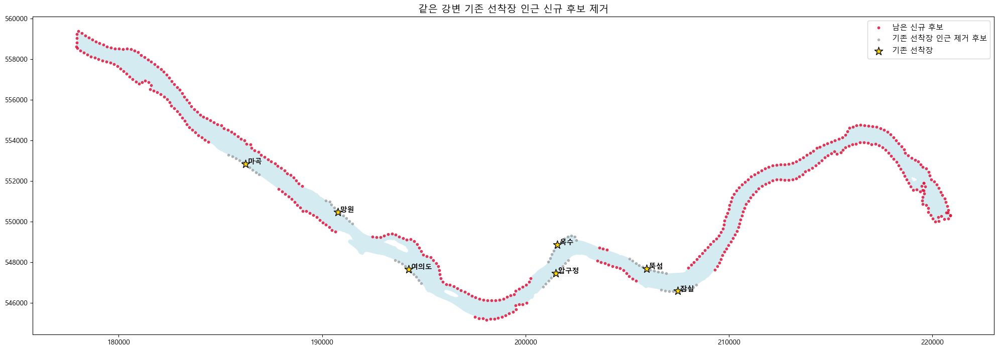

In [433]:
# ─── 제거 결과 지도 확인 ──────────────────────────────────────────

candidate_points_before_filter_gdf = gpd.GeoDataFrame(
    candidate_points_scored.copy(),
    geometry="geometry",
    crs="EPSG:4326"
).to_crs(gangbuk_gdf.crs)

candidate_points_final_gdf = gpd.GeoDataFrame(
    candidate_points_final.copy(),
    geometry="geometry",
    crs="EPSG:4326"
).to_crs(gangbuk_gdf.crs)

removed_candidate_points_gdf = gpd.GeoDataFrame(
    removed_candidate_points.copy(),
    geometry="geometry",
    crs="EPSG:4326"
).to_crs(gangbuk_gdf.crs)

fig, ax = plt.subplots(figsize=(20, 8))

hangang_final.plot(
    ax=ax,
    color="lightblue",
    alpha=0.5,
    label="한강 본류"
)

# 제거 후 남은 후보
candidate_points_final_gdf.plot(
    ax=ax,
    color="crimson",
    markersize=10,
    alpha=0.8,
    label="남은 신규 후보"
)

# 제거된 후보
removed_candidate_points_gdf.plot(
    ax=ax,
    color="gray",
    markersize=9,
    alpha=0.5,
    label="기존 선착장 인근 제거 후보"
)

# 업데이트된 기존 선착장
dock_points_projected.plot(
    ax=ax,
    color="gold",
    edgecolor="black",
    markersize=150,
    marker="*",
    label="기존 선착장"
)

for _, row in dock_points_projected.iterrows():
    ax.text(
        row.geometry.x,
        row.geometry.y,
        f" {row['선착장명']}",
        fontsize=10,
        fontweight="bold"
    )

plt.legend(fontsize=11)
plt.title("같은 강변 기존 선착장 인근 신규 후보 제거", fontsize=14)
plt.tight_layout()
plt.show()

In [434]:
## 여기서부터는 이제 가중치 고려하기 ##
#################################
#################################
#################################

# ─── 1차 입지점수 가중치 ──────────────────────────────────────────

WEIGHTS = {
    "n_지하철_접근성_피처": 0.30,
    "n_인구_피처": 0.15,
    "n_직장인_피처": 0.20,
    "n_장소_접근성_피처": 0.25,
    "n_SNS_피처": 0.10
}

print("가중치 합:", sum(WEIGHTS.values()))

가중치 합: 1.0


In [435]:
# ─── 가중치 점수 계산 함수 ────────────────────────────────────────

def add_weighted_score(df, weights, score_col="입지점수"):
    result_df = df.copy()

    result_df[score_col] = 0

    for feature_col, weight in weights.items():
        result_df[score_col] += result_df[feature_col] * weight

    # 0~100점처럼 보기 좋게 변환
    result_df[score_col] = result_df[score_col] * 100

    return result_df

# ─── 신규 후보지 점수 계산 ────────────────────────────────────────

candidate_points_final = add_weighted_score(
    candidate_points_final,
    WEIGHTS,
    score_col="입지점수"
)

candidate_points_final["입지순위"] = (
    candidate_points_final["입지점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

candidate_points_final = candidate_points_final.sort_values(
    "입지순위"
).reset_index(drop=True)

candidate_points_final[
    [
        "입지순위",
        "후보ID",
        "강변구분",
        "입지점수",
        "n_지하철_접근성_피처",
        "n_인구_피처",
        "n_직장인_피처",
        "n_장소_접근성_피처",
        "n_SNS_피처",
        "가장가까운_같은강변_기존선착장",
        "같은강변_기존선착장_최소거리(m)"
    ]
].head(50)

,입지순위,후보ID,강변구분,입지점수,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처,가장가까운_같은강변_기존선착장,같은강변_기존선착장_최소거리(m)
0,1,C0441,남쪽,62.295503,0.996544,0.689228,0.087750,0.789653,0.056445,압구정,2039.4
1,2,C0442,남쪽,60.496330,0.924982,0.611304,0.072922,0.859053,0.064254,압구정,2218.8
2,3,C0445,남쪽,55.219009,0.782053,0.468161,0.055022,0.915891,0.073729,압구정,2636.4
3,4,C0443,남쪽,53.885678,0.737297,0.513085,0.050883,0.894065,0.070123,압구정,2364.9
4,5,C0446,남쪽,49.244738,0.673614,0.417926,0.045983,0.846868,0.067607,압구정,2825.9
5,6,C0444,남쪽,48.454895,0.599602,0.446811,0.037076,0.891693,0.073081,압구정,2513.2
6,7,C0100,북쪽,44.266169,0.698185,0.540981,0.191821,0.392762,0.155043,망원,2544.9
7,8,C0101,북쪽,44.093775,0.676544,0.559294,0.192414,0.398067,0.160810,망원,2675.7
8,9,C0097,북쪽,44.038259,0.744899,0.443752,0.164899,0.416028,0.133631,망원,2078.6
9,10,C0098,북쪽,43.307206,0.706808,0.484415,0.174201,0.398726,0.138457,망원,2260.2


In [439]:
import folium

# ─── 1. TOP 50 후보 추출 ─────────────────────────────────────────

top50_candidates = candidate_points_final.head(50).copy()

print("TOP 50 후보 수:", len(top50_candidates))

top50_candidates[
    [
        "입지순위",
        "후보ID",
        "강변구분",
        "위도",
        "경도",
        "입지점수"
    ]
].head()

# ─── 2. 지도 중심 설정 ────────────────────────────────────────────

center_lat = top50_candidates["위도"].mean()
center_lon = top50_candidates["경도"].mean()

m_top50 = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles="cartodbpositron"
)

# ─── 3. 기존 선착장 표시 ──────────────────────────────────────────

dock_group = folium.FeatureGroup(
    name="기존 한강버스 선착장"
).add_to(m_top50)

for _, row in dock_points_scored.iterrows():

    popup_html = f"""
    <b>기존 선착장: {row['선착장명']}</b><br>
    강변구분: {row['강변구분']}<br>
    입지점수: {row['입지점수']:.2f}
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(popup_html, max_width=280),
        tooltip=f"기존 선착장: {row['선착장명']}",
        icon=folium.Icon(
            color="blue",
            icon="ship",
            prefix="fa"
        )
    ).add_to(dock_group)

TOP 50 후보 수: 50


In [440]:
# ─── 기존 선착장 점수 계산 ────────────────────────────────────────

dock_points_scored = add_weighted_score(
    dock_points_scored,
    WEIGHTS,
    score_col="입지점수"
)

dock_points_scored["입지순위_기존선착장내"] = (
    dock_points_scored["입지점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_points_scored = dock_points_scored.sort_values(
    "입지순위_기존선착장내"
).reset_index(drop=True)

dock_points_scored[
    [
        "입지순위_기존선착장내",
        "선착장ID",
        "선착장명",
        "강변구분",
        "입지점수",
        "n_지하철_접근성_피처",
        "n_인구_피처",
        "n_직장인_피처",
        "n_장소_접근성_피처",
        "n_SNS_피처"
    ]
]

# ─── 4. 순위 구간별 색상 함수 ─────────────────────────────────────

def get_rank_color(rank):
    if rank <= 10:
        return "red"
    elif rank <= 20:
        return "orange"
    elif rank <= 30:
        return "green"
    elif rank <= 40:
        return "purple"
    else:
        return "cadetblue"
    
# ─── 5. TOP 50 후보 표시 ─────────────────────────────────────────

top50_group = folium.FeatureGroup(
    name="입지점수 TOP 50 후보"
).add_to(m_top50)

for _, row in top50_candidates.iterrows():

    rank = int(row["입지순위"])
    color = get_rank_color(rank)

    popup_html = f"""
    <b>입지순위 {rank}위</b><br>
    후보ID: {row['후보ID']}<br>
    강변구분: {row['강변구분']}<br>
    입지점수: {row['입지점수']:.2f}<br><br>

    <b>정규화 피처</b><br>
    지하철: {row['n_지하철_접근성_피처']:.3f}<br>
    인구: {row['n_인구_피처']:.3f}<br>
    직장인: {row['n_직장인_피처']:.3f}<br>
    장소: {row['n_장소_접근성_피처']:.3f}<br>
    SNS: {row['n_SNS_피처']:.3f}<br><br>

    <b>기존 선착장과 거리</b><br>
    가장 가까운 같은 강변 선착장: {row['가장가까운_같은강변_기존선착장']}<br>
    거리: {row['같은강변_기존선착장_최소거리(m)']:.1f}m
    """

    # 후보점 원형 마커
    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=8 if rank <= 10 else 6,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.85,
        weight=2,
        popup=folium.Popup(popup_html, max_width=340),
        tooltip=f"{rank}위 | {row['후보ID']} | {row['입지점수']:.1f}점"
    ).add_to(top50_group)

    # 순위 숫자 라벨
    folium.Marker(
        location=[row["위도"], row["경도"]],
        icon=folium.DivIcon(
            html=f"""
            <div style="
                font-size:10px;
                font-weight:bold;
                color:white;
                background:{'#d7191c' if rank <= 10 else '#444'};
                border:1px solid white;
                border-radius:50%;
                width:20px;
                height:20px;
                line-height:20px;
                text-align:center;">
                {rank}
            </div>
            """
        )
    ).add_to(top50_group)


    # ─── 6. 지도 범위를 TOP 50 후보에 맞추기 ─────────────────────────

top50_bounds = [
    [top50_candidates["위도"].min(), top50_candidates["경도"].min()],
    [top50_candidates["위도"].max(), top50_candidates["경도"].max()]
]

m_top50.fit_bounds(top50_bounds)

folium.LayerControl().add_to(m_top50)

m_top50

m_top50.save("한강버스_입지점수_TOP50_후보지도.html")
print("저장 완료: 한강버스_입지점수_TOP50_후보지도.html")

저장 완료: 한강버스_입지점수_TOP50_후보지도.html


In [441]:
# ─── 피처별 점수 기여도 컬럼 추가 ────────────────────────────────

CONTRIBUTION_NAMES = {
    "n_지하철_접근성_피처": "지하철_기여점수",
    "n_인구_피처": "인구_기여점수",
    "n_직장인_피처": "직장인_기여점수",
    "n_장소_접근성_피처": "장소_기여점수",
    "n_SNS_피처": "SNS_기여점수"
}

for feature_col, contribution_col in CONTRIBUTION_NAMES.items():
    candidate_points_final[contribution_col] = (
        candidate_points_final[feature_col]
        * WEIGHTS[feature_col]
        * 100
    )

    dock_points_scored[contribution_col] = (
        dock_points_scored[feature_col]
        * WEIGHTS[feature_col]
        * 100
    )

candidate_points_final[
    [
        "입지순위",
        "후보ID",
        "입지점수",
        "지하철_기여점수",
        "인구_기여점수",
        "직장인_기여점수",
        "장소_기여점수",
        "SNS_기여점수"
    ]
].head(10)

,입지순위,후보ID,입지점수,지하철_기여점수,인구_기여점수,직장인_기여점수,장소_기여점수,SNS_기여점수
0,1,C0441,62.295503,29.896314,10.338415,1.755000,19.741321,0.564453
1,2,C0442,60.496330,27.749463,9.169558,1.458445,21.476322,0.642542
2,3,C0445,55.219009,23.461597,7.022411,1.100446,22.897266,0.737288
3,4,C0443,53.885678,22.118902,7.696281,1.017652,22.351613,0.701230
4,5,C0446,49.244738,20.208423,6.268891,0.919658,21.171698,0.676069
5,6,C0444,48.454895,17.988054,6.702167,0.741529,22.292333,0.730811
6,7,C0100,44.266169,20.945548,8.114715,3.836430,9.819045,1.550433
7,8,C0101,44.093775,20.296318,8.389408,3.848281,9.951665,1.608103
8,9,C0097,44.038259,22.346967,6.656287,3.297986,10.400710,1.336309
9,10,C0098,43.307206,21.204251,7.266224,3.484016,9.968139,1.384575


In [442]:
## 이제 가중치 조절하기

import numpy as np
import pandas as pd

# ─── Random Search에 사용할 정규화 피처 ───────────────────────────

search_feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

search_feature_names = [
    "지하철",
    "인구",
    "직장인",
    "장소",
    "SNS"
]

# 현재 기준 가중치
base_weights = np.array([
    0.30,  # 지하철
    0.15,  # 인구
    0.20,  # 직장인
    0.25,  # 장소
    0.10   # SNS
])

print("피처:", search_feature_names)
print("기존 가중치 합:", base_weights.sum())

피처: ['지하철', '인구', '직장인', '장소', 'SNS']
기존 가중치 합: 0.9999999999999999


In [445]:
# ─── 기존 선착장 Random Search용 데이터 ───────────────────────────

dock_search_df = dock_points_scored.copy()

dock_search_df[
    [
        "선착장명"
    ] + search_feature_cols
]

,선착장명,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
0,여의도,0.585262,0.346875,0.753805,0.946332,0.958470
1,망원,0.113457,0.741165,0.208787,0.660168,0.006010
2,잠실,0.402027,0.628564,0.094565,0.401745,0.167461
3,뚝섬,0.210568,0.591202,0.070609,0.655055,0.096711
4,마곡,0.136405,0.457152,0.339402,0.547312,0.033108
5,옥수,0.313554,0.471712,0.095924,0.181214,0.041263
6,압구정,0.387405,0.460158,0.090346,0.032930,0.007760


In [446]:
# ─── 가중치 조합으로 점수 계산하는 함수 ────────────────────────────

def calculate_weighted_scores(df, feature_cols, weights):
    X = df[feature_cols].to_numpy()
    scores = X @ weights
    return scores

In [447]:
# ─── Random Search: 여의도 1위, 잠실 2위 가중치 찾기 ──────────────

np.random.seed(42)

N_SEARCH = 100000

valid_weight_results = []

for i in range(N_SEARCH):

    # 가중치 5개를 랜덤 생성: 모두 양수, 합계 1
    random_weights = np.random.dirichlet(
        alpha=np.ones(len(search_feature_cols))
    )

    # 기존 선착장 점수 계산
    scores = calculate_weighted_scores(
        dock_search_df,
        search_feature_cols,
        random_weights
    )

    temp = dock_search_df[["선착장명"]].copy()
    temp["점수"] = scores

    temp = temp.sort_values(
        "점수",
        ascending=False
    ).reset_index(drop=True)

    first_place = temp.loc[0, "선착장명"]
    second_place = temp.loc[1, "선착장명"]

    # 조건: 여의도 1위, 잠실 2위
    if (first_place == "여의도") and (second_place == "잠실"):

        # 기존 가중치와의 차이
        distance_from_base = np.sqrt(
            np.sum((random_weights - base_weights) ** 2)
        )

        valid_weight_results.append({
            "지하철_가중치": random_weights[0],
            "인구_가중치": random_weights[1],
            "직장인_가중치": random_weights[2],
            "장소_가중치": random_weights[3],
            "SNS_가중치": random_weights[4],
            "기존가중치와거리": distance_from_base,
            "여의도점수": temp.loc[temp["선착장명"] == "여의도", "점수"].values[0],
            "잠실점수": temp.loc[temp["선착장명"] == "잠실", "점수"].values[0]
        })

valid_weights_df = pd.DataFrame(valid_weight_results)

print("전체 탐색 수:", N_SEARCH)
print("조건 만족 가중치 조합 수:", len(valid_weights_df))

전체 탐색 수: 100000
조건 만족 가중치 조합 수: 39771


In [450]:
valid_weights_df.sort_values(
    "기존가중치와거리",
    ascending=True
).head(20)

,지하철_가중치,인구_가중치,직장인_가중치,장소_가중치,SNS_가중치,기존가중치와거리,여의도점수,잠실점수
16173,0.293206,0.138978,0.199256,0.247936,0.120624,0.024450,0.720255,0.343883
35904,0.323675,0.137906,0.206116,0.240640,0.091662,0.030022,0.708223,0.348326
18209,0.315770,0.173780,0.204604,0.223908,0.081938,0.042923,0.689746,0.359203
10343,0.298707,0.157993,0.217359,0.212438,0.113503,0.044274,0.703298,0.344305
23685,0.317566,0.138664,0.210422,0.214867,0.118482,0.046061,0.709472,0.340890
26449,0.335657,0.123660,0.208575,0.246843,0.085265,0.047600,0.711886,0.345842
24121,0.283470,0.146371,0.225101,0.220767,0.124291,0.048591,0.714407,0.336759
6678,0.321544,0.143331,0.215867,0.210820,0.108437,0.048648,0.704067,0.342631
19778,0.341543,0.137909,0.199468,0.244773,0.076307,0.049608,0.702864,0.353971
25158,0.296785,0.167102,0.159010,0.253687,0.123415,0.050447,0.709885,0.361972


In [451]:
# ─── 기존 가중치와 가장 가까운 조합 선택 ─────────────────────────

best_weight_row = valid_weights_df.sort_values(
    "기존가중치와거리",
    ascending=True
).iloc[0]

best_weights = np.array([
    best_weight_row["지하철_가중치"],
    best_weight_row["인구_가중치"],
    best_weight_row["직장인_가중치"],
    best_weight_row["장소_가중치"],
    best_weight_row["SNS_가중치"]
])

best_weights_df = pd.DataFrame({
    "피처": search_feature_names,
    "기존가중치": base_weights,
    "RandomSearch_가중치": best_weights
})

best_weights_df

,피처,기존가중치,RandomSearch_가중치
0,지하철,0.30,0.293206
1,인구,0.15,0.138978
2,직장인,0.20,0.199256
3,장소,0.25,0.247936
4,SNS,0.10,0.120624


In [452]:
# ─── 선택 가중치 기준 기존 선착장 순위 확인 ───────────────────────

dock_search_df["RandomSearch_점수"] = calculate_weighted_scores(
    dock_search_df,
    search_feature_cols,
    best_weights
) * 100

dock_search_df["RandomSearch_순위"] = (
    dock_search_df["RandomSearch_점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_search_df[
    [
        "RandomSearch_순위",
        "선착장ID",
        "선착장명",
        "RandomSearch_점수"
    ] + search_feature_cols
].sort_values(
    "RandomSearch_순위"
)

,RandomSearch_순위,선착장ID,선착장명,RandomSearch_점수,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
0,1,D003,여의도,72.025460,0.585262,0.346875,0.753805,0.946332,0.958470
2,2,D007,잠실,34.388271,0.402027,0.628564,0.094565,0.401745,0.167461
1,3,D002,망원,34.227810,0.113457,0.741165,0.208787,0.660168,0.006010
3,4,D006,뚝섬,33.205043,0.210568,0.591202,0.070609,0.655055,0.096711
4,5,D001,마곡,31.084843,0.136405,0.457152,0.339402,0.547312,0.033108
5,6,D004,옥수,22.651385,0.313554,0.471712,0.095924,0.181214,0.041263
6,7,D005,압구정,20.464378,0.387405,0.460158,0.090346,0.032930,0.007760


In [453]:
# ─── Random Search 최종 가중치 딕셔너리 ───────────────────────────

BEST_WEIGHTS = {
    "n_지하철_접근성_피처": best_weights[0],
    "n_인구_피처": best_weights[1],
    "n_직장인_피처": best_weights[2],
    "n_장소_접근성_피처": best_weights[3],
    "n_SNS_피처": best_weights[4]
}

BEST_WEIGHTS

{'n_지하철_접근성_피처': np.float64(0.2932063440555589),
 'n_인구_피처': np.float64(0.13897801600163862),
 'n_직장인_피처': np.float64(0.19925555253752295),
 'n_장소_접근성_피처': np.float64(0.24793585657037207),
 'n_SNS_피처': np.float64(0.12062423083490739)}

In [454]:
# ─── Random Search 가중치로 신규 후보 점수 계산 ───────────────────

candidate_points_final["RandomSearch_입지점수"] = (
    candidate_points_final[search_feature_cols].to_numpy()
    @ best_weights
) * 100

candidate_points_final["RandomSearch_입지순위"] = (
    candidate_points_final["RandomSearch_입지점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

candidate_points_final_random = candidate_points_final.sort_values(
    "RandomSearch_입지순위"
).reset_index(drop=True)

candidate_points_final_random[
    [
        "RandomSearch_입지순위",
        "후보ID",
        "강변구분",
        "RandomSearch_입지점수",
        "n_지하철_접근성_피처",
        "n_인구_피처",
        "n_직장인_피처",
        "n_장소_접근성_피처",
        "n_SNS_피처",
        "가장가까운_같은강변_기존선착장",
        "같은강변_기존선착장_최소거리(m)"
    ]
].head(50)

,RandomSearch_입지순위,후보ID,강변구분,RandomSearch_입지점수,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처,가장가까운_같은강변_기존선착장,같은강변_기존선착장_최소거리(m)
0,1,C0441,남쪽,60.805705,0.996544,0.689228,0.087750,0.789653,0.056445,압구정,2039.4
1,2,C0442,남쪽,59.143920,0.924982,0.611304,0.072922,0.859053,0.064254,압구정,2218.8
2,3,C0445,남쪽,54.130613,0.782053,0.468161,0.055022,0.915891,0.073729,압구정,2636.4
3,4,C0443,남쪽,52.775549,0.737297,0.513085,0.050883,0.894065,0.070123,압구정,2364.9
4,5,C0446,남쪽,48.287675,0.673614,0.417926,0.045983,0.846868,0.067607,압구정,2825.9
5,6,C0444,남쪽,47.518977,0.599602,0.446811,0.037076,0.891693,0.073081,압구정,2513.2
6,7,C0100,북쪽,43.419991,0.698185,0.540981,0.191821,0.392762,0.155043,망원,2544.9
7,8,C0101,북쪽,43.252870,0.676544,0.559294,0.192414,0.398067,0.160810,망원,2675.7
8,9,C0097,북쪽,43.220550,0.744899,0.443752,0.164899,0.416028,0.133631,망원,2078.6
9,10,C0098,북쪽,42.483390,0.706808,0.484415,0.174201,0.398726,0.138457,망원,2260.2


In [455]:
# ─── Random Search 기준 TOP 50 후보 추출 ─────────────────────────

top50_random_candidates = candidate_points_final_random.head(50).copy()

print("Random Search TOP 50 후보 수:", len(top50_random_candidates))

top50_random_candidates[
    [
        "RandomSearch_입지순위",
        "후보ID",
        "강변구분",
        "위도",
        "경도",
        "RandomSearch_입지점수"
    ]
].head()

Random Search TOP 50 후보 수: 50


,RandomSearch_입지순위,후보ID,강변구분,위도,경도,RandomSearch_입지점수
0,1,C0441,남쪽,37.513410,127.000582,60.805705
1,2,C0442,남쪽,37.512814,126.998466,59.143920
2,3,C0445,남쪽,37.510544,126.994660,54.130613
3,4,C0443,남쪽,37.512688,126.996376,52.775549
4,5,C0446,남쪽,37.509490,126.992964,48.287675


In [457]:
import folium

# ─── 1. Random Search TOP 50 후보 준비 ────────────────────────────

top50_random_candidates = candidate_points_final_random.head(50).copy()

# ─── 2. 지도 중심 설정 ────────────────────────────────────────────

center_lat = top50_random_candidates["위도"].mean()
center_lon = top50_random_candidates["경도"].mean()

m_random_top50 = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles="cartodbpositron"
)

# ─── 4. 순위 구간별 색상 ──────────────────────────────────────────

def get_top50_color(rank):
    if rank <= 10:
        return "red"
    elif rank <= 20:
        return "orange"
    elif rank <= 30:
        return "green"
    elif rank <= 40:
        return "purple"
    else:
        return "cadetblue"
    


# ─── 5. Random Search TOP 50 후보 표시 ────────────────────────────

top50_group = folium.FeatureGroup(
    name="Random Search TOP 50 후보"
).add_to(m_random_top50)

for _, row in top50_random_candidates.iterrows():

    rank = int(row["RandomSearch_입지순위"])
    color = get_top50_color(rank)

    popup_html = f"""
    <div style="width:320px">
        <b>Random Search 입지순위 {rank}위</b><br>
        후보ID: {row['후보ID']}<br>
        강변구분: {row['강변구분']}<br>
        위도: {row['위도']:.6f}<br>
        경도: {row['경도']:.6f}<br>
        <b>Random Search 입지점수: {row['RandomSearch_입지점수']:.2f}</b><br>
        <hr>

        <b>정규화 피처</b><br>
        지하철: {row['n_지하철_접근성_피처']:.3f}<br>
        인구: {row['n_인구_피처']:.3f}<br>
        직장인: {row['n_직장인_피처']:.3f}<br>
        장소: {row['n_장소_접근성_피처']:.3f}<br>
        SNS: {row['n_SNS_피처']:.3f}<br>
        <hr>

        <b>기존 선착장 거리</b><br>
        가장 가까운 같은 강변 선착장: {row['가장가까운_같은강변_기존선착장']}<br>
        거리: {row['같은강변_기존선착장_최소거리(m)']:.1f}m
    </div>
    """

    # 후보 원형 마커
    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=9 if rank <= 10 else 7,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.88,
        weight=2,
        popup=folium.Popup(popup_html, max_width=360),
        tooltip=f"{rank}위 | {row['후보ID']} | {row['RandomSearch_입지점수']:.1f}점"
    ).add_to(top50_group)

    # 순위 라벨
    label_background = "#d7191c" if rank <= 10 else "#333333"

    folium.Marker(
        location=[row["위도"], row["경도"]],
        icon=folium.DivIcon(
            html=f"""
            <div style="
                font-size:10px;
                font-weight:bold;
                color:white;
                background:{label_background};
                border:1px solid white;
                border-radius:50%;
                width:22px;
                height:22px;
                line-height:22px;
                text-align:center;
                box-shadow:0 1px 3px rgba(0,0,0,0.45);">
                {rank}
            </div>
            """
        )
    ).add_to(top50_group)


# ─── 6. 지도 범위 설정 / 레이어 컨트롤 / HTML 저장 ────────────────

top50_bounds = [
    [
        top50_random_candidates["위도"].min(),
        top50_random_candidates["경도"].min()
    ],
    [
        top50_random_candidates["위도"].max(),
        top50_random_candidates["경도"].max()
    ]
]

m_random_top50.fit_bounds(top50_bounds)

folium.LayerControl().add_to(m_random_top50)

output_map_path = "한강버스_RandomSearch_TOP50_후보지도.html"

m_random_top50.save(output_map_path)

print("HTML 지도 저장 완료:", output_map_path)

m_random_top50

HTML 지도 저장 완료: 한강버스_RandomSearch_TOP50_후보지도.html


In [458]:
from sklearn.cluster import DBSCAN
import geopandas as gpd
import numpy as np
import pandas as pd

# ─── 1. Random Search TOP 50 후보 준비 ────────────────────────────

top50_random_candidates = candidate_points_final_random.head(50).copy()

top50_gdf = gpd.GeoDataFrame(
    top50_random_candidates.copy(),
    geometry="geometry",
    crs="EPSG:4326"
)

# 거리 계산을 위해 meter 단위 좌표계로 변환
top50_gdf_projected = top50_gdf.to_crs(gangbuk_gdf.crs)

top50_gdf_projected.head()


# ─── 2. 가까운 후보끼리 묶기 ──────────────────────────────────────

CLUSTER_DISTANCE_M = 500

coords_for_cluster = np.column_stack([
    top50_gdf_projected.geometry.x,
    top50_gdf_projected.geometry.y
])

dbscan = DBSCAN(
    eps=CLUSTER_DISTANCE_M,  # 이 거리 안에 있으면 같은 군집 후보
    min_samples=1            # 혼자 있는 점도 하나의 군집으로 유지
)

top50_gdf_projected["후보권역ID"] = dbscan.fit_predict(coords_for_cluster)

print("TOP 50 후보 수:", len(top50_gdf_projected))
print("묶인 후보 권역 수:", top50_gdf_projected["후보권역ID"].nunique())

top50_gdf_projected[
    [
        "후보권역ID",
        "후보ID",
        "RandomSearch_입지순위",
        "RandomSearch_입지점수"
    ]
].head()


# ─── 3. 후보 권역별 대표점 요약 ───────────────────────────────────

cluster_rows = []

for cluster_id, group in top50_gdf_projected.groupby("후보권역ID"):

    # 군집 중심 좌표
    center_x = group.geometry.x.mean()
    center_y = group.geometry.y.mean()

    # 이 권역에서 가장 순위 높은 후보
    best_candidate = group.sort_values(
        "RandomSearch_입지순위"
    ).iloc[0]

    cluster_rows.append({
        "후보권역ID": cluster_id,
        "권역후보수": len(group),
        "대표후보ID": best_candidate["후보ID"],
        "권역최고순위": int(group["RandomSearch_입지순위"].min()),
        "권역최고점수": group["RandomSearch_입지점수"].max(),
        "권역평균점수": group["RandomSearch_입지점수"].mean(),
        "권역후보ID목록": ", ".join(group["후보ID"].astype(str).tolist()),
        "권역순위목록": ", ".join(
            group["RandomSearch_입지순위"].astype(int).astype(str).tolist()
        ),
        "geometry": gpd.points_from_xy([center_x], [center_y])[0]
    })

top50_cluster_gdf_projected = gpd.GeoDataFrame(
    cluster_rows,
    geometry="geometry",
    crs=top50_gdf_projected.crs
)

# 지도용 위경도 변환
top50_cluster_gdf = top50_cluster_gdf_projected.to_crs(epsg=4326).copy()

top50_cluster_gdf["경도"] = top50_cluster_gdf.geometry.x
top50_cluster_gdf["위도"] = top50_cluster_gdf.geometry.y

top50_cluster_gdf.sort_values("권역최고순위").head()

TOP 50 후보 수: 50
묶인 후보 권역 수: 9


,후보권역ID,권역후보수,대표후보ID,권역최고순위,권역최고점수,권역평균점수,권역후보ID목록,권역순위목록,geometry,경도,위도
0,0,8,C0441,1,60.805705,49.123378,"C0441, C0442, C0445, C0443, C0446, C0444, C044...","1, 2, 3, 4, 5, 6, 13, 28",POINT (126.99469 37.51099),126.994692,37.510993
1,1,15,C0100,7,43.419991,34.657485,"C0100, C0101, C0097, C0098, C0099, C0102, C010...","7, 8, 9, 10, 11, 12, 19, 20, 26, 31, 36, 39, 4...",POINT (126.92947 37.54168),126.929473,37.541680
2,2,8,C0197,14,34.492088,31.368416,"C0197, C0196, C0195, C0198, C0194, C0199, C019...","14, 15, 17, 18, 27, 33, 38, 46",POINT (127.096 37.53346),127.095998,37.533456
3,3,3,C0407,16,33.756490,30.504029,"C0407, C0408, C0409","16, 30, 44",POINT (127.05957 37.52419),127.059565,37.524192
4,4,5,C0418,21,32.225333,30.529766,"C0418, C0417, C0416, C0415, C0414","21, 22, 29, 35, 40",POINT (127.04416 37.5309),127.044158,37.530896


In [459]:
import folium

# ─── 4. 후보 권역 지도 생성 ───────────────────────────────────────

center_lat = top50_cluster_gdf["위도"].mean()
center_lon = top50_cluster_gdf["경도"].mean()

m_cluster_top50 = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles="cartodbpositron"
)

# ─── 5. 기존 선착장 표시 ──────────────────────────────────────────

dock_group = folium.FeatureGroup(
    name="기존 한강버스 선착장"
).add_to(m_cluster_top50)

for _, row in dock_points_scored.iterrows():

    popup_html = f"""
    <b>기존 선착장: {row['선착장명']}</b><br>
    강변구분: {row['강변구분']}<br>
    위도: {row['위도']:.6f}<br>
    경도: {row['경도']:.6f}
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(popup_html, max_width=280),
        tooltip=f"기존 선착장: {row['선착장명']}",
        icon=folium.Icon(
            color="blue",
            icon="ship",
            prefix="fa"
        )
    ).add_to(dock_group)


# ─── 6. TOP 50 후보 권역 큰 점 표시 ───────────────────────────────

cluster_group = folium.FeatureGroup(
    name="TOP 50 후보 권역"
).add_to(m_cluster_top50)

for _, row in top50_cluster_gdf.iterrows():

    best_rank = int(row["권역최고순위"])
    candidate_count = int(row["권역후보수"])

    # 순위가 좋을수록 붉게
    if best_rank <= 10:
        color = "red"
    elif best_rank <= 20:
        color = "orange"
    elif best_rank <= 30:
        color = "green"
    else:
        color = "purple"

    # 권역에 묶인 후보 수가 많을수록 점 크게
    radius = 8 + candidate_count * 2

    popup_html = f"""
    <div style="width:330px">
        <b>TOP 50 후보 권역 {int(row['후보권역ID'])}</b><br>
        권역 내 후보 수: {candidate_count}개<br>
        대표 후보ID: {row['대표후보ID']}<br>
        최고 순위: {best_rank}위<br>
        최고 점수: {row['권역최고점수']:.2f}<br>
        평균 점수: {row['권역평균점수']:.2f}<br>
        <hr>
        <b>포함 후보ID</b><br>
        {row['권역후보ID목록']}<br>
        <hr>
        <b>포함 순위</b><br>
        {row['권역순위목록']}
    </div>
    """

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=radius,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.72,
        weight=2,
        popup=folium.Popup(popup_html, max_width=380),
        tooltip=f"최고 {best_rank}위 | 후보 {candidate_count}개"
    ).add_to(cluster_group)

    # 권역 라벨: 최고 순위 표시
    folium.Marker(
        location=[row["위도"], row["경도"]],
        icon=folium.DivIcon(
            html=f"""
            <div style="
                font-size:11px;
                font-weight:bold;
                color:white;
                background:#222;
                border:1px solid white;
                border-radius:50%;
                width:24px;
                height:24px;
                line-height:24px;
                text-align:center;
                box-shadow:0 1px 4px rgba(0,0,0,0.5);">
                {best_rank}
            </div>
            """
        )
    ).add_to(cluster_group)

# ─── 7. 지도 범위 설정 및 HTML 저장 ───────────────────────────────

cluster_bounds = [
    [
        top50_cluster_gdf["위도"].min(),
        top50_cluster_gdf["경도"].min()
    ],
    [
        top50_cluster_gdf["위도"].max(),
        top50_cluster_gdf["경도"].max()
    ]
]

m_cluster_top50.fit_bounds(cluster_bounds)

folium.LayerControl().add_to(m_cluster_top50)

cluster_map_path = "한강버스_RandomSearch_TOP50_후보권역지도.html"

m_cluster_top50.save(cluster_map_path)

print("HTML 지도 저장 완료:", cluster_map_path)

m_cluster_top50

HTML 지도 저장 완료: 한강버스_RandomSearch_TOP50_후보권역지도.html


In [460]:
# ─── 점수를 높이고 싶은 신규 후보 ID ─────────────────────────────

target_candidate_ids = [
    "C0126",
    "C0125",
    "C0127",
    "C0124",
    "C0128"
]

target_candidate_ids

# ─── 목표 후보들이 현재 최종 후보군에 있는지 확인 ────────────────

target_candidates_df = candidate_points_final[
    candidate_points_final["후보ID"].isin(target_candidate_ids)
].copy()

print("찾은 목표 후보 수:", len(target_candidates_df))
print("못 찾은 후보:", sorted(set(target_candidate_ids) - set(target_candidates_df["후보ID"])))

target_candidates_df[
    [
        "후보ID",
        "강변구분",
        "RandomSearch_입지점수" if "RandomSearch_입지점수" in target_candidates_df.columns else "n_지하철_접근성_피처",
        "n_지하철_접근성_피처",
        "n_인구_피처",
        "n_직장인_피처",
        "n_장소_접근성_피처",
        "n_SNS_피처"
    ]
]

찾은 목표 후보 수: 5
못 찾은 후보: []


,후보ID,강변구분,RandomSearch_입지점수,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
21,C0126,북쪽,32.031704,0.525974,0.451651,0.170257,0.256257,0.048652
23,C0125,북쪽,31.807300,0.556222,0.474516,0.178436,0.199506,0.033316
32,C0127,북쪽,30.555968,0.453332,0.418618,0.151367,0.309617,0.062469
33,C0124,북쪽,29.960475,0.544388,0.480563,0.182037,0.140685,0.016964
40,C0128,북쪽,27.672419,0.339432,0.392355,0.126167,0.357265,0.074228


In [461]:
# ─── valid_weights_df에서 가중치 배열 추출 ────────────────────────

valid_weight_cols = [
    "지하철_가중치",
    "인구_가중치",
    "직장인_가중치",
    "장소_가중치",
    "SNS_가중치"
]

valid_weight_matrix = valid_weights_df[
    valid_weight_cols
].to_numpy()

print("여의도 1위 + 잠실 2위 조건 만족 가중치 수:", len(valid_weight_matrix))

# ─── 목표 후보 5개의 점수를 각 가중치 조합별로 계산 ──────────────

target_X = target_candidates_df[
    search_feature_cols
].to_numpy()

# shape:
# target_X = (목표후보 5개, 피처 5개)
# valid_weight_matrix.T = (피처 5개, 가중치조합 수)
target_score_matrix = (
    target_X @ valid_weight_matrix.T
) * 100

print("목표 후보 점수 행렬 shape:", target_score_matrix.shape)

여의도 1위 + 잠실 2위 조건 만족 가중치 수: 39771
목표 후보 점수 행렬 shape: (5, 39771)


In [463]:
# ─── valid_weights_df에 목표 후보 점수 요약 붙이기 ────────────────

valid_weights_target_df = valid_weights_df.copy()

valid_weights_target_df["타깃최저점수"] = target_score_matrix.min(axis=0)
valid_weights_target_df["타깃평균점수"] = target_score_matrix.mean(axis=0)
valid_weights_target_df["타깃최고점수"] = target_score_matrix.max(axis=0)

valid_weights_target_df[
    valid_weight_cols + [
        "타깃최저점수",
        "타깃평균점수",
        "타깃최고점수",
        "기존가중치와거리"
    ]
].sort_values(
    ["타깃최저점수", "타깃평균점수", "기존가중치와거리"],
    ascending=[False, False, True]
)

# ─── 목표 후보 5개를 최대한 높이는 가중치 선택 ────────────────────

target_best_weight_row = valid_weights_target_df.sort_values(
    ["타깃최저점수", "타깃평균점수", "기존가중치와거리"],
    ascending=[False, False, True]
).iloc[0]

target_best_weights = np.array([
    target_best_weight_row["지하철_가중치"],
    target_best_weight_row["인구_가중치"],
    target_best_weight_row["직장인_가중치"],
    target_best_weight_row["장소_가중치"],
    target_best_weight_row["SNS_가중치"]
])

target_best_weights_df = pd.DataFrame({
    "피처": search_feature_names,
    "기존가중치": base_weights,
    "이전_RS_가중치": best_weights,
    "타깃권역최적_가중치": target_best_weights
})

target_best_weights_df

,피처,기존가중치,이전_RS_가중치,타깃권역최적_가중치
0,지하철,0.30,0.293206,0.337148
1,인구,0.15,0.138978,0.503411
2,직장인,0.20,0.199256,0.008787
3,장소,0.25,0.247936,0.146414
4,SNS,0.10,0.120624,0.004240


In [464]:
# ─── 새 가중치 기준 기존 선착장 순위 확인 ────────────────────────

dock_target_check = dock_points_scored.copy()

dock_target_check["타깃최적화_점수"] = (
    dock_target_check[search_feature_cols].to_numpy()
    @ target_best_weights
) * 100

dock_target_check["타깃최적화_순위"] = (
    dock_target_check["타깃최적화_점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_target_check[
    [
        "타깃최적화_순위",
        "선착장ID",
        "선착장명",
        "타깃최적화_점수",
        "n_지하철_접근성_피처",
        "n_인구_피처",
        "n_직장인_피처",
        "n_장소_접근성_피처",
        "n_SNS_피처"
    ]
].sort_values(
    "타깃최적화_순위"
)

,타깃최적화_순위,선착장ID,선착장명,타깃최적화_점수,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
0,1,D003,여의도,52.118439,0.585262,0.346875,0.753805,0.946332,0.958470
2,2,D007,잠실,51.233064,0.402027,0.628564,0.094565,0.401745,0.167461
1,3,D002,망원,50.988006,0.113457,0.741165,0.208787,0.660168,0.006010
3,4,D006,뚝섬,46.554943,0.210568,0.591202,0.070609,0.655055,0.096711
5,5,D004,옥수,37.072940,0.313554,0.471712,0.095924,0.181214,0.041263
6,6,D005,압구정,36.790930,0.387405,0.460158,0.090346,0.032930,0.007760
4,7,D001,마곡,35.938094,0.136405,0.457152,0.339402,0.547312,0.033108


In [466]:
# ─── 타깃 권역 최적 가중치로 신규 후보 순위 재계산 ───────────────

candidate_points_target = candidate_points_final.copy()

candidate_points_target["타깃최적화_입지점수"] = (
    candidate_points_target[search_feature_cols].to_numpy()
    @ target_best_weights
) * 100

candidate_points_target["타깃최적화_입지순위"] = (
    candidate_points_target["타깃최적화_입지점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

candidate_points_target = candidate_points_target.sort_values(
    "타깃최적화_입지순위"
).reset_index(drop=True)

# ─── 목표 후보들의 새 순위 확인 ───────────────────────────────────

candidate_points_target[
    candidate_points_target["후보ID"].isin(target_candidate_ids)
][
    [
        "타깃최적화_입지순위",
        "후보ID",
        "강변구분",
        "타깃최적화_입지점수",
        "n_지하철_접근성_피처",
        "n_인구_피처",
        "n_직장인_피처",
        "n_장소_접근성_피처",
        "n_SNS_피처"
    ]
].sort_values(
    "타깃최적화_입지순위"
)

,타깃최적화_입지순위,후보ID,강변구분,타깃최적화_입지점수,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
36,37,C0125,북쪽,45.732547,0.556222,0.474516,0.178436,0.199506,0.033316
43,44,C0124,북쪽,44.772972,0.544388,0.480563,0.182037,0.140685,0.016964
46,47,C0126,북쪽,44.391884,0.525974,0.451651,0.170257,0.256257,0.048652
67,68,C0127,북쪽,41.050413,0.453332,0.418618,0.151367,0.309617,0.062469
80,81,C0128,북쪽,36.568626,0.339432,0.392355,0.126167,0.357265,0.074228


In [469]:
# ─── 타깃 권역 최적화 기준 TOP 50 ────────────────────────────────

top50_target_candidates = candidate_points_target.head(50).copy()

top50_target_candidates[
    [
        "타깃최적화_입지순위",
        "후보ID",
        "강변구분",
        "타깃최적화_입지점수",
        "n_지하철_접근성_피처",
        "n_인구_피처",
        "n_직장인_피처",
        "n_장소_접근성_피처",
        "n_SNS_피처"
    ]
]

,타깃최적화_입지순위,후보ID,강변구분,타깃최적화_입지점수,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
0,1,C0441,남쪽,79.957389,0.996544,0.689228,0.087750,0.789653,0.056445
1,2,C0442,남쪽,74.628328,0.924982,0.611304,0.072922,0.859053,0.064254
2,3,C0443,남쪽,63.851873,0.737297,0.513085,0.050883,0.894065,0.070123
3,4,C0445,남쪽,63.424004,0.782053,0.468161,0.055022,0.915891,0.073729
4,5,C0197,북쪽,59.303283,0.810760,0.633361,0.096246,0.000000,0.000000
5,6,C0196,북쪽,59.125316,0.794869,0.639469,0.094363,0.003552,0.000000
6,7,C0195,북쪽,57.866815,0.742989,0.643640,0.092205,0.022847,0.000000
7,8,C0198,북쪽,57.858615,0.757384,0.640321,0.101456,0.000000,0.000000
8,9,C0101,북쪽,57.030508,0.676544,0.559294,0.192414,0.398067,0.160810
9,10,C0100,북쪽,56.757603,0.698185,0.540981,0.191821,0.392762,0.155043


In [ ]:
# ============================================================
# 타깃 최적화 결과 TOP 50 후보 개별 위치 HTML 지도 시각화
# ------------------------------------------------------------
# 조건
# - 기존 선착장 순위 조건: 여의도 1위, 잠실 2위 반영 가중치 사용
# - 관심 후보:
#   C0126, C0125, C0127, C0124, C0128
# - 후보 권역으로 묶지 않고 TOP 50 후보를 개별 점으로 표시
# ============================================================

import folium
import pandas as pd

# ------------------------------------------------------------
# 0. 관심 후보 ID
# ------------------------------------------------------------

target_candidate_ids = [
    "C0126",
    "C0125",
    "C0127",
    "C0124",
    "C0128"
]

# ------------------------------------------------------------
# 1. 타깃 최적화 TOP 50 후보 준비
# ------------------------------------------------------------

top50_target_candidates = candidate_points_target.head(50).copy()

print("타깃 최적화 TOP 50 후보 수:", len(top50_target_candidates))

print("\nTOP 50 안에 들어온 관심 후보:")
display(
    top50_target_candidates[
        top50_target_candidates["후보ID"].isin(target_candidate_ids)
    ][
        [
            "타깃최적화_입지순위",
            "후보ID",
            "강변구분",
            "위도",
            "경도",
            "타깃최적화_입지점수"
        ]
    ].sort_values("타깃최적화_입지순위")
)

# ------------------------------------------------------------
# 2. 지도 중심 설정
# ------------------------------------------------------------

center_lat = top50_target_candidates["위도"].mean()
center_lon = top50_target_candidates["경도"].mean()

m_target_top50 = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles="cartodbpositron"
)

# ------------------------------------------------------------
# 3. 기존 한강버스 선착장 표시
# ------------------------------------------------------------

dock_group = folium.FeatureGroup(
    name="기존 한강버스 선착장"
).add_to(m_target_top50)

for _, row in dock_points_scored.iterrows():

    # 기존 선착장 점수 컬럼이 있으면 표시하고, 없으면 생략
    dock_score_text = ""

    if "입지점수" in dock_points_scored.columns:
        dock_score_text += f"<b>기존 가중치 입지점수:</b> {row['입지점수']:.2f}<br>"

    if "RandomSearch_점수" in dock_points_scored.columns:
        dock_score_text += f"<b>Random Search 점수:</b> {row['RandomSearch_점수']:.2f}<br>"

    dock_popup_html = f"""
    <div style="width:320px">
        <h4 style="margin:0 0 8px 0;">기존 선착장: {row['선착장명']}</h4>

        <b>선착장ID:</b> {row['선착장ID']}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}<br>
        {dock_score_text}

        <hr style="margin:8px 0;">

        <b>정규화 피처</b><br>
        지하철: {row['n_지하철_접근성_피처']:.3f}<br>
        인구: {row['n_인구_피처']:.3f}<br>
        직장인: {row['n_직장인_피처']:.3f}<br>
        장소: {row['n_장소_접근성_피처']:.3f}<br>
        SNS: {row['n_SNS_피처']:.3f}<br>
    </div>
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(dock_popup_html, max_width=360),
        tooltip=f"기존 선착장: {row['선착장명']}",
        icon=folium.Icon(
            color="blue",
            icon="ship",
            prefix="fa"
        )
    ).add_to(dock_group)

# ------------------------------------------------------------
# 4. TOP 50 후보 개별 위치 표시
# ------------------------------------------------------------

top50_group = folium.FeatureGroup(
    name="타깃 최적화 TOP 50 후보"
).add_to(m_target_top50)

for _, row in top50_target_candidates.iterrows():

    rank = int(row["타깃최적화_입지순위"])
    is_target_candidate = row["후보ID"] in target_candidate_ids

    # 관심 후보는 노랑 + 검은 테두리로 강조
    # 나머지는 순위 구간별 색상
    if is_target_candidate:
        marker_color = "black"
        fill_color = "yellow"
        label_background = "#000000"
        marker_radius = 10

    elif rank <= 10:
        marker_color = "red"
        fill_color = "red"
        label_background = "#d7191c"
        marker_radius = 9

    elif rank <= 20:
        marker_color = "orange"
        fill_color = "orange"
        label_background = "#f57c00"
        marker_radius = 7

    elif rank <= 30:
        marker_color = "green"
        fill_color = "green"
        label_background = "#2e7d32"
        marker_radius = 7

    elif rank <= 40:
        marker_color = "purple"
        fill_color = "purple"
        label_background = "#6a1b9a"
        marker_radius = 7

    else:
        marker_color = "cadetblue"
        fill_color = "cadetblue"
        label_background = "#2f6f7e"
        marker_radius = 7

    target_label_text = (
        "<b style='color:#d7191c;'>관심 후보</b><br>"
        if is_target_candidate
        else ""
    )

    popup_html = f"""
    <div style="width:360px">
        <h4 style="margin:0 0 8px 0;">타깃 최적화 신규 후보</h4>

        {target_label_text}

        <b>타깃 최적화 순위:</b> {rank}위<br>
        <b>후보ID:</b> {row['후보ID']}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <b>타깃 최적화 점수:</b> {row['타깃최적화_입지점수']:.2f}<br>
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}<br>

        <hr style="margin:8px 0;">

        <b>정규화 피처</b><br>
        지하철: {row['n_지하철_접근성_피처']:.3f}<br>
        인구: {row['n_인구_피처']:.3f}<br>
        직장인: {row['n_직장인_피처']:.3f}<br>
        장소: {row['n_장소_접근성_피처']:.3f}<br>
        SNS: {row['n_SNS_피처']:.3f}<br>

        <hr style="margin:8px 0;">

        <b>기존 선착장과 거리</b><br>
        가장 가까운 같은 강변 기존 선착장:<br>
        {row['가장가까운_같은강변_기존선착장']}<br>
        거리: {row['같은강변_기존선착장_최소거리(m)']:.1f}m
    </div>
    """

    # 후보 원형 점
    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=marker_radius,
        color=marker_color,
        fill=True,
        fill_color=fill_color,
        fill_opacity=0.9,
        weight=3 if is_target_candidate else 2,
        popup=folium.Popup(popup_html, max_width=400),
        tooltip=f"{rank}위 | {row['후보ID']} | {row['타깃최적화_입지점수']:.1f}점"
    ).add_to(top50_group)

    # 순위 숫자 라벨
    folium.Marker(
        location=[row["위도"], row["경도"]],
        icon=folium.DivIcon(
            html=f"""
            <div style="
                font-size:10px;
                font-weight:bold;
                color:white;
                background:{label_background};
                border:1px solid white;
                border-radius:50%;
                width:22px;
                height:22px;
                line-height:22px;
                text-align:center;
                box-shadow:0 1px 4px rgba(0,0,0,0.5);">
                {rank}
            </div>
            """
        )
    ).add_to(top50_group)

# ------------------------------------------------------------
# 5. 관심 후보 5개를 별도 레이어로도 표시
# ------------------------------------------------------------

target_candidate_group = folium.FeatureGroup(
    name="관심 후보 5개 별도 표시"
).add_to(m_target_top50)

target_candidates_on_map = candidate_points_target[
    candidate_points_target["후보ID"].isin(target_candidate_ids)
].copy()

for _, row in target_candidates_on_map.iterrows():

    rank = int(row["타깃최적화_입지순위"])

    target_popup_html = f"""
    <div style="width:360px">
        <h4 style="margin:0 0 8px 0;">관심 후보 {row['후보ID']}</h4>

        <b>타깃 최적화 순위:</b> {rank}위<br>
        <b>타깃 최적화 점수:</b> {row['타깃최적화_입지점수']:.2f}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}<br>

        <hr style="margin:8px 0;">

        <b>정규화 피처</b><br>
        지하철: {row['n_지하철_접근성_피처']:.3f}<br>
        인구: {row['n_인구_피처']:.3f}<br>
        직장인: {row['n_직장인_피처']:.3f}<br>
        장소: {row['n_장소_접근성_피처']:.3f}<br>
        SNS: {row['n_SNS_피처']:.3f}<br>
    </div>
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(target_popup_html, max_width=400),
        tooltip=f"관심 후보 {row['후보ID']} | {rank}위",
        icon=folium.Icon(
            color="red",
            icon="star",
            prefix="fa"
        )
    ).add_to(target_candidate_group)

# ------------------------------------------------------------
# 6. 지도 범위 설정
# ------------------------------------------------------------

all_map_lats = pd.concat([
    top50_target_candidates["위도"],
    dock_points_scored["위도"],
    target_candidates_on_map["위도"]
])

all_map_lons = pd.concat([
    top50_target_candidates["경도"],
    dock_points_scored["경도"],
    target_candidates_on_map["경도"]
])

m_target_top50.fit_bounds([
    [
        all_map_lats.min(),
        all_map_lons.min()
    ],
    [
        all_map_lats.max(),
        all_map_lons.max()
    ]
])

# ------------------------------------------------------------
# 7. 레이어 컨트롤 추가
# ------------------------------------------------------------

folium.LayerControl(
    collapsed=False
).add_to(m_target_top30)

# ------------------------------------------------------------
# 8. HTML 저장
# ------------------------------------------------------------

target_top30_map_path = "한강버스_타깃최적화_TOP30_후보개별지도.html"

m_target_top30.save(target_top30_map_path)

print("\nHTML 지도 저장 완료:", target_top30_map_path)

# ------------------------------------------------------------
# 9. 주피터 노트북에서 지도 출력
# ------------------------------------------------------------

m_target_top30

타깃 최적화 TOP 50 후보 수: 50

TOP 50 안에 들어온 관심 후보:


,타깃최적화_입지순위,후보ID,강변구분,위도,경도,타깃최적화_입지점수
36,37,C0125,북쪽,37.519899,126.962166,45.732547
43,44,C0124,북쪽,37.520726,126.960157,44.772972
46,47,C0126,북쪽,37.519083,126.964182,44.391884



HTML 지도 저장 완료: 한강버스_타깃최적화_TOP50_후보개별지도.html


In [473]:
# ============================================================
# 이미 찾은 valid_weights_df 안에서
# 타깃 후보 5개의 신규 후보 순위가 가장 높아지는 가중치 선택
# ------------------------------------------------------------
# valid_weights_df:
#   기존 선착장 여의도 1위, 잠실 2위 조건을 이미 만족한 가중치 조합들
#
# 목표 후보:
#   C0126, C0125, C0127, C0124, C0128
# ============================================================

import numpy as np
import pandas as pd

# ------------------------------------------------------------
# 0. 타깃 후보 ID
# ------------------------------------------------------------

target_candidate_ids = [
    "C0126",
    "C0125",
    "C0127",
    "C0124",
    "C0128"
]

# ------------------------------------------------------------
# 1. 사용할 정규화 피처
# ------------------------------------------------------------

search_feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

search_feature_names = [
    "지하철",
    "인구",
    "직장인",
    "장소",
    "SNS"
]

valid_weight_cols = [
    "지하철_가중치",
    "인구_가중치",
    "직장인_가중치",
    "장소_가중치",
    "SNS_가중치"
]

# ------------------------------------------------------------
# 2. 후보 데이터 준비
# ------------------------------------------------------------

candidate_rank_search_df = candidate_points_final.copy()

# 타깃 후보 존재 확인
target_found_df = candidate_rank_search_df[
    candidate_rank_search_df["후보ID"].isin(target_candidate_ids)
].copy()

print("타깃 후보 수:", len(target_found_df))
print(
    "못 찾은 타깃 후보:",
    sorted(set(target_candidate_ids) - set(target_found_df["후보ID"]))
)

if len(target_found_df) != len(target_candidate_ids):
    raise ValueError("타깃 후보 일부가 candidate_points_final에 없습니다.")

# 후보 피처 행렬
candidate_X = candidate_rank_search_df[
    search_feature_cols
].to_numpy()

# 타깃 후보가 전체 후보 행렬에서 몇 번째 row인지 저장
target_row_indexes = candidate_rank_search_df.index[
    candidate_rank_search_df["후보ID"].isin(target_candidate_ids)
].to_numpy()

print("전체 신규 후보 수:", len(candidate_rank_search_df))
print("여의도 1위 + 잠실 2위 조건 만족 가중치 수:", len(valid_weights_df))

# ------------------------------------------------------------
# 3. valid_weights_df 내부 가중치들만 순회하며 타깃 순위 평가
# ------------------------------------------------------------

target_rank_results = []

for weight_idx, weight_row in valid_weights_df.iterrows():

    weights = weight_row[valid_weight_cols].to_numpy(dtype=float)

    # 신규 후보 전체 점수 계산
    candidate_scores = candidate_X @ weights

    # 점수 내림차순 순위
    # rank 1 = 최고 점수
    score_order = np.argsort(-candidate_scores)

    ranks = np.empty_like(score_order)
    ranks[score_order] = np.arange(1, len(candidate_scores) + 1)

    # 타깃 5개 순위
    target_ranks = ranks[target_row_indexes]

    target_rank_results.append({
        "valid_weight_index": weight_idx,

        "타깃최고순위": int(target_ranks.min()),
        "타깃최악순위": int(target_ranks.max()),
        "타깃평균순위": float(target_ranks.mean()),
        "타깃순위합": int(target_ranks.sum()),

        "타깃순위목록": sorted(target_ranks.tolist()),

        "기존가중치와거리": weight_row["기존가중치와거리"],

        "지하철_가중치": weights[0],
        "인구_가중치": weights[1],
        "직장인_가중치": weights[2],
        "장소_가중치": weights[3],
        "SNS_가중치": weights[4]
    })

target_rank_search_result_df = pd.DataFrame(target_rank_results)

print("타깃 순위 평가 완료 조합 수:", len(target_rank_search_result_df))

타깃 후보 수: 5
못 찾은 타깃 후보: []
전체 신규 후보 수: 412
여의도 1위 + 잠실 2위 조건 만족 가중치 수: 39771
타깃 순위 평가 완료 조합 수: 39771


In [474]:
# ─── 타깃 5개 순위가 가장 좋아지는 가중치 조합 상위 20개 확인 ───

target_rank_search_result_df.sort_values(
    [
        "타깃최악순위",
        "타깃평균순위",
        "타깃순위합",
        "기존가중치와거리"
    ],
    ascending=[
        True,
        True,
        True,
        True
    ]
).head(20)

,valid_weight_index,타깃최고순위,타깃최악순위,타깃평균순위,타깃순위합,타깃순위목록,기존가중치와거리,지하철_가중치,인구_가중치,직장인_가중치,장소_가중치,SNS_가중치
446,446,19,29,24.6,123,"[19, 23, 24, 28, 29]",0.186153,0.348659,0.025038,0.126372,0.322874,0.177057
28290,28290,20,30,24.6,123,"[20, 22, 23, 28, 30]",0.257101,0.386840,0.001855,0.066939,0.350237,0.194129
29456,29456,19,30,24.8,124,"[19, 22, 24, 29, 30]",0.198094,0.349883,0.012050,0.130801,0.311780,0.195485
3251,3251,20,30,24.8,124,"[20, 22, 23, 29, 30]",0.230162,0.354151,0.004727,0.101173,0.321198,0.218751
6664,6664,19,30,25.0,125,"[19, 23, 24, 29, 30]",0.240430,0.395880,0.002292,0.086472,0.343539,0.171818
35024,35024,19,30,25.0,125,"[19, 23, 24, 29, 30]",0.246061,0.398505,0.010334,0.071956,0.352290,0.166915
34004,34004,20,30,25.2,126,"[20, 23, 24, 29, 30]",0.257483,0.337422,0.011814,0.077650,0.307048,0.266066
16044,16044,20,30,25.4,127,"[20, 24, 25, 28, 30]",0.309120,0.434119,0.004465,0.010173,0.357794,0.193449
17075,17075,21,30,25.4,127,"[21, 23, 24, 29, 30]",0.630673,0.054264,0.000496,0.359974,0.005871,0.579395
56,56,20,30,25.6,128,"[20, 24, 25, 29, 30]",0.263404,0.397503,0.011696,0.049927,0.343410,0.197464


In [482]:
# ============================================================
# valid_weight_index = 446 가중치 조합 적용
# ------------------------------------------------------------
# 목적
# - 기존 선착장: 여의도 1위, 잠실 2위 조건 유지
# - 타깃 후보 5개 순위를 가장 잘 끌어올린 조합 사용
# ============================================================

import numpy as np
import pandas as pd

# ------------------------------------------------------------
# 0. 사용할 피처 / 가중치 컬럼
# ------------------------------------------------------------

search_feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

search_feature_names = [
    "지하철",
    "인구",
    "직장인",
    "장소",
    "SNS"
]

valid_weight_cols = [
    "지하철_가중치",
    "인구_가중치",
    "직장인_가중치",
    "장소_가중치",
    "SNS_가중치"
]

target_candidate_ids = [
    "C0126",
    "C0125",
    "C0127",
    "C0124",
    "C0128"
]

# ------------------------------------------------------------
# 1. valid_weight_index = 446 가중치 선택
# ------------------------------------------------------------

SELECTED_VALID_WEIGHT_INDEX = 446

selected_weight_row = valid_weights_df.loc[
    SELECTED_VALID_WEIGHT_INDEX
]

selected_weights_446 = selected_weight_row[
    valid_weight_cols
].to_numpy(dtype=float)

selected_weights_446_df = pd.DataFrame({
    "피처": search_feature_names,
    "선택가중치_446": selected_weights_446
})

print("선택한 valid_weight_index:", SELECTED_VALID_WEIGHT_INDEX)
print("가중치 합:", selected_weights_446.sum())

display(selected_weights_446_df)

# ------------------------------------------------------------
# 2. 신규 후보 전체 순위 다시 계산
# ------------------------------------------------------------

candidate_points_446 = candidate_points_final.copy()

candidate_points_446["가중치446_입지점수"] = (
    candidate_points_446[search_feature_cols].to_numpy()
    @ selected_weights_446
) * 100

candidate_points_446["가중치446_입지순위"] = (
    candidate_points_446["가중치446_입지점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

candidate_points_446 = candidate_points_446.sort_values(
    "가중치446_입지순위"
).reset_index(drop=True)

print("\n신규 후보 TOP 50")
display(
    candidate_points_446[
        [
            "가중치446_입지순위",
            "후보ID",
            "강변구분",
            "가중치446_입지점수",
            "n_지하철_접근성_피처",
            "n_인구_피처",
            "n_직장인_피처",
            "n_장소_접근성_피처",
            "n_SNS_피처",
            "가장가까운_같은강변_기존선착장",
            "같은강변_기존선착장_최소거리(m)"
        ]
    ].head(50)
)

# ------------------------------------------------------------
# 3. 타깃 후보 5개 순위 확인
# ------------------------------------------------------------

print("\n타깃 후보 5개 순위")
display(
    candidate_points_446[
        candidate_points_446["후보ID"].isin(target_candidate_ids)
    ][
        [
            "가중치446_입지순위",
            "후보ID",
            "강변구분",
            "가중치446_입지점수",
            "n_지하철_접근성_피처",
            "n_인구_피처",
            "n_직장인_피처",
            "n_장소_접근성_피처",
            "n_SNS_피처"
        ]
    ].sort_values("가중치446_입지순위")
)

# ------------------------------------------------------------
# 4. 기존 선착장도 같은 가중치로 점수 계산
# ------------------------------------------------------------

dock_points_446 = dock_points_scored.copy()

dock_points_446["가중치446_입지점수"] = (
    dock_points_446[search_feature_cols].to_numpy()
    @ selected_weights_446
) * 100

dock_points_446["가중치446_기존선착장순위"] = (
    dock_points_446["가중치446_입지점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_points_446 = dock_points_446.sort_values(
    "가중치446_기존선착장순위"
).reset_index(drop=True)

print("\n기존 선착장 점수 및 순위")
display(
    dock_points_446[
        [
            "가중치446_기존선착장순위",
            "선착장ID",
            "선착장명",
            "강변구분",
            "가중치446_입지점수",
            "n_지하철_접근성_피처",
            "n_인구_피처",
            "n_직장인_피처",
            "n_장소_접근성_피처",
            "n_SNS_피처"
        ]
    ]
)

# ------------------------------------------------------------
# 5. TOP 50 변수 저장
# ------------------------------------------------------------

top50_candidates_446 = candidate_points_446.head(50).copy()

print("\n생성된 변수")
print("- candidate_points_446       : 446 가중치 기준 신규 후보 전체 순위")
print("- top50_candidates_446       : 446 가중치 기준 신규 후보 TOP 50")
print("- dock_points_446            : 446 가중치 기준 기존 선착장 점수")
print("- selected_weights_446       : 선택된 가중치 배열")

선택한 valid_weight_index: 446
가중치 합: 0.9999999999999999


,피처,선택가중치_446
0,지하철,0.348659
1,인구,0.025038
2,직장인,0.126372
3,장소,0.322874
4,SNS,0.177057



신규 후보 TOP 50


,가중치446_입지순위,후보ID,강변구분,가중치446_입지점수,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처,가장가까운_같은강변_기존선착장,같은강변_기존선착장_최소거리(m)
0,1,C0441,남쪽,64.075205,0.996544,0.689228,0.087750,0.789653,0.056445,압구정,2039.4
1,2,C0442,남쪽,63.576669,0.924982,0.611304,0.072922,0.859053,0.064254,압구정,2218.8
2,3,C0445,남쪽,60.011626,0.782053,0.468161,0.055022,0.915891,0.073729,압구정,2636.4
3,4,C0443,남쪽,57.742766,0.737297,0.513085,0.050883,0.894065,0.070123,압구정,2364.9
4,5,C0446,남쪽,53.653833,0.673614,0.417926,0.045983,0.846868,0.067607,압구정,2825.9
5,6,C0444,남쪽,52.577324,0.599602,0.446811,0.037076,0.891693,0.073081,압구정,2513.2
6,7,C0097,북쪽,44.964982,0.744899,0.443752,0.164899,0.416028,0.133631,망원,2078.6
7,8,C0447,남쪽,44.281316,0.488466,0.344442,0.027278,0.768978,0.068627,압구정,3013.0
8,9,C0100,북쪽,43.547824,0.698185,0.540981,0.191821,0.392762,0.155043,망원,2544.9
9,10,C0098,북쪽,43.383074,0.706808,0.484415,0.174201,0.398726,0.138457,망원,2260.2



타깃 후보 5개 순위


,가중치446_입지순위,후보ID,강변구분,가중치446_입지점수,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
18,19,C0126,북쪽,30.756242,0.525974,0.451651,0.170257,0.256257,0.048652
22,23,C0127,북쪽,29.869586,0.453332,0.418618,0.151367,0.309617,0.062469
23,24,C0125,북쪽,29.867601,0.556222,0.474516,0.178436,0.199506,0.033316
27,28,C0124,북쪽,27.326931,0.544388,0.480563,0.182037,0.140685,0.016964
28,29,C0128,북쪽,27.260772,0.339432,0.392355,0.126167,0.357265,0.074228



기존 선착장 점수 및 순위


,가중치446_기존선착장순위,선착장ID,선착장명,강변구분,가중치446_입지점수,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
0,1,D003,여의도,남쪽,78.325170,0.585262,0.346875,0.753805,0.946332,0.958470
1,2,D007,잠실,남쪽,32.722151,0.402027,0.628564,0.094565,0.401745,0.167461
2,3,D006,뚝섬,북쪽,32.576550,0.210568,0.591202,0.070609,0.655055,0.096711
3,4,D002,망원,북쪽,29.871499,0.113457,0.741165,0.208787,0.660168,0.006010
4,5,D001,마곡,남쪽,28.447061,0.136405,0.457152,0.339402,0.547312,0.033108
5,6,D004,옥수,북쪽,19.907141,0.313554,0.471712,0.095924,0.181214,0.041263
6,7,D005,압구정,남쪽,17.001674,0.387405,0.460158,0.090346,0.032930,0.007760



생성된 변수
- candidate_points_446       : 446 가중치 기준 신규 후보 전체 순위
- top50_candidates_446       : 446 가중치 기준 신규 후보 TOP 50
- dock_points_446            : 446 가중치 기준 기존 선착장 점수
- selected_weights_446       : 선택된 가중치 배열


In [483]:
# ============================================================
# valid_weight_index = 446 가중치 기준
# 신규 후보 TOP 30 + 기존 선착장 HTML 지도 시각화
# ============================================================

import folium
import pandas as pd

# ------------------------------------------------------------
# 0. 관심 후보 ID
# ------------------------------------------------------------

target_candidate_ids = [
    "C0126",
    "C0125",
    "C0127",
    "C0124",
    "C0128"
]

# ------------------------------------------------------------
# 1. TOP 30 후보 준비
# ------------------------------------------------------------

top30_candidates_446 = candidate_points_446.head(30).copy()

print("446 가중치 기준 TOP 30 후보 수:", len(top30_candidates_446))

print("\nTOP 30 안의 관심 후보")
display(
    top30_candidates_446[
        top30_candidates_446["후보ID"].isin(target_candidate_ids)
    ][
        [
            "가중치446_입지순위",
            "후보ID",
            "강변구분",
            "위도",
            "경도",
            "가중치446_입지점수"
        ]
    ].sort_values("가중치446_입지순위")
)

# ------------------------------------------------------------
# 2. 지도 중심 설정
# ------------------------------------------------------------

center_lat = top30_candidates_446["위도"].mean()
center_lon = top30_candidates_446["경도"].mean()

m_top30_446 = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles="cartodbpositron"
)

# ------------------------------------------------------------
# 3. 기존 선착장 표시
# ------------------------------------------------------------

dock_group_446 = folium.FeatureGroup(
    name="기존 한강버스 선착장"
).add_to(m_top30_446)

for _, row in dock_points_446.iterrows():

    dock_rank = int(row["가중치446_기존선착장순위"])

    dock_popup_html = f"""
    <div style="width:340px">
        <h4 style="margin:0 0 8px 0;">기존 선착장: {row['선착장명']}</h4>

        <b>기존 선착장 내 순위:</b> {dock_rank}위<br>
        <b>선착장ID:</b> {row['선착장ID']}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <b>입지점수:</b> {row['가중치446_입지점수']:.2f}<br>
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}<br>

        <hr style="margin:8px 0;">

        <b>정규화 피처</b><br>
        지하철: {row['n_지하철_접근성_피처']:.3f}<br>
        인구: {row['n_인구_피처']:.3f}<br>
        직장인: {row['n_직장인_피처']:.3f}<br>
        장소: {row['n_장소_접근성_피처']:.3f}<br>
        SNS: {row['n_SNS_피처']:.3f}<br>
    </div>
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(dock_popup_html, max_width=380),
        tooltip=f"기존 선착장 {dock_rank}위: {row['선착장명']} | {row['가중치446_입지점수']:.1f}점",
        icon=folium.Icon(
            color="blue",
            icon="ship",
            prefix="fa"
        )
    ).add_to(dock_group_446)

# ------------------------------------------------------------
# 4. TOP 30 후보 개별 점 표시
# ------------------------------------------------------------

top30_group_446 = folium.FeatureGroup(
    name="446 가중치 기준 신규 후보 TOP 30"
).add_to(m_top30_446)

for _, row in top30_candidates_446.iterrows():

    rank = int(row["가중치446_입지순위"])
    is_target_candidate = row["후보ID"] in target_candidate_ids

    # 관심 후보는 노랑으로 강조
    if is_target_candidate:
        marker_color = "black"
        fill_color = "yellow"
        label_background = "#000000"
        marker_radius = 10

    # 순위별 색상
    elif rank <= 10:
        marker_color = "red"
        fill_color = "red"
        label_background = "#d7191c"
        marker_radius = 9

    elif rank <= 20:
        marker_color = "orange"
        fill_color = "orange"
        label_background = "#f57c00"
        marker_radius = 7

    else:
        marker_color = "green"
        fill_color = "green"
        label_background = "#2e7d32"
        marker_radius = 7

    target_text = (
        "<b style='color:#d7191c;'>관심 후보</b><br>"
        if is_target_candidate
        else ""
    )

    candidate_popup_html = f"""
    <div style="width:380px">
        <h4 style="margin:0 0 8px 0;">신규 후보 {row['후보ID']}</h4>

        {target_text}

        <b>446 가중치 입지순위:</b> {rank}위<br>
        <b>446 가중치 입지점수:</b> {row['가중치446_입지점수']:.2f}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}<br>

        <hr style="margin:8px 0;">

        <b>정규화 피처</b><br>
        지하철: {row['n_지하철_접근성_피처']:.3f}<br>
        인구: {row['n_인구_피처']:.3f}<br>
        직장인: {row['n_직장인_피처']:.3f}<br>
        장소: {row['n_장소_접근성_피처']:.3f}<br>
        SNS: {row['n_SNS_피처']:.3f}<br>

        <hr style="margin:8px 0;">

        <b>기존 선착장 거리</b><br>
        가장 가까운 같은 강변 기존 선착장:<br>
        {row['가장가까운_같은강변_기존선착장']}<br>
        거리: {row['같은강변_기존선착장_최소거리(m)']:.1f}m
    </div>
    """

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=marker_radius,
        color=marker_color,
        fill=True,
        fill_color=fill_color,
        fill_opacity=0.9,
        weight=3 if is_target_candidate else 2,
        popup=folium.Popup(candidate_popup_html, max_width=420),
        tooltip=f"{rank}위 | {row['후보ID']} | {row['가중치446_입지점수']:.1f}점"
    ).add_to(top30_group_446)

    # 순위 숫자 라벨
    folium.Marker(
        location=[row["위도"], row["경도"]],
        icon=folium.DivIcon(
            html=f"""
            <div style="
                font-size:10px;
                font-weight:bold;
                color:white;
                background:{label_background};
                border:1px solid white;
                border-radius:50%;
                width:22px;
                height:22px;
                line-height:22px;
                text-align:center;
                box-shadow:0 1px 4px rgba(0,0,0,0.5);">
                {rank}
            </div>
            """
        )
    ).add_to(top30_group_446)

# ------------------------------------------------------------
# 5. 지도 범위 설정
# ------------------------------------------------------------

all_latitudes_446 = pd.concat([
    top30_candidates_446["위도"],
    dock_points_446["위도"]
])

all_longitudes_446 = pd.concat([
    top30_candidates_446["경도"],
    dock_points_446["경도"]
])

m_top30_446.fit_bounds([
    [
        all_latitudes_446.min(),
        all_longitudes_446.min()
    ],
    [
        all_latitudes_446.max(),
        all_longitudes_446.max()
    ]
])

# ------------------------------------------------------------
# 6. 레이어 컨트롤 추가
# ------------------------------------------------------------

folium.LayerControl(
    collapsed=False
).add_to(m_top30_446)

# ------------------------------------------------------------
# 7. HTML 저장
# ------------------------------------------------------------

output_map_path_446 = "한강버스_가중치446_TOP30_후보지도.html"

m_top30_446.save(output_map_path_446)

print("\nHTML 지도 저장 완료:", output_map_path_446)

# ------------------------------------------------------------
# 8. 주피터 노트북에서 지도 출력
# ------------------------------------------------------------

m_top30_446

446 가중치 기준 TOP 30 후보 수: 30

TOP 30 안의 관심 후보


,가중치446_입지순위,후보ID,강변구분,위도,경도,가중치446_입지점수
18,19,C0126,북쪽,37.519083,126.964182,30.756242
22,23,C0127,북쪽,37.518263,126.966190,29.869586
23,24,C0125,북쪽,37.519899,126.962166,29.867601
27,28,C0124,북쪽,37.520726,126.960157,27.326931
28,29,C0128,북쪽,37.517423,126.968189,27.260772



HTML 지도 저장 완료: 한강버스_가중치446_TOP30_후보지도.html


In [484]:
# ============================================================
# 기존 선착장 실제 이용 비율 기반 Random Search 가중치 탐색
# ------------------------------------------------------------
# 사용 가능한 실제 비율:
#   여의도 43%
#   잠실   16%
#   뚝섬   14%
#
# 방법:
#   1. 세 선착장 내부 비율 43:16:14에 맞게 점수 비율을 보정
#   2. 기존 선착장 전체 7개에서
#      - 여의도 1위
#      - 잠실 2위
#      조건 유지
# ============================================================

import numpy as np
import pandas as pd

# ------------------------------------------------------------
# 0. 사용할 정규화 피처
# ------------------------------------------------------------

search_feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

search_feature_names = [
    "지하철",
    "인구",
    "직장인",
    "장소",
    "SNS"
]

# 참고용 초기 가중치
base_weights = np.array([
    0.30,  # 지하철
    0.15,  # 인구
    0.20,  # 직장인
    0.25,  # 장소
    0.10   # SNS
])

print("피처:", search_feature_names)
print("초기 가중치 합:", base_weights.sum())

# ------------------------------------------------------------
# 1. 기존 선착장 데이터 준비
# ------------------------------------------------------------

dock_ratio_search_df = dock_points_scored.copy()

display(
    dock_ratio_search_df[
        [
            "선착장ID",
            "선착장명",
            "강변구분"
        ] + search_feature_cols
    ]
)

# ------------------------------------------------------------
# 2. 실제 이용 비율이 있는 3개 선착장 설정
# ------------------------------------------------------------

observed_ratio_raw = {
    "여의도": 43,
    "잠실": 16,
    "뚝섬": 14
}

observed_ratio_df = pd.DataFrame({
    "선착장명": list(observed_ratio_raw.keys()),
    "실제비율_원자료": list(observed_ratio_raw.values())
})

# 세 선착장 내부에서만 합이 1이 되도록 재정규화
observed_ratio_df["실제비율_3개기준"] = (
    observed_ratio_df["실제비율_원자료"]
    / observed_ratio_df["실제비율_원자료"].sum()
)

print("실제 비율이 있는 선착장")
display(observed_ratio_df)

# 해당 3개 선착장 데이터 확인
observed_dock_df = dock_ratio_search_df[
    dock_ratio_search_df["선착장명"].isin(observed_ratio_raw.keys())
].copy()

observed_dock_df = observed_dock_df.merge(
    observed_ratio_df[
        [
            "선착장명",
            "실제비율_원자료",
            "실제비율_3개기준"
        ]
    ],
    on="선착장명",
    how="left"
)

# observed_ratio_df 순서에 맞춰 정렬
observed_dock_df["비율순서"] = observed_dock_df["선착장명"].map({
    "여의도": 0,
    "잠실": 1,
    "뚝섬": 2
})

observed_dock_df = observed_dock_df.sort_values(
    "비율순서"
).reset_index(drop=True)

print("3개 비율 학습 기준 선착장")
display(
    observed_dock_df[
        [
            "선착장명",
            "실제비율_원자료",
            "실제비율_3개기준"
        ] + search_feature_cols
    ]
)

# ------------------------------------------------------------
# 3. 행렬 준비
# ------------------------------------------------------------

X_dock_all = dock_ratio_search_df[
    search_feature_cols
].to_numpy()

X_dock_observed = observed_dock_df[
    search_feature_cols
].to_numpy()

actual_ratio_3 = observed_dock_df[
    "실제비율_3개기준"
].to_numpy()

# ------------------------------------------------------------
# 4. Random Search 설정
# ------------------------------------------------------------

np.random.seed(42)

N_SEARCH = 300000

ratio_search_results = []

# ------------------------------------------------------------
# 5. Random Search 실행
# ------------------------------------------------------------

for i in range(N_SEARCH):

    # 모든 가중치 >= 0, 합계 = 1
    random_weights = np.random.dirichlet(
        alpha=np.ones(len(search_feature_cols))
    )

    # --------------------------------------------------------
    # A. 기존 선착장 전체 점수 계산
    # --------------------------------------------------------

    dock_scores_all = X_dock_all @ random_weights

    dock_temp = dock_ratio_search_df[
        ["선착장명"]
    ].copy()

    dock_temp["점수"] = dock_scores_all

    dock_temp = dock_temp.sort_values(
        "점수",
        ascending=False
    ).reset_index(drop=True)

    first_dock = dock_temp.loc[0, "선착장명"]
    second_dock = dock_temp.loc[1, "선착장명"]

    # --------------------------------------------------------
    # B. 제약조건: 여의도 1위, 잠실 2위
    # --------------------------------------------------------

    if not ((first_dock == "여의도") and (second_dock == "잠실")):
        continue

    # --------------------------------------------------------
    # C. 실제 비율이 있는 3개 선착장의 예측 점수 비율 계산
    # --------------------------------------------------------

    observed_scores = X_dock_observed @ random_weights

    # 점수 합이 0이면 제외
    if observed_scores.sum() == 0:
        continue

    predicted_ratio_3 = observed_scores / observed_scores.sum()

    # --------------------------------------------------------
    # D. 실제 비율과 예측 비율 오차
    # --------------------------------------------------------
    # MSE: 작을수록 실제 43:16:14와 가까움

    ratio_mse = np.mean(
        (predicted_ratio_3 - actual_ratio_3) ** 2
    )

    ratio_mae = np.mean(
        np.abs(predicted_ratio_3 - actual_ratio_3)
    )

    # 기존 가중치와 얼마나 달라졌는지
    distance_from_base = np.sqrt(
        np.sum((random_weights - base_weights) ** 2)
    )

    # 기존 선착장 점수 수준도 참고용 저장
    dock_score_mean = dock_scores_all.mean()
    dock_score_min = dock_scores_all.min()

    ratio_search_results.append({
        "지하철_가중치": random_weights[0],
        "인구_가중치": random_weights[1],
        "직장인_가중치": random_weights[2],
        "장소_가중치": random_weights[3],
        "SNS_가중치": random_weights[4],

        "비율_MSE": ratio_mse,
        "비율_MAE": ratio_mae,
        "기존가중치와거리": distance_from_base,

        "기존선착장_평균점수": dock_score_mean * 100,
        "기존선착장_최소점수": dock_score_min * 100,

        "예측비율_여의도": predicted_ratio_3[0],
        "예측비율_잠실": predicted_ratio_3[1],
        "예측비율_뚝섬": predicted_ratio_3[2]
    })

ratio_search_df = pd.DataFrame(ratio_search_results)

print("전체 탐색 수:", N_SEARCH)
print("여의도 1위 + 잠실 2위 조건 만족 조합 수:", len(ratio_search_df))

피처: ['지하철', '인구', '직장인', '장소', 'SNS']
초기 가중치 합: 0.9999999999999999


,선착장ID,선착장명,강변구분,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
0,D003,여의도,남쪽,0.585262,0.346875,0.753805,0.946332,0.958470
1,D002,망원,북쪽,0.113457,0.741165,0.208787,0.660168,0.006010
2,D007,잠실,남쪽,0.402027,0.628564,0.094565,0.401745,0.167461
3,D006,뚝섬,북쪽,0.210568,0.591202,0.070609,0.655055,0.096711
4,D001,마곡,남쪽,0.136405,0.457152,0.339402,0.547312,0.033108
5,D004,옥수,북쪽,0.313554,0.471712,0.095924,0.181214,0.041263
6,D005,압구정,남쪽,0.387405,0.460158,0.090346,0.032930,0.007760


실제 비율이 있는 선착장


,선착장명,실제비율_원자료,실제비율_3개기준
0,여의도,43,0.589041
1,잠실,16,0.219178
2,뚝섬,14,0.191781


3개 비율 학습 기준 선착장


,선착장명,실제비율_원자료,실제비율_3개기준,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처
0,여의도,43,0.589041,0.585262,0.346875,0.753805,0.946332,0.958470
1,잠실,16,0.219178,0.402027,0.628564,0.094565,0.401745,0.167461
2,뚝섬,14,0.191781,0.210568,0.591202,0.070609,0.655055,0.096711


전체 탐색 수: 300000
여의도 1위 + 잠실 2위 조건 만족 조합 수: 119077


In [485]:
# ─── 실제 이용 비율 43:16:14에 가장 가까운 가중치 조합 상위 20개 ─

ratio_search_df.sort_values(
    [
        "비율_MSE",
        "비율_MAE",
        "기존가중치와거리"
    ],
    ascending=[
        True,
        True,
        True
    ]
).head(20)

,지하철_가중치,인구_가중치,직장인_가중치,장소_가중치,SNS_가중치,비율_MSE,비율_MAE,기존가중치와거리,기존선착장_평균점수,기존선착장_최소점수,예측비율_여의도,예측비율_잠실,예측비율_뚝섬
34911,0.095435,0.182711,0.020610,0.116530,0.584714,1.394591e-08,0.000111,0.572590,29.715826,13.128443,0.588875,0.219249,0.191876
8133,0.283024,0.057823,0.166124,0.181494,0.311534,1.403531e-08,0.000111,0.243664,30.378477,15.965532,0.588875,0.219278,0.191847
55958,0.347103,0.017646,0.314735,0.192873,0.127643,3.074326e-08,0.000162,0.192166,30.847101,17.836610,0.589284,0.219015,0.191700
2474,0.070843,0.201792,0.049296,0.100854,0.577215,4.327660e-08,0.000188,0.572613,29.738882,13.255484,0.588828,0.219460,0.191711
76780,0.237713,0.082677,0.037213,0.179441,0.462957,6.571843e-08,0.000227,0.414280,29.990222,14.299889,0.589104,0.218837,0.192059
94105,0.181238,0.126145,0.075124,0.146410,0.471083,6.785081e-08,0.000220,0.422731,29.983969,14.352298,0.588711,0.219485,0.191803
48058,0.081691,0.198733,0.174652,0.089927,0.454997,9.125456e-08,0.000284,0.449803,30.048094,14.536719,0.589221,0.219424,0.191355
97795,0.351825,0.017401,0.326499,0.189582,0.114693,1.415169e-07,0.000323,0.200341,30.853444,18.093650,0.589094,0.219610,0.191296
99438,0.148047,0.152532,0.232804,0.114907,0.351710,1.782739e-07,0.000398,0.325239,30.306579,15.508859,0.589638,0.218896,0.191466
13839,0.255567,0.080784,0.240858,0.157396,0.265395,1.800590e-07,0.000400,0.210631,30.470542,16.518440,0.589330,0.219489,0.191181


In [487]:
# ─── 비율 적합이 충분히 좋은 조합만 필터링 ───────────────────────

RATIO_MSE_THRESHOLD = 1e-6

ratio_low_error_df = ratio_search_df[
    ratio_search_df["비율_MSE"] <= RATIO_MSE_THRESHOLD
].copy()

print("비율 MSE 기준 통과 조합 수:", len(ratio_low_error_df))

# ─── 그중 SNS 가중치가 낮은 조합 확인 ─────────────────────────────

ratio_low_error_df.sort_values(
    [
        "SNS_가중치",
        "비율_MSE",
        "기존선착장_최소점수",
        "기존선착장_평균점수"
    ],
    ascending=[
        True,
        True,
        False,
        False
    ]
).head(30)

비율 MSE 기준 통과 조합 수: 48


,지하철_가중치,인구_가중치,직장인_가중치,장소_가중치,SNS_가중치,비율_MSE,비율_MAE,기존가중치와거리,기존선착장_평균점수,기존선착장_최소점수,예측비율_여의도,예측비율_잠실,예측비율_뚝섬
97795,0.351825,0.017401,0.326499,0.189582,0.114693,1.415169e-07,0.000323,0.200341,30.853444,18.093650,0.589094,0.219610,0.191296
55958,0.347103,0.017646,0.314735,0.192873,0.127643,3.074326e-08,0.000162,0.192166,30.847101,17.836610,0.589284,0.219015,0.191700
9074,0.366205,0.001523,0.276132,0.205159,0.150981,9.603654e-07,0.000923,0.191923,30.708234,17.544533,0.590425,0.218542,0.191032
10898,0.339883,0.027340,0.282434,0.186131,0.164211,7.703217e-07,0.000820,0.177859,30.729406,17.717341,0.588278,0.220407,0.191315
108209,0.296503,0.051688,0.313055,0.170121,0.168633,7.180263e-07,0.000796,0.183167,30.706460,17.384541,0.590235,0.218668,0.191097
48642,0.231456,0.093908,0.326137,0.147617,0.200882,6.850401e-07,0.000780,0.210748,30.751403,16.876461,0.589633,0.218008,0.192359
97016,0.319047,0.033065,0.217698,0.190697,0.239493,5.391039e-07,0.000686,0.193197,30.496122,16.662183,0.590070,0.218784,0.191146
44236,0.258038,0.076973,0.262061,0.163092,0.239837,2.546695e-07,0.000461,0.195071,30.645989,16.629242,0.588543,0.218985,0.192472
45675,0.196810,0.121931,0.309152,0.129828,0.242279,2.745836e-07,0.000429,0.240904,30.671534,16.643840,0.588401,0.219175,0.192424
85687,0.252615,0.084753,0.266382,0.149825,0.246425,9.079400e-07,0.000884,0.205875,30.466780,16.777627,0.589911,0.219634,0.190455


In [488]:
# ============================================================
# C0160~C0180 구간을 고려해서 기존 ratio_search_df 가중치 재평가
# ============================================================

import numpy as np
import pandas as pd

# ────────────────────────────────────────────────────────────
# 1. 사용할 정규화 피처 컬럼
# ────────────────────────────────────────────────────────────

feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

weight_cols = [
    "지하철_가중치",
    "인구_가중치",
    "직장인_가중치",
    "장소_가중치",
    "SNS_가중치"
]


# ────────────────────────────────────────────────────────────
# 2. 점수를 높게 보고 싶은 신규 후보 구간 지정
#    C0160 ~ C0180
# ────────────────────────────────────────────────────────────

TARGET_START = 160
TARGET_END = 180

target_range_ids = [
    f"C{i:04d}" for i in range(TARGET_START, TARGET_END + 1)
]

target_range_df = candidate_points_final[
    candidate_points_final["후보ID"].isin(target_range_ids)
].copy()

print("타깃 구간 후보 수:", len(target_range_df))
print("찾은 타깃 후보ID:")
print(target_range_df["후보ID"].tolist())

missing_target_ids = sorted(
    set(target_range_ids) - set(target_range_df["후보ID"])
)

print("못 찾은 타깃 후보ID:", missing_target_ids)


# ────────────────────────────────────────────────────────────
# 3. 신규 후보 피처 행렬 준비
# ────────────────────────────────────────────────────────────

candidate_eval_df = candidate_points_final.copy().reset_index(drop=True)

X_candidate = candidate_eval_df[feature_cols].to_numpy()

target_mask = candidate_eval_df["후보ID"].isin(target_range_ids).to_numpy()

print("전체 신규 후보 수:", len(candidate_eval_df))
print("타깃 구간 마스크 후보 수:", target_mask.sum())


# ────────────────────────────────────────────────────────────
# 4. 각 가중치 조합마다 C0160~C0180 구간 순위 평가
# ────────────────────────────────────────────────────────────

TOP_K_IN_TARGET = 5

target_eval_results = []

for idx, row in ratio_search_df.iterrows():

    weights = row[weight_cols].to_numpy(dtype=float)

    # 신규 후보 점수
    scores = X_candidate @ weights

    # 점수가 높을수록 1등
    ranks = pd.Series(scores).rank(
        ascending=False,
        method="first"
    ).astype(int).to_numpy()

    # C0160~C0180 구간 후보들의 순위
    target_ranks = np.sort(ranks[target_mask])

    # 구간 내 상위 5개만 평가
    top_k_ranks = target_ranks[:TOP_K_IN_TARGET]

    target_eval_results.append({
        "ratio_search_index": idx,

        # C0160~C0180 구간 평가값
        "타깃구간_최고순위": int(target_ranks.min()),
        "타깃구간_TOP5_평균순위": float(top_k_ranks.mean()),
        "타깃구간_TOP5_최악순위": int(top_k_ranks.max()),
        "타깃구간_TOP5_순위목록": top_k_ranks.tolist(),

        # 원래 ratio_search_df의 평가값도 같이 보관
        "비율_MSE": row["비율_MSE"],
        "비율_MAE": row["비율_MAE"],
        "SNS_가중치": row["SNS_가중치"],

        "지하철_가중치": row["지하철_가중치"],
        "인구_가중치": row["인구_가중치"],
        "직장인_가중치": row["직장인_가중치"],
        "장소_가중치": row["장소_가중치"],

        "기존선착장_평균점수": row["기존선착장_평균점수"],
        "기존선착장_최소점수": row["기존선착장_최소점수"],

        "예측비율_여의도": row["예측비율_여의도"],
        "예측비율_잠실": row["예측비율_잠실"],
        "예측비율_뚝섬": row["예측비율_뚝섬"]
    })

target_range_weight_eval_df = pd.DataFrame(target_eval_results)

print("평가 완료 가중치 조합 수:", len(target_range_weight_eval_df))


# ────────────────────────────────────────────────────────────
# 5. 너무 비율 오차가 커지는 조합은 제외
#    필요하면 기준값은 조절 가능
# ────────────────────────────────────────────────────────────

MSE_LIMIT = 1e-6
SNS_WEIGHT_LIMIT = 0.25

target_range_weight_filtered = target_range_weight_eval_df[
    (target_range_weight_eval_df["비율_MSE"] <= MSE_LIMIT) &
    (target_range_weight_eval_df["SNS_가중치"] <= SNS_WEIGHT_LIMIT)
].copy()

print("필터 후 가중치 조합 수:", len(target_range_weight_filtered))


# ────────────────────────────────────────────────────────────
# 6. 최종 정렬
#    1순위: C0160~C0180 구간 TOP5 평균순위가 좋은 조합
#    2순위: C0160~C0180 구간 TOP5 중 최악순위가 좋은 조합
#    3순위: 실제 비율 오차가 작은 조합
#    4순위: SNS 가중치가 작은 조합
# ────────────────────────────────────────────────────────────

target_range_weight_ranked = target_range_weight_filtered.sort_values(
    by=[
        "타깃구간_TOP5_평균순위",
        "타깃구간_TOP5_최악순위",
        "비율_MSE",
        "SNS_가중치"
    ],
    ascending=[True, True, True, True]
).reset_index(drop=True)

target_range_weight_ranked.head(30)

타깃 구간 후보 수: 3
찾은 타깃 후보ID:
['C0171', 'C0170', 'C0169']
못 찾은 타깃 후보ID: ['C0160', 'C0161', 'C0162', 'C0163', 'C0164', 'C0165', 'C0166', 'C0167', 'C0168', 'C0172', 'C0173', 'C0174', 'C0175', 'C0176', 'C0177', 'C0178', 'C0179', 'C0180']
전체 신규 후보 수: 412
타깃 구간 마스크 후보 수: 3
평가 완료 가중치 조합 수: 119077
필터 후 가중치 조합 수: 11


,ratio_search_index,타깃구간_최고순위,타깃구간_TOP5_평균순위,타깃구간_TOP5_최악순위,타깃구간_TOP5_순위목록,비율_MSE,비율_MAE,SNS_가중치,지하철_가중치,인구_가중치,직장인_가중치,장소_가중치,기존선착장_평균점수,기존선착장_최소점수,예측비율_여의도,예측비율_잠실,예측비율_뚝섬
0,12543,14,19.666667,29,"[14, 16, 29]",8.856517e-07,0.000793,0.248107,0.310774,0.034081,0.208677,0.198361,30.619007,16.338831,0.589119,0.217988,0.192892
1,97016,14,20.333333,29,"[14, 18, 29]",5.391039e-07,0.000686,0.239493,0.319047,0.033065,0.217698,0.190697,30.496122,16.662183,0.590070,0.218784,0.191146
2,85687,13,20.666667,31,"[13, 18, 31]",9.079400e-07,0.000884,0.246425,0.252615,0.084753,0.266382,0.149825,30.466780,16.777627,0.589911,0.219634,0.190455
3,44236,13,20.666667,32,"[13, 17, 32]",2.546695e-07,0.000461,0.239837,0.258038,0.076973,0.262061,0.163092,30.645989,16.629242,0.588543,0.218985,0.192472
4,45675,14,22.000000,33,"[14, 19, 33]",2.745836e-07,0.000429,0.242279,0.196810,0.121931,0.309152,0.129828,30.671534,16.643840,0.588401,0.219175,0.192424
5,48642,14,28.000000,40,"[14, 30, 40]",6.850401e-07,0.000780,0.200882,0.231456,0.093908,0.326137,0.147617,30.751403,16.876461,0.589633,0.218008,0.192359
6,10898,14,28.000000,42,"[14, 28, 42]",7.703217e-07,0.000820,0.164211,0.339883,0.027340,0.282434,0.186131,30.729406,17.717341,0.588278,0.220407,0.191315
7,9074,14,28.666667,43,"[14, 29, 43]",9.603654e-07,0.000923,0.150981,0.366205,0.001523,0.276132,0.205159,30.708234,17.544533,0.590425,0.218542,0.191032
8,108209,15,29.000000,41,"[15, 31, 41]",7.180263e-07,0.000796,0.168633,0.296503,0.051688,0.313055,0.170121,30.706460,17.384541,0.590235,0.218668,0.191097
9,55958,17,33.666667,49,"[17, 35, 49]",3.074326e-08,0.000162,0.127643,0.347103,0.017646,0.314735,0.192873,30.847101,17.836610,0.589284,0.219015,0.191700


In [496]:
# ============================================================
# C0160~C0180 반영 최종 1등 가중치 선택
# ============================================================

best_target_row = target_range_weight_ranked.iloc[2]

BEST_RATIO_SEARCH_INDEX = int(best_target_row["ratio_search_index"])

best_target_weights = np.array([
    best_target_row["지하철_가중치"],
    best_target_row["인구_가중치"],
    best_target_row["직장인_가중치"],
    best_target_row["장소_가중치"],
    best_target_row["SNS_가중치"]
])

print("선택된 ratio_search_df index:", BEST_RATIO_SEARCH_INDEX)
print()
print("최종 가중치")
print("지하철:", best_target_row["지하철_가중치"])
print("인구:", best_target_row["인구_가중치"])
print("직장인:", best_target_row["직장인_가중치"])
print("장소:", best_target_row["장소_가중치"])
print("SNS:", best_target_row["SNS_가중치"])

print()
print("C0160~C0180 구간 TOP5 순위:", best_target_row["타깃구간_TOP5_순위목록"])
print("C0160~C0180 구간 TOP5 평균순위:", best_target_row["타깃구간_TOP5_평균순위"])

print()
print("비율 MSE:", best_target_row["비율_MSE"])
print("예측비율 여의도:", best_target_row["예측비율_여의도"])
print("예측비율 잠실:", best_target_row["예측비율_잠실"])
print("예측비율 뚝섬:", best_target_row["예측비율_뚝섬"])

선택된 ratio_search_df index: 85687

최종 가중치
지하철: 0.25261459067283254
인구: 0.08475293113322382
직장인: 0.266382079727061
장소: 0.14982500766485463
SNS: 0.24642539080202816

C0160~C0180 구간 TOP5 순위: [13, 18, 31]
C0160~C0180 구간 TOP5 평균순위: 20.666666666666668

비율 MSE: 9.079400250733943e-07
예측비율 여의도: 0.5899114344297564
예측비율 잠실: 0.2196338636265849
예측비율 뚝섬: 0.1904547019436587


In [497]:
# ============================================================
# ratio_search_df index 97016 가중치로
# 신규 후보 TOP30 + 기존 선착장 HTML 지도 생성
# ============================================================

import numpy as np
import pandas as pd
import folium
from folium.plugins import Fullscreen, MiniMap, MousePosition


# ────────────────────────────────────────────────────────────
# 0. 사용할 가중치 조합 선택
# ────────────────────────────────────────────────────────────

SELECTED_RATIO_INDEX = 97016

selected_row = ratio_search_df.loc[SELECTED_RATIO_INDEX]

feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

weight_cols = [
    "지하철_가중치",
    "인구_가중치",
    "직장인_가중치",
    "장소_가중치",
    "SNS_가중치"
]

selected_weights = np.array([
    selected_row["지하철_가중치"],
    selected_row["인구_가중치"],
    selected_row["직장인_가중치"],
    selected_row["장소_가중치"],
    selected_row["SNS_가중치"]
])

print("선택한 ratio_search_df index:", SELECTED_RATIO_INDEX)
print()
print("가중치")
print("지하철:", round(selected_row["지하철_가중치"], 6))
print("인구:", round(selected_row["인구_가중치"], 6))
print("직장인:", round(selected_row["직장인_가중치"], 6))
print("장소:", round(selected_row["장소_가중치"], 6))
print("SNS:", round(selected_row["SNS_가중치"], 6))

print()
print("비율 적합 정보")
print("비율 MSE:", selected_row["비율_MSE"])
print("예측비율 여의도:", round(selected_row["예측비율_여의도"], 6))
print("예측비율 잠실:", round(selected_row["예측비율_잠실"], 6))
print("예측비율 뚝섬:", round(selected_row["예측비율_뚝섬"], 6))


# ────────────────────────────────────────────────────────────
# 1. 신규 후보 점수 다시 계산
# ────────────────────────────────────────────────────────────

candidate_map_df = candidate_points_final.copy()

candidate_map_df["입지점수_97016"] = (
    candidate_map_df[feature_cols].to_numpy() @ selected_weights
) * 100

candidate_map_df["입지순위_97016"] = (
    candidate_map_df["입지점수_97016"]
    .rank(ascending=False, method="first")
    .astype(int)
)

candidate_map_df = candidate_map_df.sort_values(
    "입지순위_97016"
).reset_index(drop=True)

TOP_N = 30

top30_97016 = candidate_map_df.head(TOP_N).copy()

print()
print("TOP30 후보 수:", len(top30_97016))


# ────────────────────────────────────────────────────────────
# 2. 기존 선착장 점수 다시 계산
# ────────────────────────────────────────────────────────────

dock_map_df = dock_points_scored.copy()

dock_map_df["입지점수_97016"] = (
    dock_map_df[feature_cols].to_numpy() @ selected_weights
) * 100

dock_map_df["기존선착장순위_97016"] = (
    dock_map_df["입지점수_97016"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_map_df = dock_map_df.sort_values(
    "기존선착장순위_97016"
).reset_index(drop=True)


# ────────────────────────────────────────────────────────────
# 3. C0160~C0180 구간 여부 표시
# ────────────────────────────────────────────────────────────

target_range_ids = [f"C{i:04d}" for i in range(160, 181)]

top30_97016["C0160_C0180_구간여부"] = (
    top30_97016["후보ID"].isin(target_range_ids)
)

print()
print("TOP30 안에 들어온 C0160~C0180 후보")
display(
    top30_97016[
        top30_97016["C0160_C0180_구간여부"]
    ][
        [
            "입지순위_97016",
            "후보ID",
            "강변구분",
            "입지점수_97016",
            "위도",
            "경도"
        ]
    ]
)


# ────────────────────────────────────────────────────────────
# 4. 표로 TOP30 확인
# ────────────────────────────────────────────────────────────

display(
    top30_97016[
        [
            "입지순위_97016",
            "후보ID",
            "강변구분",
            "입지점수_97016",
            "n_지하철_접근성_피처",
            "n_인구_피처",
            "n_직장인_피처",
            "n_장소_접근성_피처",
            "n_SNS_피처",
            "위도",
            "경도"
        ]
    ]
)

print("기존 선착장 점수")
display(
    dock_map_df[
        [
            "기존선착장순위_97016",
            "선착장ID",
            "선착장명",
            "강변구분",
            "입지점수_97016",
            "위도",
            "경도"
        ]
    ]
)


# ────────────────────────────────────────────────────────────
# 5. 지도 중심 설정
# ────────────────────────────────────────────────────────────

map_center_lat = top30_97016["위도"].mean()
map_center_lon = top30_97016["경도"].mean()

m = folium.Map(
    location=[map_center_lat, map_center_lon],
    zoom_start=12,
    tiles="CartoDB positron",
    control_scale=True
)

Fullscreen().add_to(m)
MiniMap(toggle_display=True).add_to(m)

MousePosition(
    position="bottomright",
    separator=" | ",
    prefix="위도/경도"
).add_to(m)


# ────────────────────────────────────────────────────────────
# 6. 레이어 만들기
# ────────────────────────────────────────────────────────────

fg_top30 = folium.FeatureGroup(
    name="신규 후보 TOP30",
    show=True
)

fg_docks = folium.FeatureGroup(
    name="기존 한강버스 선착장",
    show=True
)

fg_target_range = folium.FeatureGroup(
    name="C0160~C0180 구간 TOP30 후보 강조",
    show=True
)


# ────────────────────────────────────────────────────────────
# 7. TOP30 신규 후보 표시
# ────────────────────────────────────────────────────────────

def get_rank_color(rank):
    if rank <= 5:
        return "#d7191c"   # 빨강
    elif rank <= 10:
        return "#fdae61"   # 주황
    elif rank <= 20:
        return "#2c7bb6"   # 파랑
    else:
        return "#1a9641"   # 초록


for _, row in top30_97016.iterrows():

    rank = int(row["입지순위_97016"])
    score = float(row["입지점수_97016"])
    is_target_range = bool(row["C0160_C0180_구간여부"])

    target_text = "예" if is_target_range else "아니오"

    popup_html = f"""
    <div style="width:320px;">
        <h4 style="margin-bottom:8px;">신규 후보 {row['후보ID']}</h4>
        <b>입지순위:</b> {rank}위<br>
        <b>입지점수:</b> {score:.3f}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <b>C0160~C0180 구간:</b> {target_text}<br>
        <hr style="margin:8px 0;">
        <b>지하철 n:</b> {row['n_지하철_접근성_피처']:.3f}<br>
        <b>인구 n:</b> {row['n_인구_피처']:.3f}<br>
        <b>직장인 n:</b> {row['n_직장인_피처']:.3f}<br>
        <b>장소 n:</b> {row['n_장소_접근성_피처']:.3f}<br>
        <b>SNS n:</b> {row['n_SNS_피처']:.3f}<br>
        <hr style="margin:8px 0;">
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}
    </div>
    """

    tooltip_text = (
        f"{rank}위 | {row['후보ID']} | "
        f"{row['강변구분']} | 점수 {score:.2f}"
    )

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=8 if rank <= 10 else 6,
        color=get_rank_color(rank),
        fill=True,
        fill_color=get_rank_color(rank),
        fill_opacity=0.85,
        weight=2,
        popup=folium.Popup(popup_html, max_width=360),
        tooltip=tooltip_text
    ).add_to(fg_top30)

    # 순위 숫자 라벨
    folium.Marker(
        location=[row["위도"], row["경도"]],
        icon=folium.DivIcon(
            html=f"""
            <div style="
                font-size:10px;
                font-weight:bold;
                color:white;
                text-align:center;
                line-height:16px;
                width:16px;
                height:16px;
                border-radius:50%;
                background:{get_rank_color(rank)};
                border:1px solid white;
                transform: translate(-8px, -8px);
            ">
                {rank}
            </div>
            """
        )
    ).add_to(fg_top30)

    # C0160~C0180 구간 후보가 TOP30에 들어오면 노란 테두리로 한 번 더 강조
    if is_target_range:
        folium.CircleMarker(
            location=[row["위도"], row["경도"]],
            radius=13,
            color="#ffd400",
            fill=False,
            weight=4,
            tooltip=f"C0160~C0180 구간 후보: {row['후보ID']} | {rank}위"
        ).add_to(fg_target_range)


# ────────────────────────────────────────────────────────────
# 8. 기존 선착장 표시
# ────────────────────────────────────────────────────────────

for _, row in dock_map_df.iterrows():

    dock_rank = int(row["기존선착장순위_97016"])
    dock_score = float(row["입지점수_97016"])

    dock_popup_html = f"""
    <div style="width:300px;">
        <h4 style="margin-bottom:8px;">기존 선착장: {row['선착장명']}</h4>
        <b>선착장ID:</b> {row['선착장ID']}<br>
        <b>기존 선착장 내 순위:</b> {dock_rank}위<br>
        <b>입지점수:</b> {dock_score:.3f}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <hr style="margin:8px 0;">
        <b>지하철 n:</b> {row['n_지하철_접근성_피처']:.3f}<br>
        <b>인구 n:</b> {row['n_인구_피처']:.3f}<br>
        <b>직장인 n:</b> {row['n_직장인_피처']:.3f}<br>
        <b>장소 n:</b> {row['n_장소_접근성_피처']:.3f}<br>
        <b>SNS n:</b> {row['n_SNS_피처']:.3f}<br>
        <hr style="margin:8px 0;">
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}
    </div>
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(dock_popup_html, max_width=340),
        tooltip=(
            f"기존 선착장 {row['선착장명']} | "
            f"{dock_rank}위 | 점수 {dock_score:.2f}"
        ),
        icon=folium.Icon(
            color="black",
            icon="ship",
            prefix="fa"
        )
    ).add_to(fg_docks)


# ────────────────────────────────────────────────────────────
# 9. 범례 추가
# ────────────────────────────────────────────────────────────

legend_html = """
<div style="
    position: fixed;
    bottom: 35px;
    left: 35px;
    width: 235px;
    z-index: 9999;
    background-color: white;
    border: 2px solid #777;
    border-radius: 6px;
    padding: 12px;
    font-size: 13px;
    box-shadow: 0 1px 5px rgba(0,0,0,0.35);
">
    <b>TOP30 후보 범례</b><br><br>
    <span style="color:#d7191c;">●</span> 1~5위<br>
    <span style="color:#fdae61;">●</span> 6~10위<br>
    <span style="color:#2c7bb6;">●</span> 11~20위<br>
    <span style="color:#1a9641;">●</span> 21~30위<br>
    <span style="color:#ffd400; font-weight:bold;">◯</span> C0160~C0180 구간 후보<br>
    <span style="color:black;">⚓</span> 기존 선착장
</div>
"""

m.get_root().html.add_child(folium.Element(legend_html))


# ────────────────────────────────────────────────────────────
# 10. 레이어 추가 + 저장
# ────────────────────────────────────────────────────────────

fg_top30.add_to(m)
fg_target_range.add_to(m)
fg_docks.add_to(m)

folium.LayerControl(collapsed=False).add_to(m)

output_html = "한강버스_TOP30_97016_지도.html"

m.save(output_html)

print()
print("HTML 지도 저장 완료:", output_html)

m

선택한 ratio_search_df index: 97016

가중치
지하철: 0.319047
인구: 0.033065
직장인: 0.217698
장소: 0.190697
SNS: 0.239493

비율 적합 정보
비율 MSE: 5.391039359786557e-07
예측비율 여의도: 0.59007
예측비율 잠실: 0.218784
예측비율 뚝섬: 0.191146

TOP30 후보 수: 30

TOP30 안에 들어온 C0160~C0180 후보


,입지순위_97016,후보ID,강변구분,입지점수_97016,위도,경도
13,14,C0171,북쪽,33.060240,37.536891,127.045302
17,18,C0170,북쪽,29.369879,37.537336,127.043111
28,29,C0169,북쪽,26.047038,37.537968,127.040994


,입지순위_97016,후보ID,강변구분,입지점수_97016,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처,위도,경도
0,1,C0441,남쪽,52.393940,0.996544,0.689228,0.087750,0.789653,0.056445,37.513410,127.000582
1,2,C0442,남쪽,51.040783,0.924982,0.611304,0.072922,0.859053,0.064254,37.512814,126.998466
2,3,C0445,남쪽,46.928480,0.782053,0.468161,0.055022,0.915891,0.073729,37.510544,126.994660
3,4,C0443,남쪽,45.056386,0.737297,0.513085,0.050883,0.894065,0.070123,37.512688,126.996376
4,5,C0446,남쪽,41.643014,0.673614,0.417926,0.045983,0.846868,0.067607,37.509490,126.992964
5,6,C0444,남쪽,40.169201,0.599602,0.446811,0.037076,0.891693,0.073081,37.512286,126.994608
6,7,C0097,북쪽,39.956783,0.744899,0.443752,0.164899,0.416028,0.133631,37.542844,126.914838
7,8,C0100,북쪽,39.443091,0.698185,0.540981,0.191821,0.392762,0.155043,37.543276,126.921355
8,9,C0101,북쪽,39.065370,0.676544,0.559294,0.192414,0.398067,0.160810,37.543977,126.923424
9,10,C0098,북쪽,38.864093,0.706808,0.484415,0.174201,0.398726,0.138457,37.542516,126.917055


기존 선착장 점수


,기존선착장순위_97016,선착장ID,선착장명,강변구분,입지점수_97016,위도,경도
0,1,D003,여의도,남쪽,77.230660,37.528392,126.935152
1,2,D007,잠실,남쪽,28.635281,37.518639,127.084704
2,3,D006,뚝섬,북쪽,25.017926,37.528571,127.067339
3,4,D001,마곡,남쪽,24.482207,37.574851,126.844147
4,5,D002,망원,북쪽,23.348854,37.553748,126.895687
5,6,D004,옥수,북쪽,18.095746,37.539265,127.017772
6,7,D005,압구정,남쪽,16.662183,37.526561,127.016701



HTML 지도 저장 완료: 한강버스_TOP30_97016_지도.html


In [498]:
# ============================================================
# ratio_search_df index 85687 가중치로
# 신규 후보 TOP30 + 기존 선착장 HTML 지도 생성
# ============================================================

import numpy as np
import pandas as pd
import folium
from folium.plugins import Fullscreen, MiniMap, MousePosition


# ────────────────────────────────────────────────────────────
# 0. 사용할 가중치 조합 선택
# ────────────────────────────────────────────────────────────

SELECTED_RATIO_INDEX = 85687

selected_row = ratio_search_df.loc[SELECTED_RATIO_INDEX]

feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

selected_weights = np.array([
    selected_row["지하철_가중치"],
    selected_row["인구_가중치"],
    selected_row["직장인_가중치"],
    selected_row["장소_가중치"],
    selected_row["SNS_가중치"]
])

print("선택한 ratio_search_df index:", SELECTED_RATIO_INDEX)
print()
print("가중치")
print("지하철:", round(selected_row["지하철_가중치"], 6))
print("인구:", round(selected_row["인구_가중치"], 6))
print("직장인:", round(selected_row["직장인_가중치"], 6))
print("장소:", round(selected_row["장소_가중치"], 6))
print("SNS:", round(selected_row["SNS_가중치"], 6))

print()
print("비율 적합 정보")
print("비율 MSE:", selected_row["비율_MSE"])
print("비율 MAE:", selected_row["비율_MAE"])
print("예측비율 여의도:", round(selected_row["예측비율_여의도"], 6))
print("예측비율 잠실:", round(selected_row["예측비율_잠실"], 6))
print("예측비율 뚝섬:", round(selected_row["예측비율_뚝섬"], 6))


# ────────────────────────────────────────────────────────────
# 1. 신규 후보 점수 계산
# ────────────────────────────────────────────────────────────

candidate_map_df = candidate_points_final.copy()

candidate_map_df["입지점수_85687"] = (
    candidate_map_df[feature_cols].to_numpy() @ selected_weights
) * 100

candidate_map_df["입지순위_85687"] = (
    candidate_map_df["입지점수_85687"]
    .rank(ascending=False, method="first")
    .astype(int)
)

candidate_map_df = candidate_map_df.sort_values(
    "입지순위_85687"
).reset_index(drop=True)

TOP_N = 30
top30_85687 = candidate_map_df.head(TOP_N).copy()

print()
print("전체 신규 후보 수:", len(candidate_map_df))
print("TOP30 후보 수:", len(top30_85687))


# ────────────────────────────────────────────────────────────
# 2. 기존 선착장 점수 계산
# ────────────────────────────────────────────────────────────

dock_map_df = dock_points_scored.copy()

dock_map_df["입지점수_85687"] = (
    dock_map_df[feature_cols].to_numpy() @ selected_weights
) * 100

dock_map_df["기존선착장순위_85687"] = (
    dock_map_df["입지점수_85687"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_map_df = dock_map_df.sort_values(
    "기존선착장순위_85687"
).reset_index(drop=True)


# ────────────────────────────────────────────────────────────
# 3. C0160~C0180 구간 여부 표시
# ────────────────────────────────────────────────────────────

target_range_ids = [f"C{i:04d}" for i in range(160, 181)]

top30_85687["C0160_C0180_구간여부"] = (
    top30_85687["후보ID"].isin(target_range_ids)
)

print()
print("TOP30 안에 들어온 C0160~C0180 후보")
display(
    top30_85687[
        top30_85687["C0160_C0180_구간여부"]
    ][
        [
            "입지순위_85687",
            "후보ID",
            "강변구분",
            "입지점수_85687",
            "위도",
            "경도"
        ]
    ]
)


# ────────────────────────────────────────────────────────────
# 4. TOP30 표 확인
# ────────────────────────────────────────────────────────────

print("신규 후보 TOP30")
display(
    top30_85687[
        [
            "입지순위_85687",
            "후보ID",
            "강변구분",
            "입지점수_85687",
            "n_지하철_접근성_피처",
            "n_인구_피처",
            "n_직장인_피처",
            "n_장소_접근성_피처",
            "n_SNS_피처",
            "위도",
            "경도"
        ]
    ]
)

print("기존 선착장 점수")
display(
    dock_map_df[
        [
            "기존선착장순위_85687",
            "선착장ID",
            "선착장명",
            "강변구분",
            "입지점수_85687",
            "위도",
            "경도"
        ]
    ]
)


# ────────────────────────────────────────────────────────────
# 5. 지도 생성
# ────────────────────────────────────────────────────────────

map_center_lat = top30_85687["위도"].mean()
map_center_lon = top30_85687["경도"].mean()

m = folium.Map(
    location=[map_center_lat, map_center_lon],
    zoom_start=12,
    tiles="CartoDB positron",
    control_scale=True
)

Fullscreen().add_to(m)
MiniMap(toggle_display=True).add_to(m)

MousePosition(
    position="bottomright",
    separator=" | ",
    prefix="위도/경도"
).add_to(m)


# ────────────────────────────────────────────────────────────
# 6. 레이어 생성
# ────────────────────────────────────────────────────────────

fg_top30 = folium.FeatureGroup(
    name="신규 후보 TOP30",
    show=True
)

fg_docks = folium.FeatureGroup(
    name="기존 한강버스 선착장",
    show=True
)

fg_target_range = folium.FeatureGroup(
    name="C0160~C0180 구간 TOP30 후보 강조",
    show=True
)


# ────────────────────────────────────────────────────────────
# 7. 순위별 색상 함수
# ────────────────────────────────────────────────────────────

def get_rank_color(rank):
    if rank <= 5:
        return "#d7191c"   # 1~5위: 빨강
    elif rank <= 10:
        return "#fdae61"   # 6~10위: 주황
    elif rank <= 20:
        return "#2c7bb6"   # 11~20위: 파랑
    else:
        return "#1a9641"   # 21~30위: 초록


# ────────────────────────────────────────────────────────────
# 8. 신규 후보 TOP30 표시
# ────────────────────────────────────────────────────────────

for _, row in top30_85687.iterrows():

    rank = int(row["입지순위_85687"])
    score = float(row["입지점수_85687"])
    is_target_range = bool(row["C0160_C0180_구간여부"])

    target_text = "예" if is_target_range else "아니오"

    popup_html = f"""
    <div style="width:320px;">
        <h4 style="margin-bottom:8px;">신규 후보 {row['후보ID']}</h4>
        <b>입지순위:</b> {rank}위<br>
        <b>입지점수:</b> {score:.3f}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <b>C0160~C0180 구간:</b> {target_text}<br>
        <hr style="margin:8px 0;">
        <b>지하철 n:</b> {row['n_지하철_접근성_피처']:.3f}<br>
        <b>인구 n:</b> {row['n_인구_피처']:.3f}<br>
        <b>직장인 n:</b> {row['n_직장인_피처']:.3f}<br>
        <b>장소 n:</b> {row['n_장소_접근성_피처']:.3f}<br>
        <b>SNS n:</b> {row['n_SNS_피처']:.3f}<br>
        <hr style="margin:8px 0;">
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}
    </div>
    """

    tooltip_text = (
        f"{rank}위 | {row['후보ID']} | "
        f"{row['강변구분']} | 점수 {score:.2f}"
    )

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=8 if rank <= 10 else 6,
        color=get_rank_color(rank),
        fill=True,
        fill_color=get_rank_color(rank),
        fill_opacity=0.85,
        weight=2,
        popup=folium.Popup(popup_html, max_width=360),
        tooltip=tooltip_text
    ).add_to(fg_top30)

    # 순위 숫자 라벨
    folium.Marker(
        location=[row["위도"], row["경도"]],
        icon=folium.DivIcon(
            html=f"""
            <div style="
                font-size:10px;
                font-weight:bold;
                color:white;
                text-align:center;
                line-height:16px;
                width:16px;
                height:16px;
                border-radius:50%;
                background:{get_rank_color(rank)};
                border:1px solid white;
                transform: translate(-8px, -8px);
            ">
                {rank}
            </div>
            """
        )
    ).add_to(fg_top30)

    # C0160~C0180 구간 후보 강조
    if is_target_range:
        folium.CircleMarker(
            location=[row["위도"], row["경도"]],
            radius=13,
            color="#ffd400",
            fill=False,
            weight=4,
            tooltip=f"C0160~C0180 구간 후보: {row['후보ID']} | {rank}위"
        ).add_to(fg_target_range)


# ────────────────────────────────────────────────────────────
# 9. 기존 선착장 표시
# ────────────────────────────────────────────────────────────

for _, row in dock_map_df.iterrows():

    dock_rank = int(row["기존선착장순위_85687"])
    dock_score = float(row["입지점수_85687"])

    dock_popup_html = f"""
    <div style="width:300px;">
        <h4 style="margin-bottom:8px;">기존 선착장: {row['선착장명']}</h4>
        <b>선착장ID:</b> {row['선착장ID']}<br>
        <b>기존 선착장 내 순위:</b> {dock_rank}위<br>
        <b>입지점수:</b> {dock_score:.3f}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <hr style="margin:8px 0;">
        <b>지하철 n:</b> {row['n_지하철_접근성_피처']:.3f}<br>
        <b>인구 n:</b> {row['n_인구_피처']:.3f}<br>
        <b>직장인 n:</b> {row['n_직장인_피처']:.3f}<br>
        <b>장소 n:</b> {row['n_장소_접근성_피처']:.3f}<br>
        <b>SNS n:</b> {row['n_SNS_피처']:.3f}<br>
        <hr style="margin:8px 0;">
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}
    </div>
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(dock_popup_html, max_width=340),
        tooltip=(
            f"기존 선착장 {row['선착장명']} | "
            f"{dock_rank}위 | 점수 {dock_score:.2f}"
        ),
        icon=folium.Icon(
            color="black",
            icon="ship",
            prefix="fa"
        )
    ).add_to(fg_docks)


# ────────────────────────────────────────────────────────────
# 10. 범례 추가
# ────────────────────────────────────────────────────────────

legend_html = """
<div style="
    position: fixed;
    bottom: 35px;
    left: 35px;
    width: 235px;
    z-index: 9999;
    background-color: white;
    border: 2px solid #777;
    border-radius: 6px;
    padding: 12px;
    font-size: 13px;
    box-shadow: 0 1px 5px rgba(0,0,0,0.35);
">
    <b>TOP30 후보 범례</b><br><br>
    <span style="color:#d7191c;">●</span> 1~5위<br>
    <span style="color:#fdae61;">●</span> 6~10위<br>
    <span style="color:#2c7bb6;">●</span> 11~20위<br>
    <span style="color:#1a9641;">●</span> 21~30위<br>
    <span style="color:#ffd400; font-weight:bold;">◯</span> C0160~C0180 구간 후보<br>
    <span style="color:black;">⚓</span> 기존 선착장
</div>
"""

m.get_root().html.add_child(folium.Element(legend_html))


# ────────────────────────────────────────────────────────────
# 11. 레이어 추가 + HTML 저장
# ────────────────────────────────────────────────────────────

fg_top30.add_to(m)
fg_target_range.add_to(m)
fg_docks.add_to(m)

folium.LayerControl(collapsed=False).add_to(m)

output_html = "한강버스_TOP30_85687_지도.html"

m.save(output_html)

print()
print("HTML 지도 저장 완료:", output_html)

m

선택한 ratio_search_df index: 85687

가중치
지하철: 0.252615
인구: 0.084753
직장인: 0.266382
장소: 0.149825
SNS: 0.246425

비율 적합 정보
비율 MSE: 9.079400250733943e-07
비율 MAE: 0.0008840799827663226
예측비율 여의도: 0.589911
예측비율 잠실: 0.219634
예측비율 뚝섬: 0.190455

전체 신규 후보 수: 412
TOP30 후보 수: 30

TOP30 안에 들어온 C0160~C0180 후보


,입지순위_85687,후보ID,강변구분,입지점수_85687,위도,경도
12,13,C0171,북쪽,31.101447,37.536891,127.045302
17,18,C0170,북쪽,28.053246,37.537336,127.043111


신규 후보 TOP30


,입지순위_85687,후보ID,강변구분,입지점수_85687,n_지하철_접근성_피처,n_인구_피처,n_직장인_피처,n_장소_접근성_피처,n_SNS_피처,위도,경도
0,1,C0441,남쪽,46.574989,0.996544,0.689228,0.087750,0.789653,0.056445,37.513410,127.000582
1,2,C0442,남쪽,44.944042,0.924982,0.611304,0.072922,0.859053,0.064254,37.512814,126.998466
2,3,C0445,남쪽,40.728498,0.782053,0.468161,0.055022,0.915891,0.073729,37.510544,126.994660
3,4,C0443,남쪽,39.452492,0.737297,0.513085,0.050883,0.894065,0.070123,37.512688,126.996376
4,5,C0100,북쪽,37.037136,0.698185,0.540981,0.191821,0.392762,0.155043,37.543276,126.921355
5,6,C0101,북쪽,36.883039,0.676544,0.559294,0.192414,0.398067,0.160810,37.543977,126.923424
6,7,C0097,북쪽,36.496938,0.744899,0.443752,0.164899,0.416028,0.133631,37.542844,126.914838
7,8,C0446,남쪽,36.137627,0.673614,0.417926,0.045983,0.846868,0.067607,37.509490,126.992964
8,9,C0098,북쪽,35.986817,0.706808,0.484415,0.174201,0.398726,0.138457,37.542516,126.917055
9,10,C0099,북쪽,35.596665,0.686043,0.503660,0.175677,0.385218,0.143910,37.542570,126.919314


기존 선착장 점수


,기존선착장순위_85687,선착장ID,선착장명,강변구분,입지점수_85687,위도,경도
0,1,D003,여의도,남쪽,75.601998,37.528392,126.935152
1,2,D007,잠실,남쪽,28.147884,37.518639,127.084704
2,3,D001,마곡,남쪽,25.377307,37.574851,126.844147
3,4,D002,망원,북쪽,24.748465,37.553748,126.895687
4,5,D006,뚝섬,북쪽,24.408335,37.528571,127.067339
5,6,D004,옥수,북쪽,18.205845,37.539265,127.017772
6,7,D005,압구정,남쪽,16.777627,37.526561,127.016701



HTML 지도 저장 완료: 한강버스_TOP30_85687_지도.html


In [500]:
# ============================================================
# 97016 기준 TOP30 후보 중
# 20m 이내 3개 이상 모인 후보만 클러스터로 묶어서
# 클러스터 전용 HTML 지도 생성
# ============================================================

import numpy as np
import pandas as pd
import geopandas as gpd
import folium

from sklearn.cluster import DBSCAN
from folium.plugins import Fullscreen, MiniMap, MousePosition


# ============================================================
# 0. 97016 가중치 선택
# ============================================================

SELECTED_RATIO_INDEX = 97016

selected_row = ratio_search_df.loc[SELECTED_RATIO_INDEX]

feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

selected_weights = np.array([
    selected_row["지하철_가중치"],
    selected_row["인구_가중치"],
    selected_row["직장인_가중치"],
    selected_row["장소_가중치"],
    selected_row["SNS_가중치"]
])

print("선택한 가중치 index:", SELECTED_RATIO_INDEX)
print()
print("가중치")
print("지하철:", round(selected_row["지하철_가중치"], 6))
print("인구:", round(selected_row["인구_가중치"], 6))
print("직장인:", round(selected_row["직장인_가중치"], 6))
print("장소:", round(selected_row["장소_가중치"], 6))
print("SNS:", round(selected_row["SNS_가중치"], 6))


# ============================================================
# 1. 97016 기준 신규 후보 전체 점수 계산
# ============================================================

candidate_97016 = candidate_points_final.copy()

candidate_97016["입지점수_97016"] = (
    candidate_97016[feature_cols].to_numpy() @ selected_weights
) * 100

candidate_97016["입지순위_97016"] = (
    candidate_97016["입지점수_97016"]
    .rank(ascending=False, method="first")
    .astype(int)
)

candidate_97016 = candidate_97016.sort_values(
    "입지순위_97016"
).reset_index(drop=True)


# ============================================================
# 2. TOP30 추출
# ============================================================

TOP_N = 30

top30_97016 = candidate_97016.head(TOP_N).copy()

print()
print("TOP30 후보 수:", len(top30_97016))

display(
    top30_97016[
        [
            "입지순위_97016",
            "후보ID",
            "강변구분",
            "입지점수_97016",
            "위도",
            "경도"
        ]
    ]
)


# ============================================================
# 3. TOP30을 미터 단위 좌표계로 변환
#    위경도 그대로 20m 계산하면 안 되므로 EPSG:5179 사용
# ============================================================

top30_gdf = gpd.GeoDataFrame(
    top30_97016.copy(),
    geometry=gpd.points_from_xy(
        top30_97016["경도"],
        top30_97016["위도"]
    ),
    crs="EPSG:4326"
)

top30_5179 = top30_gdf.to_crs(epsg=5179)

top30_5179["x_m"] = top30_5179.geometry.x
top30_5179["y_m"] = top30_5179.geometry.y

cluster_xy = top30_5179[["x_m", "y_m"]].to_numpy()


# ============================================================
# 4. DBSCAN 클러스터링
#    20m 이내로 이어진 점이 3개 이상이면 클러스터
# ============================================================

CLUSTER_DISTANCE_M = 400
MIN_CLUSTER_POINTS = 3

dbscan = DBSCAN(
    eps=CLUSTER_DISTANCE_M,
    min_samples=MIN_CLUSTER_POINTS
)

top30_5179["클러스터ID"] = dbscan.fit_predict(cluster_xy)

# -1은 클러스터에 속하지 않은 단독/소수 점
clustered_points_5179 = top30_5179[
    top30_5179["클러스터ID"] != -1
].copy()

print()
print("클러스터에 포함된 TOP30 후보 수:", len(clustered_points_5179))
print("생성된 클러스터 수:", clustered_points_5179["클러스터ID"].nunique())


# ============================================================
# 5. 클러스터별 요약 테이블 만들기
# ============================================================

cluster_summary_rows = []

for cluster_id, group in clustered_points_5179.groupby("클러스터ID"):

    group = group.sort_values("입지순위_97016").copy()

    # 대표점: 클러스터 점들의 중심
    center_x = group["x_m"].mean()
    center_y = group["y_m"].mean()

    center_gdf = gpd.GeoDataFrame(
        {"클러스터ID": [cluster_id]},
        geometry=gpd.points_from_xy([center_x], [center_y]),
        crs="EPSG:5179"
    ).to_crs(epsg=4326)

    center_lon = center_gdf.geometry.iloc[0].x
    center_lat = center_gdf.geometry.iloc[0].y

    best_row = group.iloc[0]

    cluster_summary_rows.append({
        "클러스터ID": int(cluster_id),
        "클러스터_후보수": len(group),

        "대표_위도": center_lat,
        "대표_경도": center_lon,

        "최고순위": int(group["입지순위_97016"].min()),
        "최저순위": int(group["입지순위_97016"].max()),

        "대표후보ID": best_row["후보ID"],
        "대표후보_순위": int(best_row["입지순위_97016"]),
        "대표후보_점수": float(best_row["입지점수_97016"]),

        "평균입지점수": float(group["입지점수_97016"].mean()),
        "최고입지점수": float(group["입지점수_97016"].max()),

        "강변구분": ", ".join(sorted(group["강변구분"].astype(str).unique())),
        "후보ID목록": ", ".join(group["후보ID"].astype(str).tolist()),
        "순위목록": ", ".join(group["입지순위_97016"].astype(str).tolist())
    })


# 클러스터가 하나라도 있으면 요약표 정리
if len(cluster_summary_rows) > 0:

    cluster_summary_97016 = pd.DataFrame(cluster_summary_rows)

    cluster_summary_97016 = cluster_summary_97016.sort_values(
        by=["최고순위", "클러스터_후보수"],
        ascending=[True, False]
    ).reset_index(drop=True)

    cluster_summary_97016["클러스터순위"] = (
        np.arange(1, len(cluster_summary_97016) + 1)
    )

    cluster_summary_97016 = cluster_summary_97016[
        [
            "클러스터순위",
            "클러스터ID",
            "클러스터_후보수",
            "강변구분",
            "최고순위",
            "최저순위",
            "대표후보ID",
            "대표후보_순위",
            "대표후보_점수",
            "평균입지점수",
            "최고입지점수",
            "후보ID목록",
            "순위목록",
            "대표_위도",
            "대표_경도"
        ]
    ]

    print("클러스터 요약")
    display(cluster_summary_97016)

else:

    cluster_summary_97016 = pd.DataFrame()

    print("조건을 만족하는 클러스터가 없습니다.")
    print(f"현재 기준: {CLUSTER_DISTANCE_M}m 이내, {MIN_CLUSTER_POINTS}개 이상")


# ============================================================
# 6. 클러스터에 포함된 원래 후보점 표도 따로 저장
# ============================================================

clustered_top30_points_97016 = clustered_points_5179.to_crs(epsg=4326).copy()

clustered_top30_points_97016 = clustered_top30_points_97016.sort_values(
    ["클러스터ID", "입지순위_97016"]
).reset_index(drop=True)

print()
print("클러스터에 포함된 TOP30 원본 후보점")
display(
    clustered_top30_points_97016[
        [
            "클러스터ID",
            "입지순위_97016",
            "후보ID",
            "강변구분",
            "입지점수_97016",
            "위도",
            "경도"
        ]
    ]
)


# ============================================================
# 7. 기존 선착장 점수도 계산
#    클러스터 지도에서 참고용으로 표시
# ============================================================

dock_97016 = dock_points_scored.copy()

dock_97016["입지점수_97016"] = (
    dock_97016[feature_cols].to_numpy() @ selected_weights
) * 100

dock_97016["기존선착장순위_97016"] = (
    dock_97016["입지점수_97016"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_97016 = dock_97016.sort_values(
    "기존선착장순위_97016"
).reset_index(drop=True)


# ============================================================
# 8. 클러스터 전용 지도 생성
# ============================================================

if len(cluster_summary_97016) > 0:
    map_center_lat = cluster_summary_97016["대표_위도"].mean()
    map_center_lon = cluster_summary_97016["대표_경도"].mean()
else:
    map_center_lat = top30_97016["위도"].mean()
    map_center_lon = top30_97016["경도"].mean()

m_cluster = folium.Map(
    location=[map_center_lat, map_center_lon],
    zoom_start=12,
    tiles="CartoDB positron",
    control_scale=True
)

Fullscreen().add_to(m_cluster)
MiniMap(toggle_display=True).add_to(m_cluster)

MousePosition(
    position="bottomright",
    separator=" | ",
    prefix="위도/경도"
).add_to(m_cluster)


# ============================================================
# 9. 지도 레이어
# ============================================================

fg_clusters = folium.FeatureGroup(
    name="TOP30 클러스터",
    show=True
)

fg_cluster_members = folium.FeatureGroup(
    name="클러스터 포함 원본 후보점",
    show=False
)

fg_docks = folium.FeatureGroup(
    name="기존 한강버스 선착장",
    show=True
)


# ============================================================
# 10. 클러스터 대표점 표시
#     후보가 많을수록 원 크기를 크게
# ============================================================

def get_cluster_color(best_rank):
    if best_rank <= 5:
        return "#d7191c"
    elif best_rank <= 10:
        return "#fdae61"
    elif best_rank <= 20:
        return "#2c7bb6"
    else:
        return "#1a9641"


for _, row in cluster_summary_97016.iterrows():

    cluster_rank = int(row["클러스터순위"])
    cluster_size = int(row["클러스터_후보수"])
    best_rank = int(row["최고순위"])

    # 3개면 작게, 많이 모일수록 크게
    marker_radius = 10 + (cluster_size - MIN_CLUSTER_POINTS) * 4

    popup_html = f"""
    <div style="width:340px;">
        <h4 style="margin-bottom:8px;">TOP30 클러스터 {cluster_rank}</h4>
        <b>클러스터 후보 수:</b> {cluster_size}개<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <b>최고순위:</b> {int(row['최고순위'])}위<br>
        <b>최저순위:</b> {int(row['최저순위'])}위<br>
        <hr style="margin:8px 0;">
        <b>대표 후보:</b> {row['대표후보ID']}<br>
        <b>대표 후보 순위:</b> {int(row['대표후보_순위'])}위<br>
        <b>대표 후보 점수:</b> {row['대표후보_점수']:.3f}<br>
        <b>평균 입지점수:</b> {row['평균입지점수']:.3f}<br>
        <b>최고 입지점수:</b> {row['최고입지점수']:.3f}<br>
        <hr style="margin:8px 0;">
        <b>후보ID 목록:</b><br>
        {row['후보ID목록']}<br>
        <br>
        <b>순위 목록:</b><br>
        {row['순위목록']}
    </div>
    """

    folium.CircleMarker(
        location=[row["대표_위도"], row["대표_경도"]],
        radius=marker_radius,
        color=get_cluster_color(best_rank),
        fill=True,
        fill_color=get_cluster_color(best_rank),
        fill_opacity=0.78,
        weight=3,
        popup=folium.Popup(popup_html, max_width=380),
        tooltip=(
            f"클러스터 {cluster_rank} | "
            f"{cluster_size}개 후보 | "
            f"최고 {best_rank}위"
        )
    ).add_to(fg_clusters)

    # 클러스터 후보 개수 라벨
    folium.Marker(
        location=[row["대표_위도"], row["대표_경도"]],
        icon=folium.DivIcon(
            html=f"""
            <div style="
                width:28px;
                height:28px;
                line-height:28px;
                border-radius:50%;
                text-align:center;
                font-size:12px;
                font-weight:bold;
                color:white;
                background:{get_cluster_color(best_rank)};
                border:2px solid white;
                transform: translate(-14px, -14px);
            ">
                {cluster_size}
            </div>
            """
        )
    ).add_to(fg_clusters)


# ============================================================
# 11. 클러스터에 포함된 원본 후보점도 선택적으로 표시
# ============================================================

for _, row in clustered_top30_points_97016.iterrows():

    popup_html = f"""
    <div style="width:280px;">
        <h4 style="margin-bottom:8px;">후보 {row['후보ID']}</h4>
        <b>클러스터ID:</b> {int(row['클러스터ID'])}<br>
        <b>입지순위:</b> {int(row['입지순위_97016'])}위<br>
        <b>입지점수:</b> {row['입지점수_97016']:.3f}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}
    </div>
    """

    folium.CircleMarker(
        location=[row["위도"], row["경도"]],
        radius=4,
        color="#444444",
        fill=True,
        fill_color="#ffffff",
        fill_opacity=1,
        weight=1.5,
        popup=folium.Popup(popup_html, max_width=320),
        tooltip=(
            f"{row['후보ID']} | "
            f"{int(row['입지순위_97016'])}위 | "
            f"클러스터 {int(row['클러스터ID'])}"
        )
    ).add_to(fg_cluster_members)


# ============================================================
# 12. 기존 선착장 표시
# ============================================================

for _, row in dock_97016.iterrows():

    dock_popup_html = f"""
    <div style="width:300px;">
        <h4 style="margin-bottom:8px;">기존 선착장: {row['선착장명']}</h4>
        <b>선착장ID:</b> {row['선착장ID']}<br>
        <b>기존 선착장 내 순위:</b> {int(row['기존선착장순위_97016'])}위<br>
        <b>입지점수:</b> {row['입지점수_97016']:.3f}<br>
        <b>강변구분:</b> {row['강변구분']}<br>
        <b>위도:</b> {row['위도']:.6f}<br>
        <b>경도:</b> {row['경도']:.6f}
    </div>
    """

    folium.Marker(
        location=[row["위도"], row["경도"]],
        popup=folium.Popup(dock_popup_html, max_width=340),
        tooltip=(
            f"기존 선착장 {row['선착장명']} | "
            f"{int(row['기존선착장순위_97016'])}위"
        ),
        icon=folium.Icon(
            color="black",
            icon="ship",
            prefix="fa"
        )
    ).add_to(fg_docks)


# ============================================================
# 13. 범례
# ============================================================

legend_html = """
<div style="
    position: fixed;
    bottom: 35px;
    left: 35px;
    width: 285px;
    z-index: 9999;
    background-color: white;
    border: 2px solid #777;
    border-radius: 6px;
    padding: 12px;
    font-size: 13px;
    box-shadow: 0 1px 5px rgba(0,0,0,0.35);
">
    <b>97016 TOP30 클러스터 지도</b><br><br>
    20m 이내 후보점이 3개 이상 모인 경우만 표시<br><br>
    <span style="color:#d7191c;">●</span> 클러스터 내 최고 후보가 1~5위<br>
    <span style="color:#fdae61;">●</span> 클러스터 내 최고 후보가 6~10위<br>
    <span style="color:#2c7bb6;">●</span> 클러스터 내 최고 후보가 11~20위<br>
    <span style="color:#1a9641;">●</span> 클러스터 내 최고 후보가 21~30위<br><br>
    원 안 숫자 = 클러스터에 포함된 후보 수<br>
    원 크기 = 모인 후보 수가 많을수록 큼<br>
    검은 선착장 마커 = 기존 선착장
</div>
"""

m_cluster.get_root().html.add_child(folium.Element(legend_html))


# ============================================================
# 14. 레이어 추가 + HTML 저장
# ============================================================

fg_clusters.add_to(m_cluster)
fg_cluster_members.add_to(m_cluster)
fg_docks.add_to(m_cluster)

folium.LayerControl(collapsed=False).add_to(m_cluster)

output_html = "한강버스_TOP30_97016_클러스터만_지도.html"

m_cluster.save(output_html)

print()
print("클러스터 전용 HTML 지도 저장 완료:", output_html)

m_cluster

선택한 가중치 index: 97016

가중치
지하철: 0.319047
인구: 0.033065
직장인: 0.217698
장소: 0.190697
SNS: 0.239493

TOP30 후보 수: 30


,입지순위_97016,후보ID,강변구분,입지점수_97016,위도,경도
0,1,C0441,남쪽,52.393940,37.513410,127.000582
1,2,C0442,남쪽,51.040783,37.512814,126.998466
2,3,C0445,남쪽,46.928480,37.510544,126.994660
3,4,C0443,남쪽,45.056386,37.512688,126.996376
4,5,C0446,남쪽,41.643014,37.509490,126.992964
5,6,C0444,남쪽,40.169201,37.512286,126.994608
6,7,C0097,북쪽,39.956783,37.542844,126.914838
7,8,C0100,북쪽,39.443091,37.543276,126.921355
8,9,C0101,북쪽,39.065370,37.543977,126.923424
9,10,C0098,북쪽,38.864093,37.542516,126.917055



클러스터에 포함된 TOP30 후보 수: 25
생성된 클러스터 수: 5
클러스터 요약


,클러스터순위,클러스터ID,클러스터_후보수,강변구분,최고순위,최저순위,대표후보ID,대표후보_순위,대표후보_점수,평균입지점수,최고입지점수,후보ID목록,순위목록,대표_위도,대표_경도
0,1,0,7,남쪽,1,13,C0441,1,52.393940,44.408092,52.393940,"C0441, C0442, C0445, C0443, C0446, C0444, C0447","1, 2, 3, 4, 5, 6, 13",37.511425,126.995517
1,2,1,7,북쪽,7,24,C0097,7,39.956783,36.938504,39.956783,"C0097, C0100, C0101, C0098, C0099, C0102, C0103","7, 8, 9, 10, 11, 12, 24",37.543272,126.921349
2,3,2,3,북쪽,14,29,C0171,14,33.060240,29.492386,33.060240,"C0171, C0170, C0169","14, 18, 29",37.537398,127.043135
3,4,3,4,북쪽,15,21,C0197,15,30.056563,29.104784,30.056563,"C0197, C0196, C0198, C0195","15, 17, 20, 21",37.533444,127.096008
4,5,4,4,북쪽,22,30,C0126,22,28.032827,27.096901,28.032827,"C0126, C0125, C0127, C0124","22, 23, 28, 30",37.519493,126.963174



클러스터에 포함된 TOP30 원본 후보점


,클러스터ID,입지순위_97016,후보ID,강변구분,입지점수_97016,위도,경도
0,0,1,C0441,남쪽,52.393940,37.513410,127.000582
1,0,2,C0442,남쪽,51.040783,37.512814,126.998466
2,0,3,C0445,남쪽,46.928480,37.510544,126.994660
3,0,4,C0443,남쪽,45.056386,37.512688,126.996376
4,0,5,C0446,남쪽,41.643014,37.509490,126.992964
5,0,6,C0444,남쪽,40.169201,37.512286,126.994608
6,0,13,C0447,남쪽,33.624839,37.508745,126.990961
7,1,7,C0097,북쪽,39.956783,37.542844,126.914838
8,1,8,C0100,북쪽,39.443091,37.543276,126.921355
9,1,9,C0101,북쪽,39.065370,37.543977,126.923424



클러스터 전용 HTML 지도 저장 완료: 한강버스_TOP30_97016_클러스터만_지도.html


In [501]:
# ============================================================
# 기존 선착장 + 새로운 선착장(클러스터) 점수 비교표
# 97016 가중치 기준
# ============================================================

import numpy as np
import pandas as pd


# ────────────────────────────────────────────────────────────
# 1. 혹시 기존 선착장 점수가 아직 없다면 97016 기준으로 다시 계산
# ────────────────────────────────────────────────────────────

SELECTED_RATIO_INDEX = 97016

selected_row = ratio_search_df.loc[SELECTED_RATIO_INDEX]

feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

selected_weights = np.array([
    selected_row["지하철_가중치"],
    selected_row["인구_가중치"],
    selected_row["직장인_가중치"],
    selected_row["장소_가중치"],
    selected_row["SNS_가중치"]
])


dock_score_df = dock_points_scored.copy()

dock_score_df["입지점수_97016"] = (
    dock_score_df[feature_cols].to_numpy() @ selected_weights
) * 100

dock_score_df["기존선착장내순위"] = (
    dock_score_df["입지점수_97016"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_score_df = dock_score_df.sort_values(
    "기존선착장내순위"
).reset_index(drop=True)


# ────────────────────────────────────────────────────────────
# 2. 기존 선착장 비교표 만들기
# ────────────────────────────────────────────────────────────

existing_dock_compare = pd.DataFrame({
    "구분": "기존 선착장",
    "선착장명": dock_score_df["선착장명"],
    "강변구분": dock_score_df["강변구분"],
    "대표점수": dock_score_df["입지점수_97016"],
    "평균점수": np.nan,
    "최고후보ID": np.nan,
    "포함후보수": 1,
    "위도": dock_score_df["위도"],
    "경도": dock_score_df["경도"]
})


# ────────────────────────────────────────────────────────────
# 3. 새로운 선착장(클러스터) 비교표 만들기
#    대표점수 = 클러스터 내 최고 후보점 점수
# ────────────────────────────────────────────────────────────

new_dock_compare = pd.DataFrame({
    "구분": "새로운 선착장",
    "선착장명": [
        f"신규선착장_{i:02d}"
        for i in cluster_summary_97016["클러스터순위"]
    ],
    "강변구분": cluster_summary_97016["강변구분"],
    "대표점수": cluster_summary_97016["최고입지점수"],
    "평균점수": cluster_summary_97016["평균입지점수"],
    "최고후보ID": cluster_summary_97016["대표후보ID"],
    "포함후보수": cluster_summary_97016["클러스터_후보수"],
    "위도": cluster_summary_97016["대표_위도"],
    "경도": cluster_summary_97016["대표_경도"]
})


# ────────────────────────────────────────────────────────────
# 4. 기존 + 신규 선착장 합쳐서 전체 순위 계산
# ────────────────────────────────────────────────────────────

dock_compare_97016 = pd.concat(
    [existing_dock_compare, new_dock_compare],
    ignore_index=True
)

dock_compare_97016["전체순위"] = (
    dock_compare_97016["대표점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_compare_97016 = dock_compare_97016.sort_values(
    "전체순위"
).reset_index(drop=True)


# ────────────────────────────────────────────────────────────
# 5. 결과 확인
# ────────────────────────────────────────────────────────────

print("기존 선착장 + 새로운 선착장 점수 비교")
display(
    dock_compare_97016[
        [
            "전체순위",
            "구분",
            "선착장명",
            "강변구분",
            "대표점수",
            "평균점수",
            "최고후보ID",
            "포함후보수",
            "위도",
            "경도"
        ]
    ]
)

기존 선착장 + 새로운 선착장 점수 비교


,전체순위,구분,선착장명,강변구분,대표점수,평균점수,최고후보ID,포함후보수,위도,경도
0,1,기존 선착장,여의도,남쪽,77.230660,NaN,NaN,1,37.528392,126.935152
1,2,새로운 선착장,신규선착장_01,남쪽,52.393940,44.408092,C0441,7,37.511425,126.995517
2,3,새로운 선착장,신규선착장_02,북쪽,39.956783,36.938504,C0097,7,37.543272,126.921349
3,4,새로운 선착장,신규선착장_03,북쪽,33.060240,29.492386,C0171,3,37.537398,127.043135
4,5,새로운 선착장,신규선착장_04,북쪽,30.056563,29.104784,C0197,4,37.533444,127.096008
5,6,기존 선착장,잠실,남쪽,28.635281,NaN,NaN,1,37.518639,127.084704
6,7,새로운 선착장,신규선착장_05,북쪽,28.032827,27.096901,C0126,4,37.519493,126.963174
7,8,기존 선착장,뚝섬,북쪽,25.017926,NaN,NaN,1,37.528571,127.067339
8,9,기존 선착장,마곡,남쪽,24.482207,NaN,NaN,1,37.574851,126.844147
9,10,기존 선착장,망원,북쪽,23.348854,NaN,NaN,1,37.553748,126.895687


In [502]:
# ============================================================
# 기존 지하철역 HTML 지도에
# 새로운 선착장(97016 클러스터 선착장) 추가하기
# ============================================================

import numpy as np
import pandas as pd
import json
import re
from pathlib import Path


# ============================================================
# 0. 입력 / 출력 HTML 경로
# ============================================================

input_html_path = Path(
    r"d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역.html"
)

output_html_path = Path(
    r"d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_신규선착장추가.html"
)

print("입력 HTML 존재 여부:", input_html_path.exists())
print("출력 HTML 경로:", output_html_path)


# ============================================================
# 1. 97016 기준 기존 선착장 점수 다시 계산
#    기존 선착장 + 신규 선착장 순위를 같이 매기기 위해 필요
# ============================================================

SELECTED_RATIO_INDEX = 97016

selected_row = ratio_search_df.loc[SELECTED_RATIO_INDEX]

feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

selected_weights = np.array([
    selected_row["지하철_가중치"],
    selected_row["인구_가중치"],
    selected_row["직장인_가중치"],
    selected_row["장소_가중치"],
    selected_row["SNS_가중치"]
])


dock_score_df = dock_points_scored.copy()

dock_score_df["대표점수"] = (
    dock_score_df[feature_cols].to_numpy() @ selected_weights
) * 100

dock_score_df = dock_score_df.copy()


# ============================================================
# 2. 기존 선착장 표 만들기
# ============================================================

existing_dock_compare = pd.DataFrame({
    "구분": "기존 선착장",
    "선착장명": dock_score_df["선착장명"],
    "강변구분": dock_score_df["강변구분"],
    "대표점수": dock_score_df["대표점수"],
    "평균점수": np.nan,
    "최고후보ID": np.nan,
    "포함후보수": 1,
    "위도": dock_score_df["위도"],
    "경도": dock_score_df["경도"]
})


# ============================================================
# 3. 새로운 선착장 표 만들기
#    새로운 선착장 = 400m 클러스터로 묶인 권역
#    대표점수 = 클러스터 내 최고 후보 점수
# ============================================================

new_dock_compare = pd.DataFrame({
    "구분": "새로운 선착장",
    "선착장명": [
        f"신규선착장_{int(i):02d}"
        for i in cluster_summary_97016["클러스터순위"]
    ],
    "강변구분": cluster_summary_97016["강변구분"],
    "대표점수": cluster_summary_97016["최고입지점수"],
    "평균점수": cluster_summary_97016["평균입지점수"],
    "최고후보ID": cluster_summary_97016["대표후보ID"],
    "포함후보수": cluster_summary_97016["클러스터_후보수"],
    "후보ID목록": cluster_summary_97016["후보ID목록"],
    "위도": cluster_summary_97016["대표_위도"],
    "경도": cluster_summary_97016["대표_경도"]
})


# ============================================================
# 4. 기존 + 신규 선착장을 합쳐 전체 순위 계산
# ============================================================

dock_compare_97016 = pd.concat(
    [existing_dock_compare, new_dock_compare],
    ignore_index=True
)

dock_compare_97016["전체순위"] = (
    dock_compare_97016["대표점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_compare_97016 = dock_compare_97016.sort_values(
    "전체순위"
).reset_index(drop=True)


print("기존 + 신규 선착장 점수 및 순위")
display(
    dock_compare_97016[
        [
            "전체순위",
            "구분",
            "선착장명",
            "강변구분",
            "대표점수",
            "평균점수",
            "최고후보ID",
            "포함후보수",
            "위도",
            "경도"
        ]
    ]
)


# ============================================================
# 5. HTML에 추가할 신규 선착장 데이터만 추출
# ============================================================

new_docks_for_map = dock_compare_97016[
    dock_compare_97016["구분"] == "새로운 선착장"
].copy()

new_docks_for_map = new_docks_for_map.sort_values(
    "전체순위"
).reset_index(drop=True)

print("지도에 추가할 신규 선착장 수:", len(new_docks_for_map))

display(
    new_docks_for_map[
        [
            "전체순위",
            "선착장명",
            "대표점수",
            "평균점수",
            "최고후보ID",
            "포함후보수",
            "위도",
            "경도"
        ]
    ]
)


# ============================================================
# 6. 기존 HTML 읽기
# ============================================================

html_text = input_html_path.read_text(encoding="utf-8")


# ============================================================
# 7. 기존 Folium 지도의 map 변수명 자동 찾기
#    예: map_34419ebd4aed59ffc225529d7c3d0207
# ============================================================

map_match = re.search(
    r"var\s+(map_[A-Za-z0-9_]+)\s*=\s*L\.map",
    html_text
)

if map_match is None:
    raise ValueError("기존 HTML에서 Folium map 변수명을 찾지 못했습니다.")

map_var_name = map_match.group(1)

print("찾은 지도 변수명:", map_var_name)


# ============================================================
# 8. HTML/JS 주입용 데이터 준비
# ============================================================

new_dock_records = []

for _, row in new_docks_for_map.iterrows():

    new_dock_records.append({
        "name": str(row["선착장명"]),
        "rank": int(row["전체순위"]),
        "score": round(float(row["대표점수"]), 3),
        "mean_score": round(float(row["평균점수"]), 3),
        "best_candidate": str(row["최고후보ID"]),
        "member_count": int(row["포함후보수"]),
        "river_side": str(row["강변구분"]),
        "lat": float(row["위도"]),
        "lon": float(row["경도"])
    })

new_dock_json = json.dumps(
    new_dock_records,
    ensure_ascii=False
)


# ============================================================
# 9. 기존 HTML에 신규 선착장 마커 스크립트 주입
#    기존 선착장: blue ship
#    신규 선착장: green ship
# ============================================================

inject_script = f"""
<script>
// ============================================================
// 신규 선착장 추가 마커
// 97016 가중치 + 400m 클러스터 기준
// ============================================================

const newDockData97016 = {new_dock_json};

const newDockLayer97016 = L.featureGroup();

newDockData97016.forEach(function(dock) {{

    const newDockIcon = L.AwesomeMarkers.icon({{
        markerColor: "green",
        iconColor: "white",
        icon: "ship",
        prefix: "fa",
        extraClasses: "fa-rotate-0"
    }});

    const popupHtml = `
        <div style="width:280px; font-family:'Malgun Gothic', sans-serif;">
            <b style="font-size:15px;">${{dock.name}}</b><br>
            <span style="color:#228B22;"><b>새로운 선착장</b></span><br>
            <hr style="margin:8px 0;">
            <b>전체 순위:</b> ${{dock.rank}}위<br>
            <b>대표점수:</b> ${{dock.score}}<br>
            <b>평균점수:</b> ${{dock.mean_score}}<br>
            <b>강변구분:</b> ${{dock.river_side}}<br>
            <b>포함 후보 수:</b> ${{dock.member_count}}개<br>
            <b>최고 후보ID:</b> ${{dock.best_candidate}}<br>
        </div>
    `;

    const marker = L.marker(
        [dock.lat, dock.lon],
        {{ icon: newDockIcon }}
    );

    marker.bindPopup(popupHtml, {{
        maxWidth: 320
    }});

    marker.bindTooltip(
        `${{dock.name}} | ${{dock.rank}}위 | 대표점수 ${{dock.score}}`,
        {{
            sticky: true
        }}
    );

    marker.addTo(newDockLayer97016);
}});

newDockLayer97016.addTo({map_var_name});
</script>
"""


# ============================================================
# 10. </html> 바로 앞에 신규 스크립트 삽입
# ============================================================

if "</html>" not in html_text.lower():
    raise ValueError("HTML 종료 태그 </html>을 찾지 못했습니다.")

html_with_new_docks = re.sub(
    r"</html>",
    inject_script + "\n</html>",
    html_text,
    flags=re.IGNORECASE,
    count=1
)


# ============================================================
# 11. 새 HTML 저장
# ============================================================

output_html_path.write_text(
    html_with_new_docks,
    encoding="utf-8"
)

print()
print("신규 선착장 추가 HTML 저장 완료")
print(output_html_path)

입력 HTML 존재 여부: True
출력 HTML 경로: d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_신규선착장추가.html
기존 + 신규 선착장 점수 및 순위


,전체순위,구분,선착장명,강변구분,대표점수,평균점수,최고후보ID,포함후보수,위도,경도
0,1,기존 선착장,여의도,남쪽,77.230660,NaN,NaN,1,37.528392,126.935152
1,2,새로운 선착장,신규선착장_01,남쪽,52.393940,44.408092,C0441,7,37.511425,126.995517
2,3,새로운 선착장,신규선착장_02,북쪽,39.956783,36.938504,C0097,7,37.543272,126.921349
3,4,새로운 선착장,신규선착장_03,북쪽,33.060240,29.492386,C0171,3,37.537398,127.043135
4,5,새로운 선착장,신규선착장_04,북쪽,30.056563,29.104784,C0197,4,37.533444,127.096008
5,6,기존 선착장,잠실,남쪽,28.635281,NaN,NaN,1,37.518639,127.084704
6,7,새로운 선착장,신규선착장_05,북쪽,28.032827,27.096901,C0126,4,37.519493,126.963174
7,8,기존 선착장,뚝섬,북쪽,25.017926,NaN,NaN,1,37.528571,127.067339
8,9,기존 선착장,마곡,남쪽,24.482207,NaN,NaN,1,37.574851,126.844147
9,10,기존 선착장,망원,북쪽,23.348854,NaN,NaN,1,37.553748,126.895687


지도에 추가할 신규 선착장 수: 5


,전체순위,선착장명,대표점수,평균점수,최고후보ID,포함후보수,위도,경도
0,2,신규선착장_01,52.393940,44.408092,C0441,7,37.511425,126.995517
1,3,신규선착장_02,39.956783,36.938504,C0097,7,37.543272,126.921349
2,4,신규선착장_03,33.060240,29.492386,C0171,3,37.537398,127.043135
3,5,신규선착장_04,30.056563,29.104784,C0197,4,37.533444,127.096008
4,7,신규선착장_05,28.032827,27.096901,C0126,4,37.519493,126.963174


찾은 지도 변수명: map_34419ebd4aed59ffc225529d7c3d0207

신규 선착장 추가 HTML 저장 완료
d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_신규선착장추가.html


In [503]:
# ============================================================
# 기존 지하철역 HTML 지도에
# 기존 선착장 점수/전체순위 반영 + 새로운 선착장 추가
# 97016 가중치 기준
# ============================================================

import numpy as np
import pandas as pd
import json
import re
from pathlib import Path


# ============================================================
# 0. 입력 / 출력 HTML 경로
# ============================================================

input_html_path = Path(
    r"d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역.html"
)

output_html_path = Path(
    r"d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_기존신규선착장_점수순위반영.html"
)

print("입력 HTML 존재 여부:", input_html_path.exists())
print("출력 HTML 경로:", output_html_path)


# ============================================================
# 1. 97016 가중치 선택
# ============================================================

SELECTED_RATIO_INDEX = 97016

selected_row = ratio_search_df.loc[SELECTED_RATIO_INDEX]

feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

selected_weights = np.array([
    selected_row["지하철_가중치"],
    selected_row["인구_가중치"],
    selected_row["직장인_가중치"],
    selected_row["장소_가중치"],
    selected_row["SNS_가중치"]
])

print("선택 가중치 index:", SELECTED_RATIO_INDEX)
print()
print("지하철:", round(selected_row["지하철_가중치"], 6))
print("인구:", round(selected_row["인구_가중치"], 6))
print("직장인:", round(selected_row["직장인_가중치"], 6))
print("장소:", round(selected_row["장소_가중치"], 6))
print("SNS:", round(selected_row["SNS_가중치"], 6))


# ============================================================
# 2. 기존 선착장 점수 계산
# ============================================================

dock_score_df = dock_points_scored.copy()

dock_score_df["대표점수"] = (
    dock_score_df[feature_cols].to_numpy() @ selected_weights
) * 100


# ============================================================
# 3. 기존 선착장 비교표
# ============================================================

existing_dock_compare = pd.DataFrame({
    "구분": "기존 선착장",
    "선착장명": dock_score_df["선착장명"],
    "강변구분": dock_score_df["강변구분"],
    "대표점수": dock_score_df["대표점수"],
    "평균점수": np.nan,
    "위도": dock_score_df["위도"],
    "경도": dock_score_df["경도"]
})


# ============================================================
# 4. 새로운 선착장 비교표
#    새로운 선착장 = 400m 클러스터
#    대표점수 = 클러스터 내 최고입지점수
# ============================================================

new_dock_name_map = {
    1: "반포 선착장",
    2: "서강 선착장",
    3: "서울숲 선착장",
    4: "구의 선착장",
    5: "이촌 선착장"
}

new_dock_compare = pd.DataFrame({
    "구분": "새로운 선착장",
    "클러스터순위": cluster_summary_97016["클러스터순위"].astype(int),
    "강변구분": cluster_summary_97016["강변구분"],
    "대표점수": cluster_summary_97016["최고입지점수"],
    "평균점수": cluster_summary_97016["평균입지점수"],
    "위도": cluster_summary_97016["대표_위도"],
    "경도": cluster_summary_97016["대표_경도"]
})

new_dock_compare["선착장명"] = (
    new_dock_compare["클러스터순위"]
    .map(new_dock_name_map)
)

# 혹시 이름 매핑이 안 된 클러스터가 있으면 기본 이름 부여
new_dock_compare["선착장명"] = new_dock_compare.apply(
    lambda row: (
        row["선착장명"]
        if pd.notna(row["선착장명"])
        else f"신규 선착장 {int(row['클러스터순위']):02d}"
    ),
    axis=1
)


# ============================================================
# 5. 기존 + 신규 선착장 합쳐 전체 순위 계산
# ============================================================

dock_compare_97016 = pd.concat(
    [
        existing_dock_compare,
        new_dock_compare[
            [
                "구분",
                "선착장명",
                "강변구분",
                "대표점수",
                "평균점수",
                "위도",
                "경도"
            ]
        ]
    ],
    ignore_index=True
)

dock_compare_97016["전체순위"] = (
    dock_compare_97016["대표점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_compare_97016 = dock_compare_97016.sort_values(
    "전체순위"
).reset_index(drop=True)


print("기존 + 새로운 선착장 전체 점수 순위")
display(
    dock_compare_97016[
        [
            "전체순위",
            "구분",
            "선착장명",
            "대표점수",
            "평균점수",
            "위도",
            "경도"
        ]
    ]
)


# ============================================================
# 6. 기존 선착장 / 신규 선착장 분리
# ============================================================

existing_docks_for_map = dock_compare_97016[
    dock_compare_97016["구분"] == "기존 선착장"
].copy()

new_docks_for_map = dock_compare_97016[
    dock_compare_97016["구분"] == "새로운 선착장"
].copy()

existing_docks_for_map = existing_docks_for_map.sort_values(
    "전체순위"
).reset_index(drop=True)

new_docks_for_map = new_docks_for_map.sort_values(
    "전체순위"
).reset_index(drop=True)


print("기존 선착장 지도 반영용")
display(
    existing_docks_for_map[
        [
            "전체순위",
            "선착장명",
            "대표점수",
            "위도",
            "경도"
        ]
    ]
)

print("새로운 선착장 지도 반영용")
display(
    new_docks_for_map[
        [
            "전체순위",
            "선착장명",
            "대표점수",
            "평균점수",
            "위도",
            "경도"
        ]
    ]
)


# ============================================================
# 7. 기존 HTML 읽기
# ============================================================

html_text = input_html_path.read_text(encoding="utf-8")


# ============================================================
# 8. Folium 지도 변수명 찾기
# ============================================================

map_match = re.search(
    r"var\s+(map_[A-Za-z0-9_]+)\s*=\s*L\.map",
    html_text
)

if map_match is None:
    raise ValueError("기존 HTML에서 Folium 지도 변수명을 찾지 못했습니다.")

map_var_name = map_match.group(1)

print("찾은 지도 변수명:", map_var_name)


# ============================================================
# 9. JS에 넘길 데이터 만들기
# ============================================================

existing_dock_records = []

for _, row in existing_docks_for_map.iterrows():

    existing_dock_records.append({
        "name": str(row["선착장명"]),
        "rank": int(row["전체순위"]),
        "score": round(float(row["대표점수"]), 3),
        "lat": float(row["위도"]),
        "lon": float(row["경도"])
    })


new_dock_records = []

for _, row in new_docks_for_map.iterrows():

    new_dock_records.append({
        "name": str(row["선착장명"]),
        "rank": int(row["전체순위"]),
        "score": round(float(row["대표점수"]), 3),
        "mean_score": round(float(row["평균점수"]), 3),
        "lat": float(row["위도"]),
        "lon": float(row["경도"])
    })


existing_dock_json = json.dumps(
    existing_dock_records,
    ensure_ascii=False
)

new_dock_json = json.dumps(
    new_dock_records,
    ensure_ascii=False
)


# ============================================================
# 10. HTML에 주입할 JS
#     A. 기존 선착장 팝업을 점수/전체순위 버전으로 교체
#     B. 신규 선착장 초록 ship 아이콘 추가
# ============================================================

inject_script = f"""
<script>
// ============================================================
// 기존 선착장 점수/순위 팝업 수정
// 새로운 선착장 마커 추가
// 97016 가중치 기준
// ============================================================

const existingDockData97016 = {existing_dock_json};
const newDockData97016 = {new_dock_json};


// ------------------------------------------------------------
// 좌표가 같은 기존 선착장 마커 찾기
// ------------------------------------------------------------

function isSameDockLocation(latlng, dock) {{
    const latDiff = Math.abs(latlng.lat - dock.lat);
    const lonDiff = Math.abs(latlng.lng - dock.lon);

    return latDiff < 0.00002 && lonDiff < 0.00002;
}}


// ------------------------------------------------------------
// 기존 선착장 popup / tooltip 교체
// ------------------------------------------------------------

{map_var_name}.eachLayer(function(layer) {{

    if (layer instanceof L.Marker && typeof layer.getLatLng === "function") {{

        const latlng = layer.getLatLng();

        existingDockData97016.forEach(function(dock) {{

            if (isSameDockLocation(latlng, dock)) {{

                const popupHtml = `
                    <div style="width:260px; font-family:'Malgun Gothic', sans-serif;">
                        <b style="font-size:15px;">${{dock.name}} 선착장</b><br>
                        <span style="color:#1f5fbf;"><b>기존 선착장</b></span><br>
                        <hr style="margin:8px 0;">
                        <b>전체 순위:</b> ${{dock.rank}}위<br>
                        <b>대표점수:</b> ${{dock.score}}<br>
                    </div>
                `;

                layer.bindPopup(popupHtml, {{
                    maxWidth: 300
                }});

                layer.bindTooltip(
                    `${{dock.name}} 선착장 | ${{dock.rank}}위 | 대표점수 ${{dock.score}}`,
                    {{
                        sticky: true
                    }}
                );
            }}
        }});
    }}
}});


// ------------------------------------------------------------
// 신규 선착장 추가
// 기존 선착장과 동일한 ship 아이콘
// 색상만 green
// ------------------------------------------------------------

const newDockLayer97016 = L.featureGroup();

newDockData97016.forEach(function(dock) {{

    const newDockIcon = L.AwesomeMarkers.icon({{
        markerColor: "green",
        iconColor: "white",
        icon: "ship",
        prefix: "fa",
        extraClasses: "fa-rotate-0"
    }});

    const popupHtml = `
        <div style="width:270px; font-family:'Malgun Gothic', sans-serif;">
            <b style="font-size:15px;">${{dock.name}}</b><br>
            <span style="color:#228B22;"><b>새로운 선착장</b></span><br>
            <hr style="margin:8px 0;">
            <b>전체 순위:</b> ${{dock.rank}}위<br>
            <b>대표점수:</b> ${{dock.score}}<br>
            <b>평균점수:</b> ${{dock.mean_score}}<br>
        </div>
    `;

    const marker = L.marker(
        [dock.lat, dock.lon],
        {{ icon: newDockIcon }}
    );

    marker.bindPopup(popupHtml, {{
        maxWidth: 310
    }});

    marker.bindTooltip(
        `${{dock.name}} | ${{dock.rank}}위 | 대표점수 ${{dock.score}}`,
        {{
            sticky: true
        }}
    );

    marker.addTo(newDockLayer97016);
}});

newDockLayer97016.addTo({map_var_name});
</script>
"""


# ============================================================
# 11. </html> 앞에 스크립트 삽입
# ============================================================

if "</html>" not in html_text.lower():
    raise ValueError("HTML 종료 태그 </html>을 찾지 못했습니다.")

html_with_docks = re.sub(
    r"</html>",
    inject_script + "\\n</html>",
    html_text,
    flags=re.IGNORECASE,
    count=1
)


# ============================================================
# 12. 새 HTML 저장
# ============================================================

output_html_path.write_text(
    html_with_docks,
    encoding="utf-8"
)

print()
print("완료: 기존/신규 선착장 점수와 전체순위 반영 HTML 저장")
print(output_html_path)

입력 HTML 존재 여부: True
출력 HTML 경로: d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_기존신규선착장_점수순위반영.html
선택 가중치 index: 97016

지하철: 0.319047
인구: 0.033065
직장인: 0.217698
장소: 0.190697
SNS: 0.239493
기존 + 새로운 선착장 전체 점수 순위


,전체순위,구분,선착장명,대표점수,평균점수,위도,경도
0,1,기존 선착장,여의도,77.230660,NaN,37.528392,126.935152
1,2,새로운 선착장,반포 선착장,52.393940,44.408092,37.511425,126.995517
2,3,새로운 선착장,서강 선착장,39.956783,36.938504,37.543272,126.921349
3,4,새로운 선착장,서울숲 선착장,33.060240,29.492386,37.537398,127.043135
4,5,새로운 선착장,구의 선착장,30.056563,29.104784,37.533444,127.096008
5,6,기존 선착장,잠실,28.635281,NaN,37.518639,127.084704
6,7,새로운 선착장,이촌 선착장,28.032827,27.096901,37.519493,126.963174
7,8,기존 선착장,뚝섬,25.017926,NaN,37.528571,127.067339
8,9,기존 선착장,마곡,24.482207,NaN,37.574851,126.844147
9,10,기존 선착장,망원,23.348854,NaN,37.553748,126.895687


기존 선착장 지도 반영용


,전체순위,선착장명,대표점수,위도,경도
0,1,여의도,77.230660,37.528392,126.935152
1,6,잠실,28.635281,37.518639,127.084704
2,8,뚝섬,25.017926,37.528571,127.067339
3,9,마곡,24.482207,37.574851,126.844147
4,10,망원,23.348854,37.553748,126.895687
5,11,옥수,18.095746,37.539265,127.017772
6,12,압구정,16.662183,37.526561,127.016701


새로운 선착장 지도 반영용


,전체순위,선착장명,대표점수,평균점수,위도,경도
0,2,반포 선착장,52.393940,44.408092,37.511425,126.995517
1,3,서강 선착장,39.956783,36.938504,37.543272,126.921349
2,4,서울숲 선착장,33.060240,29.492386,37.537398,127.043135
3,5,구의 선착장,30.056563,29.104784,37.533444,127.096008
4,7,이촌 선착장,28.032827,27.096901,37.519493,126.963174


찾은 지도 변수명: map_34419ebd4aed59ffc225529d7c3d0207

완료: 기존/신규 선착장 점수와 전체순위 반영 HTML 저장
d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_기존신규선착장_점수순위반영.html


In [504]:
# ============================================================
# 기존 지하철역 HTML 지도에
# 기존 선착장 점수/전체순위 반영
# 새로운 선착장 추가
# 레이어 컨트롤에서 기존/신규 선착장 따로 ON/OFF
# 97016 가중치 기준
# ============================================================

import numpy as np
import pandas as pd
import json
import re
from pathlib import Path


# ============================================================
# 0. 입력 / 출력 HTML 경로
# ============================================================

input_html_path = Path(
    r"d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역.html"
)

output_html_path = Path(
    r"d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_기존신규선착장_레이어분리.html"
)

print("입력 HTML 존재 여부:", input_html_path.exists())
print("출력 HTML 경로:", output_html_path)


# ============================================================
# 1. 97016 가중치 선택
# ============================================================

SELECTED_RATIO_INDEX = 97016

selected_row = ratio_search_df.loc[SELECTED_RATIO_INDEX]

feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

selected_weights = np.array([
    selected_row["지하철_가중치"],
    selected_row["인구_가중치"],
    selected_row["직장인_가중치"],
    selected_row["장소_가중치"],
    selected_row["SNS_가중치"]
])

print("선택 가중치 index:", SELECTED_RATIO_INDEX)
print()
print("지하철:", round(selected_row["지하철_가중치"], 6))
print("인구:", round(selected_row["인구_가중치"], 6))
print("직장인:", round(selected_row["직장인_가중치"], 6))
print("장소:", round(selected_row["장소_가중치"], 6))
print("SNS:", round(selected_row["SNS_가중치"], 6))


# ============================================================
# 2. 기존 선착장 점수 계산
# ============================================================

dock_score_df = dock_points_scored.copy()

dock_score_df["대표점수"] = (
    dock_score_df[feature_cols].to_numpy() @ selected_weights
) * 100


# ============================================================
# 3. 기존 선착장 표
# ============================================================

existing_dock_compare = pd.DataFrame({
    "구분": "기존 선착장",
    "선착장명": dock_score_df["선착장명"],
    "대표점수": dock_score_df["대표점수"],
    "평균점수": np.nan,
    "위도": dock_score_df["위도"],
    "경도": dock_score_df["경도"]
})


# ============================================================
# 4. 새로운 선착장 표
#    클러스터 이름 교체
# ============================================================

new_dock_name_map = {
    1: "반포 선착장",
    2: "서강 선착장",
    3: "서울숲 선착장",
    4: "구의 선착장",
    5: "이촌 선착장"
}

new_dock_compare = pd.DataFrame({
    "구분": "새로운 선착장",
    "클러스터순위": cluster_summary_97016["클러스터순위"].astype(int),
    "대표점수": cluster_summary_97016["최고입지점수"],
    "평균점수": cluster_summary_97016["평균입지점수"],
    "위도": cluster_summary_97016["대표_위도"],
    "경도": cluster_summary_97016["대표_경도"]
})

new_dock_compare["선착장명"] = (
    new_dock_compare["클러스터순위"]
    .map(new_dock_name_map)
)

new_dock_compare["선착장명"] = new_dock_compare.apply(
    lambda row: (
        row["선착장명"]
        if pd.notna(row["선착장명"])
        else f"신규 선착장 {int(row['클러스터순위']):02d}"
    ),
    axis=1
)


# ============================================================
# 5. 기존 + 신규 선착장 합쳐 전체 순위 계산
# ============================================================

dock_compare_97016 = pd.concat(
    [
        existing_dock_compare,
        new_dock_compare[
            [
                "구분",
                "선착장명",
                "대표점수",
                "평균점수",
                "위도",
                "경도"
            ]
        ]
    ],
    ignore_index=True
)

dock_compare_97016["전체순위"] = (
    dock_compare_97016["대표점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_compare_97016 = dock_compare_97016.sort_values(
    "전체순위"
).reset_index(drop=True)

print("기존 + 새로운 선착장 전체 순위")
display(
    dock_compare_97016[
        [
            "전체순위",
            "구분",
            "선착장명",
            "대표점수",
            "평균점수",
            "위도",
            "경도"
        ]
    ]
)


# ============================================================
# 6. 기존 / 신규 선착장 분리
# ============================================================

existing_docks_for_map = dock_compare_97016[
    dock_compare_97016["구분"] == "기존 선착장"
].copy()

new_docks_for_map = dock_compare_97016[
    dock_compare_97016["구분"] == "새로운 선착장"
].copy()

existing_docks_for_map = existing_docks_for_map.sort_values(
    "전체순위"
).reset_index(drop=True)

new_docks_for_map = new_docks_for_map.sort_values(
    "전체순위"
).reset_index(drop=True)


# ============================================================
# 7. HTML 읽기
# ============================================================

html_text = input_html_path.read_text(encoding="utf-8")


# ============================================================
# 8. 기존 Folium 지도 변수명 찾기
# ============================================================

map_match = re.search(
    r"var\s+(map_[A-Za-z0-9_]+)\s*=\s*L\.map",
    html_text
)

if map_match is None:
    raise ValueError("기존 HTML에서 지도 변수명을 찾지 못했습니다.")

map_var_name = map_match.group(1)

print("지도 변수명:", map_var_name)


# ============================================================
# 9. 기존 Leaflet layer control 변수명 찾기
# ============================================================

layer_control_match = re.search(
    r"let\s+(layer_control_[A-Za-z0-9_]+)\s*=\s*L\.control\.layers",
    html_text
)

if layer_control_match is None:
    raise ValueError("기존 HTML에서 layer control 변수명을 찾지 못했습니다.")

layer_control_var_name = layer_control_match.group(1)

print("레이어 컨트롤 변수명:", layer_control_var_name)


# ============================================================
# 10. JS 전달용 데이터 만들기
# ============================================================

existing_dock_records = []

for _, row in existing_docks_for_map.iterrows():

    existing_dock_records.append({
        "name": str(row["선착장명"]),
        "rank": int(row["전체순위"]),
        "score": round(float(row["대표점수"]), 3),
        "lat": float(row["위도"]),
        "lon": float(row["경도"])
    })


new_dock_records = []

for _, row in new_docks_for_map.iterrows():

    new_dock_records.append({
        "name": str(row["선착장명"]),
        "rank": int(row["전체순위"]),
        "score": round(float(row["대표점수"]), 3),
        "mean_score": round(float(row["평균점수"]), 3),
        "lat": float(row["위도"]),
        "lon": float(row["경도"])
    })


existing_dock_json = json.dumps(
    existing_dock_records,
    ensure_ascii=False
)

new_dock_json = json.dumps(
    new_dock_records,
    ensure_ascii=False
)


# ============================================================
# 11. HTML에 주입할 JS
# ============================================================

inject_script = f"""
<script>
// ============================================================
// 97016 기준
// 기존 선착장 popup 점수/순위 반영
// 신규 선착장 레이어 추가
// ============================================================

const existingDockData97016 = {existing_dock_json};
const newDockData97016 = {new_dock_json};


// ------------------------------------------------------------
// 좌표가 같은 기존 선착장 마커 찾기
// ------------------------------------------------------------

function isSameDockLocation(latlng, dock) {{
    const latDiff = Math.abs(latlng.lat - dock.lat);
    const lonDiff = Math.abs(latlng.lng - dock.lon);

    return latDiff < 0.00002 && lonDiff < 0.00002;
}}


// ------------------------------------------------------------
// 기존 선착장 popup / tooltip 수정
// ------------------------------------------------------------

{map_var_name}.eachLayer(function(layer) {{

    if (layer instanceof L.Marker && typeof layer.getLatLng === "function") {{

        const latlng = layer.getLatLng();

        existingDockData97016.forEach(function(dock) {{

            if (isSameDockLocation(latlng, dock)) {{

                const popupHtml = `
                    <div style="width:260px; font-family:'Malgun Gothic', sans-serif;">
                        <b style="font-size:15px;">${{dock.name}} 선착장</b><br>
                        <span style="color:#1f5fbf;"><b>기존 선착장</b></span><br>
                        <hr style="margin:8px 0;">
                        <b>전체 순위:</b> ${{dock.rank}}위<br>
                        <b>대표점수:</b> ${{dock.score}}<br>
                    </div>
                `;

                layer.bindPopup(popupHtml, {{
                    maxWidth: 300
                }});

                layer.bindTooltip(
                    `${{dock.name}} 선착장 | 전체 ${{dock.rank}}위 | 대표점수 ${{dock.score}}`,
                    {{
                        sticky: true
                    }}
                );
            }}
        }});
    }}
}});


// ------------------------------------------------------------
// 신규 선착장 레이어 생성
// ------------------------------------------------------------

const newDockLayer97016 = L.featureGroup();

newDockData97016.forEach(function(dock) {{

    const newDockIcon = L.AwesomeMarkers.icon({{
        markerColor: "green",
        iconColor: "white",
        icon: "ship",
        prefix: "fa",
        extraClasses: "fa-rotate-0"
    }});

    const popupHtml = `
        <div style="width:270px; font-family:'Malgun Gothic', sans-serif;">
            <b style="font-size:15px;">${{dock.name}}</b><br>
            <span style="color:#228B22;"><b>새로운 선착장</b></span><br>
            <hr style="margin:8px 0;">
            <b>전체 순위:</b> ${{dock.rank}}위<br>
            <b>대표점수:</b> ${{dock.score}}<br>
            <b>평균점수:</b> ${{dock.mean_score}}<br>
        </div>
    `;

    const marker = L.marker(
        [dock.lat, dock.lon],
        {{ icon: newDockIcon }}
    );

    marker.bindPopup(popupHtml, {{
        maxWidth: 310
    }});

    marker.bindTooltip(
        `${{dock.name}} | 전체 ${{dock.rank}}위 | 대표점수 ${{dock.score}}`,
        {{
            sticky: true
        }}
    );

    marker.addTo(newDockLayer97016);
}});


// ------------------------------------------------------------
// 신규 선착장: 기본은 지도에 보이게 올림
// 레이어 컨트롤 체크 해제하면 숨김
// ------------------------------------------------------------

newDockLayer97016.addTo({map_var_name});

{layer_control_var_name}.addOverlay(
    newDockLayer97016,
    "새로운 선착장"
);


// ------------------------------------------------------------
// 기존 레이어 컨트롤 라벨명 변경
// 원래 "한강버스 선착장" -> "기존 선착장"
// ------------------------------------------------------------

document.querySelectorAll(".leaflet-control-layers-overlays label").forEach(function(label) {{

    if (label.textContent.includes("한강버스 선착장")) {{

        const spans = label.querySelectorAll("span");

        if (spans.length > 0) {{
            spans[spans.length - 1].textContent = " 기존 선착장";
        }}
    }}
}});
</script>
"""


# ============================================================
# 12. </html> 앞에 JS 삽입
# ============================================================

if "</html>" not in html_text.lower():
    raise ValueError("HTML 종료 태그 </html>을 찾지 못했습니다.")

html_with_layers = re.sub(
    r"</html>",
    inject_script + "\\n</html>",
    html_text,
    flags=re.IGNORECASE,
    count=1
)


# ============================================================
# 13. 저장
# ============================================================

output_html_path.write_text(
    html_with_layers,
    encoding="utf-8"
)

print()
print("저장 완료")
print(output_html_path)

입력 HTML 존재 여부: True
출력 HTML 경로: d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_기존신규선착장_레이어분리.html
선택 가중치 index: 97016

지하철: 0.319047
인구: 0.033065
직장인: 0.217698
장소: 0.190697
SNS: 0.239493
기존 + 새로운 선착장 전체 순위


,전체순위,구분,선착장명,대표점수,평균점수,위도,경도
0,1,기존 선착장,여의도,77.230660,NaN,37.528392,126.935152
1,2,새로운 선착장,반포 선착장,52.393940,44.408092,37.511425,126.995517
2,3,새로운 선착장,서강 선착장,39.956783,36.938504,37.543272,126.921349
3,4,새로운 선착장,서울숲 선착장,33.060240,29.492386,37.537398,127.043135
4,5,새로운 선착장,구의 선착장,30.056563,29.104784,37.533444,127.096008
5,6,기존 선착장,잠실,28.635281,NaN,37.518639,127.084704
6,7,새로운 선착장,이촌 선착장,28.032827,27.096901,37.519493,126.963174
7,8,기존 선착장,뚝섬,25.017926,NaN,37.528571,127.067339
8,9,기존 선착장,마곡,24.482207,NaN,37.574851,126.844147
9,10,기존 선착장,망원,23.348854,NaN,37.553748,126.895687


지도 변수명: map_34419ebd4aed59ffc225529d7c3d0207
레이어 컨트롤 변수명: layer_control_829a0379248b289ca51a80955bfa4c68

저장 완료
d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_기존신규선착장_레이어분리.html


In [506]:
import numpy as np
import pandas as pd

feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

component_names = ["지하철", "인구", "직장인", "장소", "SNS"]

SELECTED_RATIO_INDEX = 97016
selected_row = ratio_search_df.loc[SELECTED_RATIO_INDEX]

selected_weights = np.array([
    selected_row["지하철_가중치"],
    selected_row["인구_가중치"],
    selected_row["직장인_가중치"],
    selected_row["장소_가중치"],
    selected_row["SNS_가중치"]
])

print("선택된 가중치")
print("지하철:", selected_weights[0])
print("인구:", selected_weights[1])
print("직장인:", selected_weights[2])
print("장소:", selected_weights[3])
print("SNS:", selected_weights[4])

dock_score_df = dock_points_scored.copy()
dock_score_df["대표점수"] = (dock_score_df[feature_cols].to_numpy() @ selected_weights) * 100

contrib_df = dock_score_df[feature_cols].mul(selected_weights, axis=1) * 100
contrib_df.columns = [f"{name}_기여" for name in component_names]

dock_score_df = pd.concat([dock_score_df, contrib_df], axis=1)

top_existing = dock_score_df.sort_values("대표점수", ascending=False).head(20)

display(
    top_existing[
        ["선착장명", "대표점수"]
        + [f"{name}_기여" for name in component_names]
    ]
)

# 신규 선착장도 확인하려면 cluster_summary_97016에 개별 요소 컬럼이 있는지 확인
if all(col in cluster_summary_97016.columns for col in feature_cols):
    new_contrib = cluster_summary_97016[feature_cols].mul(
        selected_weights, axis=1
    ) * 100
    new_contrib.columns = [f"{name}_기여" for name in component_names]
    new_summary = pd.concat([cluster_summary_97016, new_contrib], axis=1)
    display(new_summary[[
        "클러스터순위", "평균입지점수", "최고입지점수"
    ] + [f"{name}_기여" for name in component_names]].head(10))
else:
    print("cluster_summary_97016에 개별 요소 컬럼이 없어 신규 클러스터 요소 분석은 추가 확인이 필요합니다.")

선택된 가중치
지하철: 0.3190472401505974
인구: 0.03306533280720043
직장인: 0.21769755713963723
장소: 0.19069656802144133
SNS: 0.23949330188112358


,선착장명,대표점수,지하철_기여,인구_기여,직장인_기여,장소_기여,SNS_기여
0,여의도,77.230660,18.672632,1.146953,16.410152,18.046219,22.954705
2,잠실,28.635281,12.826557,2.078369,2.058651,7.661131,4.010573
3,뚝섬,25.017926,6.718109,1.954827,1.537147,12.491668,2.316174
4,마곡,24.482207,4.351951,1.511590,7.388690,10.437053,0.792923
1,망원,23.348854,3.619803,2.450687,4.545249,12.589170,0.143946
5,옥수,18.095746,10.003858,1.559733,2.088233,3.455689,0.988233
6,압구정,16.662183,12.360048,1.521527,1.966804,0.627960,0.185844


cluster_summary_97016에 개별 요소 컬럼이 없어 신규 클러스터 요소 분석은 추가 확인이 필요합니다.


In [507]:
import pandas as pd

# 정규화된 피처 컬럼들
feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처"
]

component_names = ["지하철", "인구", "직장인", "장소", "SNS"]

# 신규 선착장 이름 맵
new_dock_name_map = {
    1: "반포 선착장",
    2: "서강 선착장",
    3: "서울숲 선착장",
    4: "구의 선착장",
    5: "이촌 선착장"
}

# 각 클러스터의 대표점수 구성 분석
cluster_detail = []

for _, row in cluster_summary_97016.iterrows():
    # 대표후보 데이터 가져오기
    best_cand = candidate_97016[
        candidate_97016["후보ID"] == row["대표후보ID"]
    ].iloc[0]
    
    rank = int(row["클러스터순위"])
    
    result = {
        "클러스터순위": rank,
        "선착장명": new_dock_name_map.get(rank, f"신규 선착장 {rank:02d}"),
        "대표점수": round(row["최고입지점수"], 3)
    }
    
    # 각 요소별 기여도 계산 (= 정규화값 * 가중치 * 100)
    for name, col, weight in zip(component_names, feature_cols, selected_weights):
        contrib = best_cand[col] * weight * 100
        result[f"{name}_기여"] = round(contrib, 3)
    
    cluster_detail.append(result)

detail_df = pd.DataFrame(cluster_detail)

print("==== 새로운 선착장 점수 구성 ====")
display(detail_df)

==== 새로운 선착장 점수 구성 ====


,클러스터순위,선착장명,대표점수,지하철_기여,인구_기여,직장인_기여,장소_기여,SNS_기여
0,1,반포 선착장,52.394,31.794,2.279,1.910,15.058,1.352
1,2,서강 선착장,39.957,23.766,1.467,3.590,7.934,3.200
2,3,서울숲 선착장,33.060,16.593,0.973,2.930,4.292,8.271
3,4,구의 선착장,30.057,25.867,2.094,2.095,0.000,0.000
4,5,이촌 선착장,28.033,16.781,1.493,3.706,4.887,1.165


In [510]:
# ============================================================
# 기존 지하철역 HTML 지도에
# 기존 선착장 점수/전체순위 반영
# 새로운 선착장 추가
# 레이어 컨트롤 이름 변경 및 지정 순서대로 정렬 (ON/OFF 분리)
# 97016 가중치 기준
# ============================================================

import json
import re
from pathlib import Path
import numpy as np
import pandas as pd

# ============================================================
# 0. 입력 / 출력 HTML 경로
# ============================================================

input_html_path = Path(
    r"d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역.html"
)

output_html_path = Path(
    r"d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_기존신규선착장_레이어분리.html"
)

print("입력 HTML 존재 여부:", input_html_path.exists())
print("출력 HTML 경로:", output_html_path)


# ============================================================
# 1. 97016 가중치 선택
# ============================================================

SELECTED_RATIO_INDEX = 97016

selected_row = ratio_search_df.loc[SELECTED_RATIO_INDEX]

feature_cols = [
    "n_지하철_접근성_피처",
    "n_인구_피처",
    "n_직장인_피처",
    "n_장소_접근성_피처",
    "n_SNS_피처",
]

selected_weights = np.array(
    [
        selected_row["지하철_가중치"],
        selected_row["인구_가중치"],
        selected_row["직장인_가중치"],
        selected_row["장소_가중치"],
        selected_row["SNS_가중치"],
    ]
)

print("선택 가중치 index:", SELECTED_RATIO_INDEX)
print()
print("지하철:", round(selected_row["지하철_가중치"], 6))
print("인구:", round(selected_row["인구_가중치"], 6))
print("직장인:", round(selected_row["직장인_가중치"], 6))
print("장소:", round(selected_row["장소_가중치"], 6))
print("SNS:", round(selected_row["SNS_가중치"], 6))


# ============================================================
# 2. 기존 선착장 점수 계산
# ============================================================

dock_score_df = dock_points_scored.copy()

dock_score_df["대표점수"] = (
    dock_score_df[feature_cols].to_numpy() @ selected_weights
) * 100


# ============================================================
# 3. 기존 선착장 표
# ============================================================

existing_dock_compare = pd.DataFrame(
    {
        "구분": "기존 선착장",
        "선착장명": dock_score_df["선착장명"],
        "대표점수": dock_score_df["대표점수"],
        "평균점수": np.nan,
        "위도": dock_score_df["위도"],
        "경도": dock_score_df["경도"],
    }
)


# ============================================================
# 4. 새로운 선착장 표
#    클러스터 이름 교체
# ============================================================

new_dock_name_map = {
    1: "반포 선착장",
    2: "서강 선착장",
    3: "서울숲 선착장",
    4: "구의 선착장",
    5: "이촌 선착장",
}

new_dock_compare = pd.DataFrame(
    {
        "구분": "새로운 선착장",
        "클러스터순위": cluster_summary_97016["클러스터순위"].astype(int),
        "대표점수": cluster_summary_97016["최고입지점수"],
        "평균점수": cluster_summary_97016["평균입지점수"],
        "위도": cluster_summary_97016["대표_위도"],
        "경도": cluster_summary_97016["대표_경도"],
    }
)

new_dock_compare["선착장명"] = new_dock_compare["클러스터순위"].map(
    new_dock_name_map
)

new_dock_compare["선착장명"] = new_dock_compare.apply(
    lambda row: (
        row["선착장명"]
        if pd.notna(row["선착장명"])
        else f"신규 선착장 {int(row['클러스터순위']):02d}"
    ),
    axis=1,
)


# ============================================================
# 5. 기존 + 신규 선착장 합쳐 전체 순위 계산
# ============================================================

dock_compare_97016 = pd.concat(
    [
        existing_dock_compare,
        new_dock_compare[
            ["구분", "선착장명", "대표점수", "평균점수", "위도", "경도"]
        ],
    ],
    ignore_index=True,
)

dock_compare_97016["전체순위"] = (
    dock_compare_97016["대표점수"]
    .rank(ascending=False, method="first")
    .astype(int)
)

dock_compare_97016 = dock_compare_97016.sort_values("전체순위").reset_index(
    drop=True
)

print("기존 + 새로운 선착장 전체 순위")
display(
    dock_compare_97016[
        ["전체순위", "구분", "선착장명", "대표점수", "평균점수", "위도", "경도"]
    ]
)


# ============================================================
# 6. 기존 / 신규 선착장 분리
# ============================================================

existing_docks_for_map = dock_compare_97016[
    dock_compare_97016["구분"] == "기존 선착장"
].copy()

new_docks_for_map = dock_compare_97016[
    dock_compare_97016["구분"] == "새로운 선착장"
].copy()

existing_docks_for_map = existing_docks_for_map.sort_values(
    "전체순위"
).reset_index(drop=True)

new_docks_for_map = new_docks_for_map.sort_values("전체순위").reset_index(
    drop=True
)


# ============================================================
# 7. HTML 읽기
# ============================================================

html_text = input_html_path.read_text(encoding="utf-8")


# ============================================================
# 8. 기존 Folium 지도 변수명 찾기
# ============================================================

map_match = re.search(r"var\s+(map_[A-Za-z0-9_]+)\s*=\s*L\.map", html_text)

if map_match is None:
    raise ValueError("기존 HTML에서 지도 변수명을 찾지 못했습니다.")

map_var_name = map_match.group(1)

print("지도 변수명:", map_var_name)


# ============================================================
# 9. 기존 Leaflet layer control 변수명 찾기
# ============================================================

layer_control_match = re.search(
    r"let\s+(layer_control_[A-Za-z0-9_]+)\s*=\s*L\.control\.layers", html_text
)

if layer_control_match is None:
    raise ValueError("기존 HTML에서 layer control 변수명을 찾지 못했습니다.")

layer_control_var_name = layer_control_match.group(1)

print("레이어 컨트롤 변수명:", layer_control_var_name)


# ============================================================
# 10. JS 전달용 데이터 만들기
# ============================================================

existing_dock_records = []

for _, row in existing_docks_for_map.iterrows():
    existing_dock_records.append(
        {
            "name": str(row["선착장명"]),
            "rank": int(row["전체순위"]),
            "score": round(float(row["대표점수"]), 3),
            "lat": float(row["위도"]),
            "lon": float(row["경도"]),
        }
    )


new_dock_records = []

for _, row in new_docks_for_map.iterrows():
    new_dock_records.append(
        {
            "name": str(row["선착장명"]),
            "rank": int(row["전체순위"]),
            "score": round(float(row["대표점수"]), 3),
            "mean_score": round(float(row["평균점수"]), 3),
            "lat": float(row["위도"]),
            "lon": float(row["경도"]),
        }
    )


existing_dock_json = json.dumps(existing_dock_records, ensure_ascii=False)

new_dock_json = json.dumps(new_dock_records, ensure_ascii=False)


# ============================================================
# 11. HTML에 주입할 JS (레이어 이름 일괄 변경 및 정렬 추가)
# ============================================================

inject_script = f"""
<script>
// ============================================================
// 97016 기준
// 기존 선착장 popup 점수/순위 반영
// 신규 선착장 레이어 추가 및 컨트롤 레이어 정렬
// ============================================================

const existingDockData97016 = {existing_dock_json};
const newDockData97016 = {new_dock_json};


// ------------------------------------------------------------
// 좌표가 같은 기존 선착장 마커 찾기
// ------------------------------------------------------------

function isSameDockLocation(latlng, dock) {{
    const latDiff = Math.abs(latlng.lat - dock.lat);
    const lonDiff = Math.abs(latlng.lng - dock.lon);

    return latDiff < 0.00002 && lonDiff < 0.00002;
}}


// ------------------------------------------------------------
// 기존 선착장 popup / tooltip 수정
// ------------------------------------------------------------

{map_var_name}.eachLayer(function(layer) {{

    if (layer instanceof L.Marker && typeof layer.getLatLng === "function") {{

        const latlng = layer.getLatLng();

        existingDockData97016.forEach(function(dock) {{

            if (isSameDockLocation(latlng, dock)) {{

                const popupHtml = `
                    <div style="width:260px; font-family:'Malgun Gothic', sans-serif;">
                        <b style="font-size:15px;">${{dock.name}} 선착장</b><br>
                        <span style="color:#1f5fbf;"><b>기존 선착장</b></span><br>
                        <hr style="margin:8px 0;">
                        <b>전체 순위:</b> ${{dock.rank}}위<br>
                        <b>대표점수:</b> ${{dock.score}}<br>
                    </div>
                `;

                layer.bindPopup(popupHtml, {{
                    maxWidth: 300
                }});

                layer.bindTooltip(
                    `${{dock.name}} 선착장 | 전체 ${{dock.rank}}위 | 대표점수 ${{dock.score}}`,
                    {{
                        sticky: true
                    }}
                );
            }}
        }});
    }}
}});


// ------------------------------------------------------------
// 신규 선착장 레이어 생성
// ------------------------------------------------------------

const newDockLayer97016 = L.featureGroup();

newDockData97016.forEach(function(dock) {{

    const newDockIcon = L.AwesomeMarkers.icon({{
        markerColor: "green",
        iconColor: "white",
        icon: "ship",
        prefix: "fa",
        extraClasses: "fa-rotate-0"
    }});

    const popupHtml = `
        <div style="width:270px; font-family:'Malgun Gothic', sans-serif;">
            <b style="font-size:15px;">${{dock.name}}</b><br>
            <span style="color:#228B22;"><b>신규 선착장</b></span><br>
            <hr style="margin:8px 0;">
            <b>전체 순위:</b> ${{dock.rank}}위<br>
            <b>대표점수:</b> ${{dock.score}}<br>
            <b>평균점수:</b> ${{dock.mean_score}}<br>
        </div>
    `;

    const marker = L.marker(
        [dock.lat, dock.lon],
        {{ icon: newDockIcon }}
    );

    marker.bindPopup(popupHtml, {{
        maxWidth: 310
    }});

    marker.bindTooltip(
        `${{dock.name}} | 전체 ${{dock.rank}}위 | 대표점수 ${{dock.score}}`,
        {{
            sticky: true
        }}
    );

    marker.addTo(newDockLayer97016);
}});


// ------------------------------------------------------------
// 신규 선착장: 기본은 지도에 보이게 올림
// ------------------------------------------------------------

newDockLayer97016.addTo({map_var_name});

{layer_control_var_name}.addOverlay(
    newDockLayer97016,
    "신규 선착장"
);


// ------------------------------------------------------------
// 레이어 이름 변경 맵정의 및 정렬 시퀀스 실행
// ------------------------------------------------------------

const nameMap = {{
    "한강 1km 이내 행정동": "한강 주변 1km 이내 행정동",
    "한강 1500m 기준 서울 영역": "한강 경계 기준 1.5km 범위",
    "한강 본류 서울 영역": "서울 시내 한강",
    "최종 지하철역": "지하철역",
    "한강 1.5km 이내 관광명소": "한강 경계 기준 1.5km 이내 관광명소",
    "한강 1.5km 이내 야경명소": "한강 경계 기준 1.5km 이내 야경명소",
    "한강버스 선착장": "기존 선착장",
    "새로운 선착장": "신규 선착장"
}};

const targetOrder = [
    "서울 시내 한강",
    "한강 주변 1km 이내 행정동",
    "한강 경계 기준 1.5km 범위",
    "지하철역",
    "한강 경계 기준 1.5km 이내 관광명소",
    "한강 경계 기준 1.5km 이내 야경명소",
    "기존 선착장",
    "신규 선착장"
];

// 1. 기존 레이어 컨트롤 내의 텍스트 변환
document.querySelectorAll(".leaflet-control-layers-overlays label").forEach(function(label) {{
    const spans = label.querySelectorAll("span");
    if (spans.length > 0) {{
        const targetSpan = spans[spans.length - 1];
        const trimmedText = targetSpan.textContent.trim();
        
        if (nameMap[trimmedText]) {{
            targetSpan.textContent = " " + nameMap[trimmedText];
        }}
    }}
}});

// 2. 변경된 텍스트 기준으로 DOM 요소 재배치(정렬)
const overlayContainer = document.querySelector(".leaflet-control-layers-overlays");
if (overlayContainer) {{
    const labels = Array.from(overlayContainer.querySelectorAll("label"));
    
    // 순서에 맞게 하나씩 다시 붙이기
    targetOrder.forEach(function(name) {{
        const matchedLabel = labels.find(function(label) {{
            return label.textContent.trim() === name;
        }});
        if (matchedLabel) {{
            overlayContainer.appendChild(matchedLabel);
        }}
    }});
}}
</script>
"""


# ============================================================
# 12. </html> 앞에 JS 삽입
# ============================================================

if "</html>" not in html_text.lower():
    raise ValueError("HTML 종료 태그 </html>을 찾지 못했습니다.")

html_with_layers = re.sub(
    r"</html>", inject_script + "\\n</html>", html_text, flags=re.IGNORECASE, count=1
)


# ============================================================
# 13. 저장
# ============================================================

output_html_path.write_text(html_with_layers, encoding="utf-8")

print()
print("저장 완료")
print(output_html_path)

입력 HTML 존재 여부: True
출력 HTML 경로: d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_기존신규선착장_레이어분리.html
선택 가중치 index: 97016

지하철: 0.319047
인구: 0.033065
직장인: 0.217698
장소: 0.190697
SNS: 0.239493
기존 + 새로운 선착장 전체 순위


,전체순위,구분,선착장명,대표점수,평균점수,위도,경도
0,1,기존 선착장,여의도,77.230660,NaN,37.528392,126.935152
1,2,새로운 선착장,반포 선착장,52.393940,44.408092,37.511425,126.995517
2,3,새로운 선착장,서강 선착장,39.956783,36.938504,37.543272,126.921349
3,4,새로운 선착장,서울숲 선착장,33.060240,29.492386,37.537398,127.043135
4,5,새로운 선착장,구의 선착장,30.056563,29.104784,37.533444,127.096008
5,6,기존 선착장,잠실,28.635281,NaN,37.518639,127.084704
6,7,새로운 선착장,이촌 선착장,28.032827,27.096901,37.519493,126.963174
7,8,기존 선착장,뚝섬,25.017926,NaN,37.528571,127.067339
8,9,기존 선착장,마곡,24.482207,NaN,37.574851,126.844147
9,10,기존 선착장,망원,23.348854,NaN,37.553748,126.895687


지도 변수명: map_34419ebd4aed59ffc225529d7c3d0207
레이어 컨트롤 변수명: layer_control_829a0379248b289ca51a80955bfa4c68

저장 완료
d:\중앙대학교\2026\CUAI\한강버스 노선도\최종_지하철역_지도_서울영역_기존신규선착장_레이어분리.html
